# Week 7 - Vector Space Word Embeddings

This week, we build on last week's topic modeling techniques by taking a text corpus we have developed, specifying an underlying number of dimensions, and training a model with a neural network auto-encoder (one of Google's word2vec  algorithms) that best describes corpus words in their local linguistic contexts, and exploring their locations in the resulting space to learn about the discursive culture that produced them. Documents here are represented as densely indexed locations in dimensions, rather than sparse mixtures of topics (as in LDA topic modeling), so that distances between those documents (and words) are consistently superior, though they require the full vector of dimension loadings (rather than just a few selected topic loadings) to describe. We will explore these spaces to understand complex, semantic relationships between words, index documents with descriptive words, identify the likelihood that a given document would have been produced by a given vector model, and explore how semantic categories can help us understand the cultures that produced them.

For this notebook we will be using the following packages

In [4]:
#All these packages need to be installed from pip
import gensim#For word2vec, etc
import requests #For downloading our datasets
import lucem_illud #pip install -U git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

import numpy as np #For arrays
import pandas #Gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import seaborn #Makes the graphics look nicer
import sklearn.metrics.pairwise #For cosine similarity
import sklearn.manifold #For T-SNE
import sklearn.decomposition #For PCA

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

import os #For looking through files
import os.path #For managing file paths

# Getting our corpora

Instead of downloading our corpora, we have download them in advance; a subset of the [senate press releases](https://github.com/lintool/GrimmerSenatePressReleases) are in `grimmerPressReleases`. We will load them into a DataFrame, but first we need to define a function to convert directories of text files into DataFrames:

In [2]:
def loadDir(targetDir, category):
    allFileNames = os.listdir(targetDir)
    #We need to make them into usable paths and filter out hidden files
    filePaths = [os.path.join(targetDir, fname) for fname in allFileNames if fname[0] != '.']

    #The dict that will become the DataFrame
    senDict = {
        'category' : [category] * len(filePaths),
        'filePath' : [],
        'text' : [],
    }

    for fPath in filePaths:
        with open(fPath) as f:
            senDict['text'].append(f.read())
            senDict['filePath'].append(fPath)

    return pandas.DataFrame(senDict)

Now we can use the function in all the directories in `data/grimmerPressReleases`

In [3]:
dataDir = '../data/grimmerPressReleases'

senReleasesDF = pandas.DataFrame()

for senatorName in [d for d in os.listdir(dataDir) if d[0] != '.']:
    senPath = os.path.join(dataDir, senatorName)
    senReleasesDF = senReleasesDF.append(loadDir(senPath, senatorName), ignore_index = True)

senReleasesDF[:100:10]

,category,filePath,text
0,Klobuchar,../data/grimmerPressReleases/Klobuchar/22May20...,...
10,Klobuchar,../data/grimmerPressReleases/Klobuchar/22Aug20...,...
20,Klobuchar,../data/grimmerPressReleases/Klobuchar/17Jul20...,...
30,Klobuchar,../data/grimmerPressReleases/Klobuchar/14Dec20...,...
40,Klobuchar,../data/grimmerPressReleases/Klobuchar/22Jan20...,...
50,Klobuchar,../data/grimmerPressReleases/Klobuchar/28May20...,...
60,Klobuchar,../data/grimmerPressReleases/Klobuchar/27Jun20...,...
70,Klobuchar,../data/grimmerPressReleases/Klobuchar/01Nov20...,...
80,Klobuchar,../data/grimmerPressReleases/Klobuchar/24Jan20...,...
90,Klobuchar,../data/grimmerPressReleases/Klobuchar/23Jan20...,...


Word2Vec needs to retain the sentence structure so as to capture a "continuous bag of words (CBOW)" and all of the skip-grams within a word window. The algorithm tries to preserve the distances induced by one of these two local structures. This is very different from clustering and LDA topic modeling which extract unordered words alone.

When we normalize here, we don't use the lematized form of the word because we might lose information. Note the paramter in the normalize tokens function.

In [6]:
#Apply our functions, notice each row is a list of lists now
senReleasesDF['tokenized_sents'] = senReleasesDF['text'].apply(lambda x: [lucem_illud.word_tokenize(s) for s in lucem_illud.sent_tokenize(x)])
#senReleasesDF['normalized_sents'] = senReleasesDF['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s, lemma=False) for s in x])
senReleasesDF['normalized_sents'] = senReleasesDF['tokenized_sents'].apply(lambda x: [lucem_illud.normalizeTokens(s) for s in x])

senReleasesDF[:100:10]

,category,filePath,text,tokenized_sents,normalized_sents
0,Klobuchar,../data/grimmerPressReleases/Klobuchar/22May20...,...,"[[Klobuchar, Features, Fergus, Falls, Bakery, ...","[[klobuchar, feature, fergus, fall, bakery, mi..."
10,Klobuchar,../data/grimmerPressReleases/Klobuchar/22Aug20...,...,"[[Sen, Klobuchar, Showcases, Local, Efforts, t...","[[sen, klobuchar, showcase, local, effort, com..."
20,Klobuchar,../data/grimmerPressReleases/Klobuchar/17Jul20...,...,"[[Klobuchar, Urges, Fellow, Senators, to, Supp...","[[klobuchar, urge, fellow, senator, support, w..."
30,Klobuchar,../data/grimmerPressReleases/Klobuchar/14Dec20...,...,"[[Senator, Klobuchar, Wins, Passage, of, Cellu...","[[senator, klobuchar, win, passage, cellulosic..."
40,Klobuchar,../data/grimmerPressReleases/Klobuchar/22Jan20...,...,"[[Klobuchar, Gives, Beyond, the, Yellow, Ribbo...","[[klobuchar, give, yellow, ribbon], [place, ar..."
50,Klobuchar,../data/grimmerPressReleases/Klobuchar/28May20...,...,"[[Sen, Klobuchar, Statement, in, Observance, o...","[[sen, klobuchar, statement, observance, memor..."
60,Klobuchar,../data/grimmerPressReleases/Klobuchar/27Jun20...,...,"[[Klobuchar, Secures], [2, 5, Million, for, Ve...","[[klobuchar, secure], [veteran, education, hea..."
70,Klobuchar,../data/grimmerPressReleases/Klobuchar/01Nov20...,...,"[[Klobuchar, Carbon, Counter, Passes, First, C...","[[klobuchar, carbon, counter, pass, committee]..."
80,Klobuchar,../data/grimmerPressReleases/Klobuchar/24Jan20...,...,"[[Sen, Klobuchar, Urges, Minnesotans, Travelin...","[[sen, klobuchar, urge, minnesotans, travel, c..."
90,Klobuchar,../data/grimmerPressReleases/Klobuchar/23Jan20...,...,"[[Klobuchar, Co, sponsors], [Emergency, LIHEAP...","[[klobuchar, co, sponsor], [emergency, liheap,..."


# Word2Vec

We will be using the gensim implementation of [Word2Vec](https://radimrehurek.com/gensim/models/word2vec.html#gensim.models.word2vec.Word2Vec).

To load our data our data we give all the sentences to the trainer:

In [10]:
senReleasesW2V = gensim.models.word2vec.Word2Vec(senReleasesDF['normalized_sents'].sum())

Inside the word2vec object, each word has a vector. To access the vector directly, use the square braces (`__getitem__`) method:

In [11]:
senReleasesW2V['president'][:10] #Shortening because it's very large

array([-1.21093   , -0.23928344, -1.688632  ,  3.078122  , -1.5580058 ,
        1.540386  ,  0.66793615,  0.9318047 ,  2.0856237 ,  3.5178373 ],
      dtype=float32)

If you want the full matrix, `syn0` stores all the vectors:

In [12]:
senReleasesW2V.wv.syn0

array([[-6.81119204e-01,  7.67880142e-01, -4.12389487e-01, ...,
        -1.07745004e+00, -7.82271981e-01, -1.04441726e+00],
       [-8.26031983e-01, -1.54612291e+00,  1.33716583e-01, ...,
         3.73838663e-01,  2.85350263e-01, -1.28883338e+00],
       [ 1.70026410e+00,  3.31862152e-01,  3.70737791e-01, ...,
         9.04936169e-05,  1.44786787e+00, -4.80560094e-01],
       ...,
       [-1.78633630e-02, -4.76609319e-02,  6.27820008e-03, ...,
        -4.72116694e-02,  5.85223772e-02, -1.96850076e-02],
       [-3.01855598e-02, -2.63627619e-02, -1.13278525e-02, ...,
         1.73501838e-02, -4.30145534e-03, -3.73382531e-02],
       [-3.55102569e-02, -2.08629407e-02,  1.86251681e-02, ...,
        -3.13830711e-02, -2.22488642e-02, -4.93883677e-02]], dtype=float32)

Then, `index2word` lets you translate from the matrix to words:

In [13]:
senReleasesW2V.wv.index2word[10]

'today'

Now we can look at a few things that come from the word vectors. The first is to find similar vectors (cosine similarity):

In [14]:
senReleasesW2V.most_similar('president')

[('administration', 0.8233471512794495),
 ('cheney', 0.6048921346664429),
 ('ronald', 0.5871927738189697),
 ('presidential', 0.5276232957839966),
 ('rollback', 0.5097001791000366),
 ('republican', 0.49435359239578247),
 ('george', 0.4813428223133087),
 ('veto', 0.48076945543289185),
 ('adamantly', 0.4752884805202484),
 ('trim', 0.4746418595314026)]

In [15]:
senReleasesW2V.most_similar('war')

[('disobedience', 0.7085623741149902),
 ('afghanistan', 0.6510777473449707),
 ('foment', 0.6392112374305725),
 ('unresisted', 0.6188216805458069),
 ('invade', 0.6162830591201782),
 ('escalation', 0.6019337177276611),
 ('insurgency', 0.578838586807251),
 ('misguide', 0.5745765566825867),
 ('chaos', 0.5721007585525513),
 ('liberation', 0.567824125289917)]

Find which word least matches the others within a word set (cosine similarity):

In [11]:
senReleasesW2V.doesnt_match(['administration', 'administrations', 'presidents', 'president', 'washington'])

'washington'

Find which word best matches the result of a semantic *equation* (here, we seek the words whose vectors best fit the missing entry from the equation: **X + Y - Z = _**.

In [12]:
senReleasesW2V.most_similar(positive=['clinton', 'republican'], negative = ['democrat'])

[('reagan', 0.7111105918884277),
 ('nixon', 0.6991130113601685),
 ('signature', 0.67856764793396),
 ('roosevelt', 0.6618903875350952),
 ('bushs', 0.6556457281112671),
 ('bush', 0.6553600430488586),
 ('dwight', 0.6487621665000916),
 ('veto', 0.6264448165893555),
 ('ford', 0.6215455532073975),
 ('lyndon', 0.6209505796432495)]

Here we see that **Clinton + Republican - Democrat = Bush**. In other words, in this dataset, **Clinton** is to **Democrat** as **Bush** is to **Republican**. Whoah!

We can also save the vectors for later use:

In [13]:
senReleasesW2V.save("senpressreleasesWORD2Vec")

We can also use dimension reduction to visulize the vectors. We will start by selecting a subset we want to plot. Let's look at the top words from the set:

In [14]:
numWords = 50
targetWords = senReleasesW2V.wv.index2word[:numWords]

We can then extract their vectors and create our own smaller matrix that preserved the distances from the original:

In [15]:
wordsSubMatrix = []
for word in targetWords:
    wordsSubMatrix.append(senReleasesW2V[word])
wordsSubMatrix = np.array(wordsSubMatrix)
wordsSubMatrix

array([[-1.2985659 ,  0.31257188, -0.6461527 , ...,  0.9907768 ,
         0.32449368, -0.36453265],
       [-0.0522194 ,  0.8592095 ,  0.31903273, ...,  0.35201365,
        -1.1689628 ,  0.27421343],
       [-1.0187824 , -1.1290408 ,  1.4184583 , ...,  1.3575641 ,
        -1.9156193 , -0.578513  ],
       ...,
       [ 0.7261309 ,  1.0728214 , -0.25613877, ..., -1.4942498 ,
         1.37964   , -1.0396935 ],
       [-0.45212147,  1.9865396 , -0.5438519 , ...,  0.1781534 ,
         0.72487944, -0.35405028],
       [ 2.120718  ,  1.1636872 , -2.078742  , ...,  1.6376282 ,
         1.7728649 ,  2.885328  ]], dtype=float32)

Then we can use PCA to reduce the dimesions (e.g., to 50), and T-SNE to project them down to the two we will visualize. We note that this is nondeterministic process, and so you can repeat and achieve alternative projectsions/visualizations of the words:

In [16]:
pcaWords = sklearn.decomposition.PCA(n_components = 50).fit(wordsSubMatrix)
reducedPCA_data = pcaWords.transform(wordsSubMatrix)
#T-SNE is theoretically better, but you should experiment
tsneWords = sklearn.manifold.TSNE(n_components = 2).fit_transform(reducedPCA_data)

We now can plot the points

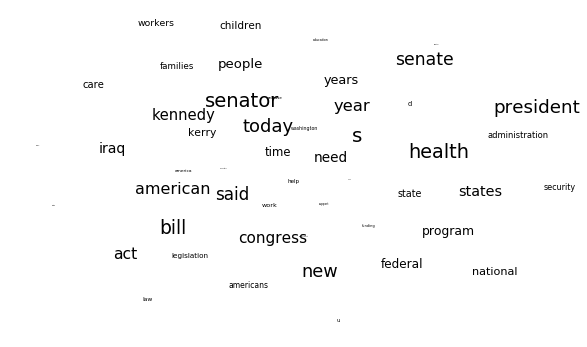

In [17]:
fig = plt.figure(figsize = (10,6))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tsneWords[:, 0], tsneWords[:, 1], alpha = 0)#Making the points invisible 
for i, word in enumerate(targetWords):
    ax.annotate(word, (tsneWords[:, 0][i],tsneWords[:, 1][i]), size =  20 * (numWords - i) / numWords)
plt.xticks(())
plt.yticks(())
plt.show()

My visualization above puts ``said`` next to ``congress`` and ``bill`` near ``act``. ``health`` is beside ``care`` and ``national`` abuts ``security``.

# Chinese examples

In [19]:
model=gensim.models.Word2Vec.load('../data/1992embeddings_hs_new3.sg')

## analogy

King+man-Queen? A few examples based on a corpus of Chinese news. 

First, location analogy: **province -> capital**

In [20]:
mm = model.most_similar(positive=[u'长沙',u'陕西'], negative=[u'湖南']) # Changsha + Shaanxi - Hunan
for m in mm:
    print(m[0],m[1])
    print("Xi'an")
    break

西安 0.36609965562820435
Xi'an


In [21]:
mm = model.most_similar(positive=[u'广州',u'湖北'], negative=[u'广东']) # Guangzhou + Hubei - Guangdong
for m in mm:
    print(m[0],m[1])
    print("Wuhan")
    break

武汉 0.3677000403404236
Wuhan


Second, location analogy: **country -> capital**

In [22]:
mm = model.most_similar(positive=[u'东京',u'美国'], negative=[u'日本']) # Tokyo + US - Japan
for m in mm:
    print(m[0],m[1])
    print("(Washington DC)")
    break

华盛顿 0.508813738822937
(Washington DC)


## similar words

In [23]:
word = u'社会主义'  #socialism
ss = model.similar_by_word(word,topn=10)
print("the most similar words to " + word + " is: ")
for s in ss:
    print(s[0])
print("")

the most similar words to 社会主义 is: 
特色
市场经济
理论
建设
改革开放
马克思主义
党
经济体制
基本路线
现代化



In [24]:
word = u'玉米'  # corn
ss = model.similar_by_word(word,topn=10)
print("the most similar words to " + word + " is: ")
for s in ss:
    print(s[0])
print("")

the most similar words to 玉米 is: 
小麦
水稻
作物
棉花
新品种
杂交
大豆
增产
栽培
农作物



## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that embed documents related to your final project using at least two different specification of `word2vec`, and visualize them each with two separate visualization layout specifications (e.g., TSNE, PCA). Then interrogate critical word vectors within your corpus in terms of the most similar words, analogies, and other additions and subtractions that reveal the structure of similarity and difference within your semantic space. What does this pattern reveal about the semantic organization of words in your corpora? Which estimation and visualization specification generate the most insight and appear the most robustly supported and why? 

<span style="color:red">***Stretch***: Explore different vector calculations beyond addition and subtraction, such as multiplication, division or some other function. What does this exploration reveal about the semantic structure of your corpus?

### Prepare the texts   
Note: Though I prepare the texts here, I finally update the dataframe from exercise4, which cover a larger set and longer time period.

Here are some patters in the plot:  
- Apparently "government", "country", "state" are close to each other. 
- Around "inequality", there are some keywords as "policy", "political","economy", "economic", which are close to "world", "country"  
- Around "woman", there are "child", "people", "government" etc.

In [1]:
import lucem_illud
import zipfile
import pandas as pd
import os

In [7]:
corpora_address = "/Users/panrui/Desktop/MACSS/Content Analysis/Homework-Notes/data/now_temp"

In [8]:
now_texts = lucem_illud.loadDavies(corpora_address, num_files=2000)

text-19-09.zip
text-19-08.zip


In [27]:
def get_source(file_name):
    zfile = zipfile.ZipFile(corpora_address + file_name)
    source = []
    for file in zfile.namelist():
        with zfile.open(file) as f:
            for line in f:
                source.append(line)
    return source

In [28]:
def get_dict(source):
    '''
    - Only get the items with the keywords inequality
    - turn the texts to dictionary
    '''
    now_txt_dict = {}
    now_dict = {}
    for news in source:
        news_str = news.decode("utf-8")
        if "inequality" in news_str:
            try:
                textID_title = news_str.split("<p>")[0].strip("@@")
                l_texts = news_str.split("<p>")[1:]
                if "<h>" in textID_title:
                    textID = textID_title.split("<h>")[0]
                    title = textID_title.split("<h>")[-1]
                else:
                    textID = textID_title
                now_txt_dict[textID.strip()] = " ".join(l_texts)
            except UnicodeDecodeError:
                continue
            if textID.strip() not in now_dict:
                now_dict[textID.strip()] = []
            if textID.strip() in now_dict:
                try:
                    now_dict[textID.strip()].append(now_texts[textID.strip()])
                except KeyError:
                    continue
    return now_txt_dict, now_dict

In [49]:
l_df
for zip_name in os.listdir(corpora_address):
    if zip_name != ".DS_Store":
        if "text" in zip_name:
            source = get_source("/" + zip_name)
            nowtxtDict = get_dict(source)[0]
            nowDF = pd.DataFrame(nowtxtDict.items(),\
                                columns = ['textID','texts'])
            l_df.append(nowDF)

In [50]:
nowDF = l_df[0]
for df in l_df[1:]:
    nowDF = nowDF.append(df)
nowDF

,textID,texts
0,71173380,"In his recent Interpreter post , Richard Moor..."
1,71173743,A man from the small Western Pennsylvania tow...
2,71174416,As a leader of the Black Lives Matter movemen...
3,71174431,The Hollywood Reporter revealed today that ea...
4,71177485,HomeNewsEight experts on the risks and benefi...
...,...,...
907,61188462,RW Johnson 10 June 2019 RW Johnson on ten...
908,61188469,SAFTU 26 August 2019 Federation says such...
909,61189504,Note : Search is limited to the most recent 2...
910,61189506,Note : Search is limited to the most recent 2...


### Get the source   
This time, I add the source of the news texts from the sources.zip

In [15]:
import zipfile
import pandas as pd

In [13]:
source = []
for zip_name in os.listdir(corpora_address):
    if zip_name != ".DS_Store":
        if 'sources' in zip_name:
            print(zip_name)
            zfile = zipfile.ZipFile(corpora_address + "/" + zip_name)
            for file in zfile.namelist():
                with zfile.open(file) as f:
                    for line in f:
                        source.append(line)

sources-19-08.zip
sources-19-09.zip


In [14]:
source[0:20]

[b'80838264\t230\t19-09-01\tUS\tCelebrityNetWorth\thttps://www.celebritynetworth.com/richest-athletes/richest-soccer/gary-neville-net-worth/\tGary Neville Net Worth\r\n',
 b"80838266\t2442\t19-09-01\tUS\tSalon\thttps://www.salon.com/2019/09/01/the-creamy-gorgonzola-pasta-my-moms-been-making-since-the-50s_partner/\tThe creamy gorgonzola pasta my mom's been making since the '50s\r\n",
 b'80838270\t141\t19-09-01\tUS\tWTTV\thttps://cbs4indy.com/2019/09/01/27-arrested-for-underage-drinking-on-tippecanoe-river/\t27 arrested for underage drinking on Tippecanoe River\r\n',
 b'80838309\t626\t19-09-01\tUS\tGillette News Record\thttps://www.gillettenewsrecord.com/news/local/article_a7fb575a-b3d5-5e38-8a4b-fb25c56c12e1.html\tGolden opportunities\r\n',
 b"80838311\t541\t19-09-01\tUS\tCNBC\thttps://www.cnbc.com/2019/09/01/catastrophic-hurricane-dorian-turns-into-category-5-nhc-says.html\t'Catastrophic' Hurricane Dorian turns into category 5, NHC says\r\n",
 b'80838313\t273\t19-09-01\tUS\tIndianapoli

In [24]:
news_list = []
for news in source:
    row_dict = {}
    try:
        textID, length, date, country, publisher, url, snippet = news.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    row_dict['textID'] = textID
    row_dict['length'] = length
    row_dict['date'] = date
    row_dict['country'] = country
    row_dict['publisher'] = publisher
    row_dict['url'] = url
    row_dict['snippet'] = snippet
    news_list.append(row_dict)

In [42]:
source_df = pd.DataFrame(news_list)

In [44]:
source_df.head()

,textID,length,date,country,publisher,url,snippet
0,80838264,230,19-09-01,US,CelebrityNetWorth,https://www.celebritynetworth.com/richest-athl...,Gary Neville Net Worth\r\n
1,80838266,2442,19-09-01,US,Salon,https://www.salon.com/2019/09/01/the-creamy-go...,The creamy gorgonzola pasta my mom's been maki...
2,80838270,141,19-09-01,US,WTTV,https://cbs4indy.com/2019/09/01/27-arrested-fo...,27 arrested for underage drinking on Tippecano...
3,80838309,626,19-09-01,US,Gillette News Record,https://www.gillettenewsrecord.com/news/local/...,Golden opportunities\r\n
4,80838311,541,19-09-01,US,CNBC,https://www.cnbc.com/2019/09/01/catastrophic-h...,'Catastrophic' Hurricane Dorian turns into cat...


In [51]:
nowDF = nowDF.merge(source_df, how = "left", on="textID")
nowDF.head()

,textID,texts,length,date,country,publisher,url,snippet
0,71173380,"In his recent Interpreter post , Richard Moor...",865,19-09-01,AU,lowyinstitute.org,http://www.lowyinstitute.org/the-interpreter/a...,The Asian Development Bank's unfinished busine...
1,71173743,A man from the small Western Pennsylvania tow...,1025,19-09-01,AU,businessinsider.com.au,https://www.businessinsider.com.au/the-world-i...,The world is facing an inequality crisis | Bus...
2,71174416,As a leader of the Black Lives Matter movemen...,1014,19-09-01,AU,sbs.com.au,https://www.sbs.com.au/news/black-lives-matter...,Black Lives Matter leader says movement can le...
3,71174431,The Hollywood Reporter revealed today that ea...,1100,19-09-01,AU,gizmodo.com.au,https://www.gizmodo.com.au/2019/08/marvel-comi...,Marvel Comics Is Doubling Down On Its Misguide...
4,71177485,HomeNewsEight experts on the risks and benefi...,545,19-09-03,AU,themandarin.com.au,https://www.themandarin.com.au/115118-eight-ex...,Eight experts on the risks and benefits of art...


### Analyze

In [52]:
nowDF['tokenized_sents'] = nowDF['texts'].apply(lambda x: [lucem_illud.word_tokenize(s) for s in lucem_illud.sent_tokenize(x)])
nowDF['normalized_sents'] = nowDF['tokenized_sents'].apply(lambda x: [lucem_illud.normalizeTokens(s) for s in x])
nowDF[:100:10]

,textID,texts,length,date,country,publisher,url,snippet,tokenized_sents,normalized_sents
0,71173380,"In his recent Interpreter post , Richard Moor...",865,19-09-01,AU,lowyinstitute.org,http://www.lowyinstitute.org/the-interpreter/a...,The Asian Development Bank's unfinished busine...,"[[In, his, recent, Interpreter, post, Richard,...","[[recent, interpreter, post, richard, moore, p..."
10,71178301,"Last week , self-proclaimed Marxist labour ac...",897,19-09-03,AU,lowyinstitute.org,http://www.lowyinstitute.org/the-interpreter/c...,China: a party <strong>of</strong> governance ...,"[[Last, week, self, proclaimed, Marxist, labou...","[[week, self, proclaim, marxist, labour, activ..."
20,71191210,We 've become used to each new generation of ...,921,19-09-07,AU,smartcompany.com.au,https://www.smartcompany.com.au/finance/econom...,'A shameful legacy': We're setting up working-...,"[[We, ve, become, used, to, each, new, generat...","[[have, new, generation, australians, enjoy, w..."
30,71207046,William Martin is the longest-serving Federal...,1586,19-09-12,AU,livewiremarkets.com,https://www.livewiremarkets.com/wires/central-...,Central banks risk seeing their feted 'indepen...,"[[William, Martin, is, the, longest, serving, ...","[[william, martin, long, serve, federal, reser..."
40,71216892,Are you passionate about progressive change ?...,603,19-09-16,AU,pedestrian.tv,https://www.pedestrian.tv/job/digital-content-...,Digital Content Manager | Pedestrian TV\r\n,"[[Are, you, passionate, about, progressive, ch...","[[passionate, progressive, change], [want, job..."
50,71233080,HomeEngagementAll Things P : the new hub for ...,1033,19-09-22,AU,themandarin.com.au,https://www.themandarin.com.au/65050-welcome-t...,"All Things P: the new hub for engagement, comm...","[[HomeEngagementAll], [Things, P, the, new, hu...","[[homeengagementall], [thing, p, new, hub, eng..."
60,71243306,According to new data from polling company Yo...,713,19-09-25,AU,au.finance.yahoo.com,https://au.finance.yahoo.com/news/more-millenn...,9% <strong>of</strong> Americans earn six-figu...,"[[According, to, new, data, from, polling, com...","[[accord, new, datum, poll, company, yougov, e..."
70,71251514,"June 10 , 2019 -- 12.00am As revealed in Su...",739,19-09-28,AU,smh.com.au,https://www.smh.com.au/national/welcome-to-the...,Welcome to the economics <strong>of</strong> s...,"[[June, 10, 2019, 12.00am], [As, revealed, in,...","[[june, 12.00am], [reveal, sunday, night, epis..."
80,51026767,Independent Online/ BSS Prime Minister Shei...,2004,19-09-11,BD,theindependentbd.com,http://www.theindependentbd.com/post/214888,PM calls for urgent action to advance climate ...,"[[Independent, Online/], [BSS], [Prime, Minist...","[[independent, online/], [bss], [prime, minist..."
90,51007263,A woman celebrates during the Day of Healing ...,1656,19-09-03,CA,theglobeandmail.com,https://www.theglobeandmail.com/world/us-polit...,On 400th anniversary <strong>of</strong> slave...,"[[A, woman, celebrates, during, the, Day, of, ...","[[woman, celebrate, day, heal, nationwide, bel..."


In [547]:
# Update to use the longSampleDF in exercise 4
nowDF = longSampleDF

In [548]:
nowW2V = gensim.models.word2vec.Word2Vec(nowDF['normalized_sents'].sum())

INFO:gensim.models.word2vec:collecting all words and their counts
INFO:gensim.models.word2vec:PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #10000, processed 81644 words, keeping 11158 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #20000, processed 167785 words, keeping 16457 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #30000, processed 253242 words, keeping 20162 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #40000, processed 339325 words, keeping 23141 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #50000, processed 421766 words, keeping 25612 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #60000, processed 505885 words, keeping 27885 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #70000, processed 593489 words, keeping 30017 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #80000, processed 676634 words, keeping 32

INFO:gensim.models.word2vec:PROGRESS: at sentence #750000, processed 6263401 words, keeping 70551 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #760000, processed 6349045 words, keeping 70652 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #770000, processed 6434302 words, keeping 70723 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #780000, processed 6519860 words, keeping 70851 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #790000, processed 6604226 words, keeping 71004 word types
INFO:gensim.models.word2vec:collected 71129 word types from a corpus of 6673505 raw words and 797889 sentences
INFO:gensim.models.word2vec:Loading a fresh vocabulary
INFO:gensim.models.word2vec:effective_min_count=5 retains 35645 unique words (50% of original 71129, drops 35484)
INFO:gensim.models.word2vec:effective_min_count=5 leaves 6590650 word corpus (98% of original 6673505, drops 82855)
INFO:gensim.models.word2vec:deleting the raw counts diction

In [549]:
nowW2V['woman'][:2] #Shortening because it's very large

array([0.7223158 , 0.20157863], dtype=float32)

Then, `index2word` lets you translate from the matrix to words:

In [550]:
nowW2V.wv.index2word[1:20]

['people',
 'year',
 'new',
 'woman',
 'country',
 'world',
 'government',
 'state',
 'work',
 'time',
 'inequality',
 'economic',
 'need',
 'like',
 'right',
 'social',
 'come',
 'high',
 'president']

In [551]:
nowW2V.most_similar('platform')

INFO:gensim.models.keyedvectors:precomputing L2-norms of word weight vectors


[('network', 0.6349923610687256),
 ('tool', 0.5718200206756592),
 ('digital', 0.5235555171966553),
 ('innovative', 0.5126924514770508),
 ('online', 0.5044231414794922),
 ('alternative', 0.49050337076187134),
 ('brand', 0.4870089888572693),
 ('leverage', 0.4862707257270813),
 ('irrevocable', 0.48323023319244385),
 ('schoology', 0.4824450612068176)]

Find which word least matches the others within a word set (cosine similarity):

In [575]:
nowW2V.most_similar(positive=['man', 'woman'], negative=['employment'])


[('girl', 0.5389305353164673),
 ('demean', 0.5114647150039673),
 ('sexually', 0.5104352831840515),
 ('person', 0.5031625032424927),
 ('suffragette', 0.502472460269928),
 ('humble', 0.4970085918903351),
 ('boy', 0.4909522235393524),
 ('physically', 0.4878011643886566),
 ('macho', 0.4853614568710327),
 ('slut', 0.47312697768211365)]

In [552]:
nowW2V.doesnt_match(['woman','gender','poverty','career','digital'])


'digital'

Plot

In [576]:
numWords = 70
targetWords = nowW2V.wv.index2word[:numWords]
# Matrix
wordsSubMatrix = []
for word in targetWords:
    wordsSubMatrix.append(nowW2V[word])
wordsSubMatrix = np.array(wordsSubMatrix)

# PCA to reduce the dimensions
pcaWords = sklearn.decomposition.PCA(n_components = 50).fit(wordsSubMatrix)
reducedPCA_data = pcaWords.transform(wordsSubMatrix)
#T-SNE is theoretically better, but you should experiment
tsneWords = sklearn.manifold.TSNE(n_components = 2).fit_transform(reducedPCA_data)


INFO:matplotlib.font_manager:Fontsize 0.86 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
INFO:matplotlib.font_manager:Fontsize 0.57 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
INFO:matplotlib.font_manager:Fontsize 0.29 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=19.714285714285715.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STI

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd-Italic.otf) italic normal 900 normal>) = 11.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam Sangam MN' (Malayalam Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Seravek' (Seravek.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Avestan' (NotoSansAvestan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansIns

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kailasa' (Kailasa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni Ornaments' (Bodoni Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMonoItalic.ttf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Small

DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Sans' (PTSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif' (PTSerif.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Linear B' (NotoSansLinearB-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Geeza Pro' (GeezaPro.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-LightIt.otf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PingFang HK' (PingFang.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mongolian' (NotoSansMongolian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Armenian' (NotoSansArmenian.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSansCarian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Superclarendon' (

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Persian' (NotoSansOldPersian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Webdings' (Webdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Normal.otf) normal normal 350 normal>) = 10.0975
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Giddyup Std' (GiddyupStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 35 Thin.ttf) normal nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Stencil Std' (StencilStd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU-ExtB' (MingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Beirut' (Beirut.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Hanunoo' (NotoSansHanunoo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Mincho ProN' (ヒラギノ明朝 ProN.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-BoldItalic.otf) italic normal 700 norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Krungthep' (Krungthep.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended.ttf) normal normal 800 expanded>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sukhumvit Set' (SukhumvitSet.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 46 Light Italic.ttf) italic normal 3 normal>) = 11.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ol Chiki' (NotoSansOlChiki-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W3.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trattatello' (Trattatello.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Gothic' (MS Gothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Aqua Kana' (AquaKana.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SIMSUN.TTC) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (OCRAStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Gujarati' (KohinoorGujarati.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar MN' (Myanmar MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Limbu' (NotoSansLimbu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-ExtraLight.otf) normal normal 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1___-2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Luminari' (Luminari.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Big Caslon' (BigCaslon.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Semibold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Condensed' (DIN Condensed Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STLiti' (STLITI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu MN' (Telugu MN.ttc) normal norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Balinese' (NotoSerifBalinese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Display' (ArabicUIDisplay.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (ADOBESONGSTD-LIGHT.OTF) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Medium.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Black.o

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCondIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.f

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Osmanya' (NotoSansOsmanya-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Optima' (Optima.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sathu' (Sathu.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari MT' (DevanagariMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_mana

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tifinagh' (NotoSansTifinagh-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Bold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (AdobeSongStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi Sangam MN' (Gurmukhi Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonP

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lycian' (NotoSansLycian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagalog' (NotoSansTagalog-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Gothic' (NotoSansG

DEBUG:matplotlib.font_manager:findfont: score(<Font '.Helvetica Neue DeskInterface' (HelveticaNeueDeskInterface.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script Std' (BrushScriptStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYorkItalic.ttf) italic normal 425 normal>) = 11.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farah' (Farah.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Ko

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4___.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mesquite Std' (MesquiteStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Helvetica LT 75 Bold Outline.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Disp

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao Sangam MN' (Lao Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ming Std' (AdobeMingStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimHei' (SimHei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.o

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Regular.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala MN' (Sinhala MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ogham' (NotoSansOgham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) it

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bookshelf Symbol 7' (Bookshelf Symbol 7.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Yi' (NotoSansYi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sana' (Sana.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Impact' (Impact.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala Sangam MN' (Sinhala Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W7.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ugaritic' (NotoSansUgaritic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended.ttf) normal normal 300 expanded>) = 10.344

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kefa' (Kefa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STZhongsong' (STZHONGS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helveti

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique normal 300 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Snell Roundhand' (SnellRoundhand.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Viet' (NotoSansTaiViet-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Bayan' (AlBayan.ttc) norma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Rounded' (SFNSRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Black.otf) normal normal 900 condensed>) = 10.725
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sa

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada Sangam MN' (Kannada Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 85 Heavy.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Bold.otf) normal normal 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ITF Devanagari' (ITFDevanagari.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Savoye LET' (Savoye LET.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:fi

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Athelas' (Athelas.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS-ExtB' (MingLiU_HKSCS-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Sans Unicode' (Lucida Sans Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Andale Mono' (Andale Mono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Futura' (Futura.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya MN' (Oriya MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Italic.otf) italic normal 400 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam MN' (Malayalam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Grande' (LucidaGrande.ttc) normal normal 500 normal>) = 2.872272727272727
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Medium.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Herculanum' (Herculanum.ttf) normal normal 

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans' (GillSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next' (Avenir Next.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCn.otf

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font '

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapf Dingbats' (ZapfDingbats.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapfino' (Zapfino.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kharoshthi' (NotoSansKharoshthi-Regular.ttf) normal normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmb10' (cmb10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Thuluth' (Diwan Thuluth.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Ultralig

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Console' (Lucida Console.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Nile' (Al Nile.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_man

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Thonburi' (Thonburi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Light.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi Gold' (Mishafi Gold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Myun

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEHEITISTD-REGULAR.OTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari Sangam MN' (Devanagari Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Italic.ttf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syloti Nagri' (NotoSansSylotiNagri-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'H

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Waseem' (Waseem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Ayuthaya' (Ayuthaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manag

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Tham' (Noto

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Phosphate' (Phosphate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMono.ttf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'FangSong' (Fangsong.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Euphemia UCAS' (EuphemiaCAS.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lisu' (NotoSansLisu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05


DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 45 Light.ttf) normal normal 3 normal>) = 10.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (PlantagenetCherokee.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 65 Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kaithi' (NotoSansKaithi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldObl.otf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Medium.otf) normal normal 500 normal>) = 10.145


DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansInscriptionalParthian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fangsong Std' (AdobeFangsongStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (AdobeHeitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Smallcaps Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold.t

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Mincho' (MS Mincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3___.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'American Typewriter' (AmericanTypewriter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Light.otf) normal normal 300 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla MN' (Bangla MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Keyboard' (Keyboard.ttf) normal normal 100 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Telugu' (KohinoorTelugu.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Symbol' (Symbol.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Batak' (NotoSansBatak-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.otf) normal norma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSansCarian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Superclarendon' (SuperClarendon.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer Sangam MN' (Khmer Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold Italic.ttf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PGothic' (MS PGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Symbols' (Apple Symbols.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Bold.otf) normal normal 700 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 35 Thin.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi' (Mishafi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla Sangam MN' (Bangla Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'New Peninim MT' (NewPeninimMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cypriot' (NotoSansCypriot-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Pahlavi' (NotoSansInscriptiona

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kokonor' (Kokonor.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SimSun.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada MN' (Kannada MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manage

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 26 Ultra Light Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Damascus' (Damascus.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kannada' (NotoSansKannada.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao MN' (Lao MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Turkic' (NotoSansOldTurkic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baskerville' (Baskerville.ttc) 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 96 Black Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Vai' (NotoSansVai-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farisi' (Farisi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kayah Li' (NotoSansKayahLi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil MN' (Tamil MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 Md

DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (OCRAStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KaiTi' (Kaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun-ExtB' (SimSun-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU' (MingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Menlo' (Menlo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Skia' (Skia.ttf) normal normal 5 normal>) = 10.42525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Phoenician' (NotoSansPhoenician-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Conde

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Papyrus' (Papyrus.ttc) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KufiStandardGK' (KufiStandardGK.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marker Felt' (MarkerFelt.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:find

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu MN' (Telugu MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SignPainter' (SignPainter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Black.otf) normal normal 850 normal>) = 10.4775
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buginese' (NotoSansBuginese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (TaiLeb.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Kaiti Std' (AdobeKaitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Copperplate' (Copperplate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans New Tai Lue' (NotoSansNewTaiLue-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W2.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W1.ttc) normal normal 200 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Samaritan' (NotoSansSamaritan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Oldstyle' (Bodoni 72 OS.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Silom' (Silom.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Specialty' (MS Reference Specialty.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Bold

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lydian' (NotoSansLydian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVar.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Raanana' (Raanana.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charlemagne Std' (CharlemagneStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Gothic' (NotoSansGothic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans NKo' (NotoSansNKo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 63 Medium Extended Oblique.ttf) oblique normal 500 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozu

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Chakma' (NotoSansChakma-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charter' (Charter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:find

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manag

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Blackoak Std' (BlackoakStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended Oblique.ttf) oblique normal 800 expanded>) = 11.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica' (Helvetica.ttc) normal normal 400 normal>) = 7.322727272727273
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syriac' (NotoSansSyriac-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Text' (ArabicUIText.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Bangla' (KohinoorBangla.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Rounded' (SFCompactRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Shavian' (NotoSansShavian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-SemiboldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 Black

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple SD Gothic Neo' (AppleSDGothicNeo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala Sangam MN' (Sinhala Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Muna' (Muna.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Sundanese' (NotoSansSundanese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 36 Thin Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans PhagsPa' (NotoSansPhagsPa-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Tarikh' (Al Tarikh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text Ornaments.ttf) nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended.ttf) normal normal 300 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STHupo' (STHUPO.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Poplar Std' (PoplarStd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica Neue' (HelveticaNeue.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Devanagari' (Kohinoor.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marlett' (Marlett.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Italic.otf) italic normal 400 nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 86 Heavy Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif Caption' (PTSerifCaption.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Shree Devanagari 714' (Shree714.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Runic' (NotoSansRunic-Regular.ttf) no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Prestige Elite Std' (PrestigeEliteStd-Bd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=17.428571428571427 to DejaVu Sans ('/Applications/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000.
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=17.142857142857142.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Bayan' (AlBayan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd-Italic.otf) italic normal 900 normal>) = 11.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam Sangam MN' (Malayalam Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Seravek' (Seravek.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Avestan' (NotoSansAvestan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Le' (NotoSansTaiLe-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kailasa' (Kailasa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni Ornaments' (Bodoni Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMonoItalic.ttf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkbo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Sans' (PTSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif' (PTSerif.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Linear B' (NotoSansLinearB-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Geeza Pro' (GeezaPro.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-LightIt.otf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PingFang HK' (PingFang.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mongolian' (NotoSansMongolian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Armenian' (NotoSansArmenian.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSans

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Naskh' (AdobeNaskh-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Persian' (NotoSansOldPersian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Webdings' (Webdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Normal.otf) normal normal 350 normal>) = 10.0975
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Giddyup Std' (GiddyupStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Brahmi' (NotoSansBrahmi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Stencil Std' (StencilStd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU-ExtB' (MingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Beirut' (Beirut.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Hanunoo' (NotoSansHanunoo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Mincho ProN' (ヒラギノ明朝 ProN.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkduster' (Chalkduster.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Krungthep' (Krungthep.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended.ttf) normal normal 800 expanded>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sukhumvit Set' (SukhumvitSet.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Go

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir' (Avenir.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 46 Light Italic.ttf) italic normal 3 normal>) = 11.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ol Chiki' (NotoSansOlChiki-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W3.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trattatello' (Trattatello.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Gothic' (MS Gothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Aqua Kana' (AquaKana.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SIMSUN.TTC) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (O

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Gujarati' (KohinoorGujarati.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar MN' (Myanmar MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Limbu' (NotoSansLimbu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagbanwa' (NotoSansTagbanwa-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1___-2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Luminari' (Luminari.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Big Caslon' (BigCaslon.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Semibold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Condensed' (DIN Condensed Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STLiti' (STLITI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-BoldSlanted.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Balinese' (NotoSerifBalinese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Display' (ArabicUIDisplay.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (ADOBESONGSTD-LIGHT.OTF) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Medium.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DecoType Naskh' (DecoTypeNaskh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCondIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W0.ttc) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Osmanya' (NotoSansOsmanya-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Optima' (Optima.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sathu' (Sathu.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari MT' (DevanagariMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manage

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Tham' (NotoSansTaiTham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tifinagh' (NotoSansTifinagh-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Bold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (AdobeSongStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi Sangam MN' (Gurmukhi Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegrals

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lycian' (NotoSansLycian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Fon

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagalog' (NotoSansTagalog-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.41363

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCnIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Helvetica Neue DeskInterface' (HelveticaNeueDeskInterface.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script Std' (BrushScriptStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 n

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Medium.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Rounded MT Bold' (Arial Rounded Bold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4___.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mesquite Std' (MesquiteStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Hel

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MT' (Gurmukhi.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao Sangam MN' (Lao Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic no

DEBUG:matplotlib.font_manager:findfont: score(<Font '.Keyboard' (Keyboard.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 4

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W9.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buhid' (NotoSansBuhid-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ogham' (NotoSansOgham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier N

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Pahlavi' (NotoSansInscriptionalPahlavi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-CondItalic.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Iowan Old Style' (Iowan Old Style.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada MN' (Kannada MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Yi' (NotoSansYi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Turkic' (NotoSansOldTurkic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baskerville' (Baskerville.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu Sangam MN' (Telugu Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W7.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ugaritic' (NotoSansUgaritic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBU

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kefa' (Kefa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STZhongsong' (STZHONGS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: scor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork.ttf) normal normal 425 normal>) = 10.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Coptic' (NotoSansCoptic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Mono' (PTMono.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Specialty' (MS Reference Specialty.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam MN' (Malayalam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1b__.ttf) normal normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Itali

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplot

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEH

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<F

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W5.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Tarikh' (Al Tarikh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Phosphate' (Phosphate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMono.ttf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matpl

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 86 Heavy Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif Caption' (PTSerifCaption.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Shree Devanagari 714' (Shree714.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Runic' (NotoSansRunic-Regular.ttf) no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Prestige Elite Std' (PrestigeEliteStd-Bd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.428571428571429 to DejaVu Sans ('/Applications/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000.
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=15.142857142857142.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Bayan' (AlBayan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd-Italic.otf) italic normal 900 normal>) = 11.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam Sangam MN' (Malayalam Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Seravek' (Seravek.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Avestan' (NotoSansAvestan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Le' (NotoSansTaiLe-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kailasa' (Kailasa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni Ornaments' (Bodoni Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMonoItalic.ttf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkbo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Sans' (PTSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif' (PTSerif.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Linear B' (NotoSansLinearB-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Geeza Pro' (GeezaPro.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-LightIt.otf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PingFang HK' (PingFang.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mongolian' (NotoSansMongolian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Armenian' (NotoSansArmenian.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSans

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Naskh' (AdobeNaskh-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Persian' (NotoSansOldPersian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Webdings' (Webdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Normal.otf) normal normal 350 normal>) = 10.0975
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Giddyup Std' (GiddyupStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Brahmi' (NotoSansBrahmi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Stencil Std' (StencilStd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU-ExtB' (MingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Beirut' (Beirut.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Hanunoo' (NotoSansHanunoo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Mincho ProN' (ヒラギノ明朝 ProN.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkduster' (Chalkduster.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Krungthep' (Krungthep.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended.ttf) normal normal 800 expanded>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sukhumvit Set' (SukhumvitSet.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Go

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir' (Avenir.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 46 Light Italic.ttf) italic normal 3 normal>) = 11.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ol Chiki' (NotoSansOlChiki-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W3.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trattatello' (Trattatello.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Gothic' (MS Gothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Aqua Kana' (AquaKana.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SIMSUN.TTC) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (O

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Gujarati' (KohinoorGujarati.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar MN' (Myanmar MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Limbu' (NotoSansLimbu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagbanwa' (NotoSansTagbanwa-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1___-2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Luminari' (Luminari.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Big Caslon' (BigCaslon.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Semibold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Condensed' (DIN Condensed Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STLiti' (STLITI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-BoldSlanted.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Balinese' (NotoSerifBalinese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Display' (ArabicUIDisplay.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (ADOBESONGSTD-LIGHT.OTF) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Medium.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DecoType Naskh' (DecoTypeNaskh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCondIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W0.ttc) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Osmanya' (NotoSansOsmanya-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Optima' (Optima.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sathu' (Sathu.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari MT' (DevanagariMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manage

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Tham' (NotoSansTaiTham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tifinagh' (NotoSansTifinagh-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Bold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (AdobeSongStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi Sangam MN' (Gurmukhi Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegrals

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lycian' (NotoSansLycian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Fon

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagalog' (NotoSansTagalog-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.41363

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCnIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Helvetica Neue DeskInterface' (HelveticaNeueDeskInterface.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script Std' (BrushScriptStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 n

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Medium.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Rounded MT Bold' (Arial Rounded Bold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4___.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mesquite Std' (MesquiteStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Hel

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MT' (Gurmukhi.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao Sangam MN' (Lao Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic no

DEBUG:matplotlib.font_manager:findfont: score(<Font '.Keyboard' (Keyboard.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 4

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W9.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buhid' (NotoSansBuhid-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ogham' (NotoSansOgham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier N

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Pahlavi' (NotoSansInscriptionalPahlavi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-CondItalic.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Iowan Old Style' (Iowan Old Style.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada MN' (Kannada MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Yi' (NotoSansYi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Turkic' (NotoSansOldTurkic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baskerville' (Baskerville.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu Sangam MN' (Telugu Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W7.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ugaritic' (NotoSansUgaritic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBU

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kefa' (Kefa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STZhongsong' (STZHONGS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: scor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork.ttf) normal normal 425 normal>) = 10.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Coptic' (NotoSansCoptic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Mono' (PTMono.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Specialty' (MS Reference Specialty.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam MN' (Malayalam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1b__.ttf) normal normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Itali

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplot

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEH

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<F

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W5.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun-ExtB' (SimSun-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Skia' (Skia.ttf) normal normal 5 normal>) = 10.42525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Phoenician' (NotoSansPhoenician-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork.ttf) normal normal 425 normal>) = 10.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: s

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marker Felt' (MarkerFelt.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Coptic' (NotoSansCoptic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Mono' (PTMono.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans New Tai Lue' (NotoSansNewTaiLue-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ar

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W1.ttc) normal normal 200 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPr

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Specialty' (MS Reference Specialty.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam M

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charlemagne Std' (CharlemagneStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) obliq

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Itali

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplot

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEH

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<F

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W5.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Tarikh' (Al Tarikh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Phosphate' (Phosphate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMono.ttf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Devanagari' (Kohinoor.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marlett' (Marlett.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 45 Light.ttf) normal normal 3 normal>) = 10.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (Plantagene

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Runic' (NotoSansRunic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Kufi' (Diwan Kufi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kaithi' (NotoSansKaithi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) =

DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.571428571428571.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal norma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam Sangam MN' (Malayalam Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Seravek' (Seravek.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Avestan' (NotoSansAvestan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansInscriptionalParthian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMonoItalic.ttf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Smallcaps Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Linear B' (NotoSansLinearB-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Mincho' (MS Mincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3___.ttf) normal normal 400 normal>) = 10.05
DEBUG

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-LightIt.otf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PingFang HK' (PingFang.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Telugu' (KohinoorTelugu.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Armenian' (NotoSansArmenian.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSansCarian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Superclarendon' (SuperClarendon.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer Sangam MN' (Khmer Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Webdings' (Webdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Normal.otf) normal normal 350 normal>) = 10.0975
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Giddyup Std' (GiddyupStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 35 Thin.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi' (Mishafi.ttf) normal normal 400 normal>) = 10.05
DE

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Beirut' (Beirut.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Hanunoo' (NotoSansHanunoo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Mincho ProN' (ヒラギノ明朝 ProN.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kokonor' (Kokonor.ttf) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Krungthep' (Krungthep.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended.ttf) normal normal 800 expanded>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sukhumvit Set' (SukhumvitSet.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 26 Ultra Light Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Damascus' (Damascus.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W3.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trattatello' (Trattatello.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 96 Black Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Vai' (NotoSansVai-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farisi' (Farisi.ttf) normal normal 400

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Aqua Kana' (AquaKana.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SIMSUN.TTC) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (OCRAStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KaiTi' (Kaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai'

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Gujarati' (KohinoorGujarati.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar MN' (Myanmar MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Limbu' (NotoSansLimbu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU' (MingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Menlo' (Menlo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Luminari' (Luminari.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Big Caslon' (BigCaslon.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Semibold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Papyrus' (Papyrus.ttc) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KufiStandardGK' (KufiStandardGK.ttc) normal normal 400 normal>) = 10.05
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Condensed' (DIN Condensed Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STLiti' (STLITI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu MN' (Telugu MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SignPainter' (SignPainter.ttc) normal normal 400 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (ADOBESONGSTD-LIGHT.OTF) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Medium.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Black.otf) normal normal 850 normal>) = 10.4775
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buginese' (NotoSansBuginese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (TaiLeb.ttf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Kaiti Std' (AdobeKaitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Copperplate' (Copperplate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fon

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Optima' (Optima.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sathu' (Sathu.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari MT' (DevanagariMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Bold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (AdobeSongStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi Sangam MN' (Gurmukhi Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Samaritan' (NotoSansSamaritan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Old

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lydian' (NotoSansLydian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVar.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Raanana' (Raan

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagalog' (NotoSansTagalog-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Gothic' (NotoSansGothic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans NKo' (NotoSansNKo-Regul

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYorkItalic.ttf) italic normal 425 normal>) = 11.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farah' (Farah.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Chakma' (NotoSansChakma-Regular.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 40

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Helvetica LT 75 Bold Outline.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Blackoak Std' (BlackoakStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ming Std' (AdobeMingStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica' (Helvetica.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimHei' (SimHei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Text' (ArabicUIText.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Regular.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala MN' (Sinhala MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Rounded' (SFCompactRounded.ttf) normal normal 400 normal>) = 10.05


DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Shavian' (NotoSansShavian-Regular.ttf) normal normal 40

DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bookshelf Symbol 7' (Bookshelf Symbol 7.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple SD Gothic Neo' (AppleSDGothicNeo.ttc) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Yi' (NotoSansYi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sana' (Sana.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Impact' (Impact.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala Sangam MN' (Sinhala Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Muna' (Muna.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Sundanese' (NotoSansSundanese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended.ttf) normal normal 300 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STHupo' (STHUPO.TTF) normal normal 400 normal>) = 10.05
DEBUG:matp

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 86 Heavy Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif Caption' (PTSerifCaption.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:f

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique normal 300 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Snell Roundhand' (SnellRoundhand.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Viet' (NotoSansTaiViet-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Prestige Elite Std' (PrestigeEliteStd-Bd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=11.7142857

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Bayan' (AlBayan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd-Italic.otf) italic normal 900 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Rounded' (SFNSRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Black.otf) normal normal 900 condensed>) = 10.725
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Le' (NotoSansTaiLe-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kailasa' (Kailasa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni Ornaments' 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada Sangam MN' (Kannada Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 85 Heavy.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Bold.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Sans' (PTSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif' (PTSerif.ttc) norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ITF Devanagari' (ITFDevanagari.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Savoye LET' (Savoye LET.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Geeza Pro' (GeezaPro.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Treb

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Athelas' (Athelas.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS-ExtB' (MingLiU_HKSCS-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Sans Unicode' (Lucida Sans Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mongolian' (NotoSansMongolian-Regular.ttf) normal normal 400 normal>) = 10.05
DE

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Andale Mono' (Andale Mono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Futura' (Futura.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya MN' (Oriya MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Naskh' (AdobeNaskh-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.otf) normal normal 400 normal>) = 10.05
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam MN' (Malayalam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Grande' (LucidaGrande.ttc) normal normal 500 normal>) = 2.872272727272727
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Medium.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Herculanum' (Herculanum.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Brahmi' (NotoSansBrahmi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Stencil Std' (StencilStd.otf) normal normal 700 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans' (GillSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next' (Avenir Next.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCn.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkduster' (Chalkduster.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.otf) italic normal 700 normal>

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cham' (NotoSansCham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir' (Avenir.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 46 Light Italic.ttf) italic normal 3 normal>) = 11.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto S

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapf Dingbats' (ZapfDingbats.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapfino' (Zapfino.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kharoshthi' (NotoSansKharoshthi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Gothic' (MS Gothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmb10' (cmb10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Thuluth' (Diwan Thuluth.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Ultralight.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagbanwa' (NotoSansTagbanwa-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1___-2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas.ttf) normal nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Console' (Lucida Console.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Nile' (Al Nile.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Thonburi' (Thonburi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Light.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi Gold' (Mishafi Gold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Myungjo Std' (AdobeMyungjoStd-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-BoldSlanted.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Balinese' (NotoSerifBalinese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Display' (ArabicUIDisplay.ttc) n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEHEITISTD-REGULAR.OTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari Sangam MN' (Devanagari Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Italic.ttf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syloti Nagri' (NotoSansSylotiNagri-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 63 Medium Extended.ttf) normal normal 500 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DecoType Naskh' (DecoTypeNaskh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Waseem' (Waseem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Ayuthaya' (Ayuthaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W0.ttc) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Tham' (NotoSansTaiTham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tifinagh' (NotoSansTifinagh-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingd

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'FangSong' (Fangsong.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Euphemia UCAS' (EuphemiaCAS.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lisu' (NotoSansLisu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lycian' (NotoSansLycian-Regular.ttf) normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (PlantagenetCherokee.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 65 Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldObl.otf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCnIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Helvetica Neue DeskInterface' (HelveticaNeueDeskInterface.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 1

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fangsong Std' (AdobeFangsongStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (AdobeHeitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Medium.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Rounded MT Bold' (Arial Rounded Bold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MT' (Gurmukhi.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBU

DEBUG:matplotlib.font_manager:findfont: score(<Font 'American Typewriter' (AmericanTypewriter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Light.otf) normal normal 300 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla MN' (Bangla MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Keyboard' (Keyboard.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Symbol' (Symbol.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Batak' (NotoSansBatak-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W9.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buhid' (NotoSansBuhid-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended Obliqu

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PGothic' (MS PGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Symbols' (Apple Symbols.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ogham' (NotoSansOgham-Regular.ttf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla Sangam MN' (Bangla Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'New Peninim MT' (NewPeninimMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cypriot' (NotoSansCypriot-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Pahlavi' (NotoSansInscriptionalPahlavi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-CondItalic.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Iowan Old Style' (Iowan Old Style.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_man

DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SimSun.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada MN' (Kannada MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao MN' (Lao MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Turkic' (NotoSansOldTurkic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baskerville' (Baskerville.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu Sangam MN' (Telugu Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W7.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ugaritic' (NotoSansUgaritic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kayah Li' (NotoSansKayahLi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil MN' (Tamil MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kefa' (Kefa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STZhongsong' (STZHONGS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Brail

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun-ExtB' (SimSun-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Skia' (Skia.ttf) normal normal 5 normal>) = 10.42525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Phoenician' (NotoSansPhoenician-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork.ttf) normal normal 425 normal>) = 10.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: s

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marker Felt' (MarkerFelt.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Coptic' (NotoSansCoptic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Mono' (PTMono.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans New Tai Lue' (NotoSansNewTaiLue-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ar

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W1.ttc) normal normal 200 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPr

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Specialty' (MS Reference Specialty.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam M

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charlemagne Std' (CharlemagneStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) obliq

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Itali

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplot

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEH

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<F

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W5.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Tarikh' (Al Tarikh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Phosphate' (Phosphate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMono.ttf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Devanagari' (Kohinoor.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marlett' (Marlett.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 45 Light.ttf) normal normal 3 normal>) = 10.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (Plantagene

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Runic' (NotoSansRunic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Kufi' (Diwan Kufi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kaithi' (NotoSansKaithi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) =

DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=9.714285714285714.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam Sangam MN' (Malayalam Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Seravek' (Seravek.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Avestan' (NotoSansAvestan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansInscriptionalParthian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMonoItalic.ttf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Smallcaps Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Linear B' (NotoSansLinearB-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Mincho' (MS Mincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3___.ttf) normal normal 400 normal>) = 10.05
DEBUG

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-LightIt.otf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PingFang HK' (PingFang.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Telugu' (KohinoorTelugu.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Armenian' (NotoSansArmenian.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSansCarian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Superclarendon' (SuperClarendon.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer Sangam MN' (Khmer Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Webdings' (Webdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Normal.otf) normal normal 350 normal>) = 10.0975
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Giddyup Std' (GiddyupStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 35 Thin.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi' (Mishafi.ttf) normal normal 400 normal>) = 10.05
DE

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Beirut' (Beirut.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Hanunoo' (NotoSansHanunoo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Mincho ProN' (ヒラギノ明朝 ProN.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kokonor' (Kokonor.ttf) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Krungthep' (Krungthep.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended.ttf) normal normal 800 expanded>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sukhumvit Set' (SukhumvitSet.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 26 Ultra Light Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Damascus' (Damascus.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W3.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trattatello' (Trattatello.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 96 Black Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Vai' (NotoSansVai-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farisi' (Farisi.ttf) normal normal 400

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Aqua Kana' (AquaKana.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SIMSUN.TTC) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (OCRAStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KaiTi' (Kaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai'

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Gujarati' (KohinoorGujarati.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar MN' (Myanmar MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Limbu' (NotoSansLimbu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU' (MingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Menlo' (Menlo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Luminari' (Luminari.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Big Caslon' (BigCaslon.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Semibold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Papyrus' (Papyrus.ttc) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KufiStandardGK' (KufiStandardGK.ttc) normal normal 400 normal>) = 10.05
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Condensed' (DIN Condensed Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STLiti' (STLITI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu MN' (Telugu MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SignPainter' (SignPainter.ttc) normal normal 400 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (ADOBESONGSTD-LIGHT.OTF) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Medium.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Black.otf) normal normal 850 normal>) = 10.4775
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buginese' (NotoSansBuginese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (TaiLeb.ttf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Kaiti Std' (AdobeKaitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Copperplate' (Copperplate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fon

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Optima' (Optima.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sathu' (Sathu.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari MT' (DevanagariMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Bold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (AdobeSongStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi Sangam MN' (Gurmukhi Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Samaritan' (NotoSansSamaritan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Old

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lydian' (NotoSansLydian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVar.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Raanana' (Raan

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagalog' (NotoSansTagalog-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Gothic' (NotoSansGothic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans NKo' (NotoSansNKo-Regul

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYorkItalic.ttf) italic normal 425 normal>) = 11.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farah' (Farah.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Chakma' (NotoSansChakma-Regular.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 40

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Helvetica LT 75 Bold Outline.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Blackoak Std' (BlackoakStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ming Std' (AdobeMingStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica' (Helvetica.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimHei' (SimHei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Text' (ArabicUIText.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Regular.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala MN' (Sinhala MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Rounded' (SFCompactRounded.ttf) normal normal 400 normal>) = 10.05


DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Shavian' (NotoSansShavian-Regular.ttf) normal normal 40

DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bookshelf Symbol 7' (Bookshelf Symbol 7.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple SD Gothic Neo' (AppleSDGothicNeo.ttc) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Yi' (NotoSansYi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sana' (Sana.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Impact' (Impact.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala Sangam MN' (Sinhala Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Muna' (Muna.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Sundanese' (NotoSansSundanese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended.ttf) normal normal 300 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STHupo' (STHUPO.TTF) normal normal 400 normal>) = 10.05
DEBUG:matp

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 86 Heavy Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif Caption' (PTSerifCaption.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:f

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique normal 300 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Snell Roundhand' (SnellRoundhand.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Viet' (NotoSansTaiViet-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Prestige Elite Std' (PrestigeEliteStd-Bd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=9.14285714

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Bayan' (AlBayan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd-Italic.otf) italic normal 900 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Rounded' (SFNSRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Black.otf) normal normal 900 condensed>) = 10.725
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Le' (NotoSansTaiLe-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kailasa' (Kailasa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni Ornaments' 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada Sangam MN' (Kannada Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 85 Heavy.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Bold.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Sans' (PTSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif' (PTSerif.ttc) norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ITF Devanagari' (ITFDevanagari.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Savoye LET' (Savoye LET.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Geeza Pro' (GeezaPro.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Treb

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Athelas' (Athelas.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS-ExtB' (MingLiU_HKSCS-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Sans Unicode' (Lucida Sans Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mongolian' (NotoSansMongolian-Regular.ttf) normal normal 400 normal>) = 10.05
DE

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Andale Mono' (Andale Mono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Futura' (Futura.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya MN' (Oriya MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Naskh' (AdobeNaskh-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.otf) normal normal 400 normal>) = 10.05
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam MN' (Malayalam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Grande' (LucidaGrande.ttc) normal normal 500 normal>) = 2.872272727272727
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Medium.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Herculanum' (Herculanum.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Brahmi' (NotoSansBrahmi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Stencil Std' (StencilStd.otf) normal normal 700 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans' (GillSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next' (Avenir Next.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCn.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkduster' (Chalkduster.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.otf) italic normal 700 normal>

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cham' (NotoSansCham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir' (Avenir.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 46 Light Italic.ttf) italic normal 3 normal>) = 11.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto S

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapf Dingbats' (ZapfDingbats.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapfino' (Zapfino.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kharoshthi' (NotoSansKharoshthi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Gothic' (MS Gothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmb10' (cmb10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Thuluth' (Diwan Thuluth.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Ultralight.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagbanwa' (NotoSansTagbanwa-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1___-2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas.ttf) normal nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Console' (Lucida Console.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Nile' (Al Nile.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Thonburi' (Thonburi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Light.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi Gold' (Mishafi Gold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Myungjo Std' (AdobeMyungjoStd-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-BoldSlanted.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Balinese' (NotoSerifBalinese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Display' (ArabicUIDisplay.ttc) n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEHEITISTD-REGULAR.OTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari Sangam MN' (Devanagari Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Italic.ttf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syloti Nagri' (NotoSansSylotiNagri-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 63 Medium Extended.ttf) normal normal 500 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DecoType Naskh' (DecoTypeNaskh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Waseem' (Waseem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Ayuthaya' (Ayuthaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W0.ttc) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Tham' (NotoSansTaiTham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tifinagh' (NotoSansTifinagh-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingd

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'FangSong' (Fangsong.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Euphemia UCAS' (EuphemiaCAS.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lisu' (NotoSansLisu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lycian' (NotoSansLycian-Regular.ttf) normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (PlantagenetCherokee.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 65 Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldObl.otf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCnIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Helvetica Neue DeskInterface' (HelveticaNeueDeskInterface.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 1

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fangsong Std' (AdobeFangsongStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (AdobeHeitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Medium.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Rounded MT Bold' (Arial Rounded Bold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MT' (Gurmukhi.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBU

DEBUG:matplotlib.font_manager:findfont: score(<Font 'American Typewriter' (AmericanTypewriter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Light.otf) normal normal 300 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla MN' (Bangla MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Keyboard' (Keyboard.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Symbol' (Symbol.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Batak' (NotoSansBatak-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W9.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buhid' (NotoSansBuhid-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended Obliqu

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PGothic' (MS PGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Symbols' (Apple Symbols.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ogham' (NotoSansOgham-Regular.ttf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla Sangam MN' (Bangla Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'New Peninim MT' (NewPeninimMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cypriot' (NotoSansCypriot-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Pahlavi' (NotoSansInscriptionalPahlavi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-CondItalic.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Iowan Old Style' (Iowan Old Style.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_man

DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SimSun.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada MN' (Kannada MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao MN' (Lao MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Turkic' (NotoSansOldTurkic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baskerville' (Baskerville.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu Sangam MN' (Telugu Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W7.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ugaritic' (NotoSansUgaritic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kayah Li' (NotoSansKayahLi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil MN' (Tamil MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kefa' (Kefa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STZhongsong' (STZHONGS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Brail

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun-ExtB' (SimSun-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Skia' (Skia.ttf) normal normal 5 normal>) = 10.42525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Phoenician' (NotoSansPhoenician-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork.ttf) normal normal 425 normal>) = 10.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: s

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marker Felt' (MarkerFelt.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Coptic' (NotoSansCoptic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Mono' (PTMono.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans New Tai Lue' (NotoSansNewTaiLue-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ar

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W1.ttc) normal normal 200 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPr

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Specialty' (MS Reference Specialty.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingdings 3.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam M

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charlemagne Std' (CharlemagneStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) obliq

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Itali

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplot

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEH

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<F

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W5.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Tarikh' (Al Tarikh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text Ornaments.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Phosphate' (Phosphate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMono.ttf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Devanagari' (Kohinoor.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marlett' (Marlett.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 45 Light.ttf) normal normal 3 normal>) = 10.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (Plantagene

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Runic' (NotoSansRunic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Kufi' (Diwan Kufi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kaithi' (NotoSansKaithi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) =

DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=7.142857142857143.
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam Sangam MN' (Malayalam Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Seravek' (Seravek.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Avestan' (NotoSansAvestan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansInscriptionalParthian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMonoItalic.ttf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Smallcaps Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Linear B' (NotoSansLinearB-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Mincho' (MS Mincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3___.ttf) normal normal 400 normal>) = 10.05
DEBUG

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-LightIt.otf) italic normal 300 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PingFang HK' (PingFang.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Telugu' (KohinoorTelugu.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Hebrew' (MyriadHebrew-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Armenian' (NotoSansArmenian.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSansCarian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Superclarendon' (SuperClarendon.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer Sangam MN' (Khmer Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Webdings' (Webdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Normal.otf) normal normal 350 normal>) = 10.0975
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Giddyup Std' (GiddyupStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trajan Pro' (TrajanPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-CondIt.otf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 35 Thin.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi' (Mishafi.ttf) normal normal 400 normal>) = 10.05
DE

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Beirut' (Beirut.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Hanunoo' (NotoSansHanunoo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Mincho ProN' (ヒラギノ明朝 ProN.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Nastaliq Urdu' (NotoNastaliq.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kokonor' (Kokonor.ttf) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Krungthep' (Krungthep.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended.ttf) normal normal 800 expanded>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sukhumvit Set' (SukhumvitSet.ttc) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 26 Ultra Light Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Damascus' (Damascus.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W3.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trattatello' (Trattatello.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 96 Black Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Vai' (NotoSansVai-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farisi' (Farisi.ttf) normal normal 400

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Aqua Kana' (AquaKana.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun' (SIMSUN.TTC) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'OCR A Std' (OCRAStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KaiTi' (Kaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai'

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Gujarati' (KohinoorGujarati.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar MN' (Myanmar MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Limbu' (NotoSansLimbu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Black' (Arial Black.ttf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU' (MingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Menlo' (Menlo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Luminari' (Luminari.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Big Caslon' (BigCaslon.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Semibold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVarBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Papyrus' (Papyrus.ttc) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KufiStandardGK' (KufiStandardGK.ttc) normal normal 400 normal>) = 10.05
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Condensed' (DIN Condensed Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STLiti' (STLITI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu MN' (Telugu MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SignPainter' (SignPainter.ttc) normal normal 400 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (ADOBESONGSTD-LIGHT.OTF) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Medium.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Black.otf) normal normal 850 normal>) = 10.4775
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buginese' (NotoSansBuginese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (TaiLeb.ttf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Kaiti Std' (AdobeKaitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Copperplate' (Copperplate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fon

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Optima' (Optima.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sathu' (Sathu.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari MT' (DevanagariMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mongolian Baiti' (monbaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Bold.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Song Std' (AdobeSongStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi Sangam MN' (Gurmukhi Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Samaritan' (NotoSansSamaritan-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Old

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-SemiboldIt.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lydian' (NotoSansLydian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVar.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Raanana' (Raan

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagalog' (NotoSansTagalog-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Gothic' (NotoSansGothic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans NKo' (NotoSansNKo-Regul

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYorkItalic.ttf) italic normal 425 normal>) = 11.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farah' (Farah.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Chakma' (NotoSansChakma-Regular.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 40

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Helvetica LT 75 Bold Outline.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Blackoak Std' (BlackoakStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ming Std' (AdobeMingStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica' (Helvetica.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimHei' (SimHei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Text' (ArabicUIText.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Regular.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala MN' (Sinhala MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Rounded' (SFCompactRounded.ttf) normal normal 400 normal>) = 10.05


DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Shavian' (NotoSansShavian-Regular.ttf) normal normal 40

DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bookshelf Symbol 7' (Bookshelf Symbol 7.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple SD Gothic Neo' (AppleSDGothicNeo.ttc) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsSm' (STIXIntSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Yi' (NotoSansYi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Medium' (Franklin Gothic Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sana' (Sana.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Impact' (Impact.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala Sangam MN' (Sinhala Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Muna' (Muna.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Sundanese' (NotoSansSundanese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Orator Std' (OratorStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended.ttf) normal normal 300 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STHupo' (STHUPO.TTF) normal normal 400 normal>) = 10.05
DEBUG:matp

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Italic.ttf) italic normal 400 normal>) = 7.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 86 Heavy Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif Caption' (PTSerifCaption.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:f

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique normal 300 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Snell Roundhand' (SnellRoundhand.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Viet' (NotoSansTaiViet-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Prestige Elite Std' (PrestigeEliteStd-Bd.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=6.57142857

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Bayan' (AlBayan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd-Italic.otf) italic normal 900 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Rounded' (SFNSRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Black.otf) normal normal 900 condensed>) = 10.725
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Le' (NotoSansTaiLe-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kailasa' (Kailasa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni Ornaments' 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada Sangam MN' (Kannada Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 85 Heavy.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Bold.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Sans' (PTSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Serif' (PTSerif.ttc) norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ITF Devanagari' (ITFDevanagari.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Savoye LET' (Savoye LET.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Comic Sans MS' (Comic Sans MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Geeza Pro' (GeezaPro.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Treb

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Athelas' (Athelas.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS-ExtB' (MingLiU_HKSCS-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Sans Unicode' (Lucida Sans Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mongolian' (NotoSansMongolian-Regular.ttf) normal normal 400 normal>) = 10.05
DE

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Andale Mono' (Andale Mono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Futura' (Futura.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya MN' (Oriya MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Naskh' (AdobeNaskh-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.otf) normal normal 400 normal>) = 10.05
DEBUG:mat

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charlemagne Std' (CharlemagneStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) obliq

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Itali

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotli

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplot

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEH

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 26 Ultra Light Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Damascus' (Damascus.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kannada' (NotoSansKannada.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao MN' (Lao MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Turkic' (NotoSansOldTurkic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baskerville' (Baskerville.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu Sangam MN' (Telugu Sangam MN.ttc)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 96 Black Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Vai' (NotoSansVai-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farisi' (Farisi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kayah Li' (NotoSansKayahLi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil MN' (Tamil MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KaiTi' (Kaiti.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimSun-ExtB' (SimSun-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Didot' (Didot.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleMyungjo' (AppleMyungjo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino L

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU' (MingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Menlo' (Menlo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Skia' (Skia.ttf) normal normal 5 normal>) = 10.42525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Phoenician' (NotoSansPhoenician-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 107 XBlkCn' (Helvetica LT 107 Extra Black Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Papyrus' (Papyrus.ttc) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'KufiStandardGK' (KufiStandardGK.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marker Felt' (MarkerFelt.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard SE' (ChalkboardSE.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mshtakan' (Mshtakan.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Coptic' (NotoSansCoptic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Telugu MN' (Telugu MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SignPainter' (SignPainter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 1

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Black.otf) normal normal 850 normal>) = 10.4775
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Buginese' (NotoSansBuginese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (TaiLeb.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 67 Medium Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIX

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Kaiti Std' (AdobeKaitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Copperplate' (Copperplate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W7.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ugaritic' (NotoSansUgaritic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Galvji' (Galvji.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Marion' (Marion.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W6.ttc) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed Oblique.ttf) oblique normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kefa' (Kefa.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STZhongsong' (STZHONGS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXingkai' (STXINGKA.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDi

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer MN' (Khmer MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCondItalic.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PMincho' (MS PMincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 33 ThinEx' (Helvetica LT 33 Thin Extended Oblique.ttf) oblique normal 300 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Snell Roundhand' (SnellRoundhand.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans

DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYork.ttf) normal normal 425 normal>) = 10.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 67 MdCn' (Helvetica LT 87 Heavy Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72' (Bodoni 72.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-Cond.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Italic.ttf) i

DEBUG:matplotlib.font_manager:findfont: score(<Font 'PT Mono' (PTMono.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino' (Palatino.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Glagolitic' (NotoSansGlagolitic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'TeamViewer11' (TeamViewer11.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cooper Std' (CooperBlackStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Rounded' (SFNSRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 97 BlackCn' (Helvetica LT 97 Black Condensed Oblique.ttf) oblique normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kannada Sangam MN' (Kannada Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 85 Heavy.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ITF Devanagari' (ITFDevanagari.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fon

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Athelas' (Athelas.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS-ExtB' (MingLiU_HKSCS-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math2Mono' (math2m__.ttf) normal normal 400 normal>) 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 56 Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Andale Mono' (Andale Mono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Futura' (Futura.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya MN' (Oriya MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:ma

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-BoldItalic.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Unicode MS' (Arial Unicode.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old Italic' (NotoSansOldItalic-Regular.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Malayalam MN' (Malayalam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Grande' (LucidaGrande.ttc) normal normal 500 normal>) = 2.872272727272727
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 76 Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Medium.ttc)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans' (GillSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next' (Avenir Next.ttc) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold.ttf

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapf Dingbats' (ZapfDingbats.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapfino' (Zapfino.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_mana

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Thuluth' (Diwan Thuluth.ttf) normal normal 400 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Console' (Lucida Console.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.otf) normal normal 400 normal>) = 10.05
DEBUG:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Thonburi' (Thonburi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Light.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<

DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (mingliu_hkscs.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cuneiform' (NotoSansCuneiform-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Javanese' (NotoSansJavanese-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEHEITISTD-REGULAR.OTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari Sangam MN' (Devanagari Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Italic.ttf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syloti Nagri' 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next Condensed' (Avenir Next Condensed.ttc) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Waseem' (Waseem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Ayuthaya' (Ayuthaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Italic.otf) italic norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W5.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pr6N' (KozGoPr6N-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXInt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Tai Le' (taile.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Phosphate' (Phosphate.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Mono' (SFNSMono.ttf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'FangSong' (Fangsong.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Euphemia UCAS' (EuphemiaCAS.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lisu' (NotoSansLisu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light' (Helvetica LT 45 Light.ttf) normal normal 3 normal>) = 10.42715
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (PlantagenetCherokee.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 65 Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Kufi' (Diwan Kufi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kaithi' (NotoSansKaithi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldObl.otf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansInscriptionalParthian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fangsong Std' (AdobeFangsongStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (AdobeHeitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Smallcaps Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva St

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Mincho' (MS Mincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3___.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'American Typewriter' (AmericanTypewriter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Light.otf) normal normal 300 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla MN' (Bangla MN.ttc) normal normal 400 n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Telugu' (KohinoorTelugu.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Symbol' (Symbol.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Batak' (NotoSansBatak-Regular.ttf) normal n

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactText.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mukta Mahee' (MuktaMahee.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 53 Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 27 UltLtCn' (Helvetica LT 27 Ultra Light Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans' (GillSans.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir Next' (Avenir Next.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Display' (SFCompactDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapf Dingbats' (ZapfDingbats.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapfino' (Zapfino.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_mana

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial.ttf) normal normal 400 normal>) = 6.413636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Thuluth' (Diwan Thuluth.ttf) normal normal 400 normal>) = 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft YaHei' (Microsoft Yahei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Console' (Lucida Console.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.otf) normal normal 400 normal>) = 10.05
DEBUG:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Old South Arabian' (NotoSansOldSouthArabian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 55 Roman' (Helvetica Neue CE 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Imperial Aramaic' (NotoSansImperialAramaic-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Thonburi' (Thonburi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Light.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Heavy.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Heavy.otf) normal normal 800 condensed>) = 10.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Cham' (NotoSansCham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Avenir' (Avenir.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 45 Light

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Batang' (Batang.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapf Dingbats' (ZapfDingbats.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Zapfino' (Zapfino.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kharoshthi' (NotoSansKharoshthi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4m__.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmtt10' (cmtt10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmb10' (cmb10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: scor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati Sangam MN' (Gujarati Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Thuluth' (Diwan Thuluth.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Ultralight.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tagbanwa' (NotoSansTagbanwa-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1' (math1_

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rockwell' (Rockwell.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lucida Console' (Lucida Console.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 75 Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Al Nile' (Al Nile.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Thonburi' (Thonburi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Palatino Linotype' (Palatino Linotype.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Heiti TC' (STHeiti Light.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mishafi Gold' (Mishafi Gold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Myungjo Std' (AdobeMyungjoStd-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-BoldSlanted.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Balinese' (NotoSerifBalinese-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Display' (ArabicUIDisplay.ttc) n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (ADOBEHEITISTD-REGULAR.OTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Devanagari Sangam MN' (Devanagari Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Italic.ttf) italic normal 400 condensed>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syloti Nagri' (NotoSansSylotiNagri-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 63 Medium Extended.ttf) normal normal 500 expanded>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DecoType Naskh' (DecoTypeNaskh.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont:

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Waseem' (Waseem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Ayuthaya' (Ayuthaya.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W0.ttc) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math1Mono' (math1mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Text' (SFCompactTextItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Pinpoint 8 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUp' (STIXIntUpBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tai Tham' (NotoSansTaiTham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Tifinagh' (NotoSansTifinagh-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 3' (Wingd

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Rejang' (NotoSansRejang-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'FangSong' (Fangsong.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Euphemia UCAS' (EuphemiaCAS.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lisu' (NotoSansLisu-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times New Roman' (Times New Roman Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lycian' (NotoSansLycian-Regular.ttf) normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Egyptian Hieroglyphs' (NotoSansEgyptianHieroglyphs-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Plantagenet Cherokee' (PlantagenetCherokee.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 65 Medium.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corbel' (Corbel Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Fo

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldObl.otf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldCnIt.otf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Helvetica Neue DeskInterface' (HelveticaNeueDeskInterface.ttc) normal normal 400 normal>)

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.ttf) normal normal 400 normal>) = 1

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fangsong Std' (AdobeFangsongStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (AdobeHeitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Medium.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Rounded MT Bold' (Arial Rounded Bold.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva Std' (NuevaStd-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MT' (Gurmukhi.ttf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Italic.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Regular.otf) normal normal 400 normal>) = 10.05
DEBU

DEBUG:matplotlib.font_manager:findfont: score(<Font 'American Typewriter' (AmericanTypewriter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Light.otf) normal normal 300 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla MN' (Bangla MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Keyboard' (Keyboard.ttf) normal normal 100 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 Roman' (Helvetica LT 55 Roman.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Constantia' (Constantia Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXVariants' (STIXVar.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Raanana' (Raanana.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 77 Bold Condensed.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charlemagne Std' (CharlemagneStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Source Han Sans SC' (SourceHanSansSC-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU-ExtB' (PMingLiU-ExtB.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'ClassInFont' (ClassInFont.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W8.ttc) normal normal 800 no

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans NKo' (NotoSansNKo-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 63 Medium Extended Oblique.ttf) oblique normal 500 expanded>) = 11.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gurmukhi MN' (Gurmukhi MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myanmar Sangam MN' (Myanmar Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-ExtraLight.otf) normal normal 250 normal>) = 10.1925
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Chakma' (NotoSansChakma-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charter' (Charter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script MT' (Brush Script.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Oriya' (NotoSansOriya.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manag

DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Blackoak Std' (BlackoakStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended Oblique.ttf) oblique normal 800 expanded>) = 11.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Birch Std' (BirchStd.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica' (Helvetica.ttc) normal normal 400 normal>) = 7.322727272727273
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syriac' (NotoSansSyriac-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans GB' (Hiragino Sans GB.ttc) normal normal 300 norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Text' (ArabicUIText.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Bangla' (KohinoorBangla.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Mandaic' (NotoSansMandaic-Regular.ttf) nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Rounded' (SFCompactRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95 Black.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MingLiU_HKSCS' (m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Diwan Kufi' (Diwan Kufi.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Kaithi' (NotoSansKaithi-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille Outline 6 Dot.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Hebrew' (ArialHB.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Chancery' (Apple Chancery.ttf) normal normal 0 normal>) = 10.43
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldObl.otf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneralItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Meetei Mayek' (NotoSansMeeteiMayek-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Calibri' (Calibri Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Inscriptional Parthian' (NotoSansInscriptionalParthian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fangsong Std' (AdobeFangsongStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Heiti Std' (AdobeHeitiStd-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Saurashtra' (NotoSansSaurashtra-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chalkboard' (Chalkboard.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bodoni 72 Smallcaps' (Bodoni 72 Smallcaps Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pro' (KozMinPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tahoma' (Tahoma Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nueva St

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria Math' (Cambria Math.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Rosewood Std' (RosewoodStd-Regular.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Lepcha' (NotoSansLepcha-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Mincho' (MS Mincho.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math3' (math3___.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'American Typewriter' (AmericanTypewriter.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Light.otf) normal normal 300 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bangla MN' (Bangla MN.ttc) normal normal 400 n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Mincho Pr6N' (KozMinPr6N-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noteworthy' (Noteworthy.ttc) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Semibold.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Telugu' (KohinoorTelugu.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold.ttf) normal normal 700 normal>) = 6.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Symbol' (Symbol.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Batak' (NotoSansBatak-Regular.ttf) normal n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica CE 35 Thin' (Helvetica Neue CE 36 Thin Italic.ttf) italic normal 100 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Carian' (NotoSansCarian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Superclarendon' (SuperClarendon.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Khmer Sangam MN' (Khmer Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold Italic.ttf) italic normal 700 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS PGothic' (MS PGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Symbols' (Apple Symbols.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia.ttf) normal nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Brush Script Std' (BrushScriptStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 57 Cn' (Helvetica LT 57 Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYorkItalic.ttf) italic normal 425 normal>) = 11.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farah' (Farah.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) norm

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymBol.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUni.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeOneSym' (STIXSizOneSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Mesquite Std' (MesquiteStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Gothic Std' (AdobeGothicStd-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Maru Gothic Pro' (ヒラギノ丸ゴ ProN W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 75 BdOutline' (Helvetica LT 75 Bold Outline.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matpl

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lao Sangam MN' (Lao Sangam MN.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 25 UltLight' (Helvetica LT 25 Ultra Light.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings 2' (Wingdings 2.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ming Std' (AdobeMingStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Thin.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hiragino Sans' (ヒラギノ角ゴシック W4.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'InaiMathi' (InaiMathi-MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed Oblique.ttf) oblique normal 100 condensed>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimHei' (SimHei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 43 LightEx' (Helvetica LT 43 Light Extended Oblique.ttf) oblique normal 400 expanded>) = 11.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple Braille' (Apple Braille.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Consolas' (Consolas Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Regular.otf) normal normal 600 condensed>) = 10.44
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala MN' (Sinhala MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) it

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Ogham' (NotoSansOgham-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Corsiva Hebrew' (Corsiva.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Franklin Gothic Book' (Franklin Gothic Book Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Courier New' (Courier New Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Georgia' (Georgia Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-BoldIt.otf) italic normal 700 nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'AppleGothic' (AppleGothic.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Bamum' (NotoSansBamum-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cochin' (Cochin.ttc) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold Italic.ttf) italic normal 700 normal>) = 4.971363636363637
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bookshelf Symbol 7' (Bookshelf Symbol 7.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple SD Gothic Neo' (AppleSDGothicNeo.ttc) normal normal 400 normal>) = 10.0

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 53 Ex' (Helvetica LT 73 Bold Extended Oblique.ttf) oblique normal 700 expanded>) = 11.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpSm' (STIXIntUpSmBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.New York' (NewYorkItalic.ttf) italic normal 425 normal>) = 11.07375
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Farah' (Farah.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Nadeem' (Nadeem.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Chakma' (NotoSansChakma-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Charter' (Charter.ttc) normal normal 400 normal>) = 10.0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial Narrow' (Arial Narrow Bold.ttf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Wingdings' (Wingdings.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DIN Alternate' (DIN Alternate Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Perpetua' (Perpetua.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Oriya Sangam MN' (Oriya Sangam MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4Mono' (math4mb_.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gujarati MT' (GujaratiMT.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Myanmar' (NotoSansMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_m

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tekton Pro' (TektonPro-BoldExt.otf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Cambria' (Cambria Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 35 Thin' (Helvetica LT 35 Thin.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Hebrew' (AdobeHebrew-BoldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Fan Heiti Std' (AdobeFanHeitiStd-Bold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STXinwei' (STXINWEI.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Baghdad' (Baghdad.ttc) normal normal 400 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Microsoft Sans Serif' (Microsoft Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana.ttf) normal normal 400 normal>) = 3.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Lithos Pro' (LithosPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 23 UltLtEx' (Helvetica LT 23 Ultra Light Extended.ttf) normal normal 400 expanded>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tw Cen MT' (Tw Cen MT Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Arabic' (AdobeArabic-Bold.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Songti SC' (Songti.ttc) n

DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsD' (STIXIntDBol.otf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Text Condensed' (SFNSTextCondensed-Regular.otf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 65 Medium' (Helvetica LT 66 Medium Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hoefler Text' (Hoefler Text.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Arial' (Arial Bold Italic.ttf) italic normal 700 normal>) = 7.698636363636363
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Bold.ttf) normal normal 700 normal>) = 3.9713636363636367
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-Semibold.otf) normal normal 600 normal>) = 10.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 55 

DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBol.ttf) normal normal 700 normal>) = 10.335
DEBUG

DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 93 BlackEx' (Helvetica LT 93 Black Extended.ttf) normal normal 700 expanded>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF NS Display Condensed' (SFNSDisplayCondensed-Light.otf) normal normal 500 condensed>) = 10.344999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Blackoak Std' (BlackoakStd.otf) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 63 MdEx' (Helvetica LT 83 Heavy Extended Oblique.ttf) oblique normal 800 expanded>) = 11.629999999999999
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-BoldCond.otf) normal normal 700 condensed>) = 10.535
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kozuka Gothic Pro' (KozGoPro-Medium.otf) normal normal 500 normal>) = 10.145
DEBUG:matp

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Ming Std' (AdobeMingStd-Light.otf) normal normal 300 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Times' (Times.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Thaana' (NotoSansThaana-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Helvetica' (Helvetica.ttc) normal normal 400 normal>) = 7.322727272727273
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Syriac' (NotoSansSyriac-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gulim' (Gulim.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'MS Reference Sans Serif' (MS Reference Sans Serif.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-Regular.otf) normal normal 400 nor

DEBUG:matplotlib.font_manager:findfont: score(<Font 'SimHei' (SimHei.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Minion Pro' (MinionPro-MediumIt.otf) italic normal 500 normal>) = 11.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Bold Italic.ttf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font '.Arabic UI Text' (ArabicUIText.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Kohinoor Bangla' (KohinoorBangla.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'PMingLiU' (PMingLiU.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 37 ThinCn' (Helvetica LT 37 Thin Condensed.ttf) normal normal 100 condensed>) = 10.

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala MN' (Sinhala MN.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Math4' (math4b__.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Trebuchet MS' (Trebuchet MS Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font '.SF Compact Rounded' (SFCompactRounded.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 47 LightCn' (Helvetica LT 47 Light Condensed.ttf) normal normal 400 condensed>) = 10.25
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymReg.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Verdana' (Verdana Italic.ttf) italic normal 400 normal>) = 4.6863636363636365
DEBUG:matplotlib.font_manager:findfont: score(<Font 'HelveticaNeue LT 95 Black' (Helvetica LT 95

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Meiryo' (Meiryo Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'System Font' (SFNSItalic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Chaparral Pro' (ChaparralPro-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Sans Shavian' (NotoSansShavian-Regular.ttf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Caslon Pro' (ACaslonPro-SemiboldItalic.otf) italic normal 600 normal>) = 11.24
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Letter Gothic Std' (LetterGothicStd-Slanted.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Adobe Garamond Pro' (AGaramondPro-Regular.otf) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Tamil Sangam MN' (Tamil Sangam MN.tt

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Bradley Hand' (Bradley Hand Bold.ttf) normal normal 700 normal>) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Hobo Std' (HoboStd.otf) normal normal 500 normal>) = 10.145
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Apple SD Gothic Neo' (AppleSDGothicNeo.ttc) normal normal 400 normal>) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Gill Sans MT' (Gill Sans MT Italic.ttf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Arabic' (MyriadArabic-BoldIt.otf) italic normal 700 normal>) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Myriad Pro' (MyriadPro-It.otf) italic normal 400 normal>) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(<Font 'Noto Serif Myanmar' (NotoSerifMyanmar.ttc) normal normal 900 normal>) = 10.525
DEBUG:matplotlib.font_manager:findfont: score(<Font 'STIXIntegralsUpD' (STIXIntUpDBol.otf) normal normal 700 normal>) =

DEBUG:matplotlib.font_manager:findfont: score(<Font 'Sinhala Sangam MN' (Sinhala Sangam MN.ttc) normal normal 400 normal>) = 10.05


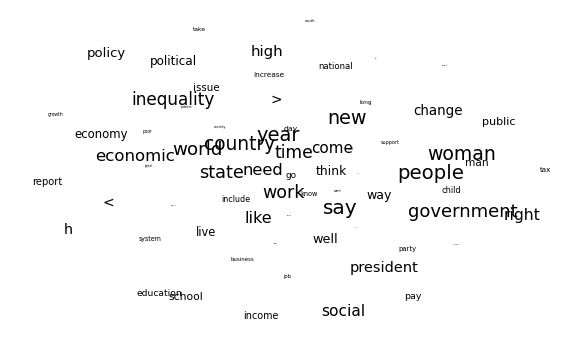

In [577]:
# Plot the points
fig = plt.figure(figsize = (10,6))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tsneWords[:, 0], tsneWords[:, 1], alpha = 0)#Making the points invisible 
for i, word in enumerate(targetWords):
    ax.annotate(word, (tsneWords[:, 0][i],tsneWords[:, 1][i]), size =  20 * (numWords - i) / numWords)
plt.xticks(())
plt.yticks(())
plt.show()

# Doc2Vec

Instead of just looking at just how words embed within in the space, we can look at how the different documents relate to each other within the space. First lets load our data--abstracts of most U.S. physics papers from the 1950s.

In [25]:
apsDF = pandas.read_csv('../data/APSabstracts1950s.csv', index_col = 0)
apsDF[:10]

,copyrightYear,doi,abstract
0,1950,10.1103/RevModPhys.22.221,A summarizing account is given of the research...
1,1951,10.1103/RevModPhys.23.147,New tables of coulomb functions are presented ...
2,1951,10.1103/RevModPhys.23.185,Ionization by electron impact in diatomic gase...
3,1951,10.1103/RevModPhys.23.203,It is shown that the conductivity in the ohmic...
4,1951,10.1103/RevModPhys.23.21,The factorization method is an operational pro...
5,1951,10.1103/RevModPhys.23.311,A brief account is given of Dyson's proof of t...
6,1951,10.1103/RevModPhys.23.315,A systematics is given of all transitions for ...
7,1951,10.1103/RevModPhys.23.322,A systematics of the -transitions of even A nu...
8,1951,10.1103/RevModPhys.23.328,The available experiments on the absorption sp...
9,1952,10.1103/RevModPhys.24.108,The classical theory of the dynamics of viscou...


We will load these as documents into Word2Vec, but first we need to normalize and pick some tags.

In [26]:
keywords = ['photomagnetoelectric', 'quantum', 'boltzmann', 'proton', 'positron', 'feynman', 'classical', 'relativity']

In [27]:
apsDF['tokenized_words'] = apsDF['abstract'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
apsDF['normalized_words'] = apsDF['tokenized_words'].apply(lambda x: lucem_illud_2020.normalizeTokens(x, lemma=False))

In [28]:
taggedDocs = []
for index, row in apsDF.iterrows():
    #Just doing a simple keyword assignment
    docKeywords = [s for s in keywords if s in row['normalized_words']]
    docKeywords.append(row['copyrightYear'])
    docKeywords.append(row['doi']) #This lets us extract individual documnets since doi's are unique
    taggedDocs.append(gensim.models.doc2vec.LabeledSentence(words = row['normalized_words'], tags = docKeywords))
apsDF['TaggedAbstracts'] = taggedDocs

Now we can train a Doc2Vec model:

In [29]:
apsD2V = gensim.models.doc2vec.Doc2Vec(apsDF['TaggedAbstracts'], size = 100) #Limiting to 100 dimensions

/Users/bhargavvader/open_source/Content-Analysis-2020/venv/lib/python3.5/site-packages/gensim/models/doc2vec.py:574: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")


We can get vectors for the tags/documents, just as we did with words. Documents are actually the centroids (high dimensional average points) of their words. 

In [30]:
apsD2V.docvecs[1952]

array([ 0.19856402, -0.32607275, -0.5434297 ,  1.1079134 , -0.7955435 ,
        0.99836284,  0.02586303, -0.77402437,  0.74257386,  1.140868  ,
       -2.4344554 , -0.13921498, -1.2160647 , -1.4391065 , -0.63838714,
        2.1025863 , -0.12144856, -1.331758  ,  0.01048518, -0.6495456 ,
        1.7060442 ,  0.18673746, -0.35625997, -0.8610773 , -0.86390185,
        1.0696704 , -0.23027356,  0.04415682,  0.92669034, -0.50605357,
       -1.2538182 , -0.8345244 ,  1.09148   , -0.9151546 , -1.3085489 ,
       -1.5950308 , -0.54413456,  2.0067692 ,  0.04618606,  1.4554724 ,
        1.4843128 ,  1.5505302 , -1.2077212 , -0.2808706 ,  1.2828134 ,
        0.9156761 , -0.69469404, -0.44501895, -0.50577635,  0.54679835,
       -0.43360424, -0.2895272 , -1.8368219 ,  0.46414116,  0.60980177,
       -0.03472868,  0.7123255 , -0.79734975,  1.5043598 ,  0.6873778 ,
        1.3033248 , -0.2133346 ,  0.22569688, -1.3537297 ,  0.7381637 ,
       -0.10078208, -1.7898892 , -0.2197677 , -0.65157926, -0.50

The words can still be accessed in the same way:

In [31]:
apsD2V['atom']

array([ 0.18284628, -0.04895942, -0.89525455,  0.386619  ,  0.15722378,
        0.28620473,  0.34100235,  0.6834194 , -0.00408947,  0.6566478 ,
       -0.5354382 ,  0.01004452,  0.43740138, -1.091602  ,  0.22807835,
        0.71692365, -0.37653923, -0.10362295, -0.16604191,  0.3131635 ,
       -0.35241136, -0.8172237 ,  0.3936495 , -0.5299927 ,  0.13411738,
        0.2986211 , -0.45632944,  0.00526831,  0.7483204 , -0.34703842,
       -0.8986433 , -0.25062317,  0.16325492, -1.1789956 ,  0.1183672 ,
        0.30810228, -1.107009  ,  0.42208552,  0.41748974,  0.7264739 ,
        0.8722728 ,  1.4183432 , -0.25191745,  0.8265018 ,  0.19808555,
        0.23069115, -0.17685364, -0.29582533,  0.05870611,  0.10616075,
       -0.45562714,  0.17342158, -0.25422886,  0.7015164 ,  0.7497404 ,
       -0.07426755,  1.2640078 , -0.19158858, -0.70047724,  0.10496335,
       -0.91657907, -0.8523482 ,  0.6237608 , -0.09004818,  0.08607046,
       -0.2238795 ,  0.4310083 , -0.21755084, -1.1692094 , -0.53

We can still use the ``most_similar`` command to perform simple semantic equations:

In [32]:
apsD2V.most_similar(positive = ['atom','electrons'], negative = ['electron'], topn = 1)

[('atoms', 0.808495819568634)]

This is interesting. **Electron** is to **electrons** as **atom** is to **atoms**. Another way to understand this, developed below is: **electrons - electron** induces a singular to plural dimension, so when we subtract **electron** from **atom** and add **electrons**, we get **atoms**! 

In [33]:
apsD2V.most_similar(positive = ['einstein','law'], negative = ['equation'], topn = 1)

[('resemblance', 0.9027340412139893)]

In other words **Einstein** minus **equation** plus **law** equals **Meissner**--Walthur Meissner studied mechanical engineering and physics ... and was more likely to produce a "law" than a "equation", like the Meissner effect, the damping of the magnetic field in superconductors. If we built our word-embedding with a bigger corpus like the entire arXiv, a massive repository of physics preprints, we would see many more such relationships like **gravity - Newton + Einstein = relativity**.

We can also compute all of these *by hand*--explicitly wth vector algebra: 

In [34]:
sklearn.metrics.pairwise.cosine_similarity(apsD2V['electron'].reshape(1,-1), apsD2V['positron'].reshape(1,-1))
#We reorient the vectors with .reshape(1, -1) so that they can be computed without a warning in sklearn

array([[0.63588536]], dtype=float32)

In the doc2vec model, the documents have vectors just as the words do, so that we can compare documents with each other and also with words (similar to how a search engine locates a webpage with a query). First, we will calculate the distance between a word and documents in the dataset:

In [35]:
apsD2V.docvecs.most_similar([ apsD2V['electron'] ], topn=5 )

[('10.1103/PhysRev.113.479', 0.6609346866607666),
 ('10.1103/PhysRev.104.1528', 0.6466891169548035),
 ('10.1103/PhysRev.110.857', 0.6089353561401367),
 ('10.1103/PhysRev.106.191', 0.6088852882385254),
 ('10.1103/PhysRev.100.1646', 0.6056019067764282)]

If we search for the first of these on the web (these are doi codes), we find the following...a pretty good match:

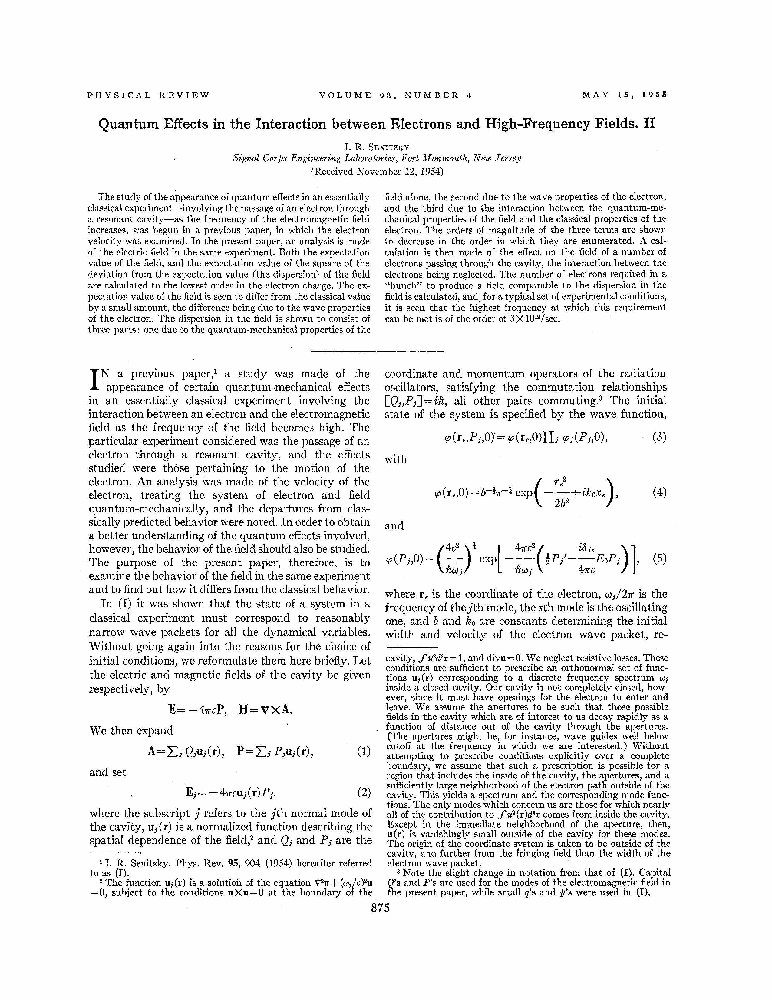

In [36]:
from IPython.display import Image
Image("../data/PhysRev.98.875.jpg", width=1000, height=1000)

Now let's go the other way around and find words most similar to this document:

In [37]:
apsD2V.most_similar( [ apsD2V.docvecs['10.1103/PhysRev.98.875'] ], topn=5) 

[('volts', 0.8236003518104553),
 ('attaining', 0.8067859411239624),
 ('shielding', 0.7597390413284302),
 ('kv', 0.7478094100952148),
 ('vary', 0.7477940917015076)]

We can even look for documents most like a query composed of multiple words:

In [38]:
apsD2V.docvecs.most_similar([ apsD2V['electron']+apsD2V['positron']+apsD2V['neutron']], topn=5 )

[('10.1103/PhysRev.85.1012', 0.7578761577606201),
 ('10.1103/PhysRev.89.631', 0.7375411987304688),
 ('10.1103/PhysRev.108.570', 0.7350585460662842),
 ('10.1103/PhysRev.116.1583', 0.7231032848358154),
 ('10.1103/PhysRev.92.1218', 0.7129611968994141)]

Now let's plot some words and documents against one another with a heatmap:

In [39]:
heatmapMatrix = []
for tagOuter in keywords:
    column = []
    tagVec = apsD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in keywords:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, apsD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrix.append(column)
heatmapMatrix = np.array(heatmapMatrix)

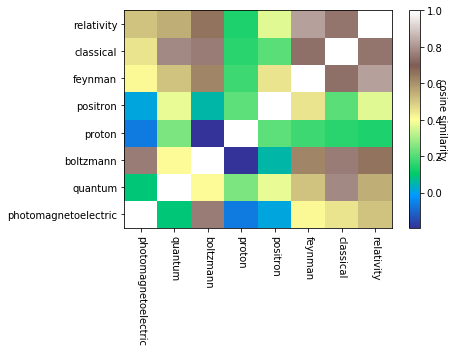

In [40]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrix, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrix.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrix.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(keywords, minor=False, rotation=270)
a = ax.set_yticklabels(keywords, minor=False)

Now let's look at a heatmap of similarities between the first ten documents in the corpus:

In [41]:
targetDocs = apsDF['doi'][:10]

heatmapMatrixD = []

for tagOuter in targetDocs:
    column = []
    tagVec = apsD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in targetDocs:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, apsD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrixD.append(column)
heatmapMatrixD = np.array(heatmapMatrixD)

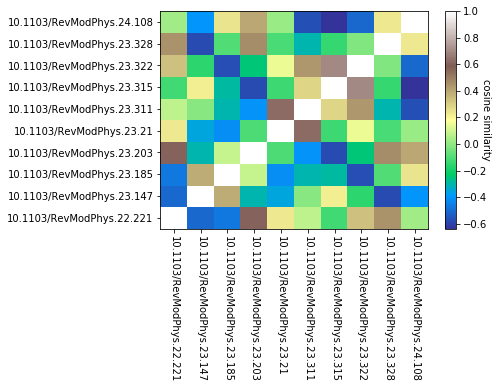

In [42]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrixD, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrixD.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrixD.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(targetDocs, minor=False, rotation=270)
a = ax.set_yticklabels(targetDocs, minor=False)

Now let's look at a heatmap of similarities between the first ten documents and our keywords:

In [43]:
heatmapMatrixC = []

for tagOuter in targetDocs:
    column = []
    tagVec = apsD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in keywords:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, apsD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrixC.append(column)
heatmapMatrixC = np.array(heatmapMatrixC)

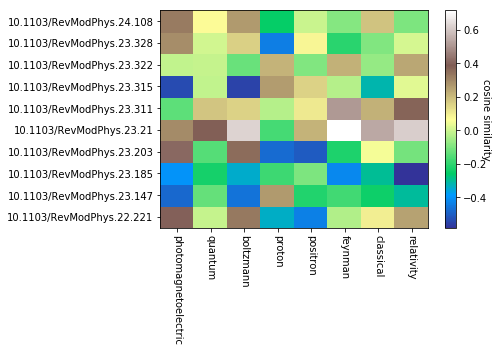

In [44]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrixC, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrixC.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrixC.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(keywords, minor=False, rotation=270)
a = ax.set_yticklabels(targetDocs, minor=False)

We will save the model in case we would like to use it again.

In [45]:
apsD2V.save('apsW2V')

We can later load it:

In [46]:
#apsD2V = gensim.models.word2vec.Word2Vec.load('data/apsW2V')

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that embed documents related to your final project using `doc2vec`, and explore the relationship between different documents and the word vectors you analyzed in the last exercise. Consider the most similar words to critical documents, analogies (doc _x_ + word _y_), and other additions and subtractions that reveal the structure of similarity and difference within your semantic space. What does this pattern reveal about the documentary organization of your semantic space?

To save time in running, I sampled 30% of the dataframe rows, around 1861 rows.

In [579]:
sampleDF = longSampleDF.sample(frac = 0.8, random_state = 1)
len(sampleDF)

10270

In [580]:
sampleDF

,textID,texts,date,year,month,country,tokenized_sents,normalized_sents
2989,2235111,NB : We use cookies to help personalise your ...,14-01-jm,14,01,jm,"[[NB], [We, use, cookies, to, help, personalis...","[[nb], [use, cooky, help, personalise, web, ex..."
2656,7300073,""" It feels like there are a lot of young peop...",16-01-ca,16,01,ca,"[[It, feels, like, there, are, a, lot, of, you...","[[feel, like, lot, young, people, like, passio..."
15796,22664922,THE economy of nature has sustained for milli...,18-01-PH,18,01,PH,"[[THE, economy, of, nature, has, sustained, fo...","[[economy, nature, sustain, million, year, eco..."
2505,16316971,"In March of 2016 , five members of the U.S. W...",17-01-CA,17,01,CA,"[[In, March, of, 2016, five, members, of, the,...","[[march, member, u.s], [woman, national, socce..."
21257,22523474,As the tech boom has stalled and new hiring h...,18-01-ZA,18,01,ZA,"[[As, the, tech, boom, has, stalled, and, new,...","[[tech, boom, stall, new, hire, slow, crawl, r..."
...,...,...,...,...,...,...,...,...
12670,50353590,Mental health services in the UK are falling ...,19-01-jm,19,01,jm,"[[Mental, health, services, in, the, UK, are, ...","[[mental, health, service, uk, fall, physical,..."
1342,30493584,Soon South Africa will be celebrating 25 year...,19-01-au,19,01,au,"[[Soon, South, Africa, will, be, celebrating, ...","[[soon, south, africa, celebrate, year, democr..."
2588,2223307,It was the British who first sighted New Cale...,14-01-in,14,01,in,"[[It, was, the, British, who, first, sighted, ...","[[british, sight, new, caledonia, voyage, capt..."
26594,30469417,Last Saturday at 11:59 AM Tell your friends...,19-01-us1,19,01,us1,"[[Last, Saturday, at, 11:59, AM, Tell, your, f...","[[saturday, 11:59, tell, friend], [france, yel..."


In [593]:
keywords = ['woman','man', 'poverty', 'job', 'digital', 'urban',\
            'political', 'insurance', 'career', 'health', 'education', 'children']

In [582]:
sampleDF['tokenized_words'] = sampleDF['texts'].apply(lambda x: lucem_illud.word_tokenize(x))
sampleDF['normalized_words'] = sampleDF['tokenized_words'].apply(lambda x: lucem_illud.normalizeTokens(x, lemma=False))


In [594]:
taggedDocs = []
for index, row in sampleDF.iterrows():
    docKeywords = [s for s in keywords if s in row['normalized_words']]
    #docKeywords.append(row['date'])
    docKeywords.append(row['textID']) #This lets us extract individual documnets since doi's are unique
    taggedDocs.append(gensim.models.doc2vec.LabeledSentence(words = row['normalized_words'], tags = docKeywords))
sampleDF['TaggedNews'] = taggedDocs
# Now train a Doc2Vec model
# when changing the keywords, I need to train it again
sampleD2V = gensim.models.doc2vec.Doc2Vec(sampleDF['TaggedNews'], size = 100) #Limiting to 100 dimensions

INFO:gensim.models.doc2vec:collecting all words and their counts
INFO:gensim.models.doc2vec:PROGRESS: at example #0, processed 0 words (0/s), 0 word types, 0 tags


/Applications/anaconda3/lib/python3.8/site-packages/gensim/models/doc2vec.py:319: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")


INFO:gensim.models.doc2vec:PROGRESS: at example #10000, processed 5191938 words (4189648/s), 82762 word types, 4942 tags
INFO:gensim.models.doc2vec:collected 83172 word types and 4996 unique tags from a corpus of 10270 examples and 5331204 words
INFO:gensim.models.word2vec:Loading a fresh vocabulary
INFO:gensim.models.word2vec:effective_min_count=5 retains 41228 unique words (49% of original 83172, drops 41944)
INFO:gensim.models.word2vec:effective_min_count=5 leaves 5239374 word corpus (98% of original 5331204, drops 91830)
INFO:gensim.models.word2vec:deleting the raw counts dictionary of 83172 items
INFO:gensim.models.word2vec:sample=0.001 downsamples 11 most-common words
INFO:gensim.models.word2vec:downsampling leaves estimated 5190035 word corpus (99.1% of prior 5239374)
INFO:gensim.models.base_any2vec:estimated required memory for 41228 words and 100 dimensions: 56594000 bytes
INFO:gensim.models.word2vec:resetting layer weights
INFO:gensim.models.base_any2vec:training model with 3

In [584]:
sampleD2V['gender']

array([ 0.29570735,  1.9508137 , -0.15919249, -2.889596  , -2.271587  ,
       -0.14513849, -4.7322564 , -2.1754851 ,  1.6375419 ,  1.4513714 ,
       -0.18221419, -1.3980184 ,  2.2679532 , -0.8212028 ,  0.23655672,
       -0.68091285,  0.9217738 , -1.7096636 ,  0.49323943,  0.5374464 ,
       -0.3145165 ,  0.57333827, -0.6651272 ,  0.80189025,  0.78856975,
       -0.37727588,  1.7391607 ,  0.47032127,  3.380909  , -3.833727  ,
       -0.45608643, -2.0120618 , -2.8760686 , -0.4962234 ,  0.06613117,
       -0.22159916,  1.134703  ,  0.9601761 ,  1.8273697 , -1.4451663 ,
        2.7615473 ,  1.1176822 ,  1.1674429 , -0.34207964, -0.6645187 ,
        3.77777   ,  0.6720651 , -0.1680731 , -2.631409  ,  1.2458246 ,
        1.6410898 ,  0.05557512,  1.9818628 , -0.5498707 ,  0.50035375,
        1.7040465 ,  0.22143267,  0.0731459 , -1.42077   ,  0.880367  ,
       -4.0213003 , -0.6493708 , -0.8501498 ,  2.25484   ,  1.6985328 ,
       -0.44235775, -0.6482999 , -1.4131142 , -0.3462688 , -0.31

In [585]:
# most_similiar 
sampleD2V.most_similar(positive = ['woman','political'], negative = ['man'], topn = 1)


INFO:gensim.models.keyedvectors:precomputing L2-norms of word weight vectors


[('utilized', 0.413019061088562)]

In [586]:
# We can even look for documents most like a query composed of multiple words:
sampleD2V.docvecs.most_similar([sampleD2V['labor']+sampleD2V['digital']+sampleD2V['money']], topn=5 )


INFO:gensim.models.keyedvectors:precomputing L2-norms of doc weight vectors


[('7265054', 0.570816695690155),
 ('714237', 0.5575541257858276),
 ('30507471', 0.5279752016067505),
 ('2989320', 0.5251508355140686),
 ('16593310', 0.5200055241584778)]

PlotNow let's plot some words and documents against one another with a heatmap:

In [595]:
heatmapMatrix = []
for tagOuter in keywords:
    column = []
    tagVec = sampleD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in keywords:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, sampleD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrix.append(column)
heatmapMatrix = np.array(heatmapMatrix)

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f93dfddddc0>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f93dfddddc0> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


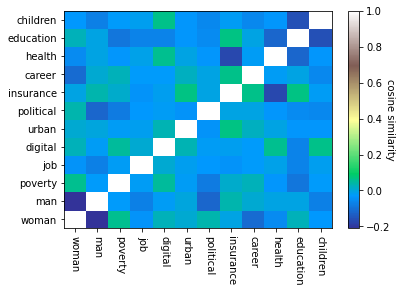

In [596]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrix, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrix.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrix.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(keywords, minor=False, rotation=270)
a = ax.set_yticklabels(keywords, minor=False)

In [589]:
targetDocs = sampleDF['textID'][:4]

heatmapMatrixD = []

for tagOuter in targetDocs:
    column = []
    tagVec = sampleD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in targetDocs:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, sampleD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrixD.append(column)
heatmapMatrixD = np.array(heatmapMatrixD)

Documents -- documents

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f98a9709f40>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f98a9709f40> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


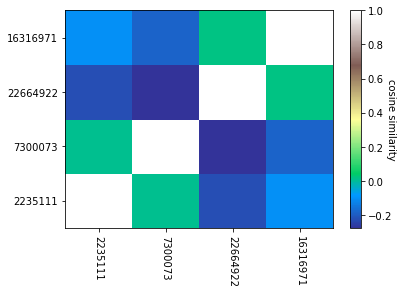

In [590]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrixD, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrixD.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrixD.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(targetDocs, minor=False, rotation=270)
a = ax.set_yticklabels(targetDocs, minor=False)

Documents -- keywords

In [591]:
heatmapMatrixC = []

for tagOuter in targetDocs:
    column = []
    tagVec = sampleD2V.docvecs[tagOuter].reshape(1, -1)
    for tagInner in keywords:
        column.append(sklearn.metrics.pairwise.cosine_similarity(tagVec, sampleD2V.docvecs[tagInner].reshape(1, -1))[0][0])
    heatmapMatrixC.append(column)
heatmapMatrixC = np.array(heatmapMatrixC)

DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f98aa3cad90>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f98aa3cad90> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


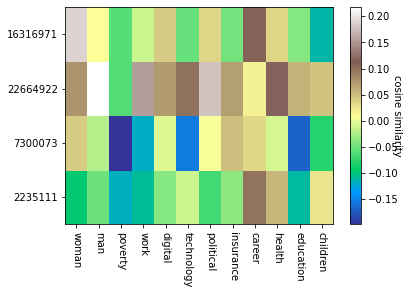

In [592]:
fig, ax = plt.subplots()
hmap = ax.pcolor(heatmapMatrixC, cmap='terrain')
cbar = plt.colorbar(hmap)

cbar.set_label('cosine similarity', rotation=270)
a = ax.set_xticks(np.arange(heatmapMatrixC.shape[1]) + 0.5, minor=False)
a = ax.set_yticks(np.arange(heatmapMatrixC.shape[0]) + 0.5, minor=False)

a = ax.set_xticklabels(keywords, minor=False, rotation=270)
a = ax.set_yticklabels(targetDocs, minor=False)

# Projection

We can also project word vectors to an arbitray semantic dimension. To demonstrate this possibility, let's first load a model trained with New York Times news articles. 

In [47]:
nytimes_model = gensim.models.KeyedVectors.load_word2vec_format('../data/nytimes_cbow.reduced.txt')

First we can visualize with dimension reduction

In [48]:
#words to create dimensions
tnytTargetWords = ['man','him','he', 'woman', 'her', 'she', 'black','blacks','African', 'white', 'whites', 'Caucasian', 'rich', 'richer', 'richest', 'expensive', 'wealthy', 'poor', 'poorer', 'poorest', 'cheap', 'inexpensive']
#words we will be mapping
tnytTargetWords += ["doctor","lawyer","plumber","scientist","hairdresser", "nanny","carpenter","entrepreneur","musician","writer", "banker","poet","nurse", "steak", "bacon", "croissant", "cheesecake", "salad", "cheeseburger", "vegetables", "beer", "wine", "pastry", "basketball", "baseball", "boxing", "softball", "volleyball", "tennis", "golf", "hockey", "soccer"]


wordsSubMatrix = []
for word in tnytTargetWords:
    wordsSubMatrix.append(nytimes_model[word])
wordsSubMatrix = np.array(wordsSubMatrix)
#wordsSubMatrix

In [49]:
pcaWordsNYT = sklearn.decomposition.PCA(n_components = 50).fit(wordsSubMatrix)
reducedPCA_dataNYT = pcaWordsNYT.transform(wordsSubMatrix)
#T-SNE is theoretically better, but you should experiment
tsneWordsNYT = sklearn.manifold.TSNE(n_components = 2).fit_transform(reducedPCA_dataNYT)

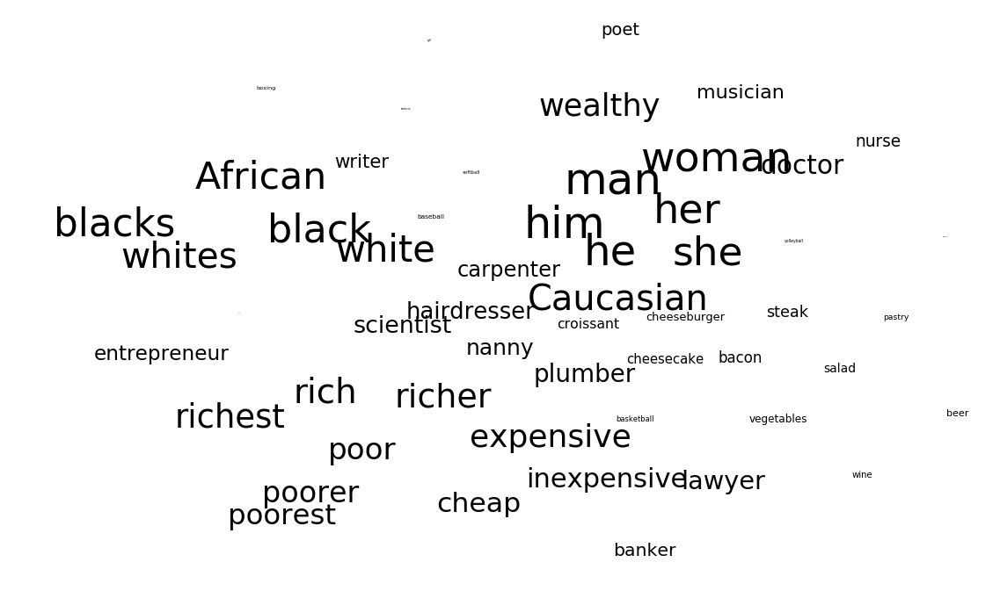

In [50]:
fig = plt.figure(figsize = (20,12))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tsneWordsNYT[:, 0], tsneWordsNYT[:, 1], alpha = 0) #Making the points invisible
for i, word in enumerate(tnytTargetWords):
    ax.annotate(word, (tsneWordsNYT[:, 0][i],tsneWordsNYT[:, 1][i]), size =  50 * (len(tnytTargetWords) - i) / len(tnytTargetWords))
plt.xticks(())
plt.yticks(())
plt.show()

Define some convenient functions for getting dimensions. 

In [51]:
def normalize(vector):
    normalized_vector = vector / np.linalg.norm(vector)
    return normalized_vector

def dimension(model, positives, negatives):
    diff = sum([normalize(model[x]) for x in positives]) - sum([normalize(model[y]) for y in negatives])
    return diff

Let's calculate three dimensions: gender, race, and class.

In [52]:
Gender = dimension(nytimes_model, ['man','him','he'], ['woman', 'her', 'she'])
Race = dimension(nytimes_model, ['black','blacks','African'], ['white', 'whites', 'Caucasian'])
Class = dimension(nytimes_model, ['rich', 'richer', 'richest', 'expensive', 'wealthy'], ['poor', 'poorer', 'poorest', 'cheap', 'inexpensive'])

Here we have some words.

In [53]:
Occupations = ["doctor","lawyer","plumber","scientist","hairdresser", "nanny","carpenter","entrepreneur","musician","writer", "banker","poet","nurse"]

Foods = ["steak", "bacon", "croissant", "cheesecake", "salad", "cheeseburger", "vegetables", "beer", "wine", "pastry"]

Sports  = ["basketball", "baseball", "boxing", "softball", "volleyball", "tennis", "golf", "hockey", "soccer"]

Define a function to project words in a word list to each of the three dimensions.

In [54]:
def makeDF(model, word_list):
    g = []
    r = []
    c = []
    for word in word_list:
        g.append(sklearn.metrics.pairwise.cosine_similarity(nytimes_model[word].reshape(1,-1), Gender.reshape(1,-1))[0][0])
        r.append(sklearn.metrics.pairwise.cosine_similarity(nytimes_model[word].reshape(1,-1), Race.reshape(1,-1))[0][0])
        c.append(sklearn.metrics.pairwise.cosine_similarity(nytimes_model[word].reshape(1,-1), Class.reshape(1,-1))[0][0])
    df = pandas.DataFrame({'gender': g, 'race': r, 'class': c}, index = word_list)
    return df

Get the projections.

In [55]:
OCCdf = makeDF(nytimes_model, Occupations) 
Fooddf = makeDF(nytimes_model, Foods)
Sportsdf = makeDF(nytimes_model, Sports)

Define some useful functions for plotting.

In [56]:
def Coloring(Series):
    x = Series.values
    y = x-x.min()
    z = y/y.max()
    c = list(plt.cm.rainbow(z))
    return c

def PlotDimension(ax,df, dim):
    ax.set_frame_on(False)
    ax.set_title(dim, fontsize = 20)
    colors = Coloring(df[dim])
    for i, word in enumerate(df.index):
        ax.annotate(word, (0, df[dim][i]), color = colors[i], alpha = 0.6, fontsize = 12)
    MaxY = df[dim].max()
    MinY = df[dim].min()
    plt.ylim(MinY,MaxY)
    plt.yticks(())
    plt.xticks(())

Plot the occupational words in each of the three dimensions.

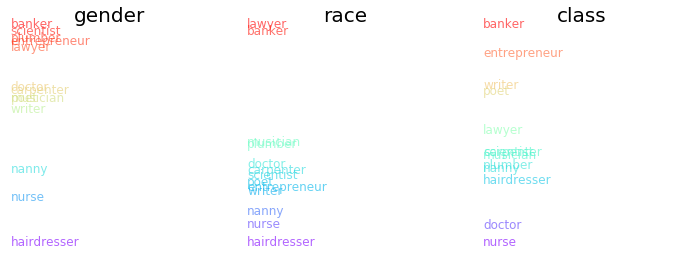

In [57]:
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, OCCdf, 'gender')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, OCCdf, 'race')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, OCCdf, 'class')
plt.show()

Foods:

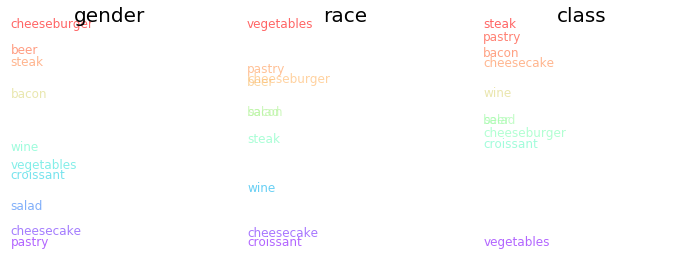

In [58]:
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, Fooddf, 'gender')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, Fooddf, 'race')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, Fooddf, 'class')
plt.show()

Sports:

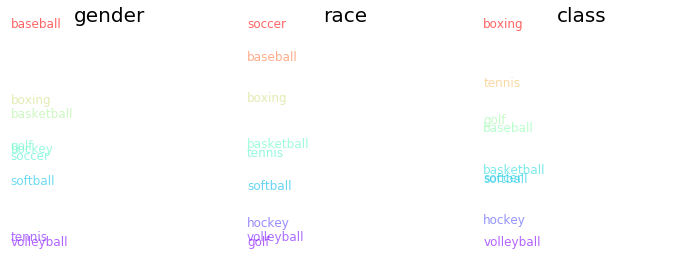

In [59]:
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, Sportsdf, 'gender')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, Sportsdf, 'race')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, Sportsdf, 'class')
plt.show()

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that embed documents related to your final project, then generate meaningful semantic dimensions based on your theoretical understanding of the semantic space (i.e., by subtracting semantically opposite word vectors) and project another set of word vectors onto those dimensions. Interpret the meaning of these projections for your analysis. Which of the dimensions you analyze explain the most variation in the projection of your words and why? 

<span style="color:red">***Stretch***: Average together multiple antonym pairs to create robust semantic dimensions. How do word projections on these robust dimensions differ from single-pair dimensions?

For race, entrepreneur, layer, banker tend to be close to "white" dimension; while carpenter is close to "black" dimension.   
Also as expected, banker, lawyer, entrepreneur are close to "rich","expensive" dimension; while carpenter, plumber are close to "poor", "inexpensive" dimension.   


For Food, 
Race: salad, wine is close to "white" while pastry close to "black"  


In [221]:
tnytTargetWords = ['woman', 'black', 'white', 'poor', 'rich', 'expensive', 'wealthy', 'cheap', 'inexpensive']
tnytTargetWords += ["doctor","lawyer","plumber","scientist","hairdresser", "nanny","carpenter","entrepreneur","musician","writer", "banker","poet","nurse", "steak", "bacon", "salad",  "beer", "wine", "pastry", "basketball", "baseball", "softball", "volleyball", "tennis", "golf", "hockey", "soccer"]

wordsSubMatrix = []
for word in tnytTargetWords:
    wordsSubMatrix.append(nowW2V[word])
wordsSubMatrix = np.array(wordsSubMatrix)


In [223]:
pcaWordsNYT = sklearn.decomposition.PCA(n_components = 30).fit(wordsSubMatrix)
reducedPCA_dataNYT = pcaWordsNYT.transform(wordsSubMatrix)
#T-SNE is theoretically better, but you should experiment
tsneWordsNYT = sklearn.manifold.TSNE(n_components = 2).fit_transform(reducedPCA_dataNYT)

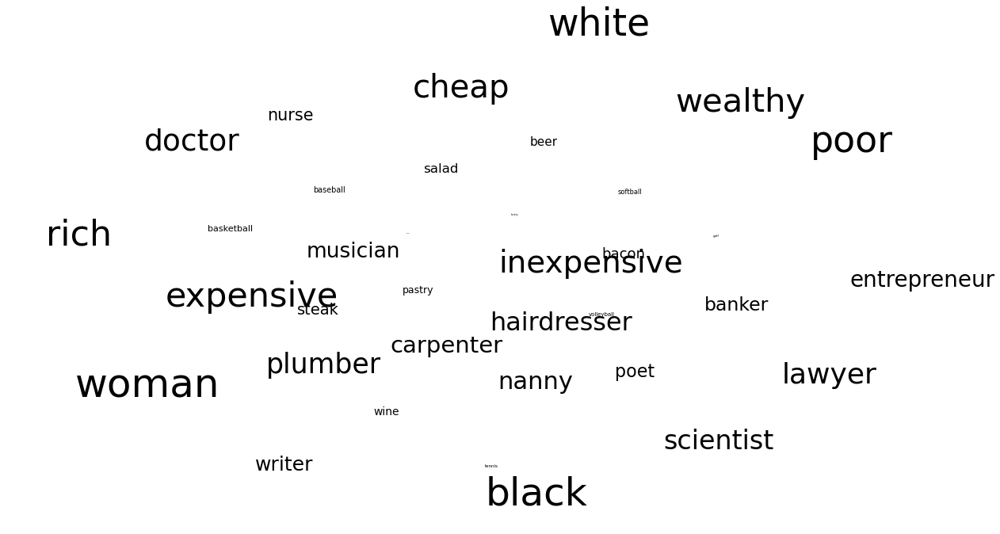

In [224]:
fig = plt.figure(figsize = (20,12))
ax = fig.add_subplot(111)
ax.set_frame_on(False)
plt.scatter(tsneWordsNYT[:, 0], tsneWordsNYT[:, 1], alpha = 0) #Making the points invisible
for i, word in enumerate(tnytTargetWords):
    ax.annotate(word, (tsneWordsNYT[:, 0][i],tsneWordsNYT[:, 1][i]), size =  50 * (len(tnytTargetWords) - i) / len(tnytTargetWords))
plt.xticks(())
plt.yticks(())
plt.show()

Dimensions

In [226]:
def normalize(vector):
    normalized_vector = vector / np.linalg.norm(vector)
    return normalized_vector

def dimension(model, positives, negatives):
    diff = sum([normalize(model[x]) for x in positives]) - sum([normalize(model[y]) for y in negatives])
    return diff

In [275]:
Gender = dimension(nowW2V, ['man'], ['woman'])
Race = dimension(nowW2V, ['black',], ['white'])
Class = dimension(nowW2V, ['rich', 'expensive', 'wealthy'], ['poor','cheap', 'inexpensive'])
Live = dimension(nowW2V, ['live'],['death'])


In [252]:
Occupations = ["doctor","lawyer","plumber","scientist","hairdresser", "nanny","carpenter","entrepreneur","musician","writer", "banker","poet","nurse"]

Foods = ["steak", "bacon",  "salad",  "beer", "wine", "pastry"]

Sports  = ["basketball", "baseball",  "softball", "volleyball", "tennis", "golf", "hockey", "soccer"]


In [267]:
def makeDF(model, word_list):
    g = []
    r = []
    c = []
    l = []
    for word in word_list:
        g.append(sklearn.metrics.pairwise.cosine_similarity(nowW2V[word].reshape(1,-1), Gender.reshape(1,-1))[0][0])
        r.append(sklearn.metrics.pairwise.cosine_similarity(nowW2V[word].reshape(1,-1), Race.reshape(1,-1))[0][0])
        c.append(sklearn.metrics.pairwise.cosine_similarity(nowW2V[word].reshape(1,-1), Class.reshape(1,-1))[0][0])
        l.append(sklearn.metrics.pairwise.cosine_similarity(nowW2V[word].reshape(1,-1), Live.reshape(1,-1))[0][0])

    df = pandas.DataFrame({'gender': g, 'race': r, 'class': c, 'live':l}, index = word_list)
    return df

In [268]:
OCCdf = makeDF(nowW2V, Occupations) 
Fooddf = makeDF(nowW2V, Foods)
Sportsdf = makeDF(nowW2V, Sports)

In [269]:
def Coloring(Series):
    x = Series.values
    y = x-x.min()
    z = y/y.max()
    c = list(plt.cm.rainbow(z))
    return c

def PlotDimension(ax,df, dim):
    ax.set_frame_on(False)
    ax.set_title(dim, fontsize = 20)
    colors = Coloring(df[dim])
    for i, word in enumerate(df.index):
        ax.annotate(word, (0, df[dim][i]), color = colors[i], alpha = 0.6, fontsize = 12)
    MaxY = df[dim].max()
    MinY = df[dim].min()
    plt.ylim(MinY,MaxY)
    plt.yticks(())
    plt.xticks(())

<ipython-input-597-7950337e4198>:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax4 = fig.add_subplot(133)


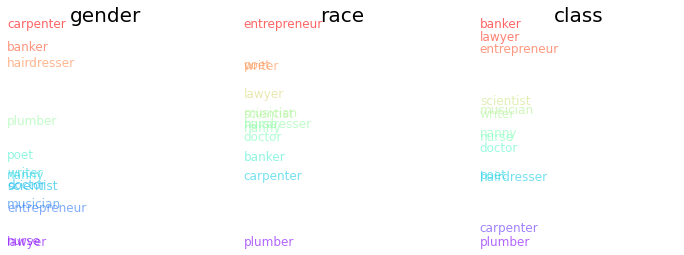

In [597]:
fig = plt.figure(figsize = (12,4))

ax1 = fig.add_subplot(131)
PlotDimension(ax1, OCCdf, 'gender')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, OCCdf, 'race')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, OCCdf, 'class')
ax4 = fig.add_subplot(133)
#PlotDimension(ax4, OCCdf, 'live')
#plt.show()

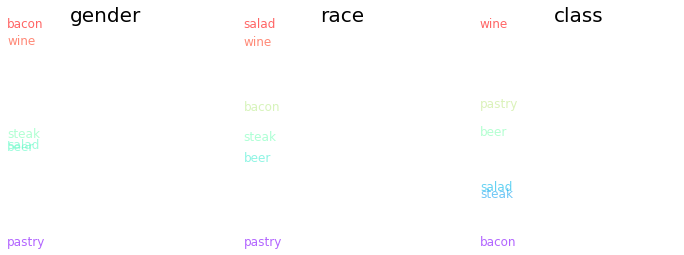

In [598]:
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, Fooddf, 'gender')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, Fooddf, 'race')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, Fooddf, 'class')
#ax4 = fig.add_subplot(133)
#PlotDimension(ax4, OCCdf, 'live')
plt.show()

<ipython-input-280-2e7721155c42>:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax4 = fig.add_subplot(133)


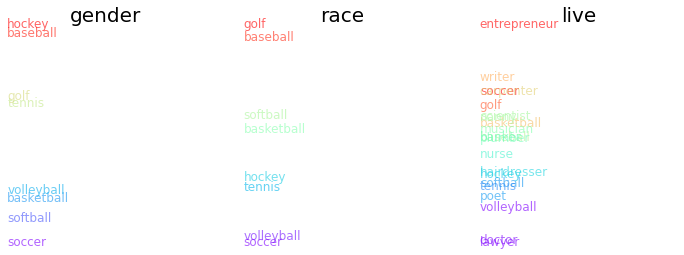

In [280]:
fig = plt.figure(figsize = (12,4))
ax1 = fig.add_subplot(131)
PlotDimension(ax1, Sportsdf, 'gender')
ax2 = fig.add_subplot(132)
PlotDimension(ax2, Sportsdf, 'race')
ax3 = fig.add_subplot(133)
PlotDimension(ax3, Sportsdf, 'class')
ax4 = fig.add_subplot(133)
PlotDimension(ax4, OCCdf, 'live')
plt.show()

# The Score Function

The score function is a simple calculation developed by [Matt Taddy](https://arxiv.org/pdf/1504.07295.pdf) to calculate the likelihood that a given text would have been generated by a word-embedding model by summing the inner product between each pair of the text's word vectors. This relies on a few data files that are not in the git repo due to their size please download and unzip [this](https://github.com/Computational-Content-Analysis-2018/Upcoming/raw/master/data/supplement.zip) (472MB) file in the data directory.

Here, we explore this using a model trained with millions of resumes from the CareerBuilder website (we can't share the private resumes...but we can share a model built with them :-):

In [60]:
resume_model  = gensim.models.word2vec.Word2Vec.load('../data/resumeAll.model')

We can examine the vacabularies of this model by building a word-index map:

In [61]:
vocab = resume_model.wv.index2word

Let's just load the sample and take a look at it. The sentences in each job description are already tokenized and normalized.

In [62]:
sampleDF = pandas.read_csv('../data/SampleJobAds.csv', index_col = False)
#We need to convert the last couple columns from strings to lists
sampleDF['tokenized_sents'] = sampleDF['tokenized_sents'].apply(lambda x: eval(x))
sampleDF['normalized_sents'] = sampleDF['normalized_sents'].apply(lambda x: eval(x))
sampleDF

,Unnamed: 0,hiringOrganization_organizationName,jobDescription,jobLocation_address_region,jobLocation_geo_latitude,jobLocation_geo_longitude,qualifications,responsibilities,tokenized_sents,normalized_sents
0,158844,"Golfsmith International, Inc.","""Sales Associate Tracking Code 220425-971 Job ...",California,33.91918,-118.41647,NaN,"""Ensure each Customer receives exceptional ser...","[[``, Sales, Associate, Tracking, Code, 220425...","[[sales, associate, tracking, code, job, descr..."
1,257645,Intel,For PHY system engineering team within the Wir...,NaN,NaN,NaN,NaN,NaN,"[[For, PHY, system, engineering, team, within,...","[[for, phy, system, engineering, team, within,..."
2,107875,Florida Hospital,*RN Medical Oncology PCU Orlando - Nights* Flo...,Florida,28.53834,-81.37924,NaN,NaN,"[[*RN, Medical, Oncology, PCU, Orlando, -, Nig...","[[medical, oncology, pcu, orlando, florida, ho..."
3,202394,Hitachi Data Systems,Title: Specialist Sales Account Representative...,NaN,NaN,NaN,NaN,NaN,"[[Title, :, Specialist, Sales, Account, Repres...","[[title, specialist, sales, account, represent..."
4,109675,Footprint Retail Services,**Footprint Retail Services** **Job Descriptio...,NaN,NaN,NaN,NaN,A Merchandiser must complete all assigned merc...,"[[**Footprint, Retail, Services**, **Job, Desc...","[[retail, job, title, retail, merchandiser, re..."
5,215973,Home Depot,Position Purpose: Provide outstanding service ...,Indiana,41.13060,-85.12886,NaN,Provide outstanding service to ensure efficien...,"[[Position, Purpose, :, Provide, outstanding, ...","[[position, purpose, provide, outstanding, ser..."
6,207524,Home Depot,The Asset Protection Specialist is primarily r...,New Jersey,40.21455,-74.61932,Must be eighteen years of age or older. Must p...,NaN,"[[The, Asset, Protection, Specialist, is, prim...","[[the, asset, protection, specialist, is, prim..."
7,64426,East West Bank,# Job Description East West Bank is one of the...,California,34.06862,-118.02757,NaN,We are currently seeking a Customer Service Ce...,"[[#, Job, Description, East, West, Bank, is, o...","[[job, description, east, west, bank, is, one,..."
8,245192,IBM,Job Description IBM is seeking to hire a Senio...,NaN,NaN,NaN,NaN,NaN,"[[Job, Description, IBM, is, seeking, to, hire...","[[job, description, ibm, is, seeking, to, hire..."
9,202429,Hitachi Data Systems,Title: Field Solutions Engineer Location: New ...,NaN,NaN,NaN,NaN,Job Functions;Specific duties in this role wil...,"[[Title, :, Field, Solutions, Engineer, Locati...","[[title, field, solutions, engineer, location,..."


Let's define a function to calculate the likelihood of each job description. The idea is borrowed from [Matt Taddy](https://github.com/RaRe-Technologies/gensim/blob/develop/docs/notebooks/deepir.ipynb), who shows how a document can be characterized as the inner product of the distance between its words. In other words, this analysis will show which job ads are most likely to find an appropriate pool of workers in the resume bank that generated our word embedding.  

In [63]:
def adprob(ad, model):
    sen_scores = model.score(ad, len(ad))
    ad_score = sen_scores.mean()
    return ad_score

Let's apply this function to every job description.

In [64]:
sampleDF['likelihood'] = sampleDF['normalized_sents'].apply(lambda x: adprob(x, resume_model))

Let's take a look at the top 5 job descriptions that have the highest likelihood.

In [65]:
for ad in sampleDF.sort_values(by = 'likelihood', ascending = False)['jobDescription'][:5]:
    print (ad + '\n\n')

Project Engineering including below jobs: 1. Hardware designing of DCS 2. Software configurations, programming, testing of DCS/PLC 3. Testing and FAT 4. Installation and commissioning. 5. Material ordering, approvals of datasheets. 6. HSE compliance as per HSE directives of HON. BE / B. Tech - Instrumentation / Control / Electronics. **Job:** **Engineering* **Title:** *Systems Engineer* **Location:** *IND-MH-Pune* **Requisition ID:** *00302235*


Like talking on the phone? Enjoy giving great customer service? Use those skills while working flexible,part time hours.


*# Positions:* 2 *Location:* US - UT - Orem *Category:* Engineering


Title: Respiratory Therapy, Intern Location: XX-XX-XX


Title: Position Opening at Illinois Wesleyan University Location: US-IL-Bloomington




Let's take a look at the bottom 5 job descriptions that have the lowest likelihood to be matched by the resumes.

In [66]:
for ad in sampleDF.sort_values(by = 'likelihood')['jobDescription'][:5]:
    print (ad + '\n\n')

Title: Contract Svc Admin Location: United States\-Michigan\-Caledonia Other Locations: JOB SUMMARY: ESSENTIAL DUTIES AND RESPONSIBILITIES: _ Other duties may be assigned:_ Prepare GPO rebate data for upload into STARR system oEnsure accurate data loads oProcess data into required reports oEnsure that GPOs are paid accurately and timely Prepare Sales Tracing data for upload into STARR system oEnsure accurate data loads oProcess data into required reports Prepare Rebate data for upload into STARR system oEnsure accurate data loads oProcess data into required reports oEnsure that distributors are accurately taking rebates against open invoices Manage work flow throughout the sales contracting process Ensure compliance with contract policies and performance requirements Assist in the preparation of charts and sales reports and analytics for customers and Management oQuarterly Reports oSales Tracing Answers customers and internal sale/customer service staff questions regarding pricing Mana

We can do the same for phrases corresponding to job skills.

In [67]:
adprob([["python", "programming"]], resume_model)

-14.355247

In [68]:
adprob([["julia", "programming"]], resume_model)

-33.427353

Basic programming appears to be more likely in this pool of resumes than python programming. 

We can also do some simple statistics. Unfortunately, we don't have a large sample here. Nevertheless, let's first look at the mean likelihood score of each hiring organization. Some organizations will do well to hire on CareerBuilder...while others will not.

In [69]:
sampleDF.groupby("hiringOrganization_organizationName")[['likelihood']].mean().sort_values('likelihood', ascending = False)

,likelihood
hiringOrganization_organizationName,
Honeywell,-25.974749
Legrand North America,-40.500500
Franciscan St. Eilzabeth Health,-43.167206
Illinois Wesleyan University,-52.681591
Gold's Gym,-75.230896
Jewel-Osco,-80.965462
Ingersoll Rand,-81.494949
Kaiser Permanente,-85.523113
Hallmark Health,-86.037094


We can also look at the mean likelihood of each state.

In [70]:
sampleDF.groupby("jobLocation_address_region")[['likelihood']].mean().sort_values('likelihood', ascending = False)

,likelihood
jobLocation_address_region,
Utah,-40.500500
Montana,-63.730721
Connecticut,-67.623466
Kansas,-85.259682
Tennessee,-93.188822
Illinois,-93.989101
New Hampshire,-94.109772
Georgia,-102.271820
South Carolina,-103.527328


You would increase the sample size if you want to do a more serious study.

## <span style="color:red">*Exercise 4a*</span>

<span style="color:red">**Do only 4a or 4b.** Construct cells immediately below this that calculate the scores for a small sample of documents from outside your corpus to identify which are *closest* to your corpus. Then calculate the scores for a few phrases or sentences to identify the ones most likely to have appeared in your corpus. Interrogate patterns associated with these document/phrase scores (e.g., which companies produced job ads most or least likely to find jobseekers in the resume corpus?) What do these patterns suggest about the boundaries of your corpus?

# Linguistic Change or Difference

Below is code that aligns the dimensions of multiple embeddings arrayed over time or some other dimension and allow identification of semantic chanage as the word vectors change their loadings for focal words. This code comes from the approach piloted at Stanford by William Hamilton, Daniel Jurafsky and Jure Lescovec [here](https://arxiv.org/pdf/1605.09096.pdf). 

In [76]:
import copy

In [71]:
def calc_syn0norm(model):
    """since syn0norm is now depricated"""
    return (model.wv.syn0 / np.sqrt((model.wv.syn0 ** 2).sum(-1))[..., np.newaxis]).astype(np.float32)

def smart_procrustes_align_gensim(base_embed, other_embed, words=None):
    """Procrustes align two gensim word2vec models (to allow for comparison between same word across models).
    Code ported from HistWords <https://github.com/williamleif/histwords> by William Hamilton <wleif@stanford.edu>.
    (With help from William. Thank you!)
    First, intersect the vocabularies (see `intersection_align_gensim` documentation).
    Then do the alignment on the other_embed model.
    Replace the other_embed model's syn0 and syn0norm numpy matrices with the aligned version.
    Return other_embed.
    If `words` is set, intersect the two models' vocabulary with the vocabulary in words (see `intersection_align_gensim` documentation).
    """
    base_embed = copy.copy(base_embed)
    other_embed = copy.copy(other_embed)
    # make sure vocabulary and indices are aligned
    in_base_embed, in_other_embed = intersection_align_gensim(base_embed, other_embed, words=words)

    # get the embedding matrices
    base_vecs = calc_syn0norm(in_base_embed)
    other_vecs = calc_syn0norm(in_other_embed)

    # just a matrix dot product with numpy
    m = other_vecs.T.dot(base_vecs) 
    # SVD method from numpy
    u, _, v = np.linalg.svd(m)
    # another matrix operation
    ortho = u.dot(v) 
    # Replace original array with modified one
    # i.e. multiplying the embedding matrix (syn0norm)by "ortho"
    other_embed.wv.syn0norm = other_embed.wv.syn0 = (calc_syn0norm(other_embed)).dot(ortho)
    return other_embed
    
def intersection_align_gensim(m1,m2, words=None):
    """
    Intersect two gensim word2vec models, m1 and m2.
    Only the shared vocabulary between them is kept.
    If 'words' is set (as list or set), then the vocabulary is intersected with this list as well.
    Indices are re-organized from 0..N in order of descending frequency (=sum of counts from both m1 and m2).
    These indices correspond to the new syn0 and syn0norm objects in both gensim models:
        -- so that Row 0 of m1.syn0 will be for the same word as Row 0 of m2.syn0
        -- you can find the index of any word on the .index2word list: model.index2word.index(word) => 2
    The .vocab dictionary is also updated for each model, preserving the count but updating the index.
    """

    # Get the vocab for each model
    vocab_m1 = set(m1.wv.vocab.keys())
    vocab_m2 = set(m2.wv.vocab.keys())

    # Find the common vocabulary
    common_vocab = vocab_m1&vocab_m2
    if words: common_vocab&=set(words)

    # If no alignment necessary because vocab is identical...
    if not vocab_m1-common_vocab and not vocab_m2-common_vocab:
        return (m1,m2)

    # Otherwise sort by frequency (summed for both)
    common_vocab = list(common_vocab)
    common_vocab.sort(key=lambda w: m1.wv.vocab[w].count + m2.wv.vocab[w].count,reverse=True)

    # Then for each model...
    for m in [m1,m2]:
        # Replace old syn0norm array with new one (with common vocab)
        indices = [m.wv.vocab[w].index for w in common_vocab]
        old_arr = calc_syn0norm(m)
        new_arr = np.array([old_arr[index] for index in indices])
        m.wv.syn0norm = m.wv.syn0 = new_arr

        # Replace old vocab dictionary with new one (with common vocab)
        # and old index2word with new one
        m.index2word = common_vocab
        old_vocab = m.wv.vocab
        new_vocab = {}
        for new_index,word in enumerate(common_vocab):
            old_vocab_obj=old_vocab[word]
            new_vocab[word] = gensim.models.word2vec.Vocab(index=new_index, count=old_vocab_obj.count)
        m.wv.vocab = new_vocab

    return (m1,m2)

In order to explore this, let's get some data that follows a time trend. We'll look at conference proceedings from the American Society for Clinical Oncologists.

In [72]:
ascoDF = pandas.read_csv("../data/ASCO_abstracts.csv", index_col=0)

Prepare for wor2vec:

In [73]:
ascoDF['tokenized_sents'] = ascoDF['Body'].apply(lambda x: [lucem_illud_2020.word_tokenize(s) for s in lucem_illud_2020.sent_tokenize(x)])
ascoDF['normalized_sents'] = ascoDF['tokenized_sents'].apply(lambda x: [lucem_illud_2020.normalizeTokens(s) for s in x])

In [94]:
ascoDF

,Year,AbstractCategory,Title,FirstAuthor,Body,AbstractPublicationID,tokenized_sents,normalized_sents
0,1995,Lung Cancer,Treatment of non-small cell lung cancer with c...,GP Stathopoulos,Cisplatin compound is established as the main ...,1181,"[[Cisplatin, compound, is, established, as, th...","[[cisplatin, compound, establish, main, drug, ..."
1,1995,Breast Cancer,Treatment of primary breast cancer without mas...,A Bluming,"Between March 24, 1977, and March 24, 1983, 15...",270,"[[Between, March, 24, 1977, and, March, 24, 19...","[[march, march, woman, primary, breast, cancer..."
2,1995,Gynecologic Cancer,Treatment of relapsed ovarian carcinoma with e...,M Metzner,ECF has established activity and a high respon...,784,"[[ECF, has, established, activity, and, a, hig...","[[ecf, establish, activity, high, response, ra..."
3,1995,Lung Cancer,Treatment of small cell lung cancer (SCLC) wit...,JD Hainsworth,"In 7/93, we began investigation of a three-dru...",1197,"[[In, 7/93, we, began, investigation, of, a, t...","[[begin, investigation, drug, combination, pac..."
4,1995,Other Gastrointestinal Cancer,Vaccine-based (active specific) chemoimmunothe...,SH Itzkowitz,Active specific immunotherapy (ASI) is the adm...,549,"[[Active, specific, immunotherapy, ASI, is, th...","[[active, specific, immunotherapy, asi, admini..."
5,1995,Breast Cancer,Validation of a model that identifies high ris...,GM Clark,Breast cancer patients with 10 or more positiv...,69,"[[Breast, cancer, patients, with, 10, or, more...","[[breast, cancer, patient, positive, lymph, no..."
6,1995,Genitourinary Cancer,Validation of the PROSQOLI: a pragmatic outcom...,M Stockler,Rationale: Traditional outcome measures are un...,649,"[[Rationale], [Traditional, outcome, measures,...","[[rationale], [traditional, outcome, measure, ..."
7,1995,Preclinical Experimental Therapeutics - Other,'In vitro' comparative assay on fluorouracil (...,A Abad,The clinical experience with biochemical modul...,1609,"[[The, clinical, experience, with, biochemical...","[[clinical, experience, biochemical, modulatio..."
8,1995,Tumor Biology,'Medical cultural diversity' among medical onc...,R Hochman,Most MO rely on prospective randomized trials....,1633,"[[Most, MO, rely, on, prospective, randomized,...","[[mo, rely, prospective, randomize, trial], [o..."
9,1995,Developmental TherapeuticsÑClinical Pharmacolo...,13-cis-retinoic acid plus low dose recombinant...,GM Turola,Both interferons and retinoids are known to po...,709,"[[Both, interferons, and, retinoids, are, know...","[[interferon, retinoid, know, possess, antipro..."


We will be creating many embeddings so we have created this function to do most of the work. It creates two collections of embeddings, one the original and one the aligned.

In [183]:
def compareModels(df, category, text_column_name='normalized_sents', sort = True, embeddings_raw={}):
    """If you are using time as your category sorting is important"""
    if len(embeddings_raw) == 0:
        embeddings_raw = rawModels(df, category, text_column_name, sort)
    cats = sorted(set(df[category]))
    #These are much quicker
    embeddings_aligned = {}
    for catOuter in cats:
        embeddings_aligned[catOuter] = [embeddings_raw[catOuter]]
        for catInner in cats:
            embeddings_aligned[catOuter].append(smart_procrustes_align_gensim(embeddings_aligned[catOuter][-1], embeddings_raw[catInner]))
    return embeddings_raw, embeddings_aligned

In [184]:
def rawModels(df, category, text_column_name='normalized_sents', sort = True):
    embeddings_raw = {}
    cats = sorted(set(df[category]))
    for cat in cats:
        #This can take a while
        print("Embedding {}".format(cat), end = '\r')
        subsetDF = df[df[category] == cat]
        #You might want to change the W2V parameters
        embeddings_raw[cat] = gensim.models.word2vec.Word2Vec(subsetDF[text_column_name].sum())
    return embeddings_raw

Now we generate the models:

In [77]:
rawEmbeddings, comparedEmbeddings = compareModels(ascoDF, 'Year')

In [95]:
rawEmbeddings.keys()

dict_keys([1995, 1996, 1997, 1998, 1999, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011])

We need to compare them across all permutions so we will define another function to help, we will be using 1 - cosine similarity as that gives a more intitive range of 0-2 with low values meaning little change and high meaning lots of change.

In [78]:
def getDivergenceDF(word, embeddingsDict):
    dists = []
    cats = sorted(set(embeddingsDict.keys()))
    dists = {}
    print(word)
    for cat in cats:
        dists[cat] = []
        for embed in embeddingsDict[cat][1:]:
            dists[cat].append(np.abs(1 - sklearn.metrics.pairwise.cosine_similarity(np.expand_dims(embeddingsDict[cat][0][word], axis = 0),
                                                                             np.expand_dims(embed[word], axis = 0))[0,0]))
    return pandas.DataFrame(dists, index = cats)

Lets look at a couple words:

breast


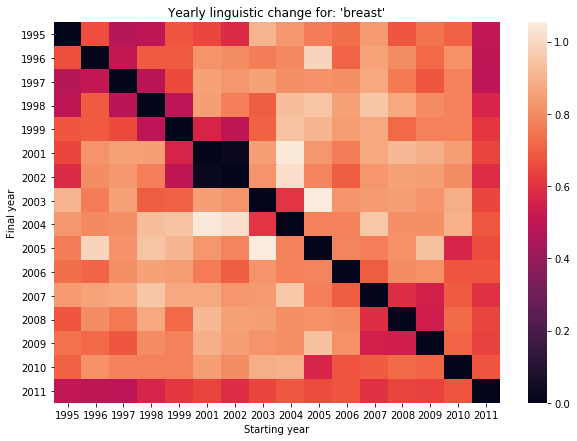

In [79]:
targetWord = 'breast'

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()

combination


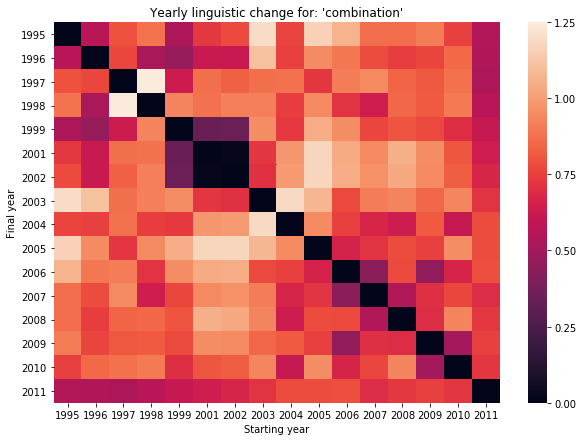

In [80]:
targetWord = 'combination'

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()

In [81]:
def findDiverence(word, embeddingsDict):
    cats = sorted(set(embeddingsDict.keys()))
    
    dists = []
    for embed in embeddingsDict[cats[0]][1:]:
        dists.append(1 - sklearn.metrics.pairwise.cosine_similarity(np.expand_dims(embeddingsDict[cats[0]][0][word], axis = 0), np.expand_dims(embed[word], axis = 0))[0,0])
    return sum(dists)

def findMostDivergent(embeddingsDict):
    words = []
    for embeds in embeddingsDict.values():
        for embed in embeds:
            words += list(embed.wv.vocab.keys())
    words = set(words)
    print("Found {} words to compare".format(len(words)))
    return sorted([(w, findDiverence(w, embeddingsDict)) for w in words], key = lambda x: x[1], reverse=True)
    

In [82]:
wordDivergences = findMostDivergent(comparedEmbeddings)

Found 1571 words to compare


The most divergent words are:

In [83]:
wordDivergences[:20]

[('t', 13.179612953215837),
 ('toxicity', 13.154180981218815),
 ('ml', 13.01737873442471),
 ('+', 12.853400095365942),
 ('activity', 12.749210256617516),
 ('infusion', 12.687976829707623),
 ('paclitaxel', 12.683675490319729),
 ('n', 12.662226218730211),
 ('great', 12.659880327060819),
 ('level', 12.559175675734878),
 ('x', 12.508285094052553),
 ('phase', 12.495868034660816),
 ('cisplatin', 12.456645250320435),
 ('combination', 12.417438723146915),
 ('c', 12.407136777415872),
 ('p', 12.399663124466315),
 ('efficacy', 12.373506214469671),
 ('csf', 12.333098318078555),
 ('show', 12.330282736569643),
 ('iv', 12.321207114960998)]

And the least:

In [84]:
wordDivergences[-20:]

[('answer', 1.7252497673034668),
 ('device', 1.721915602684021),
 ('facilitate', 1.720019280910492),
 ('additionally', 1.685628592967987),
 ('particular', 1.6720524430274963),
 ('ensure', 1.6524746417999268),
 ('context', 1.650183618068695),
 ('definition', 1.6107643842697144),
 ('difficulty', 1.6012009978294373),
 ('discuss', 1.5829300284385681),
 ('call', 1.5171823501586914),
 ('traditional', 1.4596245288848877),
 ('nature', 1.44323068857193),
 ('constitute', 1.4302696585655212),
 ('simple', 1.410505771636963),
 ('practical', 1.3745331764221191),
 ('special', 1.294035017490387),
 ('uncertain', 1.2042807936668396),
 ('situation', 1.1920225620269775),
 ('view', 1.1317378878593445)]

t


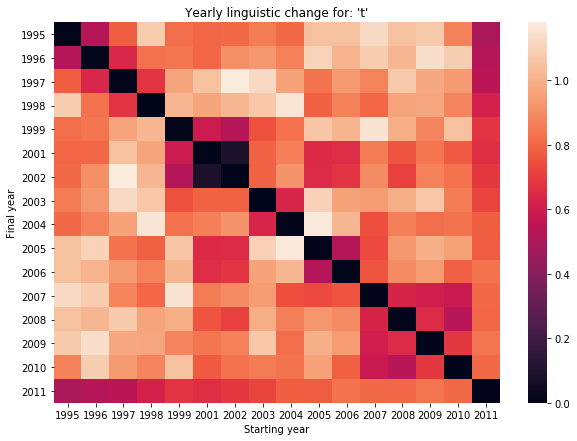

In [85]:
targetWord = wordDivergences[0][0]

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()

view


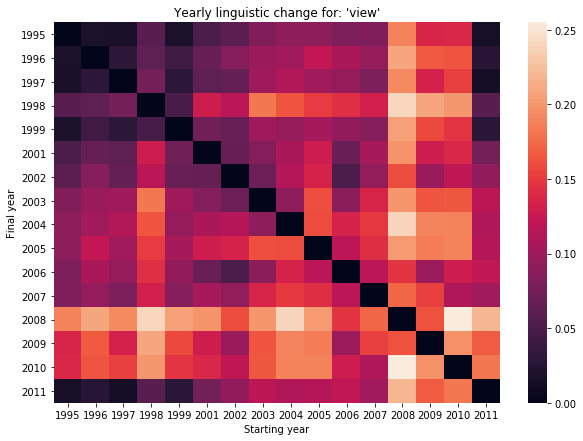

In [86]:
targetWord = wordDivergences[-1][0]

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()

## COHA

COHA is a historial dataset so it ends up being a good choice to try the same analysis we just did across three different time periods.

We will be using the same data loading procedure as the last notebook, so go through the process to make sure you know what's going on.

In [88]:
corpora_address = "/Users/bhargavvader/Downloads/Academics_Tech/corpora/COHA"

In [89]:
coha_texts = lucem_illud_2020.loadDavies(corpora_address, return_raw=True)

text_1940s_bsw.zip
text_1920s_gte.zip
text_1900s_mse.zip
text_1810s_kso.zip
text_2000s_scc.zip
text_1910s_jue.zip
text_1890s_jsq.zip
text_1870s_vuy.zip
text_1840s_nsq.zip
text_1860s_psi.zip
text_1950s_ndz.zip
text_1820s_jsi.zip
text_1980s_bkk.zip
text_1930s_bie.zip
text_1960s_xus.zip
text_1990s_bsj.zip
text_1830s_bsu.zip
text_1850s_jpr.zip
text_1970s_jfy.zip
text_1880s_azz.zip


Cool - let us now create our different epochs. This is an important step: I will be using the same 5 epochs I did in the DTM example, but you are recommended to play around with this. I will create a dataframe which logs the year and the genre.

In [114]:
coha_df = pandas.DataFrame(columns=["Year", "Genre", "Epoch", "normalized sents"])

In [115]:
for article in coha_texts:
    genre, year, id_ = article.split("_")

    year = int(year)
    
    if year > 1810 and year < 1880:
        epoch = 0
    if year >= 1880 and year < 1913:
        epoch = 1
    if year >= 1913 and year < 1950:
        epoch = 2
    if year >= 1950 and year < 1990:
        epoch = 3
    if year >= 1990:
        epoch = 4
    
    try:
        if len(coha_texts[article][2]) < 1500000:
            coha_df.loc[id_] = [year, genre, epoch, lucem_illud_2020.normalizeTokens(coha_texts[article][2].decode("utf-8"), lemma=False)]
    except TypeError:
        continue
    except IndexError:
        continue


We can now arrange our word embeddings by either year, genre, or epoch, and see how the words in each of those contexts change.

In [176]:
rawEmbeddings_epoch = rawModels(coha_df, 'Epoch', text_column_name='normalized sents')

In [ ]:
# rawEmbeddings_genre = rawModels(coha_df, 'Genre', text_column_name='normalized sents')

We now have the raw embeddings for epoch and genre. You can test out the previous analysis on words of your choice.

In [178]:
for epoch, embedding in enumerate(rawEmbeddings_epoch):
    model = rawEmbeddings_epoch[embedding]
    name = "embedding_epoch_" + str(epoch)
    model.save(name)

In [ ]:
# for embedding in rawEmbeddings_genre:
#     model = rawEmbeddings_genre[embedding]
#     name = "embedding_genre_" + embedding
#     model.save(name)

In [179]:
from gensim.models import Word2Vec

In [191]:
def file_to_embeddings(address, kind):
    rawEmbeddings = {}
    for file in os.listdir(address):
        if "embedding_"+kind in file:
            e, kind_, kind_type = file.split("_")
            kind_type = eval(kind_type)
            rawEmbeddings[kind_type] = Word2Vec.load(file)
    return rawEmbeddings

In [192]:
# rawEmbeddings_genre_load = file_to_embeddings(".", "genre")

In [193]:
rawEmbeddings_epoch_load = file_to_embeddings(".", "epoch")

In [194]:
rawEmbeddings_epoch_load.keys()

dict_keys([0, 1, 2, 3, 4])

In [195]:
rawEmbeddings_epoch, compared_epoch = compareModels(coha_df, 'Epoch', text_column_name='normalized sents', embeddings_raw=rawEmbeddings_epoch_load)

In [ ]:
# rawEmbeddings_genre, compared_genre = compareModels(coha_df, 'Genre', text_column_name='normalized sents', embeddings_raw=rawEmbeddings_genre_load)

You now have access to the epoch wise embeddings, and the code to train models genre wise (commented out). 
You can use the original embeddings, the compared embeddings and such to perform the analysis we did before.

## <span style="color:red">*Exercise 4b*</span>

<span style="color:red">**Do only 4a or 4b.** Construct cells immediately below this that align word embeddings over time or across domains/corpora. Interrogate the spaces that result and ask which words changed most and least over the entire period or between contexts/corpora. What does this reveal about the social game underlying your space? 

### Get a dataset from a long time period [important: data preparation  for our project]

Before doing any analysis, I need to get a new dataset from NoW, covering a long time period, from 2013 to 2019. But to have a relative quicker analysis, I only select the first month of each year (yes, I know it's not appropriate for the serious analysis, but here I only take it as an exploration).   

It's easy to see that for any keyword, there are little changes through the years of 2010, 2011 and 2012.   
And for "inequality", it changes most from 2013 to other years. Why there is a salient different in the discussion in 2013?


In [487]:
import zipfile
import re

In [306]:
corpora_address = "/Users/panrui/Desktop/MACSS/Content Analysis/Homework-Notes/data/now1"

In [307]:
now_texts = lucem_illud.loadDavies(corpora_address, num_files=2000)

text_13-01-lii.zip
text_15-01-oam.zip
text_16-01-yxh.zip
text_14-01-jhx.zip
text-18-01.zip
text_11-01-pct.zip
text_12-01-jgs.zip
text-19-01.zip
text_10-01-kus.zip
text-17-01.zip


In [391]:
for zip_name in os.listdir(corpora_address):
    if zip_name != ".DS_Store":
        print(zip_name)

text_13-01-lii.zip
text_15-01-oam.zip
text_16-01-yxh.zip
text_14-01-jhx.zip
text-18-01.zip
text_11-01-pct.zip
text_12-01-jgs.zip
text-19-01.zip
text_10-01-kus.zip
text-17-01.zip


In [398]:
def get_source(filename):
    zfile = zipfile.ZipFile(corpora_address + filename)
    source = []
    d = {}
    for file in zfile.namelist():
        print(file)
        with zfile.open(file) as f:
            for line in f:
                source.append(line)
            d[file] = source
    return d

In [384]:
def get_dict(d):
    now_txt_dict = {}
    #now_dict = {}
    for f_name, source in d.items():
        for news in source:
            news_str = news.decode('utf-8')
            if 'inequality' in news_str:
                try:
                    textID_title = news_str.split("<p>")[0].strip("@@")
                    l_texts = news_str.split("<p>")[1:]
                    if "<h>" in textID_title:
                        textID = textID_title.split("<h>")[0]
                        title = textID_title.split("<h>")[-1]
                    else:
                        textID = textID_title
                    # add the filename
                    f_name = f_name.split('.')[0]
                    textID = textID + f_name
                    print(textID)
                    now_txt_dict[textID.strip()] = " ".join(l_texts)
                except UnicodeDecodeError:
                    continue
    return now_txt_dict
        

In [400]:
l_df = []
for zip_name in os.listdir(corpora_address):
    if zip_name != ".DS_Store":
        print('zip is', zip_name)
        source = get_source("/" + zip_name)
        nowtxtDict = get_dict(source)
        nowDF = pd.DataFrame(nowtxtDict.items(), \
                              columns = ['textID','texts'])
        l_df.append(nowDF)

zip is text_13-01-lii.zip
13-01-au.txt
13-01-bd.txt
13-01-ca.txt
13-01-gb.txt
13-01-gh.txt
13-01-hk.txt
13-01-ie.txt
13-01-in.txt
13-01-jm.txt
13-01-ke.txt
13-01-lk.txt
13-01-my.txt
13-01-ng.txt
13-01-nz.txt
13-01-ph.txt
13-01-pk.txt
13-01-sg.txt
13-01-tz.txt
13-01-us.txt
13-01-za.txt
11698 13-01-au
13633 13-01-au
15738 13-01-au
28914 13-01-au
31274 13-01-au
31302 13-01-au
33799 13-01-au
38330 13-01-au
40290 13-01-au
47500 13-01-au
5613 13-01-au
4575047 13-01-au
4575050 13-01-au
12820 13-01-au
12844 13-01-au
15148 13-01-au
17015 13-01-au
17076 13-01-au
19364 13-01-au
19509 13-01-au
28114 13-01-au
28351 13-01-au
30411 13-01-au
30456 13-01-au
30563 13-01-au
32631 13-01-au
32639 13-01-au
32850 13-01-au
3305 13-01-au
3316 13-01-au
3326 13-01-au
3354 13-01-au
35284 13-01-au
39210 13-01-au
41748 13-01-au
41823 13-01-au
46615 13-01-au
46812 13-01-au
4879 13-01-au
4999 13-01-au
51832 13-01-au
53240 13-01-au
53444 13-01-au
53537 13-01-au
55607 13-01-au
55611 13-01-au
57897 13-01-au
60560 13-01-

9470 13-01-gb
36506 13-01-gb
26582 13-01-gb
28863 13-01-gb
40141 13-01-gb
10865 13-01-gb
18260 13-01-gb
18304 13-01-gb
20724 13-01-gb
20770 13-01-gb
20893 13-01-gb
37440 13-01-gb
38557 13-01-gb
38605 13-01-gb
38625 13-01-gb
47820 13-01-gb
47886 13-01-gb
51420 13-01-gb
54443 13-01-gb
56912 13-01-gb
5804 13-01-gb
5875 13-01-gb
59436 13-01-gb
7951 13-01-gb
4577014 13-01-gb
4578212 13-01-gb
1825827 13-01-gb
1827085 13-01-gb
10038 13-01-gb
4575301 13-01-gb
4575386 13-01-gb
4577758 13-01-gb
4577892 13-01-gb
4577926 13-01-gb
1824407 13-01-gb
1825394 13-01-gb
1825679 13-01-gb
1826607 13-01-gb
1826624 13-01-gb
1826862 13-01-gb
23847 13-01-gb
24895 13-01-gb
38495 13-01-gb
25121 13-01-gb
4034 13-01-gb
40744 13-01-gb
45582 13-01-gb
4574594 13-01-gb
4574734 13-01-gb
4575772 13-01-gb
4575827 13-01-gb
4576082 13-01-gb
4577073 13-01-gb
25073 13-01-gb
11109 13-01-gb
11196 13-01-gb
12270 13-01-gb
12452 13-01-gb
12558 13-01-gb
14669 13-01-gb
14733 13-01-gb
16679 13-01-gb
16823 13-01-gb
16830 13-01-gb
215

11473 13-01-ie
13518 13-01-ie
15331 13-01-ie
15508 13-01-ie
15575 13-01-ie
17654 13-01-ie
20218 13-01-ie
22145 13-01-ie
22260 13-01-ie
23504 13-01-ie
23673 13-01-ie
26171 13-01-ie
30877 13-01-ie
3554 13-01-ie
35640 13-01-ie
35694 13-01-ie
3585 13-01-ie
3627 13-01-ie
37110 13-01-ie
39591 13-01-ie
39808 13-01-ie
41975 13-01-ie
47178 13-01-ie
49827 13-01-ie
52074 13-01-ie
52095 13-01-ie
52129 13-01-ie
53661 13-01-ie
55865 13-01-ie
56152 13-01-ie
9470 13-01-ie
36506 13-01-ie
26582 13-01-ie
28863 13-01-ie
40141 13-01-ie
10865 13-01-ie
18260 13-01-ie
18304 13-01-ie
20724 13-01-ie
20770 13-01-ie
20893 13-01-ie
37440 13-01-ie
38557 13-01-ie
38605 13-01-ie
38625 13-01-ie
47820 13-01-ie
47886 13-01-ie
51420 13-01-ie
54443 13-01-ie
56912 13-01-ie
5804 13-01-ie
5875 13-01-ie
59436 13-01-ie
7951 13-01-ie
4577014 13-01-ie
4578212 13-01-ie
1825827 13-01-ie
1827085 13-01-ie
10038 13-01-ie
4575301 13-01-ie
4575386 13-01-ie
4577758 13-01-ie
4577892 13-01-ie
4577926 13-01-ie
1824407 13-01-ie
1825394 13-0

4575772 13-01-jm
4575827 13-01-jm
4576082 13-01-jm
4577073 13-01-jm
25073 13-01-jm
11109 13-01-jm
11196 13-01-jm
12270 13-01-jm
12452 13-01-jm
12558 13-01-jm
14669 13-01-jm
14733 13-01-jm
16679 13-01-jm
16823 13-01-jm
16830 13-01-jm
21518 13-01-jm
25365 13-01-jm
25467 13-01-jm
27490 13-01-jm
27540 13-01-jm
27821 13-01-jm
29687 13-01-jm
29688 13-01-jm
29765 13-01-jm
29780 13-01-jm
30044 13-01-jm
30289 13-01-jm
3156 13-01-jm
3237 13-01-jm
32408 13-01-jm
32422 13-01-jm
32483 13-01-jm
32490 13-01-jm
3261 13-01-jm
32623 13-01-jm
34713 13-01-jm
38968 13-01-jm
38973 13-01-jm
41017 13-01-jm
41026 13-01-jm
41064 13-01-jm
43299 13-01-jm
43432 13-01-jm
43442 13-01-jm
43495 13-01-jm
43542 13-01-jm
43669 13-01-jm
43740 13-01-jm
43851 13-01-jm
4462 13-01-jm
45924 13-01-jm
45932 13-01-jm
45957 13-01-jm
45998 13-01-jm
48648 13-01-jm
48768 13-01-jm
50743 13-01-jm
51596 13-01-jm
51763 13-01-jm
52854 13-01-jm
52971 13-01-jm
54873 13-01-jm
54914 13-01-jm
55013 13-01-jm
55205 13-01-jm
57452 13-01-jm
57498 

20218 13-01-my
22145 13-01-my
22260 13-01-my
23504 13-01-my
23673 13-01-my
26171 13-01-my
30877 13-01-my
3554 13-01-my
35640 13-01-my
35694 13-01-my
3585 13-01-my
3627 13-01-my
37110 13-01-my
39591 13-01-my
39808 13-01-my
41975 13-01-my
47178 13-01-my
49827 13-01-my
52074 13-01-my
52095 13-01-my
52129 13-01-my
53661 13-01-my
55865 13-01-my
56152 13-01-my
9470 13-01-my
36506 13-01-my
26582 13-01-my
28863 13-01-my
40141 13-01-my
10865 13-01-my
18260 13-01-my
18304 13-01-my
20724 13-01-my
20770 13-01-my
20893 13-01-my
37440 13-01-my
38557 13-01-my
38605 13-01-my
38625 13-01-my
47820 13-01-my
47886 13-01-my
51420 13-01-my
54443 13-01-my
56912 13-01-my
5804 13-01-my
5875 13-01-my
59436 13-01-my
7951 13-01-my
4577014 13-01-my
4578212 13-01-my
1825827 13-01-my
1827085 13-01-my
10038 13-01-my
4575301 13-01-my
4575386 13-01-my
4577758 13-01-my
4577892 13-01-my
4577926 13-01-my
1824407 13-01-my
1825394 13-01-my
1825679 13-01-my
1826607 13-01-my
1826624 13-01-my
1826862 13-01-my
23847 13-01-my
24

21518 13-01-nz
25365 13-01-nz
25467 13-01-nz
27490 13-01-nz
27540 13-01-nz
27821 13-01-nz
29687 13-01-nz
29688 13-01-nz
29765 13-01-nz
29780 13-01-nz
30044 13-01-nz
30289 13-01-nz
3156 13-01-nz
3237 13-01-nz
32408 13-01-nz
32422 13-01-nz
32483 13-01-nz
32490 13-01-nz
3261 13-01-nz
32623 13-01-nz
34713 13-01-nz
38968 13-01-nz
38973 13-01-nz
41017 13-01-nz
41026 13-01-nz
41064 13-01-nz
43299 13-01-nz
43432 13-01-nz
43442 13-01-nz
43495 13-01-nz
43542 13-01-nz
43669 13-01-nz
43740 13-01-nz
43851 13-01-nz
4462 13-01-nz
45924 13-01-nz
45932 13-01-nz
45957 13-01-nz
45998 13-01-nz
48648 13-01-nz
48768 13-01-nz
50743 13-01-nz
51596 13-01-nz
51763 13-01-nz
52854 13-01-nz
52971 13-01-nz
54873 13-01-nz
54914 13-01-nz
55013 13-01-nz
55205 13-01-nz
57452 13-01-nz
57498 13-01-nz
57689 13-01-nz
59978 13-01-nz
60119 13-01-nz
6269 13-01-nz
6406 13-01-nz
8268 13-01-nz
8270 13-01-nz
8737 13-01-nz
14238 13-01-nz
18664 13-01-nz
18673 13-01-nz
21052 13-01-nz
23073 13-01-nz
23097 13-01-nz
24080 13-01-nz
2513

35284 13-01-sg
39210 13-01-sg
41748 13-01-sg
41823 13-01-sg
46615 13-01-sg
46812 13-01-sg
4879 13-01-sg
4999 13-01-sg
51832 13-01-sg
53240 13-01-sg
53444 13-01-sg
53537 13-01-sg
55607 13-01-sg
55611 13-01-sg
57897 13-01-sg
60560 13-01-sg
60665 13-01-sg
7019 13-01-sg
8830 13-01-sg
11473 13-01-sg
13518 13-01-sg
15331 13-01-sg
15508 13-01-sg
15575 13-01-sg
17654 13-01-sg
20218 13-01-sg
22145 13-01-sg
22260 13-01-sg
23504 13-01-sg
23673 13-01-sg
26171 13-01-sg
30877 13-01-sg
3554 13-01-sg
35640 13-01-sg
35694 13-01-sg
3585 13-01-sg
3627 13-01-sg
37110 13-01-sg
39591 13-01-sg
39808 13-01-sg
41975 13-01-sg
47178 13-01-sg
49827 13-01-sg
52074 13-01-sg
52095 13-01-sg
52129 13-01-sg
53661 13-01-sg
55865 13-01-sg
56152 13-01-sg
9470 13-01-sg
36506 13-01-sg
26582 13-01-sg
28863 13-01-sg
40141 13-01-sg
10865 13-01-sg
18260 13-01-sg
18304 13-01-sg
20724 13-01-sg
20770 13-01-sg
20893 13-01-sg
37440 13-01-sg
38557 13-01-sg
38605 13-01-sg
38625 13-01-sg
47820 13-01-sg
47886 13-01-sg
51420 13-01-sg
544

4577758 13-01-us
4577892 13-01-us
4577926 13-01-us
1824407 13-01-us
1825394 13-01-us
1825679 13-01-us
1826607 13-01-us
1826624 13-01-us
1826862 13-01-us
23847 13-01-us
24895 13-01-us
38495 13-01-us
25121 13-01-us
4034 13-01-us
40744 13-01-us
45582 13-01-us
4574594 13-01-us
4574734 13-01-us
4575772 13-01-us
4575827 13-01-us
4576082 13-01-us
4577073 13-01-us
25073 13-01-us
11109 13-01-us
11196 13-01-us
12270 13-01-us
12452 13-01-us
12558 13-01-us
14669 13-01-us
14733 13-01-us
16679 13-01-us
16823 13-01-us
16830 13-01-us
21518 13-01-us
25365 13-01-us
25467 13-01-us
27490 13-01-us
27540 13-01-us
27821 13-01-us
29687 13-01-us
29688 13-01-us
29765 13-01-us
29780 13-01-us
30044 13-01-us
30289 13-01-us
3156 13-01-us
3237 13-01-us
32408 13-01-us
32422 13-01-us
32483 13-01-us
32490 13-01-us
3261 13-01-us
32623 13-01-us
34713 13-01-us
38968 13-01-us
38973 13-01-us
41017 13-01-us
41026 13-01-us
41064 13-01-us
43299 13-01-us
43432 13-01-us
43442 13-01-us
43495 13-01-us
43542 13-01-us
43669 13-01-us

2993447 15-01-bd
2996699 15-01-bd
2996716 15-01-bd
2996755 15-01-bd
2996771 15-01-bd
2996817 15-01-bd
3000075 15-01-bd
3002462 15-01-bd
3002506 15-01-bd
2931245 15-01-bd
2932980 15-01-bd
2933037 15-01-bd
2933048 15-01-bd
2937377 15-01-bd
2937489 15-01-bd
2939772 15-01-bd
2939930 15-01-bd
2942524 15-01-bd
2942638 15-01-bd
2945334 15-01-bd
2945362 15-01-bd
2953250 15-01-bd
2955936 15-01-bd
2956111 15-01-bd
2958626 15-01-bd
2958713 15-01-bd
2961612 15-01-bd
2961627 15-01-bd
2961651 15-01-bd
2961751 15-01-bd
2961762 15-01-bd
2961824 15-01-bd
2966666 15-01-bd
2968094 15-01-bd
2968205 15-01-bd
2968276 15-01-bd
2970030 15-01-bd
2970046 15-01-bd
2970100 15-01-bd
2970102 15-01-bd
2970176 15-01-bd
2970384 15-01-bd
2973070 15-01-bd
2973074 15-01-bd
2973151 15-01-bd
2973188 15-01-bd
2976076 15-01-bd
2976091 15-01-bd
2976263 15-01-bd
2976286 15-01-bd
2979574 15-01-bd
2982452 15-01-bd
2982492 15-01-bd
2982499 15-01-bd
2982656 15-01-bd
2982659 15-01-bd
2984514 15-01-bd
2985897 15-01-bd
2985929 15-01-

2937377 15-01-gb
2937489 15-01-gb
2939772 15-01-gb
2939930 15-01-gb
2942524 15-01-gb
2942638 15-01-gb
2945334 15-01-gb
2945362 15-01-gb
2953250 15-01-gb
2955936 15-01-gb
2956111 15-01-gb
2958626 15-01-gb
2958713 15-01-gb
2961612 15-01-gb
2961627 15-01-gb
2961651 15-01-gb
2961751 15-01-gb
2961762 15-01-gb
2961824 15-01-gb
2966666 15-01-gb
2968094 15-01-gb
2968205 15-01-gb
2968276 15-01-gb
2970030 15-01-gb
2970046 15-01-gb
2970100 15-01-gb
2970102 15-01-gb
2970176 15-01-gb
2970384 15-01-gb
2973070 15-01-gb
2973074 15-01-gb
2973151 15-01-gb
2973188 15-01-gb
2976076 15-01-gb
2976091 15-01-gb
2976263 15-01-gb
2976286 15-01-gb
2979574 15-01-gb
2982452 15-01-gb
2982492 15-01-gb
2982499 15-01-gb
2982656 15-01-gb
2982659 15-01-gb
2984514 15-01-gb
2985897 15-01-gb
2985929 15-01-gb
2986020 15-01-gb
2988081 15-01-gb
2988164 15-01-gb
2990860 15-01-gb
2990993 15-01-gb
2991079 15-01-gb
2991130 15-01-gb
2991177 15-01-gb
2994072 15-01-gb
2994076 15-01-gb
2994158 15-01-gb
2994281 15-01-gb
2997420 15-01-

2979574 15-01-hk
2982452 15-01-hk
2982492 15-01-hk
2982499 15-01-hk
2982656 15-01-hk
2982659 15-01-hk
2984514 15-01-hk
2985897 15-01-hk
2985929 15-01-hk
2986020 15-01-hk
2988081 15-01-hk
2988164 15-01-hk
2990860 15-01-hk
2990993 15-01-hk
2991079 15-01-hk
2991130 15-01-hk
2991177 15-01-hk
2994072 15-01-hk
2994076 15-01-hk
2994158 15-01-hk
2994281 15-01-hk
2997420 15-01-hk
2997422 15-01-hk
2997517 15-01-hk
3000174 15-01-hk
3000425 15-01-hk
3000494 15-01-hk
3000550 15-01-hk
3002570 15-01-hk
3002613 15-01-hk
3002614 15-01-hk
3002627 15-01-hk
3002653 15-01-hk
1902001 15-01-hk
1903844 15-01-hk
1903881 15-01-hk
1904059 15-01-hk
3001652 15-01-hk
2931456 15-01-hk
2937678 15-01-hk
2937776 15-01-hk
2945489 15-01-hk
2949867 15-01-hk
2953510 15-01-hk
2959314 15-01-hk
2962237 15-01-hk
2970469 15-01-hk
2973457 15-01-hk
2973460 15-01-hk
2973479 15-01-hk
2973567 15-01-hk
2973615 15-01-hk
2976521 15-01-hk
2976535 15-01-hk
2976640 15-01-hk
2976751 15-01-hk
2979688 15-01-hk
2979949 15-01-hk
2984721 15-01-

2979574 15-01-in
2982452 15-01-in
2982492 15-01-in
2982499 15-01-in
2982656 15-01-in
2982659 15-01-in
2984514 15-01-in
2985897 15-01-in
2985929 15-01-in
2986020 15-01-in
2988081 15-01-in
2988164 15-01-in
2990860 15-01-in
2990993 15-01-in
2991079 15-01-in
2991130 15-01-in
2991177 15-01-in
2994072 15-01-in
2994076 15-01-in
2994158 15-01-in
2994281 15-01-in
2997420 15-01-in
2997422 15-01-in
2997517 15-01-in
3000174 15-01-in
3000425 15-01-in
3000494 15-01-in
3000550 15-01-in
3002570 15-01-in
3002613 15-01-in
3002614 15-01-in
3002627 15-01-in
3002653 15-01-in
1902001 15-01-in
1903844 15-01-in
1903881 15-01-in
1904059 15-01-in
3001652 15-01-in
2931456 15-01-in
2937678 15-01-in
2937776 15-01-in
2945489 15-01-in
2949867 15-01-in
2953510 15-01-in
2959314 15-01-in
2962237 15-01-in
2970469 15-01-in
2973457 15-01-in
2973460 15-01-in
2973479 15-01-in
2973567 15-01-in
2973615 15-01-in
2976521 15-01-in
2976535 15-01-in
2976640 15-01-in
2976751 15-01-in
2979688 15-01-in
2979949 15-01-in
2984721 15-01-

2988081 15-01-ke
2988164 15-01-ke
2990860 15-01-ke
2990993 15-01-ke
2991079 15-01-ke
2991130 15-01-ke
2991177 15-01-ke
2994072 15-01-ke
2994076 15-01-ke
2994158 15-01-ke
2994281 15-01-ke
2997420 15-01-ke
2997422 15-01-ke
2997517 15-01-ke
3000174 15-01-ke
3000425 15-01-ke
3000494 15-01-ke
3000550 15-01-ke
3002570 15-01-ke
3002613 15-01-ke
3002614 15-01-ke
3002627 15-01-ke
3002653 15-01-ke
1902001 15-01-ke
1903844 15-01-ke
1903881 15-01-ke
1904059 15-01-ke
3001652 15-01-ke
2931456 15-01-ke
2937678 15-01-ke
2937776 15-01-ke
2945489 15-01-ke
2949867 15-01-ke
2953510 15-01-ke
2959314 15-01-ke
2962237 15-01-ke
2970469 15-01-ke
2973457 15-01-ke
2973460 15-01-ke
2973479 15-01-ke
2973567 15-01-ke
2973615 15-01-ke
2976521 15-01-ke
2976535 15-01-ke
2976640 15-01-ke
2976751 15-01-ke
2979688 15-01-ke
2979949 15-01-ke
2984721 15-01-ke
2988582 15-01-ke
2991435 15-01-ke
3002806 15-01-ke
2934750 15-01-ke
2934781 15-01-ke
2950324 15-01-ke
2954208 15-01-ke
2956958 15-01-ke
2957008 15-01-ke
2959785 15-01-

2937678 15-01-my
2937776 15-01-my
2945489 15-01-my
2949867 15-01-my
2953510 15-01-my
2959314 15-01-my
2962237 15-01-my
2970469 15-01-my
2973457 15-01-my
2973460 15-01-my
2973479 15-01-my
2973567 15-01-my
2973615 15-01-my
2976521 15-01-my
2976535 15-01-my
2976640 15-01-my
2976751 15-01-my
2979688 15-01-my
2979949 15-01-my
2984721 15-01-my
2988582 15-01-my
2991435 15-01-my
3002806 15-01-my
2934750 15-01-my
2934781 15-01-my
2950324 15-01-my
2954208 15-01-my
2956958 15-01-my
2957008 15-01-my
2959785 15-01-my
2959836 15-01-my
2967243 15-01-my
2967286 15-01-my
2967377 15-01-my
2967380 15-01-my
2977417 15-01-my
2977435 15-01-my
2983407 15-01-my
2983454 15-01-my
3001473 15-01-my
3003222 15-01-my
4669475 15-01-my
4669568 15-01-my
1903295 15-01-my
1905203 15-01-my
4664430 15-01-my
4666560 15-01-my
4666855 15-01-my
4666996 15-01-my
4668745 15-01-my
4669081 15-01-my
1901057 15-01-my
1904339 15-01-my
2933412 15-01-my
2935964 15-01-my
2943358 15-01-my
2959677 15-01-my
2959691 15-01-my
2959713 15-01-

2976263 15-01-nz
2976286 15-01-nz
2979574 15-01-nz
2982452 15-01-nz
2982492 15-01-nz
2982499 15-01-nz
2982656 15-01-nz
2982659 15-01-nz
2984514 15-01-nz
2985897 15-01-nz
2985929 15-01-nz
2986020 15-01-nz
2988081 15-01-nz
2988164 15-01-nz
2990860 15-01-nz
2990993 15-01-nz
2991079 15-01-nz
2991130 15-01-nz
2991177 15-01-nz
2994072 15-01-nz
2994076 15-01-nz
2994158 15-01-nz
2994281 15-01-nz
2997420 15-01-nz
2997422 15-01-nz
2997517 15-01-nz
3000174 15-01-nz
3000425 15-01-nz
3000494 15-01-nz
3000550 15-01-nz
3002570 15-01-nz
3002613 15-01-nz
3002614 15-01-nz
3002627 15-01-nz
3002653 15-01-nz
1902001 15-01-nz
1903844 15-01-nz
1903881 15-01-nz
1904059 15-01-nz
3001652 15-01-nz
2931456 15-01-nz
2937678 15-01-nz
2937776 15-01-nz
2945489 15-01-nz
2949867 15-01-nz
2953510 15-01-nz
2959314 15-01-nz
2962237 15-01-nz
2970469 15-01-nz
2973457 15-01-nz
2973460 15-01-nz
2973479 15-01-nz
2973567 15-01-nz
2973615 15-01-nz
2976521 15-01-nz
2976535 15-01-nz
2976640 15-01-nz
2976751 15-01-nz
2979688 15-01-

2945334 15-01-pk
2945362 15-01-pk
2953250 15-01-pk
2955936 15-01-pk
2956111 15-01-pk
2958626 15-01-pk
2958713 15-01-pk
2961612 15-01-pk
2961627 15-01-pk
2961651 15-01-pk
2961751 15-01-pk
2961762 15-01-pk
2961824 15-01-pk
2966666 15-01-pk
2968094 15-01-pk
2968205 15-01-pk
2968276 15-01-pk
2970030 15-01-pk
2970046 15-01-pk
2970100 15-01-pk
2970102 15-01-pk
2970176 15-01-pk
2970384 15-01-pk
2973070 15-01-pk
2973074 15-01-pk
2973151 15-01-pk
2973188 15-01-pk
2976076 15-01-pk
2976091 15-01-pk
2976263 15-01-pk
2976286 15-01-pk
2979574 15-01-pk
2982452 15-01-pk
2982492 15-01-pk
2982499 15-01-pk
2982656 15-01-pk
2982659 15-01-pk
2984514 15-01-pk
2985897 15-01-pk
2985929 15-01-pk
2986020 15-01-pk
2988081 15-01-pk
2988164 15-01-pk
2990860 15-01-pk
2990993 15-01-pk
2991079 15-01-pk
2991130 15-01-pk
2991177 15-01-pk
2994072 15-01-pk
2994076 15-01-pk
2994158 15-01-pk
2994281 15-01-pk
2997420 15-01-pk
2997422 15-01-pk
2997517 15-01-pk
3000174 15-01-pk
3000425 15-01-pk
3000494 15-01-pk
3000550 15-01-

2945334 15-01-tz
2945362 15-01-tz
2953250 15-01-tz
2955936 15-01-tz
2956111 15-01-tz
2958626 15-01-tz
2958713 15-01-tz
2961612 15-01-tz
2961627 15-01-tz
2961651 15-01-tz
2961751 15-01-tz
2961762 15-01-tz
2961824 15-01-tz
2966666 15-01-tz
2968094 15-01-tz
2968205 15-01-tz
2968276 15-01-tz
2970030 15-01-tz
2970046 15-01-tz
2970100 15-01-tz
2970102 15-01-tz
2970176 15-01-tz
2970384 15-01-tz
2973070 15-01-tz
2973074 15-01-tz
2973151 15-01-tz
2973188 15-01-tz
2976076 15-01-tz
2976091 15-01-tz
2976263 15-01-tz
2976286 15-01-tz
2979574 15-01-tz
2982452 15-01-tz
2982492 15-01-tz
2982499 15-01-tz
2982656 15-01-tz
2982659 15-01-tz
2984514 15-01-tz
2985897 15-01-tz
2985929 15-01-tz
2986020 15-01-tz
2988081 15-01-tz
2988164 15-01-tz
2990860 15-01-tz
2990993 15-01-tz
2991079 15-01-tz
2991130 15-01-tz
2991177 15-01-tz
2994072 15-01-tz
2994076 15-01-tz
2994158 15-01-tz
2994281 15-01-tz
2997420 15-01-tz
2997422 15-01-tz
2997517 15-01-tz
3000174 15-01-tz
3000425 15-01-tz
3000494 15-01-tz
3000550 15-01-

2961612 15-01-za
2961627 15-01-za
2961651 15-01-za
2961751 15-01-za
2961762 15-01-za
2961824 15-01-za
2966666 15-01-za
2968094 15-01-za
2968205 15-01-za
2968276 15-01-za
2970030 15-01-za
2970046 15-01-za
2970100 15-01-za
2970102 15-01-za
2970176 15-01-za
2970384 15-01-za
2973070 15-01-za
2973074 15-01-za
2973151 15-01-za
2973188 15-01-za
2976076 15-01-za
2976091 15-01-za
2976263 15-01-za
2976286 15-01-za
2979574 15-01-za
2982452 15-01-za
2982492 15-01-za
2982499 15-01-za
2982656 15-01-za
2982659 15-01-za
2984514 15-01-za
2985897 15-01-za
2985929 15-01-za
2986020 15-01-za
2988081 15-01-za
2988164 15-01-za
2990860 15-01-za
2990993 15-01-za
2991079 15-01-za
2991130 15-01-za
2991177 15-01-za
2994072 15-01-za
2994076 15-01-za
2994158 15-01-za
2994281 15-01-za
2997420 15-01-za
2997422 15-01-za
2997517 15-01-za
3000174 15-01-za
3000425 15-01-za
3000494 15-01-za
3000550 15-01-za
3002570 15-01-za
3002613 15-01-za
3002614 15-01-za
3002627 15-01-za
3002653 15-01-za
1902001 15-01-za
1903844 15-01-

7192313 16-01-au
7198359 16-01-au
7198597 16-01-au
7198807 16-01-au
7198826 16-01-au
7203982 16-01-au
7203993 16-01-au
7249457 16-01-au
7255169 16-01-au
7255781 16-01-au
7260913 16-01-au
7261128 16-01-au
7265736 16-01-au
7265948 16-01-au
7266269 16-01-au
7271637 16-01-au
7271669 16-01-au
7277344 16-01-au
7278031 16-01-au
7278049 16-01-au
7283257 16-01-au
7289747 16-01-au
7301110 16-01-au
7305817 16-01-au
10006496 16-01-au
7020762 16-01-au
7020830 16-01-au
7026958 16-01-au
7026993 16-01-au
7027235 16-01-au
7027285 16-01-au
7033263 16-01-au
7043448 16-01-au
7043991 16-01-au
7048768 16-01-au
7049048 16-01-au
7049096 16-01-au
7054918 16-01-au
7061119 16-01-au
7061254 16-01-au
7061658 16-01-au
7064286 16-01-au
7064708 16-01-au
7071273 16-01-au
7156418 16-01-au
7156478 16-01-au
7168352 16-01-au
7168627 16-01-au
7169166 16-01-au
7194602 16-01-au
7195107 16-01-au
7195181 16-01-au
7195210 16-01-au
7195223 16-01-au
7195367 16-01-au
7195394 16-01-au
7200592 16-01-au
7200744 16-01-au
7201074 16-01

10167942 16-01-au
10168427 16-01-au
10168475 16-01-au
10004138 16-01-au
10007389 16-01-au
10007672 16-01-au
10014016 16-01-au
10027599 16-01-au
10041012 16-01-au
10051646 16-01-au
10051657 16-01-au
10051718 16-01-au
10052372 16-01-au
10059031 16-01-au
10066565 16-01-au
10074067 16-01-au
10080411 16-01-au
10080919 16-01-au
10097896 16-01-au
10098080 16-01-au
10098100 16-01-au
10103412 16-01-au
10104048 16-01-au
10110571 16-01-au
10110669 16-01-au
10132602 16-01-au
10132709 16-01-au
10139848 16-01-au
10152221 16-01-au
10152427 16-01-au
10157869 16-01-au
10172098 16-01-au
10172315 16-01-au
10172429 16-01-au
10179517 16-01-au
10179555 16-01-au
10179624 16-01-au
10186956 16-01-au
10187459 16-01-au
10187516 16-01-au
10199565 16-01-au
10199696 16-01-au
10199764 16-01-au
10200212 16-01-au
10200218 16-01-au
10009723 16-01-au
10015440 16-01-au
10022801 16-01-au
10022862 16-01-au
10036209 16-01-au
10042640 16-01-au
10053883 16-01-au
10061042 16-01-au
10068353 16-01-au
10082446 16-01-au
10082452 1

10180737 16-01-bd
10187941 16-01-bd
10200667 16-01-bd
10001990 16-01-bd
10001991 16-01-bd
10002358 16-01-bd
10002389 16-01-bd
10002391 16-01-bd
10011962 16-01-bd
10011964 16-01-bd
10011965 16-01-bd
10011986 16-01-bd
10012036 16-01-bd
10012125 16-01-bd
10012127 16-01-bd
10012173 16-01-bd
10012174 16-01-bd
10012175 16-01-bd
10012184 16-01-bd
10012253 16-01-bd
10012254 16-01-bd
10012345 16-01-bd
10012346 16-01-bd
10012356 16-01-bd
10012438 16-01-bd
10012452 16-01-bd
10012482 16-01-bd
10012496 16-01-bd
10012497 16-01-bd
10012498 16-01-bd
10012524 16-01-bd
10018857 16-01-bd
10018919 16-01-bd
10018935 16-01-bd
10019012 16-01-bd
10019129 16-01-bd
10019131 16-01-bd
10019133 16-01-bd
10019229 16-01-bd
10019247 16-01-bd
10019315 16-01-bd
10019322 16-01-bd
10019327 16-01-bd
10019359 16-01-bd
10019378 16-01-bd
10019402 16-01-bd
10019412 16-01-bd
10019430 16-01-bd
10025823 16-01-bd
10025825 16-01-bd
10025879 16-01-bd
10025882 16-01-bd
10025940 16-01-bd
10026008 16-01-bd
10026009 16-01-bd
10026012 1

10135949 16-01-bd
10149279 16-01-bd
10154456 16-01-bd
10154680 16-01-bd
10167942 16-01-bd
10168427 16-01-bd
10168475 16-01-bd
10004138 16-01-bd
10007389 16-01-bd
10007672 16-01-bd
10014016 16-01-bd
10027599 16-01-bd
10041012 16-01-bd
10051646 16-01-bd
10051657 16-01-bd
10051718 16-01-bd
10052372 16-01-bd
10059031 16-01-bd
10066565 16-01-bd
10074067 16-01-bd
10080411 16-01-bd
10080919 16-01-bd
10097896 16-01-bd
10098080 16-01-bd
10098100 16-01-bd
10103412 16-01-bd
10104048 16-01-bd
10110571 16-01-bd
10110669 16-01-bd
10132602 16-01-bd
10132709 16-01-bd
10139848 16-01-bd
10152221 16-01-bd
10152427 16-01-bd
10157869 16-01-bd
10172098 16-01-bd
10172315 16-01-bd
10172429 16-01-bd
10179517 16-01-bd
10179555 16-01-bd
10179624 16-01-bd
10186956 16-01-bd
10187459 16-01-bd
10187516 16-01-bd
10199565 16-01-bd
10199696 16-01-bd
10199764 16-01-bd
10200212 16-01-bd
10200218 16-01-bd
10009723 16-01-bd
10015440 16-01-bd
10022801 16-01-bd
10022862 16-01-bd
10036209 16-01-bd
10042640 16-01-bd
10053883 1

7282809 16-01-ca
7283065 16-01-ca
7283132 16-01-ca
7288919 16-01-ca
7288992 16-01-ca
7295536 16-01-ca
7299887 16-01-ca
7300073 16-01-ca
7304452 16-01-ca
7304558 16-01-ca
7304568 16-01-ca
7304609 16-01-ca
7304760 16-01-ca
7305095 16-01-ca
10001417 16-01-ca
10038791 16-01-ca
10094359 16-01-ca
10108489 16-01-ca
10108563 16-01-ca
10137190 16-01-ca
10144512 16-01-ca
10150556 16-01-ca
10150583 16-01-ca
10162781 16-01-ca
10170116 16-01-ca
10177400 16-01-ca
10197898 16-01-ca
10100900 16-01-ca
10114180 16-01-ca
10168541 16-01-ca
10175998 16-01-ca
10176004 16-01-ca
7005025 16-01-ca
7005133 16-01-ca
7005455 16-01-ca
7018408 16-01-ca
7024058 16-01-ca
7030224 16-01-ca
7030353 16-01-ca
7030772 16-01-ca
7030937 16-01-ca
7036496 16-01-ca
7042347 16-01-ca
7052274 16-01-ca
7053030 16-01-ca
7058279 16-01-ca
7058289 16-01-ca
7058420 16-01-ca
7061893 16-01-ca
7062059 16-01-ca
7068352 16-01-ca
7068925 16-01-ca
7069016 16-01-ca
7166715 16-01-ca
7192313 16-01-ca
7198359 16-01-ca
7198597 16-01-ca
7198807 16-01

10199565 16-01-ca
10199696 16-01-ca
10199764 16-01-ca
10200212 16-01-ca
10200218 16-01-ca
10009723 16-01-ca
10015440 16-01-ca
10022801 16-01-ca
10022862 16-01-ca
10036209 16-01-ca
10042640 16-01-ca
10053883 16-01-ca
10061042 16-01-ca
10068353 16-01-ca
10082446 16-01-ca
10082452 16-01-ca
10082747 16-01-ca
10089393 16-01-ca
10099719 16-01-ca
10099820 16-01-ca
10105632 16-01-ca
10105916 16-01-ca
10113019 16-01-ca
10113331 16-01-ca
10127013 16-01-ca
10134506 16-01-ca
10134724 16-01-ca
10141718 16-01-ca
10141938 16-01-ca
10148716 16-01-ca
10148818 16-01-ca
10201487 16-01-ca
10019915 16-01-ca
10117302 16-01-ca
10139201 16-01-ca
10151993 16-01-ca
7000517 16-01-ca
7000753 16-01-ca
7010933 16-01-ca
7011185 16-01-ca
7011249 16-01-ca
7015385 16-01-ca
7021997 16-01-ca
7027730 16-01-ca
7027753 16-01-ca
7028133 16-01-ca
7028264 16-01-ca
7028329 16-01-ca
7033976 16-01-ca
7034379 16-01-ca
7034403 16-01-ca
7039815 16-01-ca
7040188 16-01-ca
7044711 16-01-ca
7049734 16-01-ca
7049749 16-01-ca
7050410 16-0

7069016 16-01-gb
7166715 16-01-gb
7192313 16-01-gb
7198359 16-01-gb
7198597 16-01-gb
7198807 16-01-gb
7198826 16-01-gb
7203982 16-01-gb
7203993 16-01-gb
7249457 16-01-gb
7255169 16-01-gb
7255781 16-01-gb
7260913 16-01-gb
7261128 16-01-gb
7265736 16-01-gb
7265948 16-01-gb
7266269 16-01-gb
7271637 16-01-gb
7271669 16-01-gb
7277344 16-01-gb
7278031 16-01-gb
7278049 16-01-gb
7283257 16-01-gb
7289747 16-01-gb
7301110 16-01-gb
7305817 16-01-gb
10006496 16-01-gb
7020762 16-01-gb
7020830 16-01-gb
7026958 16-01-gb
7026993 16-01-gb
7027235 16-01-gb
7027285 16-01-gb
7033263 16-01-gb
7043448 16-01-gb
7043991 16-01-gb
7048768 16-01-gb
7049048 16-01-gb
7049096 16-01-gb
7054918 16-01-gb
7061119 16-01-gb
7061254 16-01-gb
7061658 16-01-gb
7064286 16-01-gb
7064708 16-01-gb
7071273 16-01-gb
7156418 16-01-gb
7156478 16-01-gb
7168352 16-01-gb
7168627 16-01-gb
7169166 16-01-gb
7194602 16-01-gb
7195107 16-01-gb
7195181 16-01-gb
7195210 16-01-gb
7195223 16-01-gb
7195367 16-01-gb
7195394 16-01-gb
7200592 16-01

7200154 16-01-gb
7205938 16-01-gb
7206004 16-01-gb
7217828 16-01-gb
7250891 16-01-gb
7251076 16-01-gb
7251084 16-01-gb
7262302 16-01-gb
7262303 16-01-gb
7272984 16-01-gb
7273015 16-01-gb
7273044 16-01-gb
7273325 16-01-gb
7273461 16-01-gb
7273589 16-01-gb
7278911 16-01-gb
7279205 16-01-gb
7279388 16-01-gb
7285538 16-01-gb
7291324 16-01-gb
7297618 16-01-gb
7302386 16-01-gb
7302388 16-01-gb
7302398 16-01-gb
7306562 16-01-gb
7306673 16-01-gb
7306731 16-01-gb
7306732 16-01-gb
7306903 16-01-gb
7307133 16-01-gb
10000085 16-01-gb
10016433 16-01-gb
10037232 16-01-gb
10043257 16-01-gb
10048802 16-01-gb
10076443 16-01-gb
10076729 16-01-gb
10076755 16-01-gb
10083300 16-01-gb
10089746 16-01-gb
10094889 16-01-gb
10100247 16-01-gb
10106397 16-01-gb
10106432 16-01-gb
10106513 16-01-gb
10113352 16-01-gb
10113989 16-01-gb
10113999 16-01-gb
10128089 16-01-gb
10135949 16-01-gb
10149279 16-01-gb
10154456 16-01-gb
10154680 16-01-gb
10167942 16-01-gb
10168427 16-01-gb
10168475 16-01-gb
10004138 16-01-gb
1000

7258231 16-01-gh
7262366 16-01-gh
7262678 16-01-gh
7262716 16-01-gh
7262753 16-01-gh
7263070 16-01-gh
7263088 16-01-gh
7263211 16-01-gh
7268457 16-01-gh
7268592 16-01-gh
7268836 16-01-gh
7274117 16-01-gh
7274240 16-01-gh
7274332 16-01-gh
7274348 16-01-gh
7274436 16-01-gh
7279810 16-01-gh
7280410 16-01-gh
7286587 16-01-gh
7286798 16-01-gh
7286840 16-01-gh
7292331 16-01-gh
7292592 16-01-gh
7292604 16-01-gh
7292861 16-01-gh
7297972 16-01-gh
7298331 16-01-gh
7298472 16-01-gh
7302906 16-01-gh
7302951 16-01-gh
7303088 16-01-gh
7307193 16-01-gh
7307378 16-01-gh
7307486 16-01-gh
7307575 16-01-gh
7307672 16-01-gh
7307687 16-01-gh
10034066 16-01-gh
10058412 16-01-gh
10072897 16-01-gh
10131913 16-01-gh
10131927 16-01-gh
10146352 16-01-gh
10012531 16-01-gh
10026741 16-01-gh
10033615 16-01-gh
10045902 16-01-gh
10072358 16-01-gh
10072369 16-01-gh
10102961 16-01-gh
10138851 16-01-gh
10146037 16-01-gh
10151972 16-01-gh
10020058 16-01-gh
10020156 16-01-gh
10020185 16-01-gh
10027173 16-01-gh
10034166 16

10016433 16-01-gh
10037232 16-01-gh
10043257 16-01-gh
10048802 16-01-gh
10076443 16-01-gh
10076729 16-01-gh
10076755 16-01-gh
10083300 16-01-gh
10089746 16-01-gh
10094889 16-01-gh
10100247 16-01-gh
10106397 16-01-gh
10106432 16-01-gh
10106513 16-01-gh
10113352 16-01-gh
10113989 16-01-gh
10113999 16-01-gh
10128089 16-01-gh
10135949 16-01-gh
10149279 16-01-gh
10154456 16-01-gh
10154680 16-01-gh
10167942 16-01-gh
10168427 16-01-gh
10168475 16-01-gh
10004138 16-01-gh
10007389 16-01-gh
10007672 16-01-gh
10014016 16-01-gh
10027599 16-01-gh
10041012 16-01-gh
10051646 16-01-gh
10051657 16-01-gh
10051718 16-01-gh
10052372 16-01-gh
10059031 16-01-gh
10066565 16-01-gh
10074067 16-01-gh
10080411 16-01-gh
10080919 16-01-gh
10097896 16-01-gh
10098080 16-01-gh
10098100 16-01-gh
10103412 16-01-gh
10104048 16-01-gh
10110571 16-01-gh
10110669 16-01-gh
10132602 16-01-gh
10132709 16-01-gh
10139848 16-01-gh
10152221 16-01-gh
10152427 16-01-gh
10157869 16-01-gh
10172098 16-01-gh
10172315 16-01-gh
10172429 1

7042347 16-01-hk
7052274 16-01-hk
7053030 16-01-hk
7058279 16-01-hk
7058289 16-01-hk
7058420 16-01-hk
7061893 16-01-hk
7062059 16-01-hk
7068352 16-01-hk
7068925 16-01-hk
7069016 16-01-hk
7166715 16-01-hk
7192313 16-01-hk
7198359 16-01-hk
7198597 16-01-hk
7198807 16-01-hk
7198826 16-01-hk
7203982 16-01-hk
7203993 16-01-hk
7249457 16-01-hk
7255169 16-01-hk
7255781 16-01-hk
7260913 16-01-hk
7261128 16-01-hk
7265736 16-01-hk
7265948 16-01-hk
7266269 16-01-hk
7271637 16-01-hk
7271669 16-01-hk
7277344 16-01-hk
7278031 16-01-hk
7278049 16-01-hk
7283257 16-01-hk
7289747 16-01-hk
7301110 16-01-hk
7305817 16-01-hk
10006496 16-01-hk
7020762 16-01-hk
7020830 16-01-hk
7026958 16-01-hk
7026993 16-01-hk
7027235 16-01-hk
7027285 16-01-hk
7033263 16-01-hk
7043448 16-01-hk
7043991 16-01-hk
7048768 16-01-hk
7049048 16-01-hk
7049096 16-01-hk
7054918 16-01-hk
7061119 16-01-hk
7061254 16-01-hk
7061658 16-01-hk
7064286 16-01-hk
7064708 16-01-hk
7071273 16-01-hk
7156418 16-01-hk
7156478 16-01-hk
7168352 16-01

10157095 16-01-hk
10157128 16-01-hk
10163147 16-01-hk
10163766 16-01-hk
7043015 16-01-hk
7048335 16-01-hk
7054399 16-01-hk
7060410 16-01-hk
7060600 16-01-hk
7063618 16-01-hk
7063923 16-01-hk
7070031 16-01-hk
7070482 16-01-hk
7070585 16-01-hk
7168136 16-01-hk
7193777 16-01-hk
7193779 16-01-hk
7193988 16-01-hk
7194011 16-01-hk
7199756 16-01-hk
7199810 16-01-hk
7199871 16-01-hk
7200154 16-01-hk
7205938 16-01-hk
7206004 16-01-hk
7217828 16-01-hk
7250891 16-01-hk
7251076 16-01-hk
7251084 16-01-hk
7262302 16-01-hk
7262303 16-01-hk
7272984 16-01-hk
7273015 16-01-hk
7273044 16-01-hk
7273325 16-01-hk
7273461 16-01-hk
7273589 16-01-hk
7278911 16-01-hk
7279205 16-01-hk
7279388 16-01-hk
7285538 16-01-hk
7291324 16-01-hk
7297618 16-01-hk
7302386 16-01-hk
7302388 16-01-hk
7302398 16-01-hk
7306562 16-01-hk
7306673 16-01-hk
7306731 16-01-hk
7306732 16-01-hk
7306903 16-01-hk
7307133 16-01-hk
10000085 16-01-hk
10016433 16-01-hk
10037232 16-01-hk
10043257 16-01-hk
10048802 16-01-hk
10076443 16-01-hk
1007

7259692 16-01-ie
7260324 16-01-ie
7264972 16-01-ie
7265054 16-01-ie
7265091 16-01-ie
7265189 16-01-ie
7265303 16-01-ie
7265619 16-01-ie
7270444 16-01-ie
7270976 16-01-ie
7276666 16-01-ie
7277143 16-01-ie
7282809 16-01-ie
7283065 16-01-ie
7283132 16-01-ie
7288919 16-01-ie
7288992 16-01-ie
7295536 16-01-ie
7299887 16-01-ie
7300073 16-01-ie
7304452 16-01-ie
7304558 16-01-ie
7304568 16-01-ie
7304609 16-01-ie
7304760 16-01-ie
7305095 16-01-ie
10001417 16-01-ie
10038791 16-01-ie
10094359 16-01-ie
10108489 16-01-ie
10108563 16-01-ie
10137190 16-01-ie
10144512 16-01-ie
10150556 16-01-ie
10150583 16-01-ie
10162781 16-01-ie
10170116 16-01-ie
10177400 16-01-ie
10197898 16-01-ie
10100900 16-01-ie
10114180 16-01-ie
10168541 16-01-ie
10175998 16-01-ie
10176004 16-01-ie
7005025 16-01-ie
7005133 16-01-ie
7005455 16-01-ie
7018408 16-01-ie
7024058 16-01-ie
7030224 16-01-ie
7030353 16-01-ie
7030772 16-01-ie
7030937 16-01-ie
7036496 16-01-ie
7042347 16-01-ie
7052274 16-01-ie
7053030 16-01-ie
7058279 16-01

10076443 16-01-ie
10076729 16-01-ie
10076755 16-01-ie
10083300 16-01-ie
10089746 16-01-ie
10094889 16-01-ie
10100247 16-01-ie
10106397 16-01-ie
10106432 16-01-ie
10106513 16-01-ie
10113352 16-01-ie
10113989 16-01-ie
10113999 16-01-ie
10128089 16-01-ie
10135949 16-01-ie
10149279 16-01-ie
10154456 16-01-ie
10154680 16-01-ie
10167942 16-01-ie
10168427 16-01-ie
10168475 16-01-ie
10004138 16-01-ie
10007389 16-01-ie
10007672 16-01-ie
10014016 16-01-ie
10027599 16-01-ie
10041012 16-01-ie
10051646 16-01-ie
10051657 16-01-ie
10051718 16-01-ie
10052372 16-01-ie
10059031 16-01-ie
10066565 16-01-ie
10074067 16-01-ie
10080411 16-01-ie
10080919 16-01-ie
10097896 16-01-ie
10098080 16-01-ie
10098100 16-01-ie
10103412 16-01-ie
10104048 16-01-ie
10110571 16-01-ie
10110669 16-01-ie
10132602 16-01-ie
10132709 16-01-ie
10139848 16-01-ie
10152221 16-01-ie
10152427 16-01-ie
10157869 16-01-ie
10172098 16-01-ie
10172315 16-01-ie
10172429 16-01-ie
10179517 16-01-ie
10179555 16-01-ie
10179624 16-01-ie
10186956 1

7043448 16-01-in
7043991 16-01-in
7048768 16-01-in
7049048 16-01-in
7049096 16-01-in
7054918 16-01-in
7061119 16-01-in
7061254 16-01-in
7061658 16-01-in
7064286 16-01-in
7064708 16-01-in
7071273 16-01-in
7156418 16-01-in
7156478 16-01-in
7168352 16-01-in
7168627 16-01-in
7169166 16-01-in
7194602 16-01-in
7195107 16-01-in
7195181 16-01-in
7195210 16-01-in
7195223 16-01-in
7195367 16-01-in
7195394 16-01-in
7200592 16-01-in
7200744 16-01-in
7201074 16-01-in
7207028 16-01-in
7207298 16-01-in
7251818 16-01-in
7251881 16-01-in
7252143 16-01-in
7257655 16-01-in
7257677 16-01-in
7257750 16-01-in
7257811 16-01-in
7257863 16-01-in
7258231 16-01-in
7262366 16-01-in
7262678 16-01-in
7262716 16-01-in
7262753 16-01-in
7263070 16-01-in
7263088 16-01-in
7263211 16-01-in
7268457 16-01-in
7268592 16-01-in
7268836 16-01-in
7274117 16-01-in
7274240 16-01-in
7274332 16-01-in
7274348 16-01-in
7274436 16-01-in
7279810 16-01-in
7280410 16-01-in
7286587 16-01-in
7286798 16-01-in
7286840 16-01-in
7292331 16-01-

7262302 16-01-in
7262303 16-01-in
7272984 16-01-in
7273015 16-01-in
7273044 16-01-in
7273325 16-01-in
7273461 16-01-in
7273589 16-01-in
7278911 16-01-in
7279205 16-01-in
7279388 16-01-in
7285538 16-01-in
7291324 16-01-in
7297618 16-01-in
7302386 16-01-in
7302388 16-01-in
7302398 16-01-in
7306562 16-01-in
7306673 16-01-in
7306731 16-01-in
7306732 16-01-in
7306903 16-01-in
7307133 16-01-in
10000085 16-01-in
10016433 16-01-in
10037232 16-01-in
10043257 16-01-in
10048802 16-01-in
10076443 16-01-in
10076729 16-01-in
10076755 16-01-in
10083300 16-01-in
10089746 16-01-in
10094889 16-01-in
10100247 16-01-in
10106397 16-01-in
10106432 16-01-in
10106513 16-01-in
10113352 16-01-in
10113989 16-01-in
10113999 16-01-in
10128089 16-01-in
10135949 16-01-in
10149279 16-01-in
10154456 16-01-in
10154680 16-01-in
10167942 16-01-in
10168427 16-01-in
10168475 16-01-in
10004138 16-01-in
10007389 16-01-in
10007672 16-01-in
10014016 16-01-in
10027599 16-01-in
10041012 16-01-in
10051646 16-01-in
10051657 16-01-

7156418 16-01-jm
7156478 16-01-jm
7168352 16-01-jm
7168627 16-01-jm
7169166 16-01-jm
7194602 16-01-jm
7195107 16-01-jm
7195181 16-01-jm
7195210 16-01-jm
7195223 16-01-jm
7195367 16-01-jm
7195394 16-01-jm
7200592 16-01-jm
7200744 16-01-jm
7201074 16-01-jm
7207028 16-01-jm
7207298 16-01-jm
7251818 16-01-jm
7251881 16-01-jm
7252143 16-01-jm
7257655 16-01-jm
7257677 16-01-jm
7257750 16-01-jm
7257811 16-01-jm
7257863 16-01-jm
7258231 16-01-jm
7262366 16-01-jm
7262678 16-01-jm
7262716 16-01-jm
7262753 16-01-jm
7263070 16-01-jm
7263088 16-01-jm
7263211 16-01-jm
7268457 16-01-jm
7268592 16-01-jm
7268836 16-01-jm
7274117 16-01-jm
7274240 16-01-jm
7274332 16-01-jm
7274348 16-01-jm
7274436 16-01-jm
7279810 16-01-jm
7280410 16-01-jm
7286587 16-01-jm
7286798 16-01-jm
7286840 16-01-jm
7292331 16-01-jm
7292592 16-01-jm
7292604 16-01-jm
7292861 16-01-jm
7297972 16-01-jm
7298331 16-01-jm
7298472 16-01-jm
7302906 16-01-jm
7302951 16-01-jm
7303088 16-01-jm
7307193 16-01-jm
7307378 16-01-jm
7307486 16-01-

10022801 16-01-jm
10022862 16-01-jm
10036209 16-01-jm
10042640 16-01-jm
10053883 16-01-jm
10061042 16-01-jm
10068353 16-01-jm
10082446 16-01-jm
10082452 16-01-jm
10082747 16-01-jm
10089393 16-01-jm
10099719 16-01-jm
10099820 16-01-jm
10105632 16-01-jm
10105916 16-01-jm
10113019 16-01-jm
10113331 16-01-jm
10127013 16-01-jm
10134506 16-01-jm
10134724 16-01-jm
10141718 16-01-jm
10141938 16-01-jm
10148716 16-01-jm
10148818 16-01-jm
10201487 16-01-jm
10019915 16-01-jm
10117302 16-01-jm
10139201 16-01-jm
10151993 16-01-jm
7000517 16-01-jm
7000753 16-01-jm
7010933 16-01-jm
7011185 16-01-jm
7011249 16-01-jm
7015385 16-01-jm
7021997 16-01-jm
7027730 16-01-jm
7027753 16-01-jm
7028133 16-01-jm
7028264 16-01-jm
7028329 16-01-jm
7033976 16-01-jm
7034379 16-01-jm
7034403 16-01-jm
7039815 16-01-jm
7040188 16-01-jm
7044711 16-01-jm
7049734 16-01-jm
7049749 16-01-jm
7050410 16-01-jm
7055691 16-01-jm
7055693 16-01-jm
7055696 16-01-jm
7055697 16-01-jm
7055711 16-01-jm
7055798 16-01-jm
7055964 16-01-jm
70

10006496 16-01-ke
7020762 16-01-ke
7020830 16-01-ke
7026958 16-01-ke
7026993 16-01-ke
7027235 16-01-ke
7027285 16-01-ke
7033263 16-01-ke
7043448 16-01-ke
7043991 16-01-ke
7048768 16-01-ke
7049048 16-01-ke
7049096 16-01-ke
7054918 16-01-ke
7061119 16-01-ke
7061254 16-01-ke
7061658 16-01-ke
7064286 16-01-ke
7064708 16-01-ke
7071273 16-01-ke
7156418 16-01-ke
7156478 16-01-ke
7168352 16-01-ke
7168627 16-01-ke
7169166 16-01-ke
7194602 16-01-ke
7195107 16-01-ke
7195181 16-01-ke
7195210 16-01-ke
7195223 16-01-ke
7195367 16-01-ke
7195394 16-01-ke
7200592 16-01-ke
7200744 16-01-ke
7201074 16-01-ke
7207028 16-01-ke
7207298 16-01-ke
7251818 16-01-ke
7251881 16-01-ke
7252143 16-01-ke
7257655 16-01-ke
7257677 16-01-ke
7257750 16-01-ke
7257811 16-01-ke
7257863 16-01-ke
7258231 16-01-ke
7262366 16-01-ke
7262678 16-01-ke
7262716 16-01-ke
7262753 16-01-ke
7263070 16-01-ke
7263088 16-01-ke
7263211 16-01-ke
7268457 16-01-ke
7268592 16-01-ke
7268836 16-01-ke
7274117 16-01-ke
7274240 16-01-ke
7274332 16-01

10014016 16-01-ke
10027599 16-01-ke
10041012 16-01-ke
10051646 16-01-ke
10051657 16-01-ke
10051718 16-01-ke
10052372 16-01-ke
10059031 16-01-ke
10066565 16-01-ke
10074067 16-01-ke
10080411 16-01-ke
10080919 16-01-ke
10097896 16-01-ke
10098080 16-01-ke
10098100 16-01-ke
10103412 16-01-ke
10104048 16-01-ke
10110571 16-01-ke
10110669 16-01-ke
10132602 16-01-ke
10132709 16-01-ke
10139848 16-01-ke
10152221 16-01-ke
10152427 16-01-ke
10157869 16-01-ke
10172098 16-01-ke
10172315 16-01-ke
10172429 16-01-ke
10179517 16-01-ke
10179555 16-01-ke
10179624 16-01-ke
10186956 16-01-ke
10187459 16-01-ke
10187516 16-01-ke
10199565 16-01-ke
10199696 16-01-ke
10199764 16-01-ke
10200212 16-01-ke
10200218 16-01-ke
10009723 16-01-ke
10015440 16-01-ke
10022801 16-01-ke
10022862 16-01-ke
10036209 16-01-ke
10042640 16-01-ke
10053883 16-01-ke
10061042 16-01-ke
10068353 16-01-ke
10082446 16-01-ke
10082452 16-01-ke
10082747 16-01-ke
10089393 16-01-ke
10099719 16-01-ke
10099820 16-01-ke
10105632 16-01-ke
10105916 1

10108489 16-01-lk
10108563 16-01-lk
10137190 16-01-lk
10144512 16-01-lk
10150556 16-01-lk
10150583 16-01-lk
10162781 16-01-lk
10170116 16-01-lk
10177400 16-01-lk
10197898 16-01-lk
10100900 16-01-lk
10114180 16-01-lk
10168541 16-01-lk
10175998 16-01-lk
10176004 16-01-lk
7005025 16-01-lk
7005133 16-01-lk
7005455 16-01-lk
7018408 16-01-lk
7024058 16-01-lk
7030224 16-01-lk
7030353 16-01-lk
7030772 16-01-lk
7030937 16-01-lk
7036496 16-01-lk
7042347 16-01-lk
7052274 16-01-lk
7053030 16-01-lk
7058279 16-01-lk
7058289 16-01-lk
7058420 16-01-lk
7061893 16-01-lk
7062059 16-01-lk
7068352 16-01-lk
7068925 16-01-lk
7069016 16-01-lk
7166715 16-01-lk
7192313 16-01-lk
7198359 16-01-lk
7198597 16-01-lk
7198807 16-01-lk
7198826 16-01-lk
7203982 16-01-lk
7203993 16-01-lk
7249457 16-01-lk
7255169 16-01-lk
7255781 16-01-lk
7260913 16-01-lk
7261128 16-01-lk
7265736 16-01-lk
7265948 16-01-lk
7266269 16-01-lk
7271637 16-01-lk
7271669 16-01-lk
7277344 16-01-lk
7278031 16-01-lk
7278049 16-01-lk
7283257 16-01-lk

7043015 16-01-lk
7048335 16-01-lk
7054399 16-01-lk
7060410 16-01-lk
7060600 16-01-lk
7063618 16-01-lk
7063923 16-01-lk
7070031 16-01-lk
7070482 16-01-lk
7070585 16-01-lk
7168136 16-01-lk
7193777 16-01-lk
7193779 16-01-lk
7193988 16-01-lk
7194011 16-01-lk
7199756 16-01-lk
7199810 16-01-lk
7199871 16-01-lk
7200154 16-01-lk
7205938 16-01-lk
7206004 16-01-lk
7217828 16-01-lk
7250891 16-01-lk
7251076 16-01-lk
7251084 16-01-lk
7262302 16-01-lk
7262303 16-01-lk
7272984 16-01-lk
7273015 16-01-lk
7273044 16-01-lk
7273325 16-01-lk
7273461 16-01-lk
7273589 16-01-lk
7278911 16-01-lk
7279205 16-01-lk
7279388 16-01-lk
7285538 16-01-lk
7291324 16-01-lk
7297618 16-01-lk
7302386 16-01-lk
7302388 16-01-lk
7302398 16-01-lk
7306562 16-01-lk
7306673 16-01-lk
7306731 16-01-lk
7306732 16-01-lk
7306903 16-01-lk
7307133 16-01-lk
10000085 16-01-lk
10016433 16-01-lk
10037232 16-01-lk
10043257 16-01-lk
10048802 16-01-lk
10076443 16-01-lk
10076729 16-01-lk
10076755 16-01-lk
10083300 16-01-lk
10089746 16-01-lk
1009

7289747 16-01-my
7301110 16-01-my
7305817 16-01-my
10006496 16-01-my
7020762 16-01-my
7020830 16-01-my
7026958 16-01-my
7026993 16-01-my
7027235 16-01-my
7027285 16-01-my
7033263 16-01-my
7043448 16-01-my
7043991 16-01-my
7048768 16-01-my
7049048 16-01-my
7049096 16-01-my
7054918 16-01-my
7061119 16-01-my
7061254 16-01-my
7061658 16-01-my
7064286 16-01-my
7064708 16-01-my
7071273 16-01-my
7156418 16-01-my
7156478 16-01-my
7168352 16-01-my
7168627 16-01-my
7169166 16-01-my
7194602 16-01-my
7195107 16-01-my
7195181 16-01-my
7195210 16-01-my
7195223 16-01-my
7195367 16-01-my
7195394 16-01-my
7200592 16-01-my
7200744 16-01-my
7201074 16-01-my
7207028 16-01-my
7207298 16-01-my
7251818 16-01-my
7251881 16-01-my
7252143 16-01-my
7257655 16-01-my
7257677 16-01-my
7257750 16-01-my
7257811 16-01-my
7257863 16-01-my
7258231 16-01-my
7262366 16-01-my
7262678 16-01-my
7262716 16-01-my
7262753 16-01-my
7263070 16-01-my
7263088 16-01-my
7263211 16-01-my
7268457 16-01-my
7268592 16-01-my
7268836 16-01

7043015 16-01-my
7048335 16-01-my
7054399 16-01-my
7060410 16-01-my
7060600 16-01-my
7063618 16-01-my
7063923 16-01-my
7070031 16-01-my
7070482 16-01-my
7070585 16-01-my
7168136 16-01-my
7193777 16-01-my
7193779 16-01-my
7193988 16-01-my
7194011 16-01-my
7199756 16-01-my
7199810 16-01-my
7199871 16-01-my
7200154 16-01-my
7205938 16-01-my
7206004 16-01-my
7217828 16-01-my
7250891 16-01-my
7251076 16-01-my
7251084 16-01-my
7262302 16-01-my
7262303 16-01-my
7272984 16-01-my
7273015 16-01-my
7273044 16-01-my
7273325 16-01-my
7273461 16-01-my
7273589 16-01-my
7278911 16-01-my
7279205 16-01-my
7279388 16-01-my
7285538 16-01-my
7291324 16-01-my
7297618 16-01-my
7302386 16-01-my
7302388 16-01-my
7302398 16-01-my
7306562 16-01-my
7306673 16-01-my
7306731 16-01-my
7306732 16-01-my
7306903 16-01-my
7307133 16-01-my
10000085 16-01-my
10016433 16-01-my
10037232 16-01-my
10043257 16-01-my
10048802 16-01-my
10076443 16-01-my
10076729 16-01-my
10076755 16-01-my
10083300 16-01-my
10089746 16-01-my
1009

7277344 16-01-ng
7278031 16-01-ng
7278049 16-01-ng
7283257 16-01-ng
7289747 16-01-ng
7301110 16-01-ng
7305817 16-01-ng
10006496 16-01-ng
7020762 16-01-ng
7020830 16-01-ng
7026958 16-01-ng
7026993 16-01-ng
7027235 16-01-ng
7027285 16-01-ng
7033263 16-01-ng
7043448 16-01-ng
7043991 16-01-ng
7048768 16-01-ng
7049048 16-01-ng
7049096 16-01-ng
7054918 16-01-ng
7061119 16-01-ng
7061254 16-01-ng
7061658 16-01-ng
7064286 16-01-ng
7064708 16-01-ng
7071273 16-01-ng
7156418 16-01-ng
7156478 16-01-ng
7168352 16-01-ng
7168627 16-01-ng
7169166 16-01-ng
7194602 16-01-ng
7195107 16-01-ng
7195181 16-01-ng
7195210 16-01-ng
7195223 16-01-ng
7195367 16-01-ng
7195394 16-01-ng
7200592 16-01-ng
7200744 16-01-ng
7201074 16-01-ng
7207028 16-01-ng
7207298 16-01-ng
7251818 16-01-ng
7251881 16-01-ng
7252143 16-01-ng
7257655 16-01-ng
7257677 16-01-ng
7257750 16-01-ng
7257811 16-01-ng
7257863 16-01-ng
7258231 16-01-ng
7262366 16-01-ng
7262678 16-01-ng
7262716 16-01-ng
7262753 16-01-ng
7263070 16-01-ng
7263088 16-01

10074067 16-01-ng
10080411 16-01-ng
10080919 16-01-ng
10097896 16-01-ng
10098080 16-01-ng
10098100 16-01-ng
10103412 16-01-ng
10104048 16-01-ng
10110571 16-01-ng
10110669 16-01-ng
10132602 16-01-ng
10132709 16-01-ng
10139848 16-01-ng
10152221 16-01-ng
10152427 16-01-ng
10157869 16-01-ng
10172098 16-01-ng
10172315 16-01-ng
10172429 16-01-ng
10179517 16-01-ng
10179555 16-01-ng
10179624 16-01-ng
10186956 16-01-ng
10187459 16-01-ng
10187516 16-01-ng
10199565 16-01-ng
10199696 16-01-ng
10199764 16-01-ng
10200212 16-01-ng
10200218 16-01-ng
10009723 16-01-ng
10015440 16-01-ng
10022801 16-01-ng
10022862 16-01-ng
10036209 16-01-ng
10042640 16-01-ng
10053883 16-01-ng
10061042 16-01-ng
10068353 16-01-ng
10082446 16-01-ng
10082452 16-01-ng
10082747 16-01-ng
10089393 16-01-ng
10099719 16-01-ng
10099820 16-01-ng
10105632 16-01-ng
10105916 16-01-ng
10113019 16-01-ng
10113331 16-01-ng
10127013 16-01-ng
10134506 16-01-ng
10134724 16-01-ng
10141718 16-01-ng
10141938 16-01-ng
10148716 16-01-ng
10148818 1

7286798 16-01-nz
7286840 16-01-nz
7292331 16-01-nz
7292592 16-01-nz
7292604 16-01-nz
7292861 16-01-nz
7297972 16-01-nz
7298331 16-01-nz
7298472 16-01-nz
7302906 16-01-nz
7302951 16-01-nz
7303088 16-01-nz
7307193 16-01-nz
7307378 16-01-nz
7307486 16-01-nz
7307575 16-01-nz
7307672 16-01-nz
7307687 16-01-nz
10034066 16-01-nz
10058412 16-01-nz
10072897 16-01-nz
10131913 16-01-nz
10131927 16-01-nz
10146352 16-01-nz
10012531 16-01-nz
10026741 16-01-nz
10033615 16-01-nz
10045902 16-01-nz
10072358 16-01-nz
10072369 16-01-nz
10102961 16-01-nz
10138851 16-01-nz
10146037 16-01-nz
10151972 16-01-nz
10020058 16-01-nz
10020156 16-01-nz
10020185 16-01-nz
10027173 16-01-nz
10034166 16-01-nz
10040669 16-01-nz
10046063 16-01-nz
10065923 16-01-nz
10087043 16-01-nz
10087050 16-01-nz
10087089 16-01-nz
10087096 16-01-nz
10096044 16-01-nz
10097590 16-01-nz
10103200 16-01-nz
10124647 16-01-nz
10124828 16-01-nz
10146448 16-01-nz
10146502 16-01-nz
10146530 16-01-nz
10152169 16-01-nz
10164650 16-01-nz
10193747 1

7021997 16-01-nz
7027730 16-01-nz
7027753 16-01-nz
7028133 16-01-nz
7028264 16-01-nz
7028329 16-01-nz
7033976 16-01-nz
7034379 16-01-nz
7034403 16-01-nz
7039815 16-01-nz
7040188 16-01-nz
7044711 16-01-nz
7049734 16-01-nz
7049749 16-01-nz
7050410 16-01-nz
7055691 16-01-nz
7055693 16-01-nz
7055696 16-01-nz
7055697 16-01-nz
7055711 16-01-nz
7055798 16-01-nz
7055964 16-01-nz
7055979 16-01-nz
7056141 16-01-nz
7056281 16-01-nz
7056632 16-01-nz
7056644 16-01-nz
7065803 16-01-nz
7066373 16-01-nz
7152153 16-01-nz
7152337 16-01-nz
7164226 16-01-nz
7164379 16-01-nz
7164403 16-01-nz
7164789 16-01-nz
7164906 16-01-nz
7174223 16-01-nz
7174277 16-01-nz
7174817 16-01-nz
7176597 16-01-nz
7176657 16-01-nz
7176984 16-01-nz
7187729 16-01-nz
7187826 16-01-nz
7188156 16-01-nz
7188200 16-01-nz
7188374 16-01-nz
7190382 16-01-nz
7190716 16-01-nz
7190837 16-01-nz
7190848 16-01-nz
7195654 16-01-nz
7195685 16-01-nz
7195893 16-01-nz
7195926 16-01-nz
7195943 16-01-nz
7196140 16-01-nz
7196287 16-01-nz
7196347 16-01-

10053113 16-01-ph
10060035 16-01-ph
10098775 16-01-ph
10099038 16-01-ph
10104636 16-01-ph
10105162 16-01-ph
10105351 16-01-ph
10112099 16-01-ph
10133877 16-01-ph
10140676 16-01-ph
10141284 16-01-ph
10148089 16-01-ph
10153576 16-01-ph
10159464 16-01-ph
10159535 16-01-ph
10165949 16-01-ph
10166341 16-01-ph
10166445 16-01-ph
10173257 16-01-ph
10180737 16-01-ph
10187941 16-01-ph
10200667 16-01-ph
10001990 16-01-ph
10001991 16-01-ph
10002358 16-01-ph
10002389 16-01-ph
10002391 16-01-ph
10011962 16-01-ph
10011964 16-01-ph
10011965 16-01-ph
10011986 16-01-ph
10012036 16-01-ph
10012125 16-01-ph
10012127 16-01-ph
10012173 16-01-ph
10012174 16-01-ph
10012175 16-01-ph
10012184 16-01-ph
10012253 16-01-ph
10012254 16-01-ph
10012345 16-01-ph
10012346 16-01-ph
10012356 16-01-ph
10012438 16-01-ph
10012452 16-01-ph
10012482 16-01-ph
10012496 16-01-ph
10012497 16-01-ph
10012498 16-01-ph
10012524 16-01-ph
10018857 16-01-ph
10018919 16-01-ph
10018935 16-01-ph
10019012 16-01-ph
10019129 16-01-ph
10019131 1

7049734 16-01-ph
7049749 16-01-ph
7050410 16-01-ph
7055691 16-01-ph
7055693 16-01-ph
7055696 16-01-ph
7055697 16-01-ph
7055711 16-01-ph
7055798 16-01-ph
7055964 16-01-ph
7055979 16-01-ph
7056141 16-01-ph
7056281 16-01-ph
7056632 16-01-ph
7056644 16-01-ph
7065803 16-01-ph
7066373 16-01-ph
7152153 16-01-ph
7152337 16-01-ph
7164226 16-01-ph
7164379 16-01-ph
7164403 16-01-ph
7164789 16-01-ph
7164906 16-01-ph
7174223 16-01-ph
7174277 16-01-ph
7174817 16-01-ph
7176597 16-01-ph
7176657 16-01-ph
7176984 16-01-ph
7187729 16-01-ph
7187826 16-01-ph
7188156 16-01-ph
7188200 16-01-ph
7188374 16-01-ph
7190382 16-01-ph
7190716 16-01-ph
7190837 16-01-ph
7190848 16-01-ph
7195654 16-01-ph
7195685 16-01-ph
7195893 16-01-ph
7195926 16-01-ph
7195943 16-01-ph
7196140 16-01-ph
7196287 16-01-ph
7196347 16-01-ph
7201481 16-01-ph
7201922 16-01-ph
7202102 16-01-ph
7202299 16-01-ph
7213703 16-01-ph
7213722 16-01-ph
7214024 16-01-ph
7246384 16-01-ph
7246435 16-01-ph
7246593 16-01-ph
7246604 16-01-ph
7246631 16-01-

10098775 16-01-pk
10099038 16-01-pk
10104636 16-01-pk
10105162 16-01-pk
10105351 16-01-pk
10112099 16-01-pk
10133877 16-01-pk
10140676 16-01-pk
10141284 16-01-pk
10148089 16-01-pk
10153576 16-01-pk
10159464 16-01-pk
10159535 16-01-pk
10165949 16-01-pk
10166341 16-01-pk
10166445 16-01-pk
10173257 16-01-pk
10180737 16-01-pk
10187941 16-01-pk
10200667 16-01-pk
10001990 16-01-pk
10001991 16-01-pk
10002358 16-01-pk
10002389 16-01-pk
10002391 16-01-pk
10011962 16-01-pk
10011964 16-01-pk
10011965 16-01-pk
10011986 16-01-pk
10012036 16-01-pk
10012125 16-01-pk
10012127 16-01-pk
10012173 16-01-pk
10012174 16-01-pk
10012175 16-01-pk
10012184 16-01-pk
10012253 16-01-pk
10012254 16-01-pk
10012345 16-01-pk
10012346 16-01-pk
10012356 16-01-pk
10012438 16-01-pk
10012452 16-01-pk
10012482 16-01-pk
10012496 16-01-pk
10012497 16-01-pk
10012498 16-01-pk
10012524 16-01-pk
10018857 16-01-pk
10018919 16-01-pk
10018935 16-01-pk
10019012 16-01-pk
10019129 16-01-pk
10019131 16-01-pk
10019133 16-01-pk
10019229 1

10000933 16-01-pk
10010373 16-01-pk
10011091 16-01-pk
10017279 16-01-pk
10017663 16-01-pk
10017733 16-01-pk
10017887 16-01-pk
10017967 16-01-pk
10024127 16-01-pk
10024225 16-01-pk
10024779 16-01-pk
10024995 16-01-pk
10031939 16-01-pk
10038438 16-01-pk
10038573 16-01-pk
10043848 16-01-pk
10043868 16-01-pk
10044186 16-01-pk
10044229 16-01-pk
10049353 16-01-pk
10049483 16-01-pk
10049555 16-01-pk
10055922 16-01-pk
10055923 16-01-pk
10056128 16-01-pk
10056430 16-01-pk
10062748 16-01-pk
10062778 16-01-pk
10063621 16-01-pk
10070619 16-01-pk
10070783 16-01-pk
10070829 16-01-pk
10070831 16-01-pk
10077398 16-01-pk
10077428 16-01-pk
10077805 16-01-pk
10077858 16-01-pk
10084487 16-01-pk
10084825 16-01-pk
10084947 16-01-pk
10090426 16-01-pk
10090806 16-01-pk
10090926 16-01-pk
10094605 16-01-pk
10101220 16-01-pk
10101300 16-01-pk
10107405 16-01-pk
10107589 16-01-pk
10107708 16-01-pk
10107778 16-01-pk
10108098 16-01-pk
10108131 16-01-pk
10114420 16-01-pk
10114469 16-01-pk
10114600 16-01-pk
10114630 1

10131913 16-01-sg
10131927 16-01-sg
10146352 16-01-sg
10012531 16-01-sg
10026741 16-01-sg
10033615 16-01-sg
10045902 16-01-sg
10072358 16-01-sg
10072369 16-01-sg
10102961 16-01-sg
10138851 16-01-sg
10146037 16-01-sg
10151972 16-01-sg
10020058 16-01-sg
10020156 16-01-sg
10020185 16-01-sg
10027173 16-01-sg
10034166 16-01-sg
10040669 16-01-sg
10046063 16-01-sg
10065923 16-01-sg
10087043 16-01-sg
10087050 16-01-sg
10087089 16-01-sg
10087096 16-01-sg
10096044 16-01-sg
10097590 16-01-sg
10103200 16-01-sg
10124647 16-01-sg
10124828 16-01-sg
10146448 16-01-sg
10146502 16-01-sg
10146530 16-01-sg
10152169 16-01-sg
10164650 16-01-sg
10193747 16-01-sg
10036096 16-01-sg
10041829 16-01-sg
10041898 16-01-sg
10053113 16-01-sg
10060035 16-01-sg
10098775 16-01-sg
10099038 16-01-sg
10104636 16-01-sg
10105162 16-01-sg
10105351 16-01-sg
10112099 16-01-sg
10133877 16-01-sg
10140676 16-01-sg
10141284 16-01-sg
10148089 16-01-sg
10153576 16-01-sg
10159464 16-01-sg
10159535 16-01-sg
10165949 16-01-sg
10166341 1

10132602 16-01-sg
10132709 16-01-sg
10139848 16-01-sg
10152221 16-01-sg
10152427 16-01-sg
10157869 16-01-sg
10172098 16-01-sg
10172315 16-01-sg
10172429 16-01-sg
10179517 16-01-sg
10179555 16-01-sg
10179624 16-01-sg
10186956 16-01-sg
10187459 16-01-sg
10187516 16-01-sg
10199565 16-01-sg
10199696 16-01-sg
10199764 16-01-sg
10200212 16-01-sg
10200218 16-01-sg
10009723 16-01-sg
10015440 16-01-sg
10022801 16-01-sg
10022862 16-01-sg
10036209 16-01-sg
10042640 16-01-sg
10053883 16-01-sg
10061042 16-01-sg
10068353 16-01-sg
10082446 16-01-sg
10082452 16-01-sg
10082747 16-01-sg
10089393 16-01-sg
10099719 16-01-sg
10099820 16-01-sg
10105632 16-01-sg
10105916 16-01-sg
10113019 16-01-sg
10113331 16-01-sg
10127013 16-01-sg
10134506 16-01-sg
10134724 16-01-sg
10141718 16-01-sg
10141938 16-01-sg
10148716 16-01-sg
10148818 16-01-sg
10201487 16-01-sg
10019915 16-01-sg
10117302 16-01-sg
10139201 16-01-sg
10151993 16-01-sg
7000517 16-01-sg
7000753 16-01-sg
7010933 16-01-sg
7011185 16-01-sg
7011249 16-01-

7292861 16-01-tz
7297972 16-01-tz
7298331 16-01-tz
7298472 16-01-tz
7302906 16-01-tz
7302951 16-01-tz
7303088 16-01-tz
7307193 16-01-tz
7307378 16-01-tz
7307486 16-01-tz
7307575 16-01-tz
7307672 16-01-tz
7307687 16-01-tz
10034066 16-01-tz
10058412 16-01-tz
10072897 16-01-tz
10131913 16-01-tz
10131927 16-01-tz
10146352 16-01-tz
10012531 16-01-tz
10026741 16-01-tz
10033615 16-01-tz
10045902 16-01-tz
10072358 16-01-tz
10072369 16-01-tz
10102961 16-01-tz
10138851 16-01-tz
10146037 16-01-tz
10151972 16-01-tz
10020058 16-01-tz
10020156 16-01-tz
10020185 16-01-tz
10027173 16-01-tz
10034166 16-01-tz
10040669 16-01-tz
10046063 16-01-tz
10065923 16-01-tz
10087043 16-01-tz
10087050 16-01-tz
10087089 16-01-tz
10087096 16-01-tz
10096044 16-01-tz
10097590 16-01-tz
10103200 16-01-tz
10124647 16-01-tz
10124828 16-01-tz
10146448 16-01-tz
10146502 16-01-tz
10146530 16-01-tz
10152169 16-01-tz
10164650 16-01-tz
10193747 16-01-tz
10036096 16-01-tz
10041829 16-01-tz
10041898 16-01-tz
10053113 16-01-tz
10060

10148716 16-01-tz
10148818 16-01-tz
10201487 16-01-tz
10019915 16-01-tz
10117302 16-01-tz
10139201 16-01-tz
10151993 16-01-tz
7000517 16-01-tz
7000753 16-01-tz
7010933 16-01-tz
7011185 16-01-tz
7011249 16-01-tz
7015385 16-01-tz
7021997 16-01-tz
7027730 16-01-tz
7027753 16-01-tz
7028133 16-01-tz
7028264 16-01-tz
7028329 16-01-tz
7033976 16-01-tz
7034379 16-01-tz
7034403 16-01-tz
7039815 16-01-tz
7040188 16-01-tz
7044711 16-01-tz
7049734 16-01-tz
7049749 16-01-tz
7050410 16-01-tz
7055691 16-01-tz
7055693 16-01-tz
7055696 16-01-tz
7055697 16-01-tz
7055711 16-01-tz
7055798 16-01-tz
7055964 16-01-tz
7055979 16-01-tz
7056141 16-01-tz
7056281 16-01-tz
7056632 16-01-tz
7056644 16-01-tz
7065803 16-01-tz
7066373 16-01-tz
7152153 16-01-tz
7152337 16-01-tz
7164226 16-01-tz
7164379 16-01-tz
7164403 16-01-tz
7164789 16-01-tz
7164906 16-01-tz
7174223 16-01-tz
7174277 16-01-tz
7174817 16-01-tz
7176597 16-01-tz
7176657 16-01-tz
7176984 16-01-tz
7187729 16-01-tz
7187826 16-01-tz
7188156 16-01-tz
7188200

7156478 16-01-us
7168352 16-01-us
7168627 16-01-us
7169166 16-01-us
7194602 16-01-us
7195107 16-01-us
7195181 16-01-us
7195210 16-01-us
7195223 16-01-us
7195367 16-01-us
7195394 16-01-us
7200592 16-01-us
7200744 16-01-us
7201074 16-01-us
7207028 16-01-us
7207298 16-01-us
7251818 16-01-us
7251881 16-01-us
7252143 16-01-us
7257655 16-01-us
7257677 16-01-us
7257750 16-01-us
7257811 16-01-us
7257863 16-01-us
7258231 16-01-us
7262366 16-01-us
7262678 16-01-us
7262716 16-01-us
7262753 16-01-us
7263070 16-01-us
7263088 16-01-us
7263211 16-01-us
7268457 16-01-us
7268592 16-01-us
7268836 16-01-us
7274117 16-01-us
7274240 16-01-us
7274332 16-01-us
7274348 16-01-us
7274436 16-01-us
7279810 16-01-us
7280410 16-01-us
7286587 16-01-us
7286798 16-01-us
7286840 16-01-us
7292331 16-01-us
7292592 16-01-us
7292604 16-01-us
7292861 16-01-us
7297972 16-01-us
7298331 16-01-us
7298472 16-01-us
7302906 16-01-us
7302951 16-01-us
7303088 16-01-us
7307193 16-01-us
7307378 16-01-us
7307486 16-01-us
7307575 16-01-

10106397 16-01-us
10106432 16-01-us
10106513 16-01-us
10113352 16-01-us
10113989 16-01-us
10113999 16-01-us
10128089 16-01-us
10135949 16-01-us
10149279 16-01-us
10154456 16-01-us
10154680 16-01-us
10167942 16-01-us
10168427 16-01-us
10168475 16-01-us
10004138 16-01-us
10007389 16-01-us
10007672 16-01-us
10014016 16-01-us
10027599 16-01-us
10041012 16-01-us
10051646 16-01-us
10051657 16-01-us
10051718 16-01-us
10052372 16-01-us
10059031 16-01-us
10066565 16-01-us
10074067 16-01-us
10080411 16-01-us
10080919 16-01-us
10097896 16-01-us
10098080 16-01-us
10098100 16-01-us
10103412 16-01-us
10104048 16-01-us
10110571 16-01-us
10110669 16-01-us
10132602 16-01-us
10132709 16-01-us
10139848 16-01-us
10152221 16-01-us
10152427 16-01-us
10157869 16-01-us
10172098 16-01-us
10172315 16-01-us
10172429 16-01-us
10179517 16-01-us
10179555 16-01-us
10179624 16-01-us
10186956 16-01-us
10187459 16-01-us
10187516 16-01-us
10199565 16-01-us
10199696 16-01-us
10199764 16-01-us
10200212 16-01-us
10200218 1

7295536 16-01-za
7299887 16-01-za
7300073 16-01-za
7304452 16-01-za
7304558 16-01-za
7304568 16-01-za
7304609 16-01-za
7304760 16-01-za
7305095 16-01-za
10001417 16-01-za
10038791 16-01-za
10094359 16-01-za
10108489 16-01-za
10108563 16-01-za
10137190 16-01-za
10144512 16-01-za
10150556 16-01-za
10150583 16-01-za
10162781 16-01-za
10170116 16-01-za
10177400 16-01-za
10197898 16-01-za
10100900 16-01-za
10114180 16-01-za
10168541 16-01-za
10175998 16-01-za
10176004 16-01-za
7005025 16-01-za
7005133 16-01-za
7005455 16-01-za
7018408 16-01-za
7024058 16-01-za
7030224 16-01-za
7030353 16-01-za
7030772 16-01-za
7030937 16-01-za
7036496 16-01-za
7042347 16-01-za
7052274 16-01-za
7053030 16-01-za
7058279 16-01-za
7058289 16-01-za
7058420 16-01-za
7061893 16-01-za
7062059 16-01-za
7068352 16-01-za
7068925 16-01-za
7069016 16-01-za
7166715 16-01-za
7192313 16-01-za
7198359 16-01-za
7198597 16-01-za
7198807 16-01-za
7198826 16-01-za
7203982 16-01-za
7203993 16-01-za
7249457 16-01-za
7255169 16-01

7250891 16-01-za
7251076 16-01-za
7251084 16-01-za
7262302 16-01-za
7262303 16-01-za
7272984 16-01-za
7273015 16-01-za
7273044 16-01-za
7273325 16-01-za
7273461 16-01-za
7273589 16-01-za
7278911 16-01-za
7279205 16-01-za
7279388 16-01-za
7285538 16-01-za
7291324 16-01-za
7297618 16-01-za
7302386 16-01-za
7302388 16-01-za
7302398 16-01-za
7306562 16-01-za
7306673 16-01-za
7306731 16-01-za
7306732 16-01-za
7306903 16-01-za
7307133 16-01-za
10000085 16-01-za
10016433 16-01-za
10037232 16-01-za
10043257 16-01-za
10048802 16-01-za
10076443 16-01-za
10076729 16-01-za
10076755 16-01-za
10083300 16-01-za
10089746 16-01-za
10094889 16-01-za
10100247 16-01-za
10106397 16-01-za
10106432 16-01-za
10106513 16-01-za
10113352 16-01-za
10113989 16-01-za
10113999 16-01-za
10128089 16-01-za
10135949 16-01-za
10149279 16-01-za
10154456 16-01-za
10154680 16-01-za
10167942 16-01-za
10168427 16-01-za
10168475 16-01-za
10004138 16-01-za
10007389 16-01-za
10007672 16-01-za
10014016 16-01-za
10027599 16-01-za


2211505 14-01-au
2211708 14-01-au
2223504 14-01-au
2227024 14-01-au
2235111 14-01-au
2240591 14-01-au
2242881 14-01-au
2248487 14-01-au
2248592 14-01-au
2255375 14-01-au
2256564 14-01-au
2270082 14-01-au
2203374 14-01-au
2205335 14-01-au
2207390 14-01-au
2208450 14-01-au
2214575 14-01-au
2227551 14-01-au
2241039 14-01-au
2243386 14-01-au
2243418 14-01-au
2243480 14-01-au
2249103 14-01-au
2262077 14-01-au
2262079 14-01-au
4618336 14-01-au
4618399 14-01-au
1861451 14-01-au
1861686 14-01-au
1862960 14-01-au
4615946 14-01-au
4616189 14-01-au
4616449 14-01-au
4617696 14-01-au
4618049 14-01-au
1861155 14-01-au
1862157 14-01-au
1862307 14-01-au
2205265 14-01-au
2207196 14-01-au
2246166 14-01-au
2264895 14-01-au
2207524 14-01-au
2230512 14-01-au
2257082 14-01-au
2259605 14-01-au
2259608 14-01-au
2270740 14-01-au
2270802 14-01-au
4613410 14-01-au
4613509 14-01-au
4615100 14-01-au
4615141 14-01-au
4615147 14-01-au
4615159 14-01-au
4615190 14-01-au
4616842 14-01-au
4617210 14-01-au
4617244 14-01-

2235111 14-01-ca
2240591 14-01-ca
2242881 14-01-ca
2248487 14-01-ca
2248592 14-01-ca
2255375 14-01-ca
2256564 14-01-ca
2270082 14-01-ca
2203374 14-01-ca
2205335 14-01-ca
2207390 14-01-ca
2208450 14-01-ca
2214575 14-01-ca
2227551 14-01-ca
2241039 14-01-ca
2243386 14-01-ca
2243418 14-01-ca
2243480 14-01-ca
2249103 14-01-ca
2262077 14-01-ca
2262079 14-01-ca
4618336 14-01-ca
4618399 14-01-ca
1861451 14-01-ca
1861686 14-01-ca
1862960 14-01-ca
4615946 14-01-ca
4616189 14-01-ca
4616449 14-01-ca
4617696 14-01-ca
4618049 14-01-ca
1861155 14-01-ca
1862157 14-01-ca
1862307 14-01-ca
2205265 14-01-ca
2207196 14-01-ca
2246166 14-01-ca
2264895 14-01-ca
2207524 14-01-ca
2230512 14-01-ca
2257082 14-01-ca
2259605 14-01-ca
2259608 14-01-ca
2270740 14-01-ca
2270802 14-01-ca
4613410 14-01-ca
4613509 14-01-ca
4615100 14-01-ca
4615141 14-01-ca
4615147 14-01-ca
4615159 14-01-ca
4615190 14-01-ca
4616842 14-01-ca
4617210 14-01-ca
4617244 14-01-ca
2220075 14-01-ca
1860463 14-01-ca
1863304 14-01-ca
2202514 14-01-

2241039 14-01-gh
2243386 14-01-gh
2243418 14-01-gh
2243480 14-01-gh
2249103 14-01-gh
2262077 14-01-gh
2262079 14-01-gh
4618336 14-01-gh
4618399 14-01-gh
1861451 14-01-gh
1861686 14-01-gh
1862960 14-01-gh
4615946 14-01-gh
4616189 14-01-gh
4616449 14-01-gh
4617696 14-01-gh
4618049 14-01-gh
1861155 14-01-gh
1862157 14-01-gh
1862307 14-01-gh
2205265 14-01-gh
2207196 14-01-gh
2246166 14-01-gh
2264895 14-01-gh
2207524 14-01-gh
2230512 14-01-gh
2257082 14-01-gh
2259605 14-01-gh
2259608 14-01-gh
2270740 14-01-gh
2270802 14-01-gh
4613410 14-01-gh
4613509 14-01-gh
4615100 14-01-gh
4615141 14-01-gh
4615147 14-01-gh
4615159 14-01-gh
4615190 14-01-gh
4616842 14-01-gh
4617210 14-01-gh
4617244 14-01-gh
2220075 14-01-gh
1860463 14-01-gh
1863304 14-01-gh
2202514 14-01-gh
2202531 14-01-gh
2202546 14-01-gh
2202653 14-01-gh
2203693 14-01-gh
2203776 14-01-gh
2203877 14-01-gh
2203943 14-01-gh
2203997 14-01-gh
2204003 14-01-gh
2204092 14-01-gh
2206024 14-01-gh
2206054 14-01-gh
2206115 14-01-gh
2206172 14-01-

2245255 14-01-ie
2245494 14-01-ie
2245592 14-01-ie
2248225 14-01-ie
2253372 14-01-ie
2255117 14-01-ie
2255293 14-01-ie
2255313 14-01-ie
2256339 14-01-ie
2256365 14-01-ie
2256368 14-01-ie
2258331 14-01-ie
2258336 14-01-ie
2258346 14-01-ie
2258382 14-01-ie
2258383 14-01-ie
2260995 14-01-ie
2263873 14-01-ie
2267120 14-01-ie
2269500 14-01-ie
2269564 14-01-ie
2269624 14-01-ie
2269764 14-01-ie
1860535 14-01-ie
1860605 14-01-ie
2230421 14-01-ie
2211505 14-01-ie
2211708 14-01-ie
2223504 14-01-ie
2227024 14-01-ie
2235111 14-01-ie
2240591 14-01-ie
2242881 14-01-ie
2248487 14-01-ie
2248592 14-01-ie
2255375 14-01-ie
2256564 14-01-ie
2270082 14-01-ie
2203374 14-01-ie
2205335 14-01-ie
2207390 14-01-ie
2208450 14-01-ie
2214575 14-01-ie
2227551 14-01-ie
2241039 14-01-ie
2243386 14-01-ie
2243418 14-01-ie
2243480 14-01-ie
2249103 14-01-ie
2262077 14-01-ie
2262079 14-01-ie
4618336 14-01-ie
4618399 14-01-ie
1861451 14-01-ie
1861686 14-01-ie
1862960 14-01-ie
4615946 14-01-ie
4616189 14-01-ie
4616449 14-01-

2234365 14-01-jm
2239133 14-01-jm
2240225 14-01-jm
2241785 14-01-jm
2241788 14-01-jm
2242059 14-01-jm
2244628 14-01-jm
2245054 14-01-jm
2247755 14-01-jm
2247779 14-01-jm
2250395 14-01-jm
2250425 14-01-jm
2252897 14-01-jm
2253088 14-01-jm
2253127 14-01-jm
2253217 14-01-jm
2253286 14-01-jm
2257814 14-01-jm
2257840 14-01-jm
2257898 14-01-jm
2257921 14-01-jm
2258070 14-01-jm
2260498 14-01-jm
2260507 14-01-jm
2263298 14-01-jm
2263321 14-01-jm
2263351 14-01-jm
2263375 14-01-jm
2263528 14-01-jm
2266456 14-01-jm
2266477 14-01-jm
2266579 14-01-jm
2269147 14-01-jm
2208103 14-01-jm
2211161 14-01-jm
2211234 14-01-jm
2211499 14-01-jm
2213578 14-01-jm
2213715 14-01-jm
2216193 14-01-jm
2216398 14-01-jm
2218779 14-01-jm
2218788 14-01-jm
2218982 14-01-jm
2219092 14-01-jm
2219161 14-01-jm
2219200 14-01-jm
2221770 14-01-jm
2223307 14-01-jm
2226677 14-01-jm
2226891 14-01-jm
2229177 14-01-jm
2229291 14-01-jm
2231801 14-01-jm
2231850 14-01-jm
2234679 14-01-jm
2234715 14-01-jm
2235030 14-01-jm
2237440 14-01-

2208999 14-01-lk
2210817 14-01-lk
2211037 14-01-lk
2213331 14-01-lk
2215948 14-01-lk
2220941 14-01-lk
2221018 14-01-lk
2221116 14-01-lk
2224402 14-01-lk
2226093 14-01-lk
2231474 14-01-lk
2234365 14-01-lk
2239133 14-01-lk
2240225 14-01-lk
2241785 14-01-lk
2241788 14-01-lk
2242059 14-01-lk
2244628 14-01-lk
2245054 14-01-lk
2247755 14-01-lk
2247779 14-01-lk
2250395 14-01-lk
2250425 14-01-lk
2252897 14-01-lk
2253088 14-01-lk
2253127 14-01-lk
2253217 14-01-lk
2253286 14-01-lk
2257814 14-01-lk
2257840 14-01-lk
2257898 14-01-lk
2257921 14-01-lk
2258070 14-01-lk
2260498 14-01-lk
2260507 14-01-lk
2263298 14-01-lk
2263321 14-01-lk
2263351 14-01-lk
2263375 14-01-lk
2263528 14-01-lk
2266456 14-01-lk
2266477 14-01-lk
2266579 14-01-lk
2269147 14-01-lk
2208103 14-01-lk
2211161 14-01-lk
2211234 14-01-lk
2211499 14-01-lk
2213578 14-01-lk
2213715 14-01-lk
2216193 14-01-lk
2216398 14-01-lk
2218779 14-01-lk
2218788 14-01-lk
2218982 14-01-lk
2219092 14-01-lk
2219161 14-01-lk
2219200 14-01-lk
2221770 14-01-

2250011 14-01-my
2250014 14-01-my
2250064 14-01-my
2250138 14-01-my
2250212 14-01-my
2250218 14-01-my
2250219 14-01-my
2252451 14-01-my
2252491 14-01-my
2252682 14-01-my
2252726 14-01-my
2252770 14-01-my
2252862 14-01-my
2254891 14-01-my
2255963 14-01-my
2256130 14-01-my
2257314 14-01-my
2257328 14-01-my
2257329 14-01-my
2257408 14-01-my
2257414 14-01-my
2257499 14-01-my
2257626 14-01-my
2259949 14-01-my
2259954 14-01-my
2259981 14-01-my
2259989 14-01-my
2260079 14-01-my
2260088 14-01-my
2260095 14-01-my
2260102 14-01-my
2260105 14-01-my
2260112 14-01-my
2260177 14-01-my
2260188 14-01-my
2260232 14-01-my
2260235 14-01-my
2260268 14-01-my
2260269 14-01-my
2260275 14-01-my
2260296 14-01-my
2260366 14-01-my
2262829 14-01-my
2262904 14-01-my
2262977 14-01-my
2262988 14-01-my
2262992 14-01-my
2263052 14-01-my
2263069 14-01-my
2263096 14-01-my
2263097 14-01-my
2263131 14-01-my
2265667 14-01-my
2265765 14-01-my
2266113 14-01-my
2268705 14-01-my
2268809 14-01-my
2268821 14-01-my
2223982 14-01-

2270082 14-01-nz
2203374 14-01-nz
2205335 14-01-nz
2207390 14-01-nz
2208450 14-01-nz
2214575 14-01-nz
2227551 14-01-nz
2241039 14-01-nz
2243386 14-01-nz
2243418 14-01-nz
2243480 14-01-nz
2249103 14-01-nz
2262077 14-01-nz
2262079 14-01-nz
4618336 14-01-nz
4618399 14-01-nz
1861451 14-01-nz
1861686 14-01-nz
1862960 14-01-nz
4615946 14-01-nz
4616189 14-01-nz
4616449 14-01-nz
4617696 14-01-nz
4618049 14-01-nz
1861155 14-01-nz
1862157 14-01-nz
1862307 14-01-nz
2205265 14-01-nz
2207196 14-01-nz
2246166 14-01-nz
2264895 14-01-nz
2207524 14-01-nz
2230512 14-01-nz
2257082 14-01-nz
2259605 14-01-nz
2259608 14-01-nz
2270740 14-01-nz
2270802 14-01-nz
4613410 14-01-nz
4613509 14-01-nz
4615100 14-01-nz
4615141 14-01-nz
4615147 14-01-nz
4615159 14-01-nz
4615190 14-01-nz
4616842 14-01-nz
4617210 14-01-nz
4617244 14-01-nz
2220075 14-01-nz
1860463 14-01-nz
1863304 14-01-nz
2202514 14-01-nz
2202531 14-01-nz
2202546 14-01-nz
2202653 14-01-nz
2203693 14-01-nz
2203776 14-01-nz
2203877 14-01-nz
2203943 14-01-

2270431 14-01-pk
4615699 14-01-pk
4617477 14-01-pk
2202806 14-01-pk
2204289 14-01-pk
2206457 14-01-pk
2208999 14-01-pk
2210817 14-01-pk
2211037 14-01-pk
2213331 14-01-pk
2215948 14-01-pk
2220941 14-01-pk
2221018 14-01-pk
2221116 14-01-pk
2224402 14-01-pk
2226093 14-01-pk
2231474 14-01-pk
2234365 14-01-pk
2239133 14-01-pk
2240225 14-01-pk
2241785 14-01-pk
2241788 14-01-pk
2242059 14-01-pk
2244628 14-01-pk
2245054 14-01-pk
2247755 14-01-pk
2247779 14-01-pk
2250395 14-01-pk
2250425 14-01-pk
2252897 14-01-pk
2253088 14-01-pk
2253127 14-01-pk
2253217 14-01-pk
2253286 14-01-pk
2257814 14-01-pk
2257840 14-01-pk
2257898 14-01-pk
2257921 14-01-pk
2258070 14-01-pk
2260498 14-01-pk
2260507 14-01-pk
2263298 14-01-pk
2263321 14-01-pk
2263351 14-01-pk
2263375 14-01-pk
2263528 14-01-pk
2266456 14-01-pk
2266477 14-01-pk
2266579 14-01-pk
2269147 14-01-pk
2208103 14-01-pk
2211161 14-01-pk
2211234 14-01-pk
2211499 14-01-pk
2213578 14-01-pk
2213715 14-01-pk
2216193 14-01-pk
2216398 14-01-pk
2218779 14-01-

2230512 14-01-sg
2257082 14-01-sg
2259605 14-01-sg
2259608 14-01-sg
2270740 14-01-sg
2270802 14-01-sg
4613410 14-01-sg
4613509 14-01-sg
4615100 14-01-sg
4615141 14-01-sg
4615147 14-01-sg
4615159 14-01-sg
4615190 14-01-sg
4616842 14-01-sg
4617210 14-01-sg
4617244 14-01-sg
2220075 14-01-sg
1860463 14-01-sg
1863304 14-01-sg
2202514 14-01-sg
2202531 14-01-sg
2202546 14-01-sg
2202653 14-01-sg
2203693 14-01-sg
2203776 14-01-sg
2203877 14-01-sg
2203943 14-01-sg
2203997 14-01-sg
2204003 14-01-sg
2204092 14-01-sg
2206024 14-01-sg
2206054 14-01-sg
2206115 14-01-sg
2206172 14-01-sg
2207765 14-01-sg
2207802 14-01-sg
2210029 14-01-sg
2210162 14-01-sg
2210580 14-01-sg
2212689 14-01-sg
2212703 14-01-sg
2212758 14-01-sg
2212893 14-01-sg
2212933 14-01-sg
2212966 14-01-sg
2213045 14-01-sg
2213116 14-01-sg
2215359 14-01-sg
2215439 14-01-sg
2215599 14-01-sg
2215687 14-01-sg
2217922 14-01-sg
2217979 14-01-sg
2218250 14-01-sg
2218260 14-01-sg
2220422 14-01-sg
2220446 14-01-sg
2220447 14-01-sg
2220552 14-01-

2262829 14-01-tz
2262904 14-01-tz
2262977 14-01-tz
2262988 14-01-tz
2262992 14-01-tz
2263052 14-01-tz
2263069 14-01-tz
2263096 14-01-tz
2263097 14-01-tz
2263131 14-01-tz
2265667 14-01-tz
2265765 14-01-tz
2266113 14-01-tz
2268705 14-01-tz
2268809 14-01-tz
2268821 14-01-tz
2223982 14-01-tz
2228113 14-01-tz
2230748 14-01-tz
2236147 14-01-tz
2236330 14-01-tz
2241348 14-01-tz
2241375 14-01-tz
2243802 14-01-tz
2246717 14-01-tz
2246736 14-01-tz
2249577 14-01-tz
2252385 14-01-tz
2254790 14-01-tz
2257197 14-01-tz
2259701 14-01-tz
2259822 14-01-tz
2265399 14-01-tz
2265442 14-01-tz
2268281 14-01-tz
2270904 14-01-tz
2203141 14-01-us
2203250 14-01-us
2205207 14-01-us
2209453 14-01-us
2219524 14-01-us
2227323 14-01-us
2227459 14-01-us
2227464 14-01-us
2229834 14-01-us
2235454 14-01-us
2240779 14-01-us
2245927 14-01-us
2245994 14-01-us
2246015 14-01-us
2248805 14-01-us
2248895 14-01-us
2248896 14-01-us
2248944 14-01-us
2251416 14-01-us
2254147 14-01-us
2259103 14-01-us
2259188 14-01-us
2261771 14-01-

2211505 14-01-za
2211708 14-01-za
2223504 14-01-za
2227024 14-01-za
2235111 14-01-za
2240591 14-01-za
2242881 14-01-za
2248487 14-01-za
2248592 14-01-za
2255375 14-01-za
2256564 14-01-za
2270082 14-01-za
2203374 14-01-za
2205335 14-01-za
2207390 14-01-za
2208450 14-01-za
2214575 14-01-za
2227551 14-01-za
2241039 14-01-za
2243386 14-01-za
2243418 14-01-za
2243480 14-01-za
2249103 14-01-za
2262077 14-01-za
2262079 14-01-za
4618336 14-01-za
4618399 14-01-za
1861451 14-01-za
1861686 14-01-za
1862960 14-01-za
4615946 14-01-za
4616189 14-01-za
4616449 14-01-za
4617696 14-01-za
4618049 14-01-za
1861155 14-01-za
1862157 14-01-za
1862307 14-01-za
2205265 14-01-za
2207196 14-01-za
2246166 14-01-za
2264895 14-01-za
2207524 14-01-za
2230512 14-01-za
2257082 14-01-za
2259605 14-01-za
2259608 14-01-za
2270740 14-01-za
2270802 14-01-za
4613410 14-01-za
4613509 14-01-za
4615100 14-01-za
4615141 14-01-za
4615147 14-01-za
4615159 14-01-za
4615190 14-01-za
4616842 14-01-za
4617210 14-01-za
4617244 14-01-

22901744 text_18-01-AU
22906423 text_18-01-AU
22907856 text_18-01-AU
22909474 text_18-01-AU
22914679 text_18-01-AU
22918848 text_18-01-AU
22919577 text_18-01-AU
22920219 text_18-01-AU
22929873 text_18-01-AU
22929899 text_18-01-AU
22930774 text_18-01-AU
22931645 text_18-01-AU
22947041 text_18-01-AU
22947896 text_18-01-AU
22952831 text_18-01-AU
22958448 text_18-01-AU
22521846 text_18-01-AU
22521859 text_18-01-AU
22522522 text_18-01-AU
22525723 text_18-01-AU
22528333 text_18-01-AU
22534370 text_18-01-AU
22535217 text_18-01-AU
22548483 text_18-01-AU
22554494 text_18-01-AU
22563381 text_18-01-AU
22564057 text_18-01-AU
22566064 text_18-01-AU
22566846 text_18-01-AU
22579055 text_18-01-AU
22581904 text_18-01-AU
22590355 text_18-01-AU
22598012 text_18-01-AU
22604011 text_18-01-AU
22611625 text_18-01-AU
22613095 text_18-01-AU
22614656 text_18-01-AU
22614657 text_18-01-AU
22617139 text_18-01-AU
22621134 text_18-01-AU
22621710 text_18-01-AU
22622642 text_18-01-AU
22622675 text_18-01-AU
22622690 te

22891361 text_18-01-AU
22928450 text_18-01-AU
22944165 text_18-01-AU
22581531 text_18-01-AU
22584326 text_18-01-AU
22603050 text_18-01-AU
22614368 text_18-01-AU
22614380 text_18-01-AU
22634592 text_18-01-AU
22655829 text_18-01-AU
22688099 text_18-01-AU
22693852 text_18-01-AU
22721660 text_18-01-AU
22731195 text_18-01-AU
22748459 text_18-01-AU
22788905 text_18-01-AU
22804469 text_18-01-AU
22809004 text_18-01-AU
22809023 text_18-01-AU
22809040 text_18-01-AU
22822540 text_18-01-AU
22838996 text_18-01-AU
22840072 text_18-01-AU
22869119 text_18-01-AU
22890514 text_18-01-AU
22897513 text_18-01-AU
22903455 text_18-01-AU
22909048 text_18-01-AU
22924545 text_18-01-AU
22946589 text_18-01-AU
22517765 text_18-01-AU
22522318 text_18-01-AU
22525004 text_18-01-AU
22558593 text_18-01-AU
22568215 text_18-01-AU
22590136 text_18-01-AU
22599094 text_18-01-AU
22627191 text_18-01-AU
22628605 text_18-01-AU
22644473 text_18-01-AU
22644482 text_18-01-AU
22648840 text_18-01-AU
22661589 text_18-01-AU
22661609 te

22822774 text_18-01-AU
22830979 text_18-01-AU
22831799 text_18-01-AU
22833399 text_18-01-AU
22834927 text_18-01-AU
22840651 text_18-01-AU
22843600 text_18-01-AU
22844170 text_18-01-AU
22849959 text_18-01-AU
22854336 text_18-01-AU
22854371 text_18-01-AU
22857095 text_18-01-AU
22859483 text_18-01-AU
22862583 text_18-01-AU
22865568 text_18-01-AU
22866670 text_18-01-AU
22867306 text_18-01-AU
22867340 text_18-01-AU
22868684 text_18-01-AU
22869335 text_18-01-AU
22871612 text_18-01-AU
22874358 text_18-01-AU
22875209 text_18-01-AU
22875236 text_18-01-AU
22875241 text_18-01-AU
22876079 text_18-01-AU
22889254 text_18-01-AU
22892751 text_18-01-AU
22892767 text_18-01-AU
22893701 text_18-01-AU
22895483 text_18-01-AU
22896290 text_18-01-AU
22897091 text_18-01-AU
22897111 text_18-01-AU
22897120 text_18-01-AU
22899527 text_18-01-AU
22903135 text_18-01-AU
22907797 text_18-01-AU
22907800 text_18-01-AU
22907801 text_18-01-AU
22910342 text_18-01-AU
22912942 text_18-01-AU
22919496 text_18-01-AU
22927120 te

22590355 text_18-01-BD
22598012 text_18-01-BD
22604011 text_18-01-BD
22611625 text_18-01-BD
22613095 text_18-01-BD
22614656 text_18-01-BD
22614657 text_18-01-BD
22617139 text_18-01-BD
22621134 text_18-01-BD
22621710 text_18-01-BD
22622642 text_18-01-BD
22622675 text_18-01-BD
22622690 text_18-01-BD
22625017 text_18-01-BD
22625569 text_18-01-BD
22626216 text_18-01-BD
22626233 text_18-01-BD
22626844 text_18-01-BD
22627404 text_18-01-BD
22627461 text_18-01-BD
22628152 text_18-01-BD
22630613 text_18-01-BD
22630629 text_18-01-BD
22631292 text_18-01-BD
22632725 text_18-01-BD
22635880 text_18-01-BD
22637461 text_18-01-BD
22641167 text_18-01-BD
22642590 text_18-01-BD
22644641 text_18-01-BD
22647429 text_18-01-BD
22647430 text_18-01-BD
22648259 text_18-01-BD
22655404 text_18-01-BD
22659610 text_18-01-BD
22662609 text_18-01-BD
22663284 text_18-01-BD
22664769 text_18-01-BD
22665550 text_18-01-BD
22665599 text_18-01-BD
22667196 text_18-01-BD
22667215 text_18-01-BD
22668025 text_18-01-BD
22668026 te

22825770 text_18-01-BD
22838505 text_18-01-BD
22854274 text_18-01-BD
22861198 text_18-01-BD
22883963 text_18-01-BD
22896197 text_18-01-BD
22897015 text_18-01-BD
22898645 text_18-01-BD
22898675 text_18-01-BD
22900247 text_18-01-BD
22900947 text_18-01-BD
22901577 text_18-01-BD
22903606 text_18-01-BD
22904823 text_18-01-BD
22904835 text_18-01-BD
22908443 text_18-01-BD
22911060 text_18-01-BD
22915390 text_18-01-BD
22916151 text_18-01-BD
22916976 text_18-01-BD
22924758 text_18-01-BD
22930603 text_18-01-BD
22936438 text_18-01-BD
22940147 text_18-01-BD
22958342 text_18-01-BD
22558995 text_18-01-BD
22582058 text_18-01-BD
22595768 text_18-01-BD
22599417 text_18-01-BD
22614248 text_18-01-BD
22628233 text_18-01-BD
22628983 text_18-01-BD
22640617 text_18-01-BD
22642043 text_18-01-BD
22642753 text_18-01-BD
22661223 text_18-01-BD
22677434 text_18-01-BD
22678283 text_18-01-BD
22681391 text_18-01-BD
22684420 text_18-01-BD
22688811 text_18-01-BD
22703412 text_18-01-BD
22733919 text_18-01-BD
22733931 te

22856653 text_18-01-CA
22857798 text_18-01-CA
22860104 text_18-01-CA
22866768 text_18-01-CA
22869433 text_18-01-CA
22869462 text_18-01-CA
22869474 text_18-01-CA
22869484 text_18-01-CA
22870957 text_18-01-CA
22871018 text_18-01-CA
22876214 text_18-01-CA
22880490 text_18-01-CA
22884787 text_18-01-CA
22888655 text_18-01-CA
22892016 text_18-01-CA
22896411 text_18-01-CA
22898895 text_18-01-CA
22913092 text_18-01-CA
22921013 text_18-01-CA
22921077 text_18-01-CA
22924969 text_18-01-CA
22940351 text_18-01-CA
22943198 text_18-01-CA
22947084 text_18-01-CA
22947929 text_18-01-CA
22531547 text_18-01-CA
22551487 text_18-01-CA
22555195 text_18-01-CA
22624200 text_18-01-CA
22631124 text_18-01-CA
22878552 text_18-01-CA
22885758 text_18-01-CA
22900197 text_18-01-CA
22545194 text_18-01-CA
22545912 text_18-01-CA
22569785 text_18-01-CA
22649542 text_18-01-CA
22649543 text_18-01-CA
22678615 text_18-01-CA
22683219 text_18-01-CA
22684025 text_18-01-CA
22740089 text_18-01-CA
22517433 text_18-01-CA
22520118 te

22618991 text_18-01-CA
22620000 text_18-01-CA
22620507 text_18-01-CA
22620508 text_18-01-CA
22621026 text_18-01-CA
22621030 text_18-01-CA
22623167 text_18-01-CA
22626104 text_18-01-CA
22627284 text_18-01-CA
22627313 text_18-01-CA
22627318 text_18-01-CA
22627325 text_18-01-CA
22627327 text_18-01-CA
22627992 text_18-01-CA
22627996 text_18-01-CA
22627997 text_18-01-CA
22628040 text_18-01-CA
22628627 text_18-01-CA
22629269 text_18-01-CA
22629894 text_18-01-CA
22629905 text_18-01-CA
22629939 text_18-01-CA
22630500 text_18-01-CA
22632594 text_18-01-CA
22634945 text_18-01-CA
22636506 text_18-01-CA
22637315 text_18-01-CA
22637357 text_18-01-CA
22638114 text_18-01-CA
22638127 text_18-01-CA
22638883 text_18-01-CA
22639644 text_18-01-CA
22641017 text_18-01-CA
22641765 text_18-01-CA
22642470 text_18-01-CA
22643143 text_18-01-CA
22646074 text_18-01-CA
22650747 text_18-01-CA
22652342 text_18-01-CA
22652363 text_18-01-CA
22658005 text_18-01-CA
22658792 text_18-01-CA
22660330 text_18-01-CA
22665428 te

22654355 text_18-01-GB
22657216 text_18-01-GB
22675317 text_18-01-GB
22679702 text_18-01-GB
22680477 text_18-01-GB
22680480 text_18-01-GB
22694400 text_18-01-GB
22695269 text_18-01-GB
22697092 text_18-01-GB
22697129 text_18-01-GB
22707419 text_18-01-GB
22710054 text_18-01-GB
22712697 text_18-01-GB
22714332 text_18-01-GB
22714347 text_18-01-GB
22715135 text_18-01-GB
22725218 text_18-01-GB
22725883 text_18-01-GB
22730757 text_18-01-GB
22732666 text_18-01-GB
22733799 text_18-01-GB
22738612 text_18-01-GB
22751520 text_18-01-GB
22759144 text_18-01-GB
22759893 text_18-01-GB
22769710 text_18-01-GB
22773967 text_18-01-GB
22780131 text_18-01-GB
22780156 text_18-01-GB
22785416 text_18-01-GB
22798432 text_18-01-GB
22801391 text_18-01-GB
22803253 text_18-01-GB
22803998 text_18-01-GB
22806981 text_18-01-GB
22811196 text_18-01-GB
22824343 text_18-01-GB
22840694 text_18-01-GB
22842465 text_18-01-GB
22845534 text_18-01-GB
22849301 text_18-01-GB
22852320 text_18-01-GB
22852323 text_18-01-GB
22853345 te

22948391 text_18-01-GB
22957258 text_18-01-GB
22548718 text_18-01-GB
22567881 text_18-01-GB
22576812 text_18-01-GB
22586354 text_18-01-GB
22604241 text_18-01-GB
22627800 text_18-01-GB
22630891 text_18-01-GB
22647082 text_18-01-GB
22649329 text_18-01-GB
22664356 text_18-01-GB
22668299 text_18-01-GB
22683001 text_18-01-GB
22737320 text_18-01-GB
22749818 text_18-01-GB
22792971 text_18-01-GB
22808927 text_18-01-GB
22852141 text_18-01-GB
22886932 text_18-01-GB
22888906 text_18-01-GB
22892268 text_18-01-GB
22930222 text_18-01-GB
22542394 text_18-01-GB
22569674 text_18-01-GB
22588149 text_18-01-GB
22599593 text_18-01-GB
22600773 text_18-01-GB
22613383 text_18-01-GB
22613405 text_18-01-GB
22622970 text_18-01-GB
22626552 text_18-01-GB
22627922 text_18-01-GB
22629177 text_18-01-GB
22630981 text_18-01-GB
22630997 text_18-01-GB
22640900 text_18-01-GB
22641572 text_18-01-GB
22649493 text_18-01-GB
22656764 text_18-01-GB
22675887 text_18-01-GB
22695780 text_18-01-GB
22696727 text_18-01-GB
22700971 te

22945896 text_18-01-GB
22946753 text_18-01-GB
22946769 text_18-01-GB
22948410 text_18-01-GB
22949262 text_18-01-GB
22955513 text_18-01-GB
22956664 text_18-01-GB
22956677 text_18-01-GB
22957261 text_18-01-GB
22525298 text_18-01-GH
22534515 text_18-01-GH
22543454 text_18-01-GH
22544854 text_18-01-GH
22544879 text_18-01-GH
22545517 text_18-01-GH
22549346 text_18-01-GH
22553809 text_18-01-GH
22564108 text_18-01-GH
22573934 text_18-01-GH
22581373 text_18-01-GH
22582764 text_18-01-GH
22592195 text_18-01-GH
22593994 text_18-01-GH
22595677 text_18-01-GH
22600623 text_18-01-GH
22602328 text_18-01-GH
22608527 text_18-01-GH
22626890 text_18-01-GH
22626891 text_18-01-GH
22626930 text_18-01-GH
22628202 text_18-01-GH
22628216 text_18-01-GH
22631396 text_18-01-GH
22639174 text_18-01-GH
22642666 text_18-01-GH
22644823 text_18-01-GH
22644854 text_18-01-GH
22646251 text_18-01-GH
22646253 text_18-01-GH
22647575 text_18-01-GH
22669058 text_18-01-GH
22675553 text_18-01-GH
22676545 text_18-01-GH
22685063 te

22721660 text_18-01-GH
22731195 text_18-01-GH
22748459 text_18-01-GH
22788905 text_18-01-GH
22804469 text_18-01-GH
22809004 text_18-01-GH
22809023 text_18-01-GH
22809040 text_18-01-GH
22822540 text_18-01-GH
22838996 text_18-01-GH
22840072 text_18-01-GH
22869119 text_18-01-GH
22890514 text_18-01-GH
22897513 text_18-01-GH
22903455 text_18-01-GH
22909048 text_18-01-GH
22924545 text_18-01-GH
22946589 text_18-01-GH
22517765 text_18-01-GH
22522318 text_18-01-GH
22525004 text_18-01-GH
22558593 text_18-01-GH
22568215 text_18-01-GH
22590136 text_18-01-GH
22599094 text_18-01-GH
22627191 text_18-01-GH
22628605 text_18-01-GH
22644473 text_18-01-GH
22644482 text_18-01-GH
22648840 text_18-01-GH
22661589 text_18-01-GH
22661609 text_18-01-GH
22683258 text_18-01-GH
22694221 text_18-01-GH
22700347 text_18-01-GH
22710742 text_18-01-GH
22746122 text_18-01-GH
22779109 text_18-01-GH
22795170 text_18-01-GH
22796776 text_18-01-GH
22799128 text_18-01-GH
22804622 text_18-01-GH
22825770 text_18-01-GH
22838505 te

22628728 text_18-01-HK
22629355 text_18-01-HK
22629367 text_18-01-HK
22630580 text_18-01-HK
22631897 text_18-01-HK
22638177 text_18-01-HK
22654355 text_18-01-HK
22657216 text_18-01-HK
22675317 text_18-01-HK
22679702 text_18-01-HK
22680477 text_18-01-HK
22680480 text_18-01-HK
22694400 text_18-01-HK
22695269 text_18-01-HK
22697092 text_18-01-HK
22697129 text_18-01-HK
22707419 text_18-01-HK
22710054 text_18-01-HK
22712697 text_18-01-HK
22714332 text_18-01-HK
22714347 text_18-01-HK
22715135 text_18-01-HK
22725218 text_18-01-HK
22725883 text_18-01-HK
22730757 text_18-01-HK
22732666 text_18-01-HK
22733799 text_18-01-HK
22738612 text_18-01-HK
22751520 text_18-01-HK
22759144 text_18-01-HK
22759893 text_18-01-HK
22769710 text_18-01-HK
22773967 text_18-01-HK
22780131 text_18-01-HK
22780156 text_18-01-HK
22785416 text_18-01-HK
22798432 text_18-01-HK
22801391 text_18-01-HK
22803253 text_18-01-HK
22803998 text_18-01-HK
22806981 text_18-01-HK
22811196 text_18-01-HK
22824343 text_18-01-HK
22840694 te

22815881 text_18-01-HK
22821300 text_18-01-HK
22827253 text_18-01-HK
22830639 text_18-01-HK
22849740 text_18-01-HK
22849761 text_18-01-HK
22859252 text_18-01-HK
22867777 text_18-01-HK
22871305 text_18-01-HK
22876597 text_18-01-HK
22877506 text_18-01-HK
22878364 text_18-01-HK
22882493 text_18-01-HK
22884511 text_18-01-HK
22902974 text_18-01-HK
22905418 text_18-01-HK
22907559 text_18-01-HK
22910799 text_18-01-HK
22921408 text_18-01-HK
22921996 text_18-01-HK
22930357 text_18-01-HK
22938122 text_18-01-HK
22938733 text_18-01-HK
22941403 text_18-01-HK
22942137 text_18-01-HK
22515495 text_18-01-HK
22517861 text_18-01-HK
22518577 text_18-01-HK
22518580 text_18-01-HK
22519235 text_18-01-HK
22521152 text_18-01-HK
22521743 text_18-01-HK
22521774 text_18-01-HK
22522383 text_18-01-HK
22525108 text_18-01-HK
22533437 text_18-01-HK
22534230 text_18-01-HK
22536739 text_18-01-HK
22539061 text_18-01-HK
22540543 text_18-01-HK
22542605 text_18-01-HK
22546719 text_18-01-HK
22551672 text_18-01-HK
22552598 te

22738612 text_18-01-IE
22751520 text_18-01-IE
22759144 text_18-01-IE
22759893 text_18-01-IE
22769710 text_18-01-IE
22773967 text_18-01-IE
22780131 text_18-01-IE
22780156 text_18-01-IE
22785416 text_18-01-IE
22798432 text_18-01-IE
22801391 text_18-01-IE
22803253 text_18-01-IE
22803998 text_18-01-IE
22806981 text_18-01-IE
22811196 text_18-01-IE
22824343 text_18-01-IE
22840694 text_18-01-IE
22842465 text_18-01-IE
22845534 text_18-01-IE
22849301 text_18-01-IE
22852320 text_18-01-IE
22852323 text_18-01-IE
22853345 text_18-01-IE
22854897 text_18-01-IE
22857131 text_18-01-IE
22858295 text_18-01-IE
22859523 text_18-01-IE
22860022 text_18-01-IE
22864475 text_18-01-IE
22865595 text_18-01-IE
22866702 text_18-01-IE
22867352 text_18-01-IE
22868032 text_18-01-IE
22869407 text_18-01-IE
22870940 text_18-01-IE
22877060 text_18-01-IE
22877927 text_18-01-IE
22881118 text_18-01-IE
22882020 text_18-01-IE
22885314 text_18-01-IE
22890083 text_18-01-IE
22895506 text_18-01-IE
22900409 text_18-01-IE
22901744 te

22857520 text_18-01-IE
22869218 text_18-01-IE
22871387 text_18-01-IE
22896850 text_18-01-IE
22898473 text_18-01-IE
22935544 text_18-01-IE
22948391 text_18-01-IE
22957258 text_18-01-IE
22548718 text_18-01-IE
22567881 text_18-01-IE
22576812 text_18-01-IE
22586354 text_18-01-IE
22604241 text_18-01-IE
22627800 text_18-01-IE
22630891 text_18-01-IE
22647082 text_18-01-IE
22649329 text_18-01-IE
22664356 text_18-01-IE
22668299 text_18-01-IE
22683001 text_18-01-IE
22737320 text_18-01-IE
22749818 text_18-01-IE
22792971 text_18-01-IE
22808927 text_18-01-IE
22852141 text_18-01-IE
22886932 text_18-01-IE
22888906 text_18-01-IE
22892268 text_18-01-IE
22930222 text_18-01-IE
22542394 text_18-01-IE
22569674 text_18-01-IE
22588149 text_18-01-IE
22599593 text_18-01-IE
22600773 text_18-01-IE
22613383 text_18-01-IE
22613405 text_18-01-IE
22622970 text_18-01-IE
22626552 text_18-01-IE
22627922 text_18-01-IE
22629177 text_18-01-IE
22630981 text_18-01-IE
22630997 text_18-01-IE
22640900 text_18-01-IE
22641572 te

22644823 text_18-01-IN
22644854 text_18-01-IN
22646251 text_18-01-IN
22646253 text_18-01-IN
22647575 text_18-01-IN
22669058 text_18-01-IN
22675553 text_18-01-IN
22676545 text_18-01-IN
22685063 text_18-01-IN
22692676 text_18-01-IN
22723091 text_18-01-IN
22723117 text_18-01-IN
22723584 text_18-01-IN
22732779 text_18-01-IN
22737169 text_18-01-IN
22737630 text_18-01-IN
22748806 text_18-01-IN
22753310 text_18-01-IN
22772445 text_18-01-IN
22776947 text_18-01-IN
22783657 text_18-01-IN
22783664 text_18-01-IN
22784896 text_18-01-IN
22800792 text_18-01-IN
22808020 text_18-01-IN
22846256 text_18-01-IN
22856751 text_18-01-IN
22860193 text_18-01-IN
22863351 text_18-01-IN
22865757 text_18-01-IN
22866817 text_18-01-IN
22867454 text_18-01-IN
22867477 text_18-01-IN
22869520 text_18-01-IN
22869548 text_18-01-IN
22874667 text_18-01-IN
22880607 text_18-01-IN
22885451 text_18-01-IN
22885965 text_18-01-IN
22894898 text_18-01-IN
22899766 text_18-01-IN
22903841 text_18-01-IN
22921153 text_18-01-IN
22924303 te

22796776 text_18-01-IN
22799128 text_18-01-IN
22804622 text_18-01-IN
22825770 text_18-01-IN
22838505 text_18-01-IN
22854274 text_18-01-IN
22861198 text_18-01-IN
22883963 text_18-01-IN
22896197 text_18-01-IN
22897015 text_18-01-IN
22898645 text_18-01-IN
22898675 text_18-01-IN
22900247 text_18-01-IN
22900947 text_18-01-IN
22901577 text_18-01-IN
22903606 text_18-01-IN
22904823 text_18-01-IN
22904835 text_18-01-IN
22908443 text_18-01-IN
22911060 text_18-01-IN
22915390 text_18-01-IN
22916151 text_18-01-IN
22916976 text_18-01-IN
22924758 text_18-01-IN
22930603 text_18-01-IN
22936438 text_18-01-IN
22940147 text_18-01-IN
22958342 text_18-01-IN
22558995 text_18-01-IN
22582058 text_18-01-IN
22595768 text_18-01-IN
22599417 text_18-01-IN
22614248 text_18-01-IN
22628233 text_18-01-IN
22628983 text_18-01-IN
22640617 text_18-01-IN
22642043 text_18-01-IN
22642753 text_18-01-IN
22661223 text_18-01-IN
22677434 text_18-01-IN
22678283 text_18-01-IN
22681391 text_18-01-IN
22684420 text_18-01-IN
22688811 te

22533219 text_18-01-IN
22543167 text_18-01-IN
22548903 text_18-01-IN
22552369 text_18-01-IN
22552370 text_18-01-IN
22567277 text_18-01-IN
22568982 text_18-01-IN
22570610 text_18-01-IN
22570633 text_18-01-IN
22571534 text_18-01-IN
22578745 text_18-01-IN
22589110 text_18-01-IN
22590007 text_18-01-IN
22595200 text_18-01-IN
22595203 text_18-01-IN
22608792 text_18-01-IN
22613987 text_18-01-IN
22618487 text_18-01-IN
22622444 text_18-01-IN
22631088 text_18-01-IN
22631738 text_18-01-IN
22632399 text_18-01-IN
22633971 text_18-01-IN
22633974 text_18-01-IN
22636364 text_18-01-IN
22639538 text_18-01-IN
22641599 text_18-01-IN
22644413 text_18-01-IN
22651203 text_18-01-IN
22652121 text_18-01-IN
22653095 text_18-01-IN
22659339 text_18-01-IN
22660868 text_18-01-IN
22664583 text_18-01-IN
22669421 text_18-01-IN
22669448 text_18-01-IN
22672271 text_18-01-IN
22677795 text_18-01-IN
22679437 text_18-01-IN
22680988 text_18-01-IN
22680993 text_18-01-IN
22687363 text_18-01-IN
22688323 text_18-01-IN
22690134 te

22742760 text_18-01-JM
22748048 text_18-01-JM
22748052 text_18-01-JM
22750917 text_18-01-JM
22750929 text_18-01-JM
22751631 text_18-01-JM
22759168 text_18-01-JM
22769782 text_18-01-JM
22769827 text_18-01-JM
22773145 text_18-01-JM
22775884 text_18-01-JM
22784841 text_18-01-JM
22787053 text_18-01-JM
22787841 text_18-01-JM
22790310 text_18-01-JM
22793618 text_18-01-JM
22804008 text_18-01-JM
22806319 text_18-01-JM
22819723 text_18-01-JM
22823633 text_18-01-JM
22828461 text_18-01-JM
22830266 text_18-01-JM
22833536 text_18-01-JM
22847942 text_18-01-JM
22854963 text_18-01-JM
22855583 text_18-01-JM
22856653 text_18-01-JM
22857798 text_18-01-JM
22860104 text_18-01-JM
22866768 text_18-01-JM
22869433 text_18-01-JM
22869462 text_18-01-JM
22869474 text_18-01-JM
22869484 text_18-01-JM
22870957 text_18-01-JM
22871018 text_18-01-JM
22876214 text_18-01-JM
22880490 text_18-01-JM
22884787 text_18-01-JM
22888655 text_18-01-JM
22892016 text_18-01-JM
22896411 text_18-01-JM
22898895 text_18-01-JM
22913092 te

22809416 text_18-01-JM
22810237 text_18-01-JM
22812078 text_18-01-JM
22815321 text_18-01-JM
22816896 text_18-01-JM
22822774 text_18-01-JM
22830979 text_18-01-JM
22831799 text_18-01-JM
22833399 text_18-01-JM
22834927 text_18-01-JM
22840651 text_18-01-JM
22843600 text_18-01-JM
22844170 text_18-01-JM
22849959 text_18-01-JM
22854336 text_18-01-JM
22854371 text_18-01-JM
22857095 text_18-01-JM
22859483 text_18-01-JM
22862583 text_18-01-JM
22865568 text_18-01-JM
22866670 text_18-01-JM
22867306 text_18-01-JM
22867340 text_18-01-JM
22868684 text_18-01-JM
22869335 text_18-01-JM
22871612 text_18-01-JM
22874358 text_18-01-JM
22875209 text_18-01-JM
22875236 text_18-01-JM
22875241 text_18-01-JM
22876079 text_18-01-JM
22889254 text_18-01-JM
22892751 text_18-01-JM
22892767 text_18-01-JM
22893701 text_18-01-JM
22895483 text_18-01-JM
22896290 text_18-01-JM
22897091 text_18-01-JM
22897111 text_18-01-JM
22897120 text_18-01-JM
22899527 text_18-01-JM
22903135 text_18-01-JM
22907797 text_18-01-JM
22907800 te

22548483 text_18-01-KE
22554494 text_18-01-KE
22563381 text_18-01-KE
22564057 text_18-01-KE
22566064 text_18-01-KE
22566846 text_18-01-KE
22579055 text_18-01-KE
22581904 text_18-01-KE
22590355 text_18-01-KE
22598012 text_18-01-KE
22604011 text_18-01-KE
22611625 text_18-01-KE
22613095 text_18-01-KE
22614656 text_18-01-KE
22614657 text_18-01-KE
22617139 text_18-01-KE
22621134 text_18-01-KE
22621710 text_18-01-KE
22622642 text_18-01-KE
22622675 text_18-01-KE
22622690 text_18-01-KE
22625017 text_18-01-KE
22625569 text_18-01-KE
22626216 text_18-01-KE
22626233 text_18-01-KE
22626844 text_18-01-KE
22627404 text_18-01-KE
22627461 text_18-01-KE
22628152 text_18-01-KE
22630613 text_18-01-KE
22630629 text_18-01-KE
22631292 text_18-01-KE
22632725 text_18-01-KE
22635880 text_18-01-KE
22637461 text_18-01-KE
22641167 text_18-01-KE
22642590 text_18-01-KE
22644641 text_18-01-KE
22647429 text_18-01-KE
22647430 text_18-01-KE
22648259 text_18-01-KE
22655404 text_18-01-KE
22659610 text_18-01-KE
22662609 te

22586354 text_18-01-KE
22604241 text_18-01-KE
22627800 text_18-01-KE
22630891 text_18-01-KE
22647082 text_18-01-KE
22649329 text_18-01-KE
22664356 text_18-01-KE
22668299 text_18-01-KE
22683001 text_18-01-KE
22737320 text_18-01-KE
22749818 text_18-01-KE
22792971 text_18-01-KE
22808927 text_18-01-KE
22852141 text_18-01-KE
22886932 text_18-01-KE
22888906 text_18-01-KE
22892268 text_18-01-KE
22930222 text_18-01-KE
22542394 text_18-01-KE
22569674 text_18-01-KE
22588149 text_18-01-KE
22599593 text_18-01-KE
22600773 text_18-01-KE
22613383 text_18-01-KE
22613405 text_18-01-KE
22622970 text_18-01-KE
22626552 text_18-01-KE
22627922 text_18-01-KE
22629177 text_18-01-KE
22630981 text_18-01-KE
22630997 text_18-01-KE
22640900 text_18-01-KE
22641572 text_18-01-KE
22649493 text_18-01-KE
22656764 text_18-01-KE
22675887 text_18-01-KE
22695780 text_18-01-KE
22696727 text_18-01-KE
22700971 text_18-01-KE
22704971 text_18-01-KE
22707902 text_18-01-KE
22710529 text_18-01-KE
22719026 text_18-01-KE
22729233 te

22874667 text_18-01-LK
22880607 text_18-01-LK
22885451 text_18-01-LK
22885965 text_18-01-LK
22894898 text_18-01-LK
22899766 text_18-01-LK
22903841 text_18-01-LK
22921153 text_18-01-LK
22924303 text_18-01-LK
22936809 text_18-01-LK
22939785 text_18-01-LK
22942468 text_18-01-LK
22943229 text_18-01-LK
22943983 text_18-01-LK
22947216 text_18-01-LK
22958561 text_18-01-LK
22643717 text_18-01-LK
22702140 text_18-01-LK
22729201 text_18-01-LK
22520623 text_18-01-LK
22533478 text_18-01-LK
22534271 text_18-01-LK
22539872 text_18-01-LK
22541302 text_18-01-LK
22541321 text_18-01-LK
22551743 text_18-01-LK
22553572 text_18-01-LK
22555382 text_18-01-LK
22559606 text_18-01-LK
22560320 text_18-01-LK
22565993 text_18-01-LK
22567501 text_18-01-LK
22572836 text_18-01-LK
22573720 text_18-01-LK
22602242 text_18-01-LK
22603954 text_18-01-LK
22603974 text_18-01-LK
22603982 text_18-01-LK
22607023 text_18-01-LK
22608386 text_18-01-LK
22610261 text_18-01-LK
22628728 text_18-01-LK
22629355 text_18-01-LK
22629367 te

22766014 text_18-01-LK
22768494 text_18-01-LK
22773391 text_18-01-LK
22790472 text_18-01-LK
22794706 text_18-01-LK
22803526 text_18-01-LK
22826176 text_18-01-LK
22827044 text_18-01-LK
22832146 text_18-01-LK
22835291 text_18-01-LK
22835333 text_18-01-LK
22835361 text_18-01-LK
22837184 text_18-01-LK
22837815 text_18-01-LK
22838368 text_18-01-LK
22847546 text_18-01-LK
22856223 text_18-01-LK
22864156 text_18-01-LK
22867620 text_18-01-LK
22872082 text_18-01-LK
22873820 text_18-01-LK
22876462 text_18-01-LK
22884435 text_18-01-LK
22885555 text_18-01-LK
22886117 text_18-01-LK
22886845 text_18-01-LK
22886898 text_18-01-LK
22892251 text_18-01-LK
22893128 text_18-01-LK
22894116 text_18-01-LK
22894986 text_18-01-LK
22895015 text_18-01-LK
22895830 text_18-01-LK
22895831 text_18-01-LK
22895836 text_18-01-LK
22897402 text_18-01-LK
22898277 text_18-01-LK
22898298 text_18-01-LK
22899135 text_18-01-LK
22899926 text_18-01-LK
22902041 text_18-01-LK
22905911 text_18-01-LK
22910665 text_18-01-LK
22913318 te

22725218 text_18-01-MY
22725883 text_18-01-MY
22730757 text_18-01-MY
22732666 text_18-01-MY
22733799 text_18-01-MY
22738612 text_18-01-MY
22751520 text_18-01-MY
22759144 text_18-01-MY
22759893 text_18-01-MY
22769710 text_18-01-MY
22773967 text_18-01-MY
22780131 text_18-01-MY
22780156 text_18-01-MY
22785416 text_18-01-MY
22798432 text_18-01-MY
22801391 text_18-01-MY
22803253 text_18-01-MY
22803998 text_18-01-MY
22806981 text_18-01-MY
22811196 text_18-01-MY
22824343 text_18-01-MY
22840694 text_18-01-MY
22842465 text_18-01-MY
22845534 text_18-01-MY
22849301 text_18-01-MY
22852320 text_18-01-MY
22852323 text_18-01-MY
22853345 text_18-01-MY
22854897 text_18-01-MY
22857131 text_18-01-MY
22858295 text_18-01-MY
22859523 text_18-01-MY
22860022 text_18-01-MY
22864475 text_18-01-MY
22865595 text_18-01-MY
22866702 text_18-01-MY
22867352 text_18-01-MY
22868032 text_18-01-MY
22869407 text_18-01-MY
22870940 text_18-01-MY
22877060 text_18-01-MY
22877927 text_18-01-MY
22881118 text_18-01-MY
22882020 te

22852141 text_18-01-MY
22886932 text_18-01-MY
22888906 text_18-01-MY
22892268 text_18-01-MY
22930222 text_18-01-MY
22542394 text_18-01-MY
22569674 text_18-01-MY
22588149 text_18-01-MY
22599593 text_18-01-MY
22600773 text_18-01-MY
22613383 text_18-01-MY
22613405 text_18-01-MY
22622970 text_18-01-MY
22626552 text_18-01-MY
22627922 text_18-01-MY
22629177 text_18-01-MY
22630981 text_18-01-MY
22630997 text_18-01-MY
22640900 text_18-01-MY
22641572 text_18-01-MY
22649493 text_18-01-MY
22656764 text_18-01-MY
22675887 text_18-01-MY
22695780 text_18-01-MY
22696727 text_18-01-MY
22700971 text_18-01-MY
22704971 text_18-01-MY
22707902 text_18-01-MY
22710529 text_18-01-MY
22719026 text_18-01-MY
22729233 text_18-01-MY
22756132 text_18-01-MY
22757827 text_18-01-MY
22764903 text_18-01-MY
22765512 text_18-01-MY
22770929 text_18-01-MY
22785953 text_18-01-MY
22801021 text_18-01-MY
22802382 text_18-01-MY
22808302 text_18-01-MY
22815881 text_18-01-MY
22821300 text_18-01-MY
22827253 text_18-01-MY
22830639 te

22748806 text_18-01-NG
22753310 text_18-01-NG
22772445 text_18-01-NG
22776947 text_18-01-NG
22783657 text_18-01-NG
22783664 text_18-01-NG
22784896 text_18-01-NG
22800792 text_18-01-NG
22808020 text_18-01-NG
22846256 text_18-01-NG
22856751 text_18-01-NG
22860193 text_18-01-NG
22863351 text_18-01-NG
22865757 text_18-01-NG
22866817 text_18-01-NG
22867454 text_18-01-NG
22867477 text_18-01-NG
22869520 text_18-01-NG
22869548 text_18-01-NG
22874667 text_18-01-NG
22880607 text_18-01-NG
22885451 text_18-01-NG
22885965 text_18-01-NG
22894898 text_18-01-NG
22899766 text_18-01-NG
22903841 text_18-01-NG
22921153 text_18-01-NG
22924303 text_18-01-NG
22936809 text_18-01-NG
22939785 text_18-01-NG
22942468 text_18-01-NG
22943229 text_18-01-NG
22943983 text_18-01-NG
22947216 text_18-01-NG
22958561 text_18-01-NG
22643717 text_18-01-NG
22702140 text_18-01-NG
22729201 text_18-01-NG
22520623 text_18-01-NG
22533478 text_18-01-NG
22534271 text_18-01-NG
22539872 text_18-01-NG
22541302 text_18-01-NG
22541321 te

22784952 text_18-01-NG
22800263 text_18-01-NG
22817192 text_18-01-NG
22818697 text_18-01-NG
22820975 text_18-01-NG
22837178 text_18-01-NG
22838318 text_18-01-NG
22848089 text_18-01-NG
22853519 text_18-01-NG
22863409 text_18-01-NG
22864046 text_18-01-NG
22864062 text_18-01-NG
22864086 text_18-01-NG
22866903 text_18-01-NG
22870385 text_18-01-NG
22879892 text_18-01-NG
22879898 text_18-01-NG
22883036 text_18-01-NG
22883687 text_18-01-NG
22898179 text_18-01-NG
22898202 text_18-01-NG
22900651 text_18-01-NG
22902004 text_18-01-NG
22918266 text_18-01-NG
22919100 text_18-01-NG
22922417 text_18-01-NG
22936063 text_18-01-NG
22938549 text_18-01-NG
22938588 text_18-01-NG
22939871 text_18-01-NG
22939902 text_18-01-NG
22957088 text_18-01-NG
22549707 text_18-01-NG
22569783 text_18-01-NG
22570593 text_18-01-NG
22596070 text_18-01-NG
22600800 text_18-01-NG
22617921 text_18-01-NG
22629228 text_18-01-NG
22632377 text_18-01-NG
22633881 text_18-01-NG
22640910 text_18-01-NG
22692035 text_18-01-NG
22754443 te

22655404 text_18-01-NZ
22659610 text_18-01-NZ
22662609 text_18-01-NZ
22663284 text_18-01-NZ
22664769 text_18-01-NZ
22665550 text_18-01-NZ
22665599 text_18-01-NZ
22667196 text_18-01-NZ
22667215 text_18-01-NZ
22668025 text_18-01-NZ
22668026 text_18-01-NZ
22668028 text_18-01-NZ
22668029 text_18-01-NZ
22668030 text_18-01-NZ
22671710 text_18-01-NZ
22671738 text_18-01-NZ
22672600 text_18-01-NZ
22672603 text_18-01-NZ
22689589 text_18-01-NZ
22694470 text_18-01-NZ
22698062 text_18-01-NZ
22701324 text_18-01-NZ
22705254 text_18-01-NZ
22705257 text_18-01-NZ
22705258 text_18-01-NZ
22709230 text_18-01-NZ
22720923 text_18-01-NZ
22727135 text_18-01-NZ
22728364 text_18-01-NZ
22734253 text_18-01-NZ
22742760 text_18-01-NZ
22748048 text_18-01-NZ
22748052 text_18-01-NZ
22750917 text_18-01-NZ
22750929 text_18-01-NZ
22751631 text_18-01-NZ
22759168 text_18-01-NZ
22769782 text_18-01-NZ
22769827 text_18-01-NZ
22773145 text_18-01-NZ
22775884 text_18-01-NZ
22784841 text_18-01-NZ
22787053 text_18-01-NZ
22787841 te

22641017 text_18-01-NZ
22641765 text_18-01-NZ
22642470 text_18-01-NZ
22643143 text_18-01-NZ
22646074 text_18-01-NZ
22650747 text_18-01-NZ
22652342 text_18-01-NZ
22652363 text_18-01-NZ
22658005 text_18-01-NZ
22658792 text_18-01-NZ
22660330 text_18-01-NZ
22665428 text_18-01-NZ
22665448 text_18-01-NZ
22667919 text_18-01-NZ
22670692 text_18-01-NZ
22676262 text_18-01-NZ
22680438 text_18-01-NZ
22683326 text_18-01-NZ
22685689 text_18-01-NZ
22691313 text_18-01-NZ
22691337 text_18-01-NZ
22691341 text_18-01-NZ
22692365 text_18-01-NZ
22694347 text_18-01-NZ
22700423 text_18-01-NZ
22700457 text_18-01-NZ
22704523 text_18-01-NZ
22706606 text_18-01-NZ
22706621 text_18-01-NZ
22710820 text_18-01-NZ
22713474 text_18-01-NZ
22720181 text_18-01-NZ
22727587 text_18-01-NZ
22733201 text_18-01-NZ
22733726 text_18-01-NZ
22734122 text_18-01-NZ
22734133 text_18-01-NZ
22736952 text_18-01-NZ
22738038 text_18-01-NZ
22739108 text_18-01-NZ
22744396 text_18-01-NZ
22745655 text_18-01-NZ
22749312 text_18-01-NZ
22750114 te

22840694 text_18-01-PH
22842465 text_18-01-PH
22845534 text_18-01-PH
22849301 text_18-01-PH
22852320 text_18-01-PH
22852323 text_18-01-PH
22853345 text_18-01-PH
22854897 text_18-01-PH
22857131 text_18-01-PH
22858295 text_18-01-PH
22859523 text_18-01-PH
22860022 text_18-01-PH
22864475 text_18-01-PH
22865595 text_18-01-PH
22866702 text_18-01-PH
22867352 text_18-01-PH
22868032 text_18-01-PH
22869407 text_18-01-PH
22870940 text_18-01-PH
22877060 text_18-01-PH
22877927 text_18-01-PH
22881118 text_18-01-PH
22882020 text_18-01-PH
22885314 text_18-01-PH
22890083 text_18-01-PH
22895506 text_18-01-PH
22900409 text_18-01-PH
22901744 text_18-01-PH
22906423 text_18-01-PH
22907856 text_18-01-PH
22909474 text_18-01-PH
22914679 text_18-01-PH
22918848 text_18-01-PH
22919577 text_18-01-PH
22920219 text_18-01-PH
22929873 text_18-01-PH
22929899 text_18-01-PH
22930774 text_18-01-PH
22931645 text_18-01-PH
22947041 text_18-01-PH
22947896 text_18-01-PH
22952831 text_18-01-PH
22958448 text_18-01-PH
22521846 te

22695780 text_18-01-PH
22696727 text_18-01-PH
22700971 text_18-01-PH
22704971 text_18-01-PH
22707902 text_18-01-PH
22710529 text_18-01-PH
22719026 text_18-01-PH
22729233 text_18-01-PH
22756132 text_18-01-PH
22757827 text_18-01-PH
22764903 text_18-01-PH
22765512 text_18-01-PH
22770929 text_18-01-PH
22785953 text_18-01-PH
22801021 text_18-01-PH
22802382 text_18-01-PH
22808302 text_18-01-PH
22815881 text_18-01-PH
22821300 text_18-01-PH
22827253 text_18-01-PH
22830639 text_18-01-PH
22849740 text_18-01-PH
22849761 text_18-01-PH
22859252 text_18-01-PH
22867777 text_18-01-PH
22871305 text_18-01-PH
22876597 text_18-01-PH
22877506 text_18-01-PH
22878364 text_18-01-PH
22882493 text_18-01-PH
22884511 text_18-01-PH
22902974 text_18-01-PH
22905418 text_18-01-PH
22907559 text_18-01-PH
22910799 text_18-01-PH
22921408 text_18-01-PH
22921996 text_18-01-PH
22930357 text_18-01-PH
22938122 text_18-01-PH
22938733 text_18-01-PH
22941403 text_18-01-PH
22942137 text_18-01-PH
22515495 text_18-01-PH
22517861 te

22840694 text_18-01-PK
22842465 text_18-01-PK
22845534 text_18-01-PK
22849301 text_18-01-PK
22852320 text_18-01-PK
22852323 text_18-01-PK
22853345 text_18-01-PK
22854897 text_18-01-PK
22857131 text_18-01-PK
22858295 text_18-01-PK
22859523 text_18-01-PK
22860022 text_18-01-PK
22864475 text_18-01-PK
22865595 text_18-01-PK
22866702 text_18-01-PK
22867352 text_18-01-PK
22868032 text_18-01-PK
22869407 text_18-01-PK
22870940 text_18-01-PK
22877060 text_18-01-PK
22877927 text_18-01-PK
22881118 text_18-01-PK
22882020 text_18-01-PK
22885314 text_18-01-PK
22890083 text_18-01-PK
22895506 text_18-01-PK
22900409 text_18-01-PK
22901744 text_18-01-PK
22906423 text_18-01-PK
22907856 text_18-01-PK
22909474 text_18-01-PK
22914679 text_18-01-PK
22918848 text_18-01-PK
22919577 text_18-01-PK
22920219 text_18-01-PK
22929873 text_18-01-PK
22929899 text_18-01-PK
22930774 text_18-01-PK
22931645 text_18-01-PK
22947041 text_18-01-PK
22947896 text_18-01-PK
22952831 text_18-01-PK
22958448 text_18-01-PK
22521846 te

22896850 text_18-01-PK
22898473 text_18-01-PK
22935544 text_18-01-PK
22948391 text_18-01-PK
22957258 text_18-01-PK
22548718 text_18-01-PK
22567881 text_18-01-PK
22576812 text_18-01-PK
22586354 text_18-01-PK
22604241 text_18-01-PK
22627800 text_18-01-PK
22630891 text_18-01-PK
22647082 text_18-01-PK
22649329 text_18-01-PK
22664356 text_18-01-PK
22668299 text_18-01-PK
22683001 text_18-01-PK
22737320 text_18-01-PK
22749818 text_18-01-PK
22792971 text_18-01-PK
22808927 text_18-01-PK
22852141 text_18-01-PK
22886932 text_18-01-PK
22888906 text_18-01-PK
22892268 text_18-01-PK
22930222 text_18-01-PK
22542394 text_18-01-PK
22569674 text_18-01-PK
22588149 text_18-01-PK
22599593 text_18-01-PK
22600773 text_18-01-PK
22613383 text_18-01-PK
22613405 text_18-01-PK
22622970 text_18-01-PK
22626552 text_18-01-PK
22627922 text_18-01-PK
22629177 text_18-01-PK
22630981 text_18-01-PK
22630997 text_18-01-PK
22640900 text_18-01-PK
22641572 text_18-01-PK
22649493 text_18-01-PK
22656764 text_18-01-PK
22675887 te

22553809 text_18-01-SG
22564108 text_18-01-SG
22573934 text_18-01-SG
22581373 text_18-01-SG
22582764 text_18-01-SG
22592195 text_18-01-SG
22593994 text_18-01-SG
22595677 text_18-01-SG
22600623 text_18-01-SG
22602328 text_18-01-SG
22608527 text_18-01-SG
22626890 text_18-01-SG
22626891 text_18-01-SG
22626930 text_18-01-SG
22628202 text_18-01-SG
22628216 text_18-01-SG
22631396 text_18-01-SG
22639174 text_18-01-SG
22642666 text_18-01-SG
22644823 text_18-01-SG
22644854 text_18-01-SG
22646251 text_18-01-SG
22646253 text_18-01-SG
22647575 text_18-01-SG
22669058 text_18-01-SG
22675553 text_18-01-SG
22676545 text_18-01-SG
22685063 text_18-01-SG
22692676 text_18-01-SG
22723091 text_18-01-SG
22723117 text_18-01-SG
22723584 text_18-01-SG
22732779 text_18-01-SG
22737169 text_18-01-SG
22737630 text_18-01-SG
22748806 text_18-01-SG
22753310 text_18-01-SG
22772445 text_18-01-SG
22776947 text_18-01-SG
22783657 text_18-01-SG
22783664 text_18-01-SG
22784896 text_18-01-SG
22800792 text_18-01-SG
22808020 te

22688099 text_18-01-SG
22693852 text_18-01-SG
22721660 text_18-01-SG
22731195 text_18-01-SG
22748459 text_18-01-SG
22788905 text_18-01-SG
22804469 text_18-01-SG
22809004 text_18-01-SG
22809023 text_18-01-SG
22809040 text_18-01-SG
22822540 text_18-01-SG
22838996 text_18-01-SG
22840072 text_18-01-SG
22869119 text_18-01-SG
22890514 text_18-01-SG
22897513 text_18-01-SG
22903455 text_18-01-SG
22909048 text_18-01-SG
22924545 text_18-01-SG
22946589 text_18-01-SG
22517765 text_18-01-SG
22522318 text_18-01-SG
22525004 text_18-01-SG
22558593 text_18-01-SG
22568215 text_18-01-SG
22590136 text_18-01-SG
22599094 text_18-01-SG
22627191 text_18-01-SG
22628605 text_18-01-SG
22644473 text_18-01-SG
22644482 text_18-01-SG
22648840 text_18-01-SG
22661589 text_18-01-SG
22661609 text_18-01-SG
22683258 text_18-01-SG
22694221 text_18-01-SG
22700347 text_18-01-SG
22710742 text_18-01-SG
22746122 text_18-01-SG
22779109 text_18-01-SG
22795170 text_18-01-SG
22796776 text_18-01-SG
22799128 text_18-01-SG
22804622 te

22751520 text_18-01-TZ
22759144 text_18-01-TZ
22759893 text_18-01-TZ
22769710 text_18-01-TZ
22773967 text_18-01-TZ
22780131 text_18-01-TZ
22780156 text_18-01-TZ
22785416 text_18-01-TZ
22798432 text_18-01-TZ
22801391 text_18-01-TZ
22803253 text_18-01-TZ
22803998 text_18-01-TZ
22806981 text_18-01-TZ
22811196 text_18-01-TZ
22824343 text_18-01-TZ
22840694 text_18-01-TZ
22842465 text_18-01-TZ
22845534 text_18-01-TZ
22849301 text_18-01-TZ
22852320 text_18-01-TZ
22852323 text_18-01-TZ
22853345 text_18-01-TZ
22854897 text_18-01-TZ
22857131 text_18-01-TZ
22858295 text_18-01-TZ
22859523 text_18-01-TZ
22860022 text_18-01-TZ
22864475 text_18-01-TZ
22865595 text_18-01-TZ
22866702 text_18-01-TZ
22867352 text_18-01-TZ
22868032 text_18-01-TZ
22869407 text_18-01-TZ
22870940 text_18-01-TZ
22877060 text_18-01-TZ
22877927 text_18-01-TZ
22881118 text_18-01-TZ
22882020 text_18-01-TZ
22885314 text_18-01-TZ
22890083 text_18-01-TZ
22895506 text_18-01-TZ
22900409 text_18-01-TZ
22901744 text_18-01-TZ
22906423 te

22622970 text_18-01-TZ
22626552 text_18-01-TZ
22627922 text_18-01-TZ
22629177 text_18-01-TZ
22630981 text_18-01-TZ
22630997 text_18-01-TZ
22640900 text_18-01-TZ
22641572 text_18-01-TZ
22649493 text_18-01-TZ
22656764 text_18-01-TZ
22675887 text_18-01-TZ
22695780 text_18-01-TZ
22696727 text_18-01-TZ
22700971 text_18-01-TZ
22704971 text_18-01-TZ
22707902 text_18-01-TZ
22710529 text_18-01-TZ
22719026 text_18-01-TZ
22729233 text_18-01-TZ
22756132 text_18-01-TZ
22757827 text_18-01-TZ
22764903 text_18-01-TZ
22765512 text_18-01-TZ
22770929 text_18-01-TZ
22785953 text_18-01-TZ
22801021 text_18-01-TZ
22802382 text_18-01-TZ
22808302 text_18-01-TZ
22815881 text_18-01-TZ
22821300 text_18-01-TZ
22827253 text_18-01-TZ
22830639 text_18-01-TZ
22849740 text_18-01-TZ
22849761 text_18-01-TZ
22859252 text_18-01-TZ
22867777 text_18-01-TZ
22871305 text_18-01-TZ
22876597 text_18-01-TZ
22877506 text_18-01-TZ
22878364 text_18-01-TZ
22882493 text_18-01-TZ
22884511 text_18-01-TZ
22902974 text_18-01-TZ
22905418 te

22772445 text_18-01-US
22776947 text_18-01-US
22783657 text_18-01-US
22783664 text_18-01-US
22784896 text_18-01-US
22800792 text_18-01-US
22808020 text_18-01-US
22846256 text_18-01-US
22856751 text_18-01-US
22860193 text_18-01-US
22863351 text_18-01-US
22865757 text_18-01-US
22866817 text_18-01-US
22867454 text_18-01-US
22867477 text_18-01-US
22869520 text_18-01-US
22869548 text_18-01-US
22874667 text_18-01-US
22880607 text_18-01-US
22885451 text_18-01-US
22885965 text_18-01-US
22894898 text_18-01-US
22899766 text_18-01-US
22903841 text_18-01-US
22921153 text_18-01-US
22924303 text_18-01-US
22936809 text_18-01-US
22939785 text_18-01-US
22942468 text_18-01-US
22943229 text_18-01-US
22943983 text_18-01-US
22947216 text_18-01-US
22958561 text_18-01-US
22643717 text_18-01-US
22702140 text_18-01-US
22729201 text_18-01-US
22520623 text_18-01-US
22533478 text_18-01-US
22534271 text_18-01-US
22539872 text_18-01-US
22541302 text_18-01-US
22541321 text_18-01-US
22551743 text_18-01-US
22553572 te

22627191 text_18-01-US
22628605 text_18-01-US
22644473 text_18-01-US
22644482 text_18-01-US
22648840 text_18-01-US
22661589 text_18-01-US
22661609 text_18-01-US
22683258 text_18-01-US
22694221 text_18-01-US
22700347 text_18-01-US
22710742 text_18-01-US
22746122 text_18-01-US
22779109 text_18-01-US
22795170 text_18-01-US
22796776 text_18-01-US
22799128 text_18-01-US
22804622 text_18-01-US
22825770 text_18-01-US
22838505 text_18-01-US
22854274 text_18-01-US
22861198 text_18-01-US
22883963 text_18-01-US
22896197 text_18-01-US
22897015 text_18-01-US
22898645 text_18-01-US
22898675 text_18-01-US
22900247 text_18-01-US
22900947 text_18-01-US
22901577 text_18-01-US
22903606 text_18-01-US
22904823 text_18-01-US
22904835 text_18-01-US
22908443 text_18-01-US
22911060 text_18-01-US
22915390 text_18-01-US
22916151 text_18-01-US
22916976 text_18-01-US
22924758 text_18-01-US
22930603 text_18-01-US
22936438 text_18-01-US
22940147 text_18-01-US
22958342 text_18-01-US
22558995 text_18-01-US
22582058 te

22769782 text_18-01-ZA
22769827 text_18-01-ZA
22773145 text_18-01-ZA
22775884 text_18-01-ZA
22784841 text_18-01-ZA
22787053 text_18-01-ZA
22787841 text_18-01-ZA
22790310 text_18-01-ZA
22793618 text_18-01-ZA
22804008 text_18-01-ZA
22806319 text_18-01-ZA
22819723 text_18-01-ZA
22823633 text_18-01-ZA
22828461 text_18-01-ZA
22830266 text_18-01-ZA
22833536 text_18-01-ZA
22847942 text_18-01-ZA
22854963 text_18-01-ZA
22855583 text_18-01-ZA
22856653 text_18-01-ZA
22857798 text_18-01-ZA
22860104 text_18-01-ZA
22866768 text_18-01-ZA
22869433 text_18-01-ZA
22869462 text_18-01-ZA
22869474 text_18-01-ZA
22869484 text_18-01-ZA
22870957 text_18-01-ZA
22871018 text_18-01-ZA
22876214 text_18-01-ZA
22880490 text_18-01-ZA
22884787 text_18-01-ZA
22888655 text_18-01-ZA
22892016 text_18-01-ZA
22896411 text_18-01-ZA
22898895 text_18-01-ZA
22913092 text_18-01-ZA
22921013 text_18-01-ZA
22921077 text_18-01-ZA
22924969 text_18-01-ZA
22940351 text_18-01-ZA
22943198 text_18-01-ZA
22947084 text_18-01-ZA
22947929 te

22834927 text_18-01-ZA
22840651 text_18-01-ZA
22843600 text_18-01-ZA
22844170 text_18-01-ZA
22849959 text_18-01-ZA
22854336 text_18-01-ZA
22854371 text_18-01-ZA
22857095 text_18-01-ZA
22859483 text_18-01-ZA
22862583 text_18-01-ZA
22865568 text_18-01-ZA
22866670 text_18-01-ZA
22867306 text_18-01-ZA
22867340 text_18-01-ZA
22868684 text_18-01-ZA
22869335 text_18-01-ZA
22871612 text_18-01-ZA
22874358 text_18-01-ZA
22875209 text_18-01-ZA
22875236 text_18-01-ZA
22875241 text_18-01-ZA
22876079 text_18-01-ZA
22889254 text_18-01-ZA
22892751 text_18-01-ZA
22892767 text_18-01-ZA
22893701 text_18-01-ZA
22895483 text_18-01-ZA
22896290 text_18-01-ZA
22897091 text_18-01-ZA
22897111 text_18-01-ZA
22897120 text_18-01-ZA
22899527 text_18-01-ZA
22903135 text_18-01-ZA
22907797 text_18-01-ZA
22907800 text_18-01-ZA
22907801 text_18-01-ZA
22910342 text_18-01-ZA
22912942 text_18-01-ZA
22919496 text_18-01-ZA
22927120 text_18-01-ZA
22929784 text_18-01-ZA
22935786 text_18-01-ZA
22938955 text_18-01-ZA
22940211 te

3978480 11-01-gb
1792766 11-01-gb
3949711 11-01-gb
3950214 11-01-gb
3950783 11-01-gb
3954007 11-01-gb
3955148 11-01-gb
3955236 11-01-gb
3956934 11-01-gb
3956938 11-01-gb
3959787 11-01-gb
3959877 11-01-gb
3961333 11-01-gb
3961668 11-01-gb
3962940 11-01-gb
3964784 11-01-gb
3966467 11-01-gb
3966866 11-01-gb
3968712 11-01-gb
3968800 11-01-gb
3969442 11-01-gb
3969499 11-01-gb
3969549 11-01-gb
3969558 11-01-gb
3969717 11-01-gb
3971078 11-01-gb
3971158 11-01-gb
3971321 11-01-gb
3974640 11-01-gb
3976272 11-01-gb
3979562 11-01-gb
3979596 11-01-gb
3979597 11-01-gb
3981622 11-01-gb
3983067 11-01-gb
3983089 11-01-gb
3983205 11-01-gb
3984662 11-01-gb
3984703 11-01-gb
3984737 11-01-gb
3984770 11-01-gb
3984908 11-01-gb
3988223 11-01-gb
3988325 11-01-gb
3989816 11-01-gb
3989851 11-01-gb
3968010 11-01-gb
3968013 11-01-gb
3954742 11-01-gh
3970398 11-01-gh
3973967 11-01-gh
3973987 11-01-gh
3985934 11-01-gh
3951202 11-01-gh
3954091 11-01-gh
3955683 11-01-gh
3958419 11-01-gh
3968864 11-01-gh
3978948 11-01-

3950783 11-01-ke
3954007 11-01-ke
3955148 11-01-ke
3955236 11-01-ke
3956934 11-01-ke
3956938 11-01-ke
3959787 11-01-ke
3959877 11-01-ke
3961333 11-01-ke
3961668 11-01-ke
3962940 11-01-ke
3964784 11-01-ke
3966467 11-01-ke
3966866 11-01-ke
3968712 11-01-ke
3968800 11-01-ke
3969442 11-01-ke
3969499 11-01-ke
3969549 11-01-ke
3969558 11-01-ke
3969717 11-01-ke
3971078 11-01-ke
3971158 11-01-ke
3971321 11-01-ke
3974640 11-01-ke
3976272 11-01-ke
3979562 11-01-ke
3979596 11-01-ke
3979597 11-01-ke
3981622 11-01-ke
3983067 11-01-ke
3983089 11-01-ke
3983205 11-01-ke
3984662 11-01-ke
3984703 11-01-ke
3984737 11-01-ke
3984770 11-01-ke
3984908 11-01-ke
3988223 11-01-ke
3988325 11-01-ke
3989816 11-01-ke
3989851 11-01-ke
3968010 11-01-ke
3968013 11-01-ke
3954742 11-01-lk
3970398 11-01-lk
3973967 11-01-lk
3973987 11-01-lk
3985934 11-01-lk
3951202 11-01-lk
3954091 11-01-lk
3955683 11-01-lk
3958419 11-01-lk
3968864 11-01-lk
3978948 11-01-lk
3985214 11-01-lk
3951504 11-01-lk
3954572 11-01-lk
3954683 11-01-

3978480 11-01-pk
1792766 11-01-pk
3949711 11-01-pk
3950214 11-01-pk
3950783 11-01-pk
3954007 11-01-pk
3955148 11-01-pk
3955236 11-01-pk
3956934 11-01-pk
3956938 11-01-pk
3959787 11-01-pk
3959877 11-01-pk
3961333 11-01-pk
3961668 11-01-pk
3962940 11-01-pk
3964784 11-01-pk
3966467 11-01-pk
3966866 11-01-pk
3968712 11-01-pk
3968800 11-01-pk
3969442 11-01-pk
3969499 11-01-pk
3969549 11-01-pk
3969558 11-01-pk
3969717 11-01-pk
3971078 11-01-pk
3971158 11-01-pk
3971321 11-01-pk
3974640 11-01-pk
3976272 11-01-pk
3979562 11-01-pk
3979596 11-01-pk
3979597 11-01-pk
3981622 11-01-pk
3983067 11-01-pk
3983089 11-01-pk
3983205 11-01-pk
3984662 11-01-pk
3984703 11-01-pk
3984737 11-01-pk
3984770 11-01-pk
3984908 11-01-pk
3988223 11-01-pk
3988325 11-01-pk
3989816 11-01-pk
3989851 11-01-pk
3968010 11-01-pk
3968013 11-01-pk
3954742 11-01-sg
3970398 11-01-sg
3973967 11-01-sg
3973987 11-01-sg
3985934 11-01-sg
3951202 11-01-sg
3954091 11-01-sg
3955683 11-01-sg
3958419 11-01-sg
3968864 11-01-sg
3978948 11-01-

683804 12-01-au
685646 12-01-au
695239 12-01-au
700403 12-01-au
701344 12-01-au
705095 12-01-au
711337 12-01-au
713356 12-01-au
719734 12-01-au
4543545 12-01-au
4544348 12-01-au
4544356 12-01-au
4545764 12-01-au
1804558 12-01-au
1804644 12-01-au
1805111 12-01-au
1805174 12-01-au
704882 12-01-au
706981 12-01-au
4542515 12-01-au
4542579 12-01-au
4542721 12-01-au
4542747 12-01-au
4542760 12-01-au
4542775 12-01-au
4543939 12-01-au
4544176 12-01-au
4545191 12-01-au
725139 12-01-au
678954 12-01-au
678971 12-01-au
680983 12-01-au
681081 12-01-au
682359 12-01-au
682725 12-01-au
682747 12-01-au
684128 12-01-au
684308 12-01-au
684350 12-01-au
684381 12-01-au
686039 12-01-au
686145 12-01-au
686239 12-01-au
686300 12-01-au
686483 12-01-au
689616 12-01-au
689813 12-01-au
691785 12-01-au
693513 12-01-au
693557 12-01-au
693643 12-01-au
693721 12-01-au
693821 12-01-au
695645 12-01-au
695961 12-01-au
697862 12-01-au
697999 12-01-au
699897 12-01-au
700628 12-01-au
701534 12-01-au
701551 12-01-au
701585 

715823 12-01-gb
715842 12-01-gb
715845 12-01-gb
715880 12-01-gb
715901 12-01-gb
716199 12-01-gb
718061 12-01-gb
718412 12-01-gb
720086 12-01-gb
720406 12-01-gb
720499 12-01-gb
722465 12-01-gb
726368 12-01-gb
726392 12-01-gb
726487 12-01-gb
726543 12-01-gb
728453 12-01-gb
728509 12-01-gb
682252 12-01-gb
684069 12-01-gb
685940 12-01-gb
688658 12-01-gb
691461 12-01-gb
697708 12-01-gb
709542 12-01-gb
712557 12-01-gb
713524 12-01-gb
713525 12-01-gb
715655 12-01-gb
717861 12-01-gb
717863 12-01-gb
724198 12-01-gb
724212 12-01-gb
680214 12-01-gh
687367 12-01-gh
699269 12-01-gh
704787 12-01-gh
713186 12-01-gh
682876 12-01-gh
688871 12-01-gh
690236 12-01-gh
692159 12-01-gh
692171 12-01-gh
692183 12-01-gh
694039 12-01-gh
694086 12-01-gh
694325 12-01-gh
696229 12-01-gh
698426 12-01-gh
698432 12-01-gh
699975 12-01-gh
700789 12-01-gh
700885 12-01-gh
701892 12-01-gh
706238 12-01-gh
708043 12-01-gh
708183 12-01-gh
710196 12-01-gh
710300 12-01-gh
710390 12-01-gh
711880 12-01-gh
711979 12-01-gh
712765 1

689616 12-01-ie
689813 12-01-ie
691785 12-01-ie
693513 12-01-ie
693557 12-01-ie
693643 12-01-ie
693721 12-01-ie
693821 12-01-ie
695645 12-01-ie
695961 12-01-ie
697862 12-01-ie
697999 12-01-ie
699897 12-01-ie
700628 12-01-ie
701534 12-01-ie
701551 12-01-ie
701585 12-01-ie
701758 12-01-ie
703362 12-01-ie
703378 12-01-ie
703435 12-01-ie
703636 12-01-ie
705500 12-01-ie
705711 12-01-ie
705837 12-01-ie
707669 12-01-ie
707768 12-01-ie
709849 12-01-ie
710068 12-01-ie
711768 12-01-ie
713585 12-01-ie
713655 12-01-ie
713697 12-01-ie
713746 12-01-ie
713821 12-01-ie
713830 12-01-ie
715823 12-01-ie
715842 12-01-ie
715845 12-01-ie
715880 12-01-ie
715901 12-01-ie
716199 12-01-ie
718061 12-01-ie
718412 12-01-ie
720086 12-01-ie
720406 12-01-ie
720499 12-01-ie
722465 12-01-ie
726368 12-01-ie
726392 12-01-ie
726487 12-01-ie
726543 12-01-ie
728453 12-01-ie
728509 12-01-ie
682252 12-01-ie
684069 12-01-ie
685940 12-01-ie
688658 12-01-ie
691461 12-01-ie
697708 12-01-ie
709542 12-01-ie
712557 12-01-ie
713524 1

4543545 12-01-ke
4544348 12-01-ke
4544356 12-01-ke
4545764 12-01-ke
1804558 12-01-ke
1804644 12-01-ke
1805111 12-01-ke
1805174 12-01-ke
704882 12-01-ke
706981 12-01-ke
4542515 12-01-ke
4542579 12-01-ke
4542721 12-01-ke
4542747 12-01-ke
4542760 12-01-ke
4542775 12-01-ke
4543939 12-01-ke
4544176 12-01-ke
4545191 12-01-ke
725139 12-01-ke
678954 12-01-ke
678971 12-01-ke
680983 12-01-ke
681081 12-01-ke
682359 12-01-ke
682725 12-01-ke
682747 12-01-ke
684128 12-01-ke
684308 12-01-ke
684350 12-01-ke
684381 12-01-ke
686039 12-01-ke
686145 12-01-ke
686239 12-01-ke
686300 12-01-ke
686483 12-01-ke
689616 12-01-ke
689813 12-01-ke
691785 12-01-ke
693513 12-01-ke
693557 12-01-ke
693643 12-01-ke
693721 12-01-ke
693821 12-01-ke
695645 12-01-ke
695961 12-01-ke
697862 12-01-ke
697999 12-01-ke
699897 12-01-ke
700628 12-01-ke
701534 12-01-ke
701551 12-01-ke
701585 12-01-ke
701758 12-01-ke
703362 12-01-ke
703378 12-01-ke
703435 12-01-ke
703636 12-01-ke
705500 12-01-ke
705711 12-01-ke
705837 12-01-ke
707669 

721195 12-01-ng
721312 12-01-ng
721569 12-01-ng
723231 12-01-ng
723549 12-01-ng
723576 12-01-ng
723615 12-01-ng
727136 12-01-ng
727385 12-01-ng
727432 12-01-ng
729469 12-01-ng
729552 12-01-ng
1805626 12-01-ng
705216 12-01-ng
683576 12-01-ng
702719 12-01-ng
708958 12-01-ng
679435 12-01-ng
680315 12-01-ng
683804 12-01-ng
685646 12-01-ng
695239 12-01-ng
700403 12-01-ng
701344 12-01-ng
705095 12-01-ng
711337 12-01-ng
713356 12-01-ng
719734 12-01-ng
4543545 12-01-ng
4544348 12-01-ng
4544356 12-01-ng
4545764 12-01-ng
1804558 12-01-ng
1804644 12-01-ng
1805111 12-01-ng
1805174 12-01-ng
704882 12-01-ng
706981 12-01-ng
4542515 12-01-ng
4542579 12-01-ng
4542721 12-01-ng
4542747 12-01-ng
4542760 12-01-ng
4542775 12-01-ng
4543939 12-01-ng
4544176 12-01-ng
4545191 12-01-ng
725139 12-01-ng
678954 12-01-ng
678971 12-01-ng
680983 12-01-ng
681081 12-01-ng
682359 12-01-ng
682725 12-01-ng
682747 12-01-ng
684128 12-01-ng
684308 12-01-ng
684350 12-01-ng
684381 12-01-ng
686039 12-01-ng
686145 12-01-ng
686239

726904 12-01-pk
729214 12-01-pk
729301 12-01-pk
680106 12-01-pk
683299 12-01-pk
685057 12-01-pk
685212 12-01-pk
687090 12-01-pk
689024 12-01-pk
689075 12-01-pk
690602 12-01-pk
692418 12-01-pk
696563 12-01-pk
698760 12-01-pk
702416 12-01-pk
704305 12-01-pk
704685 12-01-pk
706397 12-01-pk
708579 12-01-pk
710918 12-01-pk
711058 12-01-pk
712092 12-01-pk
712951 12-01-pk
714643 12-01-pk
716638 12-01-pk
716709 12-01-pk
719303 12-01-pk
721195 12-01-pk
721312 12-01-pk
721569 12-01-pk
723231 12-01-pk
723549 12-01-pk
723576 12-01-pk
723615 12-01-pk
727136 12-01-pk
727385 12-01-pk
727432 12-01-pk
729469 12-01-pk
729552 12-01-pk
1805626 12-01-pk
705216 12-01-pk
683576 12-01-pk
702719 12-01-pk
708958 12-01-pk
679435 12-01-pk
680315 12-01-pk
683804 12-01-pk
685646 12-01-pk
695239 12-01-pk
700403 12-01-pk
701344 12-01-pk
705095 12-01-pk
711337 12-01-pk
713356 12-01-pk
719734 12-01-pk
4543545 12-01-pk
4544348 12-01-pk
4544356 12-01-pk
4545764 12-01-pk
1804558 12-01-pk
1804644 12-01-pk
1805111 12-01-pk


711880 12-01-za
711979 12-01-za
712765 12-01-za
714131 12-01-za
714205 12-01-za
714237 12-01-za
718553 12-01-za
718651 12-01-za
720693 12-01-za
722745 12-01-za
722887 12-01-za
726904 12-01-za
729214 12-01-za
729301 12-01-za
680106 12-01-za
683299 12-01-za
685057 12-01-za
685212 12-01-za
687090 12-01-za
689024 12-01-za
689075 12-01-za
690602 12-01-za
692418 12-01-za
696563 12-01-za
698760 12-01-za
702416 12-01-za
704305 12-01-za
704685 12-01-za
706397 12-01-za
708579 12-01-za
710918 12-01-za
711058 12-01-za
712092 12-01-za
712951 12-01-za
714643 12-01-za
716638 12-01-za
716709 12-01-za
719303 12-01-za
721195 12-01-za
721312 12-01-za
721569 12-01-za
723231 12-01-za
723549 12-01-za
723576 12-01-za
723615 12-01-za
727136 12-01-za
727385 12-01-za
727432 12-01-za
729469 12-01-za
729552 12-01-za
1805626 12-01-za
705216 12-01-za
683576 12-01-za
702719 12-01-za
708958 12-01-za
679435 12-01-za
680315 12-01-za
683804 12-01-za
685646 12-01-za
695239 12-01-za
700403 12-01-za
701344 12-01-za
705095 

60428345 19-01-au
60430357 19-01-au
60431020 19-01-au
60434671 19-01-au
60434836 19-01-au
60435397 19-01-au
60437525 19-01-au
60437778 19-01-au
60439035 19-01-au
60441969 19-01-au
60443961 19-01-au
60444199 19-01-au
60445703 19-01-au
60446838 19-01-au
60448390 19-01-au
60448704 19-01-au
60449630 19-01-au
60452143 19-01-au
60452759 19-01-au
60453878 19-01-au
60455182 19-01-au
60458810 19-01-au
60461910 19-01-au
60462001 19-01-au
60463019 19-01-au
60463392 19-01-au
60464532 19-01-au
60464887 19-01-au
60467731 19-01-au
60468579 19-01-au
60469160 19-01-au
60469161 19-01-au
60469162 19-01-au
60469526 19-01-au
60470090 19-01-au
60470869 19-01-au
60472122 19-01-au
60472467 19-01-au
60474152 19-01-au
60476170 19-01-au
60479567 19-01-au
60484906 19-01-au
60486558 19-01-au
60487391 19-01-au
60488044 19-01-au
60491388 19-01-au
60491887 19-01-au
60493917 19-01-au
60494287 19-01-au
60494401 19-01-au
60495190 19-01-au
60495737 19-01-au
60497297 19-01-au
60498934 19-01-au
30404019 19-01-au
30404106 1

70452699 19-01-au
70453413 19-01-au
70457486 19-01-au
70457836 19-01-au
70457868 19-01-au
70461003 19-01-au
70461122 19-01-au
70461255 19-01-au
70462550 19-01-au
70463784 19-01-au
70464068 19-01-au
70464377 19-01-au
70466542 19-01-au
70467806 19-01-au
70467810 19-01-au
70467846 19-01-au
70467861 19-01-au
70467945 19-01-au
70467946 19-01-au
70467954 19-01-au
70467967 19-01-au
70467988 19-01-au
70467990 19-01-au
70468008 19-01-au
70468016 19-01-au
70468018 19-01-au
70468106 19-01-au
70468169 19-01-au
70468283 19-01-au
70468306 19-01-au
70468318 19-01-au
70468328 19-01-au
70468337 19-01-au
70468567 19-01-au
70468592 19-01-au
70468608 19-01-au
70468612 19-01-au
70468614 19-01-au
70468619 19-01-au
70468624 19-01-au
70468631 19-01-au
70468747 19-01-au
70468784 19-01-au
70468787 19-01-au
70469148 19-01-au
70469159 19-01-au
70469160 19-01-au
70469175 19-01-au
70469741 19-01-au
70469742 19-01-au
70469757 19-01-au
70469758 19-01-au
70471225 19-01-au
70471334 19-01-au
70471567 19-01-au
70471987 1

30435509 19-01-au
30436099 19-01-au
30436677 19-01-au
30438331 19-01-au
30438496 19-01-au
30438897 19-01-au
30438922 19-01-au
30439304 19-01-au
30439793 19-01-au
30440702 19-01-au
30440705 19-01-au
30440832 19-01-au
30441992 19-01-au
30442840 19-01-au
30442942 19-01-au
30443107 19-01-au
30443112 19-01-au
30443372 19-01-au
30443500 19-01-au
30443679 19-01-au
30443824 19-01-au
30443825 19-01-au
30443830 19-01-au
30443984 19-01-au
30446903 19-01-au
30447068 19-01-au
30447180 19-01-au
30447603 19-01-au
30448062 19-01-au
30448065 19-01-au
30448298 19-01-au
30448860 19-01-au
30449435 19-01-au
30449683 19-01-au
30450463 19-01-au
30450844 19-01-au
30450854 19-01-au
30451954 19-01-au
30452057 19-01-au
30453304 19-01-au
30454441 19-01-au
30454609 19-01-au
30454644 19-01-au
30455507 19-01-au
30455723 19-01-au
30456632 19-01-au
30457386 19-01-au
30457785 19-01-au
30458056 19-01-au
30460077 19-01-au
30460211 19-01-au
30460632 19-01-au
30460923 19-01-au
30461072 19-01-au
30461807 19-01-au
30462211 1

60423075 19-01-bd
60423337 19-01-bd
60423498 19-01-bd
60423723 19-01-bd
60423942 19-01-bd
60427736 19-01-bd
60428345 19-01-bd
60430357 19-01-bd
60431020 19-01-bd
60434671 19-01-bd
60434836 19-01-bd
60435397 19-01-bd
60437525 19-01-bd
60437778 19-01-bd
60439035 19-01-bd
60441969 19-01-bd
60443961 19-01-bd
60444199 19-01-bd
60445703 19-01-bd
60446838 19-01-bd
60448390 19-01-bd
60448704 19-01-bd
60449630 19-01-bd
60452143 19-01-bd
60452759 19-01-bd
60453878 19-01-bd
60455182 19-01-bd
60458810 19-01-bd
60461910 19-01-bd
60462001 19-01-bd
60463019 19-01-bd
60463392 19-01-bd
60464532 19-01-bd
60464887 19-01-bd
60467731 19-01-bd
60468579 19-01-bd
60469160 19-01-bd
60469161 19-01-bd
60469162 19-01-bd
60469526 19-01-bd
60470090 19-01-bd
60470869 19-01-bd
60472122 19-01-bd
60472467 19-01-bd
60474152 19-01-bd
60476170 19-01-bd
60479567 19-01-bd
60484906 19-01-bd
60486558 19-01-bd
60487391 19-01-bd
60488044 19-01-bd
60491388 19-01-bd
60491887 19-01-bd
60493917 19-01-bd
60494287 19-01-bd
60494401 1

70416309 19-01-bd
70418638 19-01-bd
70425016 19-01-bd
70426660 19-01-bd
70429340 19-01-bd
70429727 19-01-bd
70432754 19-01-bd
70436322 19-01-bd
70437052 19-01-bd
70437075 19-01-bd
70437928 19-01-bd
70439048 19-01-bd
70439754 19-01-bd
70443826 19-01-bd
70446149 19-01-bd
70448145 19-01-bd
70451786 19-01-bd
70459233 19-01-bd
70461498 19-01-bd
70462837 19-01-bd
70467284 19-01-bd
70472371 19-01-bd
70472731 19-01-bd
60397392 19-01-bd
60406249 19-01-bd
60408415 19-01-bd
60408900 19-01-bd
60411462 19-01-bd
60411469 19-01-bd
60413774 19-01-bd
60414439 19-01-bd
60418968 19-01-bd
60421463 19-01-bd
60421632 19-01-bd
60422472 19-01-bd
60424205 19-01-bd
60424779 19-01-bd
60424795 19-01-bd
60424925 19-01-bd
60432322 19-01-bd
60433623 19-01-bd
60435393 19-01-bd
60438121 19-01-bd
60438131 19-01-bd
60444034 19-01-bd
60446260 19-01-bd
60446782 19-01-bd
60447644 19-01-bd
60449215 19-01-bd
60449363 19-01-bd
60456510 19-01-bd
60459705 19-01-bd
60462525 19-01-bd
60463572 19-01-bd
60463743 19-01-bd
60464156 1

30510804 19-01-bd
30510808 19-01-bd
30512590 19-01-bd
30512605 19-01-bd
30512768 19-01-bd
30512771 19-01-bd
30513094 19-01-bd
30514258 19-01-bd
30514418 19-01-bd
30514426 19-01-bd
30514438 19-01-bd
30514857 19-01-bd
30516114 19-01-bd
30516131 19-01-bd
30516146 19-01-bd
30516155 19-01-bd
30516163 19-01-bd
30516702 19-01-bd
50323336 19-01-ca
50326050 19-01-ca
50329033 19-01-ca
50330061 19-01-ca
50330865 19-01-ca
50331381 19-01-ca
50332107 19-01-ca
50332266 19-01-ca
50333554 19-01-ca
50337402 19-01-ca
50337602 19-01-ca
50341446 19-01-ca
50343191 19-01-ca
50343738 19-01-ca
50344627 19-01-ca
50344962 19-01-ca
50351478 19-01-ca
50356364 19-01-ca
50360031 19-01-ca
50360917 19-01-ca
50362254 19-01-ca
50362878 19-01-ca
50363258 19-01-ca
50363714 19-01-ca
50364884 19-01-ca
50364885 19-01-ca
50366225 19-01-ca
50366312 19-01-ca
50367196 19-01-ca
50369781 19-01-ca
50370378 19-01-ca
50371675 19-01-ca
50374406 19-01-ca
50375648 19-01-ca
50376044 19-01-ca
50376115 19-01-ca
50376416 19-01-ca
50379118 1

30478939 19-01-ca
30479171 19-01-ca
30479305 19-01-ca
30479917 19-01-ca
30480149 19-01-ca
30480343 19-01-ca
30480530 19-01-ca
30480559 19-01-ca
30481538 19-01-ca
30481627 19-01-ca
30481966 19-01-ca
30482068 19-01-ca
30482978 19-01-ca
30483123 19-01-ca
30483350 19-01-ca
30483781 19-01-ca
30484797 19-01-ca
30485212 19-01-ca
30485720 19-01-ca
30485723 19-01-ca
30486563 19-01-ca
30487857 19-01-ca
30487881 19-01-ca
30488268 19-01-ca
30488630 19-01-ca
30489317 19-01-ca
30489679 19-01-ca
30489744 19-01-ca
30489760 19-01-ca
30489826 19-01-ca
30490904 19-01-ca
30491913 19-01-ca
30492133 19-01-ca
30492335 19-01-ca
30492720 19-01-ca
30492766 19-01-ca
30493186 19-01-ca
30493723 19-01-ca
30493786 19-01-ca
30493923 19-01-ca
30494306 19-01-ca
30494550 19-01-ca
30494786 19-01-ca
30495187 19-01-ca
30495357 19-01-ca
30496037 19-01-ca
30496391 19-01-ca
30497273 19-01-ca
30497319 19-01-ca
30497337 19-01-ca
30497467 19-01-ca
30498183 19-01-ca
30498807 19-01-ca
30499023 19-01-ca
30499302 19-01-ca
30499973 1

40522136 19-01-ca
40523939 19-01-ca
40523960 19-01-ca
40523963 19-01-ca
40524066 19-01-ca
40524254 19-01-ca
40524428 19-01-ca
40524778 19-01-ca
40526226 19-01-ca
40526402 19-01-ca
40526740 19-01-ca
40527142 19-01-ca
40528390 19-01-ca
40528830 19-01-ca
40529610 19-01-ca
40530062 19-01-ca
40533926 19-01-ca
40535840 19-01-ca
40536894 19-01-ca
40537345 19-01-ca
40537997 19-01-ca
40539923 19-01-ca
40542265 19-01-ca
40542929 19-01-ca
40543067 19-01-ca
40543463 19-01-ca
40543465 19-01-ca
40544429 19-01-ca
40544867 19-01-ca
40545803 19-01-ca
40549486 19-01-ca
40550382 19-01-ca
40550494 19-01-ca
40550543 19-01-ca
40552468 19-01-ca
40553459 19-01-ca
40553709 19-01-ca
40554830 19-01-ca
40556234 19-01-ca
40558474 19-01-ca
40559227 19-01-ca
40564257 19-01-ca
40566593 19-01-ca
40568185 19-01-ca
40568312 19-01-ca
40568358 19-01-ca
60398964 19-01-ca
60409234 19-01-ca
60446527 19-01-ca
60490557 19-01-ca
70376579 19-01-ca
70376656 19-01-ca
70376840 19-01-ca
70376849 19-01-ca
70378194 19-01-ca
70378275 1

50386362 19-01-gb
50386570 19-01-gb
50388632 19-01-gb
50389918 19-01-gb
50391360 19-01-gb
50393569 19-01-gb
50393703 19-01-gb
50394313 19-01-gb
50394487 19-01-gb
50394506 19-01-gb
50395944 19-01-gb
50396987 19-01-gb
50398616 19-01-gb
50399244 19-01-gb
50400516 19-01-gb
50400659 19-01-gb
50402164 19-01-gb
30422224 19-01-gb
30426937 19-01-gb
30429825 19-01-gb
30459162 19-01-gb
30463570 19-01-gb
30467372 19-01-gb
30470413 19-01-gb
30475611 19-01-gb
30477250 19-01-gb
30481075 19-01-gb
30489008 19-01-gb
30503223 19-01-gb
30511437 19-01-gb
60396596 19-01-gb
60396756 19-01-gb
60397105 19-01-gb
60398332 19-01-gb
60398484 19-01-gb
60400321 19-01-gb
60401386 19-01-gb
60402118 19-01-gb
60402761 19-01-gb
60403866 19-01-gb
60404928 19-01-gb
60409137 19-01-gb
60409426 19-01-gb
60410040 19-01-gb
60412849 19-01-gb
60414924 19-01-gb
60415113 19-01-gb
60415617 19-01-gb
60416042 19-01-gb
60416599 19-01-gb
60418187 19-01-gb
60418332 19-01-gb
60420212 19-01-gb
60421341 19-01-gb
60424721 19-01-gb
60426532 1

50354575 19-01-gb
50355674 19-01-gb
50356567 19-01-gb
50357775 19-01-gb
50357881 19-01-gb
50365116 19-01-gb
50365756 19-01-gb
50370724 19-01-gb
50371127 19-01-gb
50371735 19-01-gb
50372125 19-01-gb
50378470 19-01-gb
50379593 19-01-gb
50384394 19-01-gb
50386400 19-01-gb
50387162 19-01-gb
50387173 19-01-gb
50390480 19-01-gb
50398533 19-01-gb
50398554 19-01-gb
50399706 19-01-gb
40448195 19-01-gb
40454084 19-01-gb
40471063 19-01-gb
40480439 19-01-gb
40480446 19-01-gb
40501687 19-01-gb
40504208 19-01-gb
40514456 19-01-gb
40516409 19-01-gb
40527411 19-01-gb
40558843 19-01-gb
40450809 19-01-gb
40451351 19-01-gb
40482622 19-01-gb
40483097 19-01-gb
40485814 19-01-gb
40492120 19-01-gb
40497652 19-01-gb
40500552 19-01-gb
40508865 19-01-gb
40513907 19-01-gb
40514238 19-01-gb
40519567 19-01-gb
40524106 19-01-gb
40529254 19-01-gb
40534777 19-01-gb
40543497 19-01-gb
40549515 19-01-gb
40555894 19-01-gb
40556082 19-01-gb
40556714 19-01-gb
40557804 19-01-gb
40559862 19-01-gb
40560090 19-01-gb
40446421 1

70400700 19-01-gb
70401012 19-01-gb
70401560 19-01-gb
70402125 19-01-gb
70403159 19-01-gb
70404096 19-01-gb
70404795 19-01-gb
70404868 19-01-gb
70405141 19-01-gb
70405295 19-01-gb
70405975 19-01-gb
70406447 19-01-gb
70406581 19-01-gb
70407007 19-01-gb
70407110 19-01-gb
70407243 19-01-gb
70408392 19-01-gb
70409026 19-01-gb
70409816 19-01-gb
70409985 19-01-gb
70410780 19-01-gb
70410984 19-01-gb
70415005 19-01-gb
70415425 19-01-gb
70415448 19-01-gb
70415831 19-01-gb
70416089 19-01-gb
70419461 19-01-gb
70420011 19-01-gb
70420586 19-01-gb
70420608 19-01-gb
70421047 19-01-gb
70422140 19-01-gb
70422520 19-01-gb
70423144 19-01-gb
70423896 19-01-gb
70425081 19-01-gb
70425429 19-01-gb
70425891 19-01-gb
70426030 19-01-gb
70426139 19-01-gb
70427350 19-01-gb
70428152 19-01-gb
70429012 19-01-gb
70429013 19-01-gb
70431791 19-01-gb
70431947 19-01-gb
70432482 19-01-gb
70432566 19-01-gb
70432629 19-01-gb
70434152 19-01-gb
70434234 19-01-gb
70434723 19-01-gb
70434781 19-01-gb
70435349 19-01-gb
70436238 1

50350659 19-01-gh
50350838 19-01-gh
50351248 19-01-gh
50351278 19-01-gh
50351325 19-01-gh
50351720 19-01-gh
50352613 19-01-gh
50353590 19-01-gh
50354593 19-01-gh
50354595 19-01-gh
50354861 19-01-gh
50355435 19-01-gh
50356775 19-01-gh
50356982 19-01-gh
50357701 19-01-gh
50359713 19-01-gh
50360431 19-01-gh
50363323 19-01-gh
50363828 19-01-gh
50365181 19-01-gh
50365937 19-01-gh
50366066 19-01-gh
50366085 19-01-gh
50366433 19-01-gh
50366747 19-01-gh
50368717 19-01-gh
50368907 19-01-gh
50370260 19-01-gh
50370362 19-01-gh
50370749 19-01-gh
50371031 19-01-gh
50375048 19-01-gh
50376665 19-01-gh
50376719 19-01-gh
50376809 19-01-gh
50377119 19-01-gh
50378989 19-01-gh
50379289 19-01-gh
50379778 19-01-gh
50380302 19-01-gh
50380615 19-01-gh
50381410 19-01-gh
50381868 19-01-gh
50382494 19-01-gh
50382498 19-01-gh
50382926 19-01-gh
50382927 19-01-gh
50382940 19-01-gh
50383098 19-01-gh
50383921 19-01-gh
50384913 19-01-gh
50389447 19-01-gh
50390521 19-01-gh
50392714 19-01-gh
50392728 19-01-gh
50392915 1

70388898 19-01-gh
70394054 19-01-gh
70397761 19-01-gh
70410660 19-01-gh
70416309 19-01-gh
70418638 19-01-gh
70425016 19-01-gh
70426660 19-01-gh
70429340 19-01-gh
70429727 19-01-gh
70432754 19-01-gh
70436322 19-01-gh
70437052 19-01-gh
70437075 19-01-gh
70437928 19-01-gh
70439048 19-01-gh
70439754 19-01-gh
70443826 19-01-gh
70446149 19-01-gh
70448145 19-01-gh
70451786 19-01-gh
70459233 19-01-gh
70461498 19-01-gh
70462837 19-01-gh
70467284 19-01-gh
70472371 19-01-gh
70472731 19-01-gh
60397392 19-01-gh
60406249 19-01-gh
60408415 19-01-gh
60408900 19-01-gh
60411462 19-01-gh
60411469 19-01-gh
60413774 19-01-gh
60414439 19-01-gh
60418968 19-01-gh
60421463 19-01-gh
60421632 19-01-gh
60422472 19-01-gh
60424205 19-01-gh
60424779 19-01-gh
60424795 19-01-gh
60424925 19-01-gh
60432322 19-01-gh
60433623 19-01-gh
60435393 19-01-gh
60438121 19-01-gh
60438131 19-01-gh
60444034 19-01-gh
60446260 19-01-gh
60446782 19-01-gh
60447644 19-01-gh
60449215 19-01-gh
60449363 19-01-gh
60456510 19-01-gh
60459705 1

50369781 19-01-hk
50370378 19-01-hk
50371675 19-01-hk
50374406 19-01-hk
50375648 19-01-hk
50376044 19-01-hk
50376115 19-01-hk
50376416 19-01-hk
50379118 19-01-hk
50380656 19-01-hk
50382246 19-01-hk
50382704 19-01-hk
50382709 19-01-hk
50383426 19-01-hk
50383619 19-01-hk
50384489 19-01-hk
50386362 19-01-hk
50386570 19-01-hk
50388632 19-01-hk
50389918 19-01-hk
50391360 19-01-hk
50393569 19-01-hk
50393703 19-01-hk
50394313 19-01-hk
50394487 19-01-hk
50394506 19-01-hk
50395944 19-01-hk
50396987 19-01-hk
50398616 19-01-hk
50399244 19-01-hk
50400516 19-01-hk
50400659 19-01-hk
50402164 19-01-hk
30422224 19-01-hk
30426937 19-01-hk
30429825 19-01-hk
30459162 19-01-hk
30463570 19-01-hk
30467372 19-01-hk
30470413 19-01-hk
30475611 19-01-hk
30477250 19-01-hk
30481075 19-01-hk
30489008 19-01-hk
30503223 19-01-hk
30511437 19-01-hk
60396596 19-01-hk
60396756 19-01-hk
60397105 19-01-hk
60398332 19-01-hk
60398484 19-01-hk
60400321 19-01-hk
60401386 19-01-hk
60402118 19-01-hk
60402761 19-01-hk
60403866 1

30499973 19-01-hk
30500640 19-01-hk
30500846 19-01-hk
30500867 19-01-hk
30502011 19-01-hk
30502041 19-01-hk
30502221 19-01-hk
30502261 19-01-hk
30502633 19-01-hk
30502644 19-01-hk
30503060 19-01-hk
30503721 19-01-hk
30504963 19-01-hk
30505086 19-01-hk
30505114 19-01-hk
30505130 19-01-hk
30505477 19-01-hk
30506163 19-01-hk
30506582 19-01-hk
30507426 19-01-hk
30507604 19-01-hk
30514614 19-01-hk
30515147 19-01-hk
50319920 19-01-hk
50320539 19-01-hk
50320778 19-01-hk
50323171 19-01-hk
50332388 19-01-hk
50332848 19-01-hk
50334447 19-01-hk
50335667 19-01-hk
50336820 19-01-hk
50343490 19-01-hk
50343781 19-01-hk
50344374 19-01-hk
50344657 19-01-hk
50345095 19-01-hk
50347296 19-01-hk
50347306 19-01-hk
50347481 19-01-hk
50354575 19-01-hk
50355674 19-01-hk
50356567 19-01-hk
50357775 19-01-hk
50357881 19-01-hk
50365116 19-01-hk
50365756 19-01-hk
50370724 19-01-hk
50371127 19-01-hk
50371735 19-01-hk
50372125 19-01-hk
50378470 19-01-hk
50379593 19-01-hk
50384394 19-01-hk
50386400 19-01-hk
50387162 1

40544867 19-01-hk
40545803 19-01-hk
40549486 19-01-hk
40550382 19-01-hk
40550494 19-01-hk
40550543 19-01-hk
40552468 19-01-hk
40553459 19-01-hk
40553709 19-01-hk
40554830 19-01-hk
40556234 19-01-hk
40558474 19-01-hk
40559227 19-01-hk
40564257 19-01-hk
40566593 19-01-hk
40568185 19-01-hk
40568312 19-01-hk
40568358 19-01-hk
60398964 19-01-hk
60409234 19-01-hk
60446527 19-01-hk
60490557 19-01-hk
70376579 19-01-hk
70376656 19-01-hk
70376840 19-01-hk
70376849 19-01-hk
70378194 19-01-hk
70378275 19-01-hk
70378645 19-01-hk
70378910 19-01-hk
70379109 19-01-hk
70379229 19-01-hk
70379333 19-01-hk
70379355 19-01-hk
70379547 19-01-hk
70380923 19-01-hk
70381054 19-01-hk
70382103 19-01-hk
70382331 19-01-hk
70382478 19-01-hk
70383157 19-01-hk
70383376 19-01-hk
70385416 19-01-hk
70385503 19-01-hk
70386192 19-01-hk
70387593 19-01-hk
70387724 19-01-hk
70389112 19-01-hk
70390444 19-01-hk
70390541 19-01-hk
70390686 19-01-hk
70391575 19-01-hk
70391915 19-01-hk
70393636 19-01-hk
70395007 19-01-hk
70395302 1

30470413 19-01-ie
30475611 19-01-ie
30477250 19-01-ie
30481075 19-01-ie
30489008 19-01-ie
30503223 19-01-ie
30511437 19-01-ie
60396596 19-01-ie
60396756 19-01-ie
60397105 19-01-ie
60398332 19-01-ie
60398484 19-01-ie
60400321 19-01-ie
60401386 19-01-ie
60402118 19-01-ie
60402761 19-01-ie
60403866 19-01-ie
60404928 19-01-ie
60409137 19-01-ie
60409426 19-01-ie
60410040 19-01-ie
60412849 19-01-ie
60414924 19-01-ie
60415113 19-01-ie
60415617 19-01-ie
60416042 19-01-ie
60416599 19-01-ie
60418187 19-01-ie
60418332 19-01-ie
60420212 19-01-ie
60421341 19-01-ie
60424721 19-01-ie
60426532 19-01-ie
60426546 19-01-ie
60427562 19-01-ie
60427994 19-01-ie
60428014 19-01-ie
60428512 19-01-ie
60429245 19-01-ie
60431291 19-01-ie
60434210 19-01-ie
60437946 19-01-ie
60439665 19-01-ie
60440772 19-01-ie
60440961 19-01-ie
60441160 19-01-ie
60442940 19-01-ie
60446605 19-01-ie
60447841 19-01-ie
60450020 19-01-ie
60450222 19-01-ie
60450883 19-01-ie
60452631 19-01-ie
60453159 19-01-ie
60453458 19-01-ie
60453674 1

40448195 19-01-ie
40454084 19-01-ie
40471063 19-01-ie
40480439 19-01-ie
40480446 19-01-ie
40501687 19-01-ie
40504208 19-01-ie
40514456 19-01-ie
40516409 19-01-ie
40527411 19-01-ie
40558843 19-01-ie
40450809 19-01-ie
40451351 19-01-ie
40482622 19-01-ie
40483097 19-01-ie
40485814 19-01-ie
40492120 19-01-ie
40497652 19-01-ie
40500552 19-01-ie
40508865 19-01-ie
40513907 19-01-ie
40514238 19-01-ie
40519567 19-01-ie
40524106 19-01-ie
40529254 19-01-ie
40534777 19-01-ie
40543497 19-01-ie
40549515 19-01-ie
40555894 19-01-ie
40556082 19-01-ie
40556714 19-01-ie
40557804 19-01-ie
40559862 19-01-ie
40560090 19-01-ie
40446421 19-01-ie
40446557 19-01-ie
40448335 19-01-ie
40455343 19-01-ie
40459616 19-01-ie
40461050 19-01-ie
40461074 19-01-ie
40463809 19-01-ie
40464410 19-01-ie
40465540 19-01-ie
40469399 19-01-ie
40473857 19-01-ie
40476738 19-01-ie
40476793 19-01-ie
40477175 19-01-ie
40477265 19-01-ie
40482278 19-01-ie
40483840 19-01-ie
40487315 19-01-ie
40489156 19-01-ie
40493405 19-01-ie
40494392 1

70410780 19-01-ie
70410984 19-01-ie
70415005 19-01-ie
70415425 19-01-ie
70415448 19-01-ie
70415831 19-01-ie
70416089 19-01-ie
70419461 19-01-ie
70420011 19-01-ie
70420586 19-01-ie
70420608 19-01-ie
70421047 19-01-ie
70422140 19-01-ie
70422520 19-01-ie
70423144 19-01-ie
70423896 19-01-ie
70425081 19-01-ie
70425429 19-01-ie
70425891 19-01-ie
70426030 19-01-ie
70426139 19-01-ie
70427350 19-01-ie
70428152 19-01-ie
70429012 19-01-ie
70429013 19-01-ie
70431791 19-01-ie
70431947 19-01-ie
70432482 19-01-ie
70432566 19-01-ie
70432629 19-01-ie
70434152 19-01-ie
70434234 19-01-ie
70434723 19-01-ie
70434781 19-01-ie
70435349 19-01-ie
70436238 19-01-ie
70436397 19-01-ie
70436557 19-01-ie
70436883 19-01-ie
70436973 19-01-ie
70437379 19-01-ie
70437599 19-01-ie
70438463 19-01-ie
70438812 19-01-ie
70439377 19-01-ie
70441039 19-01-ie
70441126 19-01-ie
70441308 19-01-ie
70441405 19-01-ie
70441529 19-01-ie
70442219 19-01-ie
70442550 19-01-ie
70444030 19-01-ie
70444485 19-01-ie
70444743 19-01-ie
70447476 1

50351325 19-01-in1
50351720 19-01-in1
50352613 19-01-in1
50353590 19-01-in1
50354593 19-01-in1
50354595 19-01-in1
50354861 19-01-in1
50355435 19-01-in1
50356775 19-01-in1
50356982 19-01-in1
50357701 19-01-in1
50359713 19-01-in1
50360431 19-01-in1
50363323 19-01-in1
50363828 19-01-in1
50365181 19-01-in1
50365937 19-01-in1
50366066 19-01-in1
50366085 19-01-in1
50366433 19-01-in1
50366747 19-01-in1
50368717 19-01-in1
50368907 19-01-in1
50370260 19-01-in1
50370362 19-01-in1
50370749 19-01-in1
50371031 19-01-in1
50375048 19-01-in1
50376665 19-01-in1
50376719 19-01-in1
50376809 19-01-in1
50377119 19-01-in1
50378989 19-01-in1
50379289 19-01-in1
50379778 19-01-in1
50380302 19-01-in1
50380615 19-01-in1
50381410 19-01-in1
50381868 19-01-in1
50382494 19-01-in1
50382498 19-01-in1
50382926 19-01-in1
50382927 19-01-in1
50382940 19-01-in1
50383098 19-01-in1
50383921 19-01-in1
50384913 19-01-in1
50389447 19-01-in1
50390521 19-01-in1
50392714 19-01-in1
50392728 19-01-in1
50392915 19-01-in1
50393801 19-

40493405 19-01-in1
40494392 19-01-in1
40499548 19-01-in1
40503424 19-01-in1
40503776 19-01-in1
40505348 19-01-in1
40507471 19-01-in1
40507667 19-01-in1
40508603 19-01-in1
40510002 19-01-in1
40511695 19-01-in1
40511840 19-01-in1
40512111 19-01-in1
40512113 19-01-in1
40512248 19-01-in1
40512504 19-01-in1
40514858 19-01-in1
40515898 19-01-in1
40516827 19-01-in1
40522181 19-01-in1
40523104 19-01-in1
40524001 19-01-in1
40526646 19-01-in1
40527859 19-01-in1
40528537 19-01-in1
40528901 19-01-in1
40529547 19-01-in1
40530127 19-01-in1
40530553 19-01-in1
40534104 19-01-in1
40534489 19-01-in1
40534819 19-01-in1
40536768 19-01-in1
40539220 19-01-in1
40540181 19-01-in1
40541011 19-01-in1
40541382 19-01-in1
40542028 19-01-in1
40545696 19-01-in1
40546935 19-01-in1
40548183 19-01-in1
40549412 19-01-in1
40550764 19-01-in1
40551387 19-01-in1
40554591 19-01-in1
40558702 19-01-in1
40560169 19-01-in1
40561213 19-01-in1
40562202 19-01-in1
40562946 19-01-in1
40564388 19-01-in1
40567507 19-01-in1
70377429 19-

70456307 19-01-in1
70456791 19-01-in1
70456792 19-01-in1
70457143 19-01-in1
70457351 19-01-in1
70457662 19-01-in1
70459064 19-01-in1
70459393 19-01-in1
70463072 19-01-in1
70463711 19-01-in1
70463717 19-01-in1
70464746 19-01-in1
70466407 19-01-in1
70466593 19-01-in1
70468234 19-01-in1
70469931 19-01-in1
70470326 19-01-in1
70472416 19-01-in1
30404319 19-01-in1
30404572 19-01-in1
30404574 19-01-in1
30404576 19-01-in1
30404809 19-01-in1
30406816 19-01-in1
30406818 19-01-in1
30407488 19-01-in1
30407523 19-01-in1
30407827 19-01-in1
30408161 19-01-in1
30409209 19-01-in1
30409981 19-01-in1
30410998 19-01-in1
30411630 19-01-in1
30412555 19-01-in1
30412890 19-01-in1
30412895 19-01-in1
30413150 19-01-in1
30414352 19-01-in1
30422738 19-01-in1
30422739 19-01-in1
30422740 19-01-in1
30423417 19-01-in1
30424040 19-01-in1
30424636 19-01-in1
30424676 19-01-in1
30425612 19-01-in1
30425947 19-01-in1
30426151 19-01-in1
30426376 19-01-in1
30427604 19-01-in1
30427973 19-01-in1
30428479 19-01-in1
30428636 19-

50399369 19-01-in2
50399670 19-01-in2
50400029 19-01-in2
30411096 19-01-in2
30440500 19-01-in2
30442524 19-01-in2
30443865 19-01-in2
30450115 19-01-in2
30454289 19-01-in2
30456212 19-01-in2
30462692 19-01-in2
30469417 19-01-in2
30480091 19-01-in2
30483716 19-01-in2
30490304 19-01-in2
30495022 19-01-in2
30495448 19-01-in2
30498448 19-01-in2
30505650 19-01-in2
30506296 19-01-in2
30506523 19-01-in2
30516304 19-01-in2
50336346 19-01-in2
50355310 19-01-in2
50360723 19-01-in2
50380166 19-01-in2
50382624 19-01-in2
60403617 19-01-in2
60404537 19-01-in2
60409997 19-01-in2
60412682 19-01-in2
60412907 19-01-in2
60423075 19-01-in2
60423337 19-01-in2
60423498 19-01-in2
60423723 19-01-in2
60423942 19-01-in2
60427736 19-01-in2
60428345 19-01-in2
60430357 19-01-in2
60431020 19-01-in2
60434671 19-01-in2
60434836 19-01-in2
60435397 19-01-in2
60437525 19-01-in2
60437778 19-01-in2
60439035 19-01-in2
60441969 19-01-in2
60443961 19-01-in2
60444199 19-01-in2
60445703 19-01-in2
60446838 19-01-in2
60448390 19-

70469148 19-01-in2
70469159 19-01-in2
70469160 19-01-in2
70469175 19-01-in2
70469741 19-01-in2
70469742 19-01-in2
70469757 19-01-in2
70469758 19-01-in2
70471225 19-01-in2
70471334 19-01-in2
70471567 19-01-in2
70471987 19-01-in2
70471997 19-01-in2
70472001 19-01-in2
70472036 19-01-in2
70472042 19-01-in2
70472045 19-01-in2
70472048 19-01-in2
70472049 19-01-in2
70472051 19-01-in2
70472131 19-01-in2
70472137 19-01-in2
70472148 19-01-in2
70472173 19-01-in2
70472180 19-01-in2
70472282 19-01-in2
70472295 19-01-in2
70472300 19-01-in2
70472302 19-01-in2
70472461 19-01-in2
70472473 19-01-in2
70472479 19-01-in2
70472485 19-01-in2
70376626 19-01-in2
70376719 19-01-in2
70377187 19-01-in2
70388898 19-01-in2
70394054 19-01-in2
70397761 19-01-in2
70410660 19-01-in2
70416309 19-01-in2
70418638 19-01-in2
70425016 19-01-in2
70426660 19-01-in2
70429340 19-01-in2
70429727 19-01-in2
70432754 19-01-in2
70436322 19-01-in2
70437052 19-01-in2
70437075 19-01-in2
70437928 19-01-in2
70439048 19-01-in2
70439754 19-

30457386 19-01-in2
30457785 19-01-in2
30458056 19-01-in2
30460077 19-01-in2
30460211 19-01-in2
30460632 19-01-in2
30460923 19-01-in2
30461072 19-01-in2
30461807 19-01-in2
30462211 19-01-in2
30462216 19-01-in2
30464078 19-01-in2
30464101 19-01-in2
30464204 19-01-in2
30464213 19-01-in2
30465970 19-01-in2
30466591 19-01-in2
30467965 19-01-in2
30468833 19-01-in2
30470042 19-01-in2
30471829 19-01-in2
30472332 19-01-in2
30472614 19-01-in2
30474523 19-01-in2
30474678 19-01-in2
30474830 19-01-in2
30475007 19-01-in2
30475028 19-01-in2
30475313 19-01-in2
30475552 19-01-in2
30475728 19-01-in2
30476361 19-01-in2
30476571 19-01-in2
30476945 19-01-in2
30477409 19-01-in2
30478057 19-01-in2
30478374 19-01-in2
30478702 19-01-in2
30478843 19-01-in2
30478856 19-01-in2
30479004 19-01-in2
30479213 19-01-in2
30480005 19-01-in2
30480260 19-01-in2
30480396 19-01-in2
30480431 19-01-in2
30480455 19-01-in2
30480456 19-01-in2
30480757 19-01-in2
30481216 19-01-in2
30481540 19-01-in2
30482167 19-01-in2
30482560 19-

60491388 19-01-jm
60491887 19-01-jm
60493917 19-01-jm
60494287 19-01-jm
60494401 19-01-jm
60495190 19-01-jm
60495737 19-01-jm
60497297 19-01-jm
60498934 19-01-jm
30404019 19-01-jm
30404106 19-01-jm
30404138 19-01-jm
30404534 19-01-jm
30405065 19-01-jm
30405904 19-01-jm
30409372 19-01-jm
30411333 19-01-jm
30411380 19-01-jm
30411778 19-01-jm
30411906 19-01-jm
30412506 19-01-jm
30413314 19-01-jm
30413810 19-01-jm
30414459 19-01-jm
30416433 19-01-jm
30417062 19-01-jm
30417251 19-01-jm
30418577 19-01-jm
30419282 19-01-jm
30419789 19-01-jm
30421483 19-01-jm
30422297 19-01-jm
30422806 19-01-jm
30425677 19-01-jm
30425865 19-01-jm
30426265 19-01-jm
30426662 19-01-jm
30426890 19-01-jm
30427363 19-01-jm
30428130 19-01-jm
30428848 19-01-jm
30429019 19-01-jm
30429027 19-01-jm
30430523 19-01-jm
30430939 19-01-jm
30430953 19-01-jm
30431407 19-01-jm
30431750 19-01-jm
30432849 19-01-jm
30434455 19-01-jm
30437487 19-01-jm
30437952 19-01-jm
30438521 19-01-jm
30438954 19-01-jm
30439747 19-01-jm
30441544 1

70416309 19-01-jm
70418638 19-01-jm
70425016 19-01-jm
70426660 19-01-jm
70429340 19-01-jm
70429727 19-01-jm
70432754 19-01-jm
70436322 19-01-jm
70437052 19-01-jm
70437075 19-01-jm
70437928 19-01-jm
70439048 19-01-jm
70439754 19-01-jm
70443826 19-01-jm
70446149 19-01-jm
70448145 19-01-jm
70451786 19-01-jm
70459233 19-01-jm
70461498 19-01-jm
70462837 19-01-jm
70467284 19-01-jm
70472371 19-01-jm
70472731 19-01-jm
60397392 19-01-jm
60406249 19-01-jm
60408415 19-01-jm
60408900 19-01-jm
60411462 19-01-jm
60411469 19-01-jm
60413774 19-01-jm
60414439 19-01-jm
60418968 19-01-jm
60421463 19-01-jm
60421632 19-01-jm
60422472 19-01-jm
60424205 19-01-jm
60424779 19-01-jm
60424795 19-01-jm
60424925 19-01-jm
60432322 19-01-jm
60433623 19-01-jm
60435393 19-01-jm
60438121 19-01-jm
60438131 19-01-jm
60444034 19-01-jm
60446260 19-01-jm
60446782 19-01-jm
60447644 19-01-jm
60449215 19-01-jm
60449363 19-01-jm
60456510 19-01-jm
60459705 19-01-jm
60462525 19-01-jm
60463572 19-01-jm
60463743 19-01-jm
60464156 1

30499695 19-01-jm
30499701 19-01-jm
30500294 19-01-jm
30500296 19-01-jm
30500715 19-01-jm
30500751 19-01-jm
30500876 19-01-jm
30501062 19-01-jm
30505558 19-01-jm
30505787 19-01-jm
30505996 19-01-jm
30506235 19-01-jm
30506238 19-01-jm
30506283 19-01-jm
30506677 19-01-jm
30507463 19-01-jm
30507471 19-01-jm
30507988 19-01-jm
30507994 19-01-jm
30508539 19-01-jm
30509291 19-01-jm
30509623 19-01-jm
30510789 19-01-jm
30510804 19-01-jm
30510808 19-01-jm
30512590 19-01-jm
30512605 19-01-jm
30512768 19-01-jm
30512771 19-01-jm
30513094 19-01-jm
30514258 19-01-jm
30514418 19-01-jm
30514426 19-01-jm
30514438 19-01-jm
30514857 19-01-jm
30516114 19-01-jm
30516131 19-01-jm
30516146 19-01-jm
30516155 19-01-jm
30516163 19-01-jm
30516702 19-01-jm
50323336 19-01-ke
50326050 19-01-ke
50329033 19-01-ke
50330061 19-01-ke
50330865 19-01-ke
50331381 19-01-ke
50332107 19-01-ke
50332266 19-01-ke
50333554 19-01-ke
50337402 19-01-ke
50337602 19-01-ke
50341446 19-01-ke
50343191 19-01-ke
50343738 19-01-ke
50344627 1

30481538 19-01-ke
30481627 19-01-ke
30481966 19-01-ke
30482068 19-01-ke
30482978 19-01-ke
30483123 19-01-ke
30483350 19-01-ke
30483781 19-01-ke
30484797 19-01-ke
30485212 19-01-ke
30485720 19-01-ke
30485723 19-01-ke
30486563 19-01-ke
30487857 19-01-ke
30487881 19-01-ke
30488268 19-01-ke
30488630 19-01-ke
30489317 19-01-ke
30489679 19-01-ke
30489744 19-01-ke
30489760 19-01-ke
30489826 19-01-ke
30490904 19-01-ke
30491913 19-01-ke
30492133 19-01-ke
30492335 19-01-ke
30492720 19-01-ke
30492766 19-01-ke
30493186 19-01-ke
30493723 19-01-ke
30493786 19-01-ke
30493923 19-01-ke
30494306 19-01-ke
30494550 19-01-ke
30494786 19-01-ke
30495187 19-01-ke
30495357 19-01-ke
30496037 19-01-ke
30496391 19-01-ke
30497273 19-01-ke
30497319 19-01-ke
30497337 19-01-ke
30497467 19-01-ke
30498183 19-01-ke
30498807 19-01-ke
30499023 19-01-ke
30499302 19-01-ke
30499973 19-01-ke
30500640 19-01-ke
30500846 19-01-ke
30500867 19-01-ke
30502011 19-01-ke
30502041 19-01-ke
30502221 19-01-ke
30502261 19-01-ke
30502633 1

40549486 19-01-ke
40550382 19-01-ke
40550494 19-01-ke
40550543 19-01-ke
40552468 19-01-ke
40553459 19-01-ke
40553709 19-01-ke
40554830 19-01-ke
40556234 19-01-ke
40558474 19-01-ke
40559227 19-01-ke
40564257 19-01-ke
40566593 19-01-ke
40568185 19-01-ke
40568312 19-01-ke
40568358 19-01-ke
60398964 19-01-ke
60409234 19-01-ke
60446527 19-01-ke
60490557 19-01-ke
70376579 19-01-ke
70376656 19-01-ke
70376840 19-01-ke
70376849 19-01-ke
70378194 19-01-ke
70378275 19-01-ke
70378645 19-01-ke
70378910 19-01-ke
70379109 19-01-ke
70379229 19-01-ke
70379333 19-01-ke
70379355 19-01-ke
70379547 19-01-ke
70380923 19-01-ke
70381054 19-01-ke
70382103 19-01-ke
70382331 19-01-ke
70382478 19-01-ke
70383157 19-01-ke
70383376 19-01-ke
70385416 19-01-ke
70385503 19-01-ke
70386192 19-01-ke
70387593 19-01-ke
70387724 19-01-ke
70389112 19-01-ke
70390444 19-01-ke
70390541 19-01-ke
70390686 19-01-ke
70391575 19-01-ke
70391915 19-01-ke
70393636 19-01-ke
70395007 19-01-ke
70395302 19-01-ke
70397355 19-01-ke
70398021 1

60414924 19-01-lk
60415113 19-01-lk
60415617 19-01-lk
60416042 19-01-lk
60416599 19-01-lk
60418187 19-01-lk
60418332 19-01-lk
60420212 19-01-lk
60421341 19-01-lk
60424721 19-01-lk
60426532 19-01-lk
60426546 19-01-lk
60427562 19-01-lk
60427994 19-01-lk
60428014 19-01-lk
60428512 19-01-lk
60429245 19-01-lk
60431291 19-01-lk
60434210 19-01-lk
60437946 19-01-lk
60439665 19-01-lk
60440772 19-01-lk
60440961 19-01-lk
60441160 19-01-lk
60442940 19-01-lk
60446605 19-01-lk
60447841 19-01-lk
60450020 19-01-lk
60450222 19-01-lk
60450883 19-01-lk
60452631 19-01-lk
60453159 19-01-lk
60453458 19-01-lk
60453674 19-01-lk
60453967 19-01-lk
60455583 19-01-lk
60457292 19-01-lk
60457844 19-01-lk
60458716 19-01-lk
60458939 19-01-lk
60459867 19-01-lk
60460429 19-01-lk
60461703 19-01-lk
60461711 19-01-lk
60462156 19-01-lk
60462297 19-01-lk
60462438 19-01-lk
60464615 19-01-lk
60465065 19-01-lk
60466287 19-01-lk
60466303 19-01-lk
60468125 19-01-lk
60468714 19-01-lk
60472672 19-01-lk
60474409 19-01-lk
60476579 1

40446421 19-01-lk
40446557 19-01-lk
40448335 19-01-lk
40455343 19-01-lk
40459616 19-01-lk
40461050 19-01-lk
40461074 19-01-lk
40463809 19-01-lk
40464410 19-01-lk
40465540 19-01-lk
40469399 19-01-lk
40473857 19-01-lk
40476738 19-01-lk
40476793 19-01-lk
40477175 19-01-lk
40477265 19-01-lk
40482278 19-01-lk
40483840 19-01-lk
40487315 19-01-lk
40489156 19-01-lk
40493405 19-01-lk
40494392 19-01-lk
40499548 19-01-lk
40503424 19-01-lk
40503776 19-01-lk
40505348 19-01-lk
40507471 19-01-lk
40507667 19-01-lk
40508603 19-01-lk
40510002 19-01-lk
40511695 19-01-lk
40511840 19-01-lk
40512111 19-01-lk
40512113 19-01-lk
40512248 19-01-lk
40512504 19-01-lk
40514858 19-01-lk
40515898 19-01-lk
40516827 19-01-lk
40522181 19-01-lk
40523104 19-01-lk
40524001 19-01-lk
40526646 19-01-lk
40527859 19-01-lk
40528537 19-01-lk
40528901 19-01-lk
40529547 19-01-lk
40530127 19-01-lk
40530553 19-01-lk
40534104 19-01-lk
40534489 19-01-lk
40534819 19-01-lk
40536768 19-01-lk
40539220 19-01-lk
40540181 19-01-lk
40541011 1

70463072 19-01-lk
70463711 19-01-lk
70463717 19-01-lk
70464746 19-01-lk
70466407 19-01-lk
70466593 19-01-lk
70468234 19-01-lk
70469931 19-01-lk
70470326 19-01-lk
70472416 19-01-lk
30404319 19-01-lk
30404572 19-01-lk
30404574 19-01-lk
30404576 19-01-lk
30404809 19-01-lk
30406816 19-01-lk
30406818 19-01-lk
30407488 19-01-lk
30407523 19-01-lk
30407827 19-01-lk
30408161 19-01-lk
30409209 19-01-lk
30409981 19-01-lk
30410998 19-01-lk
30411630 19-01-lk
30412555 19-01-lk
30412890 19-01-lk
30412895 19-01-lk
30413150 19-01-lk
30414352 19-01-lk
30422738 19-01-lk
30422739 19-01-lk
30422740 19-01-lk
30423417 19-01-lk
30424040 19-01-lk
30424636 19-01-lk
30424676 19-01-lk
30425612 19-01-lk
30425947 19-01-lk
30426151 19-01-lk
30426376 19-01-lk
30427604 19-01-lk
30427973 19-01-lk
30428479 19-01-lk
30428636 19-01-lk
30428653 19-01-lk
30428682 19-01-lk
30428715 19-01-lk
30428900 19-01-lk
30429339 19-01-lk
30430185 19-01-lk
30430191 19-01-lk
30430354 19-01-lk
30431809 19-01-lk
30432675 19-01-lk
30432702 1

50371031 19-01-my
50375048 19-01-my
50376665 19-01-my
50376719 19-01-my
50376809 19-01-my
50377119 19-01-my
50378989 19-01-my
50379289 19-01-my
50379778 19-01-my
50380302 19-01-my
50380615 19-01-my
50381410 19-01-my
50381868 19-01-my
50382494 19-01-my
50382498 19-01-my
50382926 19-01-my
50382927 19-01-my
50382940 19-01-my
50383098 19-01-my
50383921 19-01-my
50384913 19-01-my
50389447 19-01-my
50390521 19-01-my
50392714 19-01-my
50392728 19-01-my
50392915 19-01-my
50393801 19-01-my
50395869 19-01-my
50396382 19-01-my
50396383 19-01-my
50399369 19-01-my
50399670 19-01-my
50400029 19-01-my
30411096 19-01-my
30440500 19-01-my
30442524 19-01-my
30443865 19-01-my
30450115 19-01-my
30454289 19-01-my
30456212 19-01-my
30462692 19-01-my
30469417 19-01-my
30480091 19-01-my
30483716 19-01-my
30490304 19-01-my
30495022 19-01-my
30495448 19-01-my
30498448 19-01-my
30505650 19-01-my
30506296 19-01-my
30506523 19-01-my
30516304 19-01-my
50336346 19-01-my
50355310 19-01-my
50360723 19-01-my
50380166 1

70457836 19-01-my
70457868 19-01-my
70461003 19-01-my
70461122 19-01-my
70461255 19-01-my
70462550 19-01-my
70463784 19-01-my
70464068 19-01-my
70464377 19-01-my
70466542 19-01-my
70467806 19-01-my
70467810 19-01-my
70467846 19-01-my
70467861 19-01-my
70467945 19-01-my
70467946 19-01-my
70467954 19-01-my
70467967 19-01-my
70467988 19-01-my
70467990 19-01-my
70468008 19-01-my
70468016 19-01-my
70468018 19-01-my
70468106 19-01-my
70468169 19-01-my
70468283 19-01-my
70468306 19-01-my
70468318 19-01-my
70468328 19-01-my
70468337 19-01-my
70468567 19-01-my
70468592 19-01-my
70468608 19-01-my
70468612 19-01-my
70468614 19-01-my
70468619 19-01-my
70468624 19-01-my
70468631 19-01-my
70468747 19-01-my
70468784 19-01-my
70468787 19-01-my
70469148 19-01-my
70469159 19-01-my
70469160 19-01-my
70469175 19-01-my
70469741 19-01-my
70469742 19-01-my
70469757 19-01-my
70469758 19-01-my
70471225 19-01-my
70471334 19-01-my
70471567 19-01-my
70471987 19-01-my
70471997 19-01-my
70472001 19-01-my
70472036 1

30438331 19-01-my
30438496 19-01-my
30438897 19-01-my
30438922 19-01-my
30439304 19-01-my
30439793 19-01-my
30440702 19-01-my
30440705 19-01-my
30440832 19-01-my
30441992 19-01-my
30442840 19-01-my
30442942 19-01-my
30443107 19-01-my
30443112 19-01-my
30443372 19-01-my
30443500 19-01-my
30443679 19-01-my
30443824 19-01-my
30443825 19-01-my
30443830 19-01-my
30443984 19-01-my
30446903 19-01-my
30447068 19-01-my
30447180 19-01-my
30447603 19-01-my
30448062 19-01-my
30448065 19-01-my
30448298 19-01-my
30448860 19-01-my
30449435 19-01-my
30449683 19-01-my
30450463 19-01-my
30450844 19-01-my
30450854 19-01-my
30451954 19-01-my
30452057 19-01-my
30453304 19-01-my
30454441 19-01-my
30454609 19-01-my
30454644 19-01-my
30455507 19-01-my
30455723 19-01-my
30456632 19-01-my
30457386 19-01-my
30457785 19-01-my
30458056 19-01-my
30460077 19-01-my
30460211 19-01-my
30460632 19-01-my
30460923 19-01-my
30461072 19-01-my
30461807 19-01-my
30462211 19-01-my
30462216 19-01-my
30464078 19-01-my
30464101 1

60458810 19-01-ng
60461910 19-01-ng
60462001 19-01-ng
60463019 19-01-ng
60463392 19-01-ng
60464532 19-01-ng
60464887 19-01-ng
60467731 19-01-ng
60468579 19-01-ng
60469160 19-01-ng
60469161 19-01-ng
60469162 19-01-ng
60469526 19-01-ng
60470090 19-01-ng
60470869 19-01-ng
60472122 19-01-ng
60472467 19-01-ng
60474152 19-01-ng
60476170 19-01-ng
60479567 19-01-ng
60484906 19-01-ng
60486558 19-01-ng
60487391 19-01-ng
60488044 19-01-ng
60491388 19-01-ng
60491887 19-01-ng
60493917 19-01-ng
60494287 19-01-ng
60494401 19-01-ng
60495190 19-01-ng
60495737 19-01-ng
60497297 19-01-ng
60498934 19-01-ng
30404019 19-01-ng
30404106 19-01-ng
30404138 19-01-ng
30404534 19-01-ng
30405065 19-01-ng
30405904 19-01-ng
30409372 19-01-ng
30411333 19-01-ng
30411380 19-01-ng
30411778 19-01-ng
30411906 19-01-ng
30412506 19-01-ng
30413314 19-01-ng
30413810 19-01-ng
30414459 19-01-ng
30416433 19-01-ng
30417062 19-01-ng
30417251 19-01-ng
30418577 19-01-ng
30419282 19-01-ng
30419789 19-01-ng
30421483 19-01-ng
30422297 1

60413774 19-01-ng
60414439 19-01-ng
60418968 19-01-ng
60421463 19-01-ng
60421632 19-01-ng
60422472 19-01-ng
60424205 19-01-ng
60424779 19-01-ng
60424795 19-01-ng
60424925 19-01-ng
60432322 19-01-ng
60433623 19-01-ng
60435393 19-01-ng
60438121 19-01-ng
60438131 19-01-ng
60444034 19-01-ng
60446260 19-01-ng
60446782 19-01-ng
60447644 19-01-ng
60449215 19-01-ng
60449363 19-01-ng
60456510 19-01-ng
60459705 19-01-ng
60462525 19-01-ng
60463572 19-01-ng
60463743 19-01-ng
60464156 19-01-ng
60465409 19-01-ng
60465547 19-01-ng
60465634 19-01-ng
60465897 19-01-ng
60466938 19-01-ng
60471001 19-01-ng
60471064 19-01-ng
60471602 19-01-ng
60473490 19-01-ng
60474276 19-01-ng
60478127 19-01-ng
60483660 19-01-ng
60488713 19-01-ng
60489536 19-01-ng
60491776 19-01-ng
60496559 19-01-ng
60498398 19-01-ng
40448182 19-01-ng
40450519 19-01-ng
40450938 19-01-ng
40453239 19-01-ng
40455771 19-01-ng
40456151 19-01-ng
40457274 19-01-ng
40460799 19-01-ng
40460855 19-01-ng
40464026 19-01-ng
40465597 19-01-ng
40466835 1

50343191 19-01-nz
50343738 19-01-nz
50344627 19-01-nz
50344962 19-01-nz
50351478 19-01-nz
50356364 19-01-nz
50360031 19-01-nz
50360917 19-01-nz
50362254 19-01-nz
50362878 19-01-nz
50363258 19-01-nz
50363714 19-01-nz
50364884 19-01-nz
50364885 19-01-nz
50366225 19-01-nz
50366312 19-01-nz
50367196 19-01-nz
50369781 19-01-nz
50370378 19-01-nz
50371675 19-01-nz
50374406 19-01-nz
50375648 19-01-nz
50376044 19-01-nz
50376115 19-01-nz
50376416 19-01-nz
50379118 19-01-nz
50380656 19-01-nz
50382246 19-01-nz
50382704 19-01-nz
50382709 19-01-nz
50383426 19-01-nz
50383619 19-01-nz
50384489 19-01-nz
50386362 19-01-nz
50386570 19-01-nz
50388632 19-01-nz
50389918 19-01-nz
50391360 19-01-nz
50393569 19-01-nz
50393703 19-01-nz
50394313 19-01-nz
50394487 19-01-nz
50394506 19-01-nz
50395944 19-01-nz
50396987 19-01-nz
50398616 19-01-nz
50399244 19-01-nz
50400516 19-01-nz
50400659 19-01-nz
50402164 19-01-nz
30422224 19-01-nz
30426937 19-01-nz
30429825 19-01-nz
30459162 19-01-nz
30463570 19-01-nz
30467372 1

30484797 19-01-nz
30485212 19-01-nz
30485720 19-01-nz
30485723 19-01-nz
30486563 19-01-nz
30487857 19-01-nz
30487881 19-01-nz
30488268 19-01-nz
30488630 19-01-nz
30489317 19-01-nz
30489679 19-01-nz
30489744 19-01-nz
30489760 19-01-nz
30489826 19-01-nz
30490904 19-01-nz
30491913 19-01-nz
30492133 19-01-nz
30492335 19-01-nz
30492720 19-01-nz
30492766 19-01-nz
30493186 19-01-nz
30493723 19-01-nz
30493786 19-01-nz
30493923 19-01-nz
30494306 19-01-nz
30494550 19-01-nz
30494786 19-01-nz
30495187 19-01-nz
30495357 19-01-nz
30496037 19-01-nz
30496391 19-01-nz
30497273 19-01-nz
30497319 19-01-nz
30497337 19-01-nz
30497467 19-01-nz
30498183 19-01-nz
30498807 19-01-nz
30499023 19-01-nz
30499302 19-01-nz
30499973 19-01-nz
30500640 19-01-nz
30500846 19-01-nz
30500867 19-01-nz
30502011 19-01-nz
30502041 19-01-nz
30502221 19-01-nz
30502261 19-01-nz
30502633 19-01-nz
30502644 19-01-nz
30503060 19-01-nz
30503721 19-01-nz
30504963 19-01-nz
30505086 19-01-nz
30505114 19-01-nz
30505130 19-01-nz
30505477 1

40543067 19-01-nz
40543463 19-01-nz
40543465 19-01-nz
40544429 19-01-nz
40544867 19-01-nz
40545803 19-01-nz
40549486 19-01-nz
40550382 19-01-nz
40550494 19-01-nz
40550543 19-01-nz
40552468 19-01-nz
40553459 19-01-nz
40553709 19-01-nz
40554830 19-01-nz
40556234 19-01-nz
40558474 19-01-nz
40559227 19-01-nz
40564257 19-01-nz
40566593 19-01-nz
40568185 19-01-nz
40568312 19-01-nz
40568358 19-01-nz
60398964 19-01-nz
60409234 19-01-nz
60446527 19-01-nz
60490557 19-01-nz
70376579 19-01-nz
70376656 19-01-nz
70376840 19-01-nz
70376849 19-01-nz
70378194 19-01-nz
70378275 19-01-nz
70378645 19-01-nz
70378910 19-01-nz
70379109 19-01-nz
70379229 19-01-nz
70379333 19-01-nz
70379355 19-01-nz
70379547 19-01-nz
70380923 19-01-nz
70381054 19-01-nz
70382103 19-01-nz
70382331 19-01-nz
70382478 19-01-nz
70383157 19-01-nz
70383376 19-01-nz
70385416 19-01-nz
70385503 19-01-nz
70386192 19-01-nz
70387593 19-01-nz
70387724 19-01-nz
70389112 19-01-nz
70390444 19-01-nz
70390541 19-01-nz
70390686 19-01-nz
70391575 1

50402164 19-01-ph
30422224 19-01-ph
30426937 19-01-ph
30429825 19-01-ph
30459162 19-01-ph
30463570 19-01-ph
30467372 19-01-ph
30470413 19-01-ph
30475611 19-01-ph
30477250 19-01-ph
30481075 19-01-ph
30489008 19-01-ph
30503223 19-01-ph
30511437 19-01-ph
60396596 19-01-ph
60396756 19-01-ph
60397105 19-01-ph
60398332 19-01-ph
60398484 19-01-ph
60400321 19-01-ph
60401386 19-01-ph
60402118 19-01-ph
60402761 19-01-ph
60403866 19-01-ph
60404928 19-01-ph
60409137 19-01-ph
60409426 19-01-ph
60410040 19-01-ph
60412849 19-01-ph
60414924 19-01-ph
60415113 19-01-ph
60415617 19-01-ph
60416042 19-01-ph
60416599 19-01-ph
60418187 19-01-ph
60418332 19-01-ph
60420212 19-01-ph
60421341 19-01-ph
60424721 19-01-ph
60426532 19-01-ph
60426546 19-01-ph
60427562 19-01-ph
60427994 19-01-ph
60428014 19-01-ph
60428512 19-01-ph
60429245 19-01-ph
60431291 19-01-ph
60434210 19-01-ph
60437946 19-01-ph
60439665 19-01-ph
60440772 19-01-ph
60440961 19-01-ph
60441160 19-01-ph
60442940 19-01-ph
60446605 19-01-ph
60447841 1

40450809 19-01-ph
40451351 19-01-ph
40482622 19-01-ph
40483097 19-01-ph
40485814 19-01-ph
40492120 19-01-ph
40497652 19-01-ph
40500552 19-01-ph
40508865 19-01-ph
40513907 19-01-ph
40514238 19-01-ph
40519567 19-01-ph
40524106 19-01-ph
40529254 19-01-ph
40534777 19-01-ph
40543497 19-01-ph
40549515 19-01-ph
40555894 19-01-ph
40556082 19-01-ph
40556714 19-01-ph
40557804 19-01-ph
40559862 19-01-ph
40560090 19-01-ph
40446421 19-01-ph
40446557 19-01-ph
40448335 19-01-ph
40455343 19-01-ph
40459616 19-01-ph
40461050 19-01-ph
40461074 19-01-ph
40463809 19-01-ph
40464410 19-01-ph
40465540 19-01-ph
40469399 19-01-ph
40473857 19-01-ph
40476738 19-01-ph
40476793 19-01-ph
40477175 19-01-ph
40477265 19-01-ph
40482278 19-01-ph
40483840 19-01-ph
40487315 19-01-ph
40489156 19-01-ph
40493405 19-01-ph
40494392 19-01-ph
40499548 19-01-ph
40503424 19-01-ph
40503776 19-01-ph
40505348 19-01-ph
40507471 19-01-ph
40507667 19-01-ph
40508603 19-01-ph
40510002 19-01-ph
40511695 19-01-ph
40511840 19-01-ph
40512111 1

70404096 19-01-ph
70404795 19-01-ph
70404868 19-01-ph
70405141 19-01-ph
70405295 19-01-ph
70405975 19-01-ph
70406447 19-01-ph
70406581 19-01-ph
70407007 19-01-ph
70407110 19-01-ph
70407243 19-01-ph
70408392 19-01-ph
70409026 19-01-ph
70409816 19-01-ph
70409985 19-01-ph
70410780 19-01-ph
70410984 19-01-ph
70415005 19-01-ph
70415425 19-01-ph
70415448 19-01-ph
70415831 19-01-ph
70416089 19-01-ph
70419461 19-01-ph
70420011 19-01-ph
70420586 19-01-ph
70420608 19-01-ph
70421047 19-01-ph
70422140 19-01-ph
70422520 19-01-ph
70423144 19-01-ph
70423896 19-01-ph
70425081 19-01-ph
70425429 19-01-ph
70425891 19-01-ph
70426030 19-01-ph
70426139 19-01-ph
70427350 19-01-ph
70428152 19-01-ph
70429012 19-01-ph
70429013 19-01-ph
70431791 19-01-ph
70431947 19-01-ph
70432482 19-01-ph
70432566 19-01-ph
70432629 19-01-ph
70434152 19-01-ph
70434234 19-01-ph
70434723 19-01-ph
70434781 19-01-ph
70435349 19-01-ph
70436238 19-01-ph
70436397 19-01-ph
70436557 19-01-ph
70436883 19-01-ph
70436973 19-01-ph
70437379 1

60474409 19-01-pk
60476579 19-01-pk
60476713 19-01-pk
60477121 19-01-pk
60477607 19-01-pk
60478707 19-01-pk
60479330 19-01-pk
60480215 19-01-pk
60482636 19-01-pk
60486794 19-01-pk
60487139 19-01-pk
60487856 19-01-pk
60488069 19-01-pk
60488682 19-01-pk
60490869 19-01-pk
60495607 19-01-pk
50319411 19-01-pk
50319644 19-01-pk
50320875 19-01-pk
50322599 19-01-pk
50323599 19-01-pk
50324162 19-01-pk
50324173 19-01-pk
50324249 19-01-pk
50326365 19-01-pk
50327503 19-01-pk
50327813 19-01-pk
50330983 19-01-pk
50331543 19-01-pk
50332556 19-01-pk
50335385 19-01-pk
50336358 19-01-pk
50336905 19-01-pk
50338914 19-01-pk
50339322 19-01-pk
50339422 19-01-pk
50341251 19-01-pk
50341766 19-01-pk
50342657 19-01-pk
50343688 19-01-pk
50344146 19-01-pk
50345166 19-01-pk
50346109 19-01-pk
50349363 19-01-pk
50349978 19-01-pk
50350659 19-01-pk
50350838 19-01-pk
50351248 19-01-pk
50351278 19-01-pk
50351325 19-01-pk
50351720 19-01-pk
50352613 19-01-pk
50353590 19-01-pk
50354593 19-01-pk
50354595 19-01-pk
50354861 1

40493405 19-01-pk
40494392 19-01-pk
40499548 19-01-pk
40503424 19-01-pk
40503776 19-01-pk
40505348 19-01-pk
40507471 19-01-pk
40507667 19-01-pk
40508603 19-01-pk
40510002 19-01-pk
40511695 19-01-pk
40511840 19-01-pk
40512111 19-01-pk
40512113 19-01-pk
40512248 19-01-pk
40512504 19-01-pk
40514858 19-01-pk
40515898 19-01-pk
40516827 19-01-pk
40522181 19-01-pk
40523104 19-01-pk
40524001 19-01-pk
40526646 19-01-pk
40527859 19-01-pk
40528537 19-01-pk
40528901 19-01-pk
40529547 19-01-pk
40530127 19-01-pk
40530553 19-01-pk
40534104 19-01-pk
40534489 19-01-pk
40534819 19-01-pk
40536768 19-01-pk
40539220 19-01-pk
40540181 19-01-pk
40541011 19-01-pk
40541382 19-01-pk
40542028 19-01-pk
40545696 19-01-pk
40546935 19-01-pk
40548183 19-01-pk
40549412 19-01-pk
40550764 19-01-pk
40551387 19-01-pk
40554591 19-01-pk
40558702 19-01-pk
40560169 19-01-pk
40561213 19-01-pk
40562202 19-01-pk
40562946 19-01-pk
40564388 19-01-pk
40567507 19-01-pk
70377429 19-01-pk
70378222 19-01-pk
70380329 19-01-pk
70380353 1

70447795 19-01-pk
70448053 19-01-pk
70448537 19-01-pk
70448683 19-01-pk
70449148 19-01-pk
70450127 19-01-pk
70450183 19-01-pk
70450429 19-01-pk
70450823 19-01-pk
70450825 19-01-pk
70450830 19-01-pk
70451306 19-01-pk
70451494 19-01-pk
70452114 19-01-pk
70452535 19-01-pk
70454396 19-01-pk
70454832 19-01-pk
70456307 19-01-pk
70456791 19-01-pk
70456792 19-01-pk
70457143 19-01-pk
70457351 19-01-pk
70457662 19-01-pk
70459064 19-01-pk
70459393 19-01-pk
70463072 19-01-pk
70463711 19-01-pk
70463717 19-01-pk
70464746 19-01-pk
70466407 19-01-pk
70466593 19-01-pk
70468234 19-01-pk
70469931 19-01-pk
70470326 19-01-pk
70472416 19-01-pk
30404319 19-01-pk
30404572 19-01-pk
30404574 19-01-pk
30404576 19-01-pk
30404809 19-01-pk
30406816 19-01-pk
30406818 19-01-pk
30407488 19-01-pk
30407523 19-01-pk
30407827 19-01-pk
30408161 19-01-pk
30409209 19-01-pk
30409981 19-01-pk
30410998 19-01-pk
30411630 19-01-pk
30412555 19-01-pk
30412890 19-01-pk
30412895 19-01-pk
30413150 19-01-pk
30414352 19-01-pk
30422738 1

50375048 19-01-sg
50376665 19-01-sg
50376719 19-01-sg
50376809 19-01-sg
50377119 19-01-sg
50378989 19-01-sg
50379289 19-01-sg
50379778 19-01-sg
50380302 19-01-sg
50380615 19-01-sg
50381410 19-01-sg
50381868 19-01-sg
50382494 19-01-sg
50382498 19-01-sg
50382926 19-01-sg
50382927 19-01-sg
50382940 19-01-sg
50383098 19-01-sg
50383921 19-01-sg
50384913 19-01-sg
50389447 19-01-sg
50390521 19-01-sg
50392714 19-01-sg
50392728 19-01-sg
50392915 19-01-sg
50393801 19-01-sg
50395869 19-01-sg
50396382 19-01-sg
50396383 19-01-sg
50399369 19-01-sg
50399670 19-01-sg
50400029 19-01-sg
30411096 19-01-sg
30440500 19-01-sg
30442524 19-01-sg
30443865 19-01-sg
30450115 19-01-sg
30454289 19-01-sg
30456212 19-01-sg
30462692 19-01-sg
30469417 19-01-sg
30480091 19-01-sg
30483716 19-01-sg
30490304 19-01-sg
30495022 19-01-sg
30495448 19-01-sg
30498448 19-01-sg
30505650 19-01-sg
30506296 19-01-sg
30506523 19-01-sg
30516304 19-01-sg
50336346 19-01-sg
50355310 19-01-sg
50360723 19-01-sg
50380166 19-01-sg
50382624 1

70472461 19-01-sg
70472473 19-01-sg
70472479 19-01-sg
70472485 19-01-sg
70376626 19-01-sg
70376719 19-01-sg
70377187 19-01-sg
70388898 19-01-sg
70394054 19-01-sg
70397761 19-01-sg
70410660 19-01-sg
70416309 19-01-sg
70418638 19-01-sg
70425016 19-01-sg
70426660 19-01-sg
70429340 19-01-sg
70429727 19-01-sg
70432754 19-01-sg
70436322 19-01-sg
70437052 19-01-sg
70437075 19-01-sg
70437928 19-01-sg
70439048 19-01-sg
70439754 19-01-sg
70443826 19-01-sg
70446149 19-01-sg
70448145 19-01-sg
70451786 19-01-sg
70459233 19-01-sg
70461498 19-01-sg
70462837 19-01-sg
70467284 19-01-sg
70472371 19-01-sg
70472731 19-01-sg
60397392 19-01-sg
60406249 19-01-sg
60408415 19-01-sg
60408900 19-01-sg
60411462 19-01-sg
60411469 19-01-sg
60413774 19-01-sg
60414439 19-01-sg
60418968 19-01-sg
60421463 19-01-sg
60421632 19-01-sg
60422472 19-01-sg
60424205 19-01-sg
60424779 19-01-sg
60424795 19-01-sg
60424925 19-01-sg
60432322 19-01-sg
60433623 19-01-sg
60435393 19-01-sg
60438121 19-01-sg
60438131 19-01-sg
60444034 1

30505558 19-01-sg
30505787 19-01-sg
30505996 19-01-sg
30506235 19-01-sg
30506238 19-01-sg
30506283 19-01-sg
30506677 19-01-sg
30507463 19-01-sg
30507471 19-01-sg
30507988 19-01-sg
30507994 19-01-sg
30508539 19-01-sg
30509291 19-01-sg
30509623 19-01-sg
30510789 19-01-sg
30510804 19-01-sg
30510808 19-01-sg
30512590 19-01-sg
30512605 19-01-sg
30512768 19-01-sg
30512771 19-01-sg
30513094 19-01-sg
30514258 19-01-sg
30514418 19-01-sg
30514426 19-01-sg
30514438 19-01-sg
30514857 19-01-sg
30516114 19-01-sg
30516131 19-01-sg
30516146 19-01-sg
30516155 19-01-sg
30516163 19-01-sg
30516702 19-01-sg
50323336 19-01-tz
50326050 19-01-tz
50329033 19-01-tz
50330061 19-01-tz
50330865 19-01-tz
50331381 19-01-tz
50332107 19-01-tz
50332266 19-01-tz
50333554 19-01-tz
50337402 19-01-tz
50337602 19-01-tz
50341446 19-01-tz
50343191 19-01-tz
50343738 19-01-tz
50344627 19-01-tz
50344962 19-01-tz
50351478 19-01-tz
50356364 19-01-tz
50360031 19-01-tz
50360917 19-01-tz
50362254 19-01-tz
50362878 19-01-tz
50363258 1

50390480 19-01-tz
50398533 19-01-tz
50398554 19-01-tz
50399706 19-01-tz
40448195 19-01-tz
40454084 19-01-tz
40471063 19-01-tz
40480439 19-01-tz
40480446 19-01-tz
40501687 19-01-tz
40504208 19-01-tz
40514456 19-01-tz
40516409 19-01-tz
40527411 19-01-tz
40558843 19-01-tz
40450809 19-01-tz
40451351 19-01-tz
40482622 19-01-tz
40483097 19-01-tz
40485814 19-01-tz
40492120 19-01-tz
40497652 19-01-tz
40500552 19-01-tz
40508865 19-01-tz
40513907 19-01-tz
40514238 19-01-tz
40519567 19-01-tz
40524106 19-01-tz
40529254 19-01-tz
40534777 19-01-tz
40543497 19-01-tz
40549515 19-01-tz
40555894 19-01-tz
40556082 19-01-tz
40556714 19-01-tz
40557804 19-01-tz
40559862 19-01-tz
40560090 19-01-tz
40446421 19-01-tz
40446557 19-01-tz
40448335 19-01-tz
40455343 19-01-tz
40459616 19-01-tz
40461050 19-01-tz
40461074 19-01-tz
40463809 19-01-tz
40464410 19-01-tz
40465540 19-01-tz
40469399 19-01-tz
40473857 19-01-tz
40476738 19-01-tz
40476793 19-01-tz
40477175 19-01-tz
40477265 19-01-tz
40482278 19-01-tz
40483840 1

70434723 19-01-tz
70434781 19-01-tz
70435349 19-01-tz
70436238 19-01-tz
70436397 19-01-tz
70436557 19-01-tz
70436883 19-01-tz
70436973 19-01-tz
70437379 19-01-tz
70437599 19-01-tz
70438463 19-01-tz
70438812 19-01-tz
70439377 19-01-tz
70441039 19-01-tz
70441126 19-01-tz
70441308 19-01-tz
70441405 19-01-tz
70441529 19-01-tz
70442219 19-01-tz
70442550 19-01-tz
70444030 19-01-tz
70444485 19-01-tz
70444743 19-01-tz
70447476 19-01-tz
70447795 19-01-tz
70448053 19-01-tz
70448537 19-01-tz
70448683 19-01-tz
70449148 19-01-tz
70450127 19-01-tz
70450183 19-01-tz
70450429 19-01-tz
70450823 19-01-tz
70450825 19-01-tz
70450830 19-01-tz
70451306 19-01-tz
70451494 19-01-tz
70452114 19-01-tz
70452535 19-01-tz
70454396 19-01-tz
70454832 19-01-tz
70456307 19-01-tz
70456791 19-01-tz
70456792 19-01-tz
70457143 19-01-tz
70457351 19-01-tz
70457662 19-01-tz
70459064 19-01-tz
70459393 19-01-tz
70463072 19-01-tz
70463711 19-01-tz
70463717 19-01-tz
70464746 19-01-tz
70466407 19-01-tz
70466593 19-01-tz
70468234 1

50370260 19-01-us1
50370362 19-01-us1
50370749 19-01-us1
50371031 19-01-us1
50375048 19-01-us1
50376665 19-01-us1
50376719 19-01-us1
50376809 19-01-us1
50377119 19-01-us1
50378989 19-01-us1
50379289 19-01-us1
50379778 19-01-us1
50380302 19-01-us1
50380615 19-01-us1
50381410 19-01-us1
50381868 19-01-us1
50382494 19-01-us1
50382498 19-01-us1
50382926 19-01-us1
50382927 19-01-us1
50382940 19-01-us1
50383098 19-01-us1
50383921 19-01-us1
50384913 19-01-us1
50389447 19-01-us1
50390521 19-01-us1
50392714 19-01-us1
50392728 19-01-us1
50392915 19-01-us1
50393801 19-01-us1
50395869 19-01-us1
50396382 19-01-us1
50396383 19-01-us1
50399369 19-01-us1
50399670 19-01-us1
50400029 19-01-us1
30411096 19-01-us1
30440500 19-01-us1
30442524 19-01-us1
30443865 19-01-us1
30450115 19-01-us1
30454289 19-01-us1
30456212 19-01-us1
30462692 19-01-us1
30469417 19-01-us1
30480091 19-01-us1
30483716 19-01-us1
30490304 19-01-us1
30495022 19-01-us1
30495448 19-01-us1
30498448 19-01-us1
30505650 19-01-us1
30506296 19-

40545696 19-01-us1
40546935 19-01-us1
40548183 19-01-us1
40549412 19-01-us1
40550764 19-01-us1
40551387 19-01-us1
40554591 19-01-us1
40558702 19-01-us1
40560169 19-01-us1
40561213 19-01-us1
40562202 19-01-us1
40562946 19-01-us1
40564388 19-01-us1
40567507 19-01-us1
70377429 19-01-us1
70378222 19-01-us1
70380329 19-01-us1
70380353 19-01-us1
70380740 19-01-us1
70380965 19-01-us1
70381356 19-01-us1
70386715 19-01-us1
70387151 19-01-us1
70389181 19-01-us1
70391714 19-01-us1
70391745 19-01-us1
70391752 19-01-us1
70391767 19-01-us1
70391875 19-01-us1
70392515 19-01-us1
70394940 19-01-us1
70395526 19-01-us1
70397039 19-01-us1
70398362 19-01-us1
70399289 19-01-us1
70402051 19-01-us1
70402726 19-01-us1
70404667 19-01-us1
70408338 19-01-us1
70413263 19-01-us1
70413272 19-01-us1
70414327 19-01-us1
70414611 19-01-us1
70418707 19-01-us1
70421262 19-01-us1
70421409 19-01-us1
70424400 19-01-us1
70424557 19-01-us1
70424687 19-01-us1
70426906 19-01-us1
70427123 19-01-us1
70430196 19-01-us1
70433288 19-

70454832 19-01-us1
70456307 19-01-us1
70456791 19-01-us1
70456792 19-01-us1
70457143 19-01-us1
70457351 19-01-us1
70457662 19-01-us1
70459064 19-01-us1
70459393 19-01-us1
70463072 19-01-us1
70463711 19-01-us1
70463717 19-01-us1
70464746 19-01-us1
70466407 19-01-us1
70466593 19-01-us1
70468234 19-01-us1
70469931 19-01-us1
70470326 19-01-us1
70472416 19-01-us1
30404319 19-01-us1
30404572 19-01-us1
30404574 19-01-us1
30404576 19-01-us1
30404809 19-01-us1
30406816 19-01-us1
30406818 19-01-us1
30407488 19-01-us1
30407523 19-01-us1
30407827 19-01-us1
30408161 19-01-us1
30409209 19-01-us1
30409981 19-01-us1
30410998 19-01-us1
30411630 19-01-us1
30412555 19-01-us1
30412890 19-01-us1
30412895 19-01-us1
30413150 19-01-us1
30414352 19-01-us1
30422738 19-01-us1
30422739 19-01-us1
30422740 19-01-us1
30423417 19-01-us1
30424040 19-01-us1
30424636 19-01-us1
30424676 19-01-us1
30425612 19-01-us1
30425947 19-01-us1
30426151 19-01-us1
30426376 19-01-us1
30427604 19-01-us1
30427973 19-01-us1
30428479 19-

60403617 19-01-us2
60404537 19-01-us2
60409997 19-01-us2
60412682 19-01-us2
60412907 19-01-us2
60423075 19-01-us2
60423337 19-01-us2
60423498 19-01-us2
60423723 19-01-us2
60423942 19-01-us2
60427736 19-01-us2
60428345 19-01-us2
60430357 19-01-us2
60431020 19-01-us2
60434671 19-01-us2
60434836 19-01-us2
60435397 19-01-us2
60437525 19-01-us2
60437778 19-01-us2
60439035 19-01-us2
60441969 19-01-us2
60443961 19-01-us2
60444199 19-01-us2
60445703 19-01-us2
60446838 19-01-us2
60448390 19-01-us2
60448704 19-01-us2
60449630 19-01-us2
60452143 19-01-us2
60452759 19-01-us2
60453878 19-01-us2
60455182 19-01-us2
60458810 19-01-us2
60461910 19-01-us2
60462001 19-01-us2
60463019 19-01-us2
60463392 19-01-us2
60464532 19-01-us2
60464887 19-01-us2
60467731 19-01-us2
60468579 19-01-us2
60469160 19-01-us2
60469161 19-01-us2
60469162 19-01-us2
60469526 19-01-us2
60470090 19-01-us2
60470869 19-01-us2
60472122 19-01-us2
60472467 19-01-us2
60474152 19-01-us2
60476170 19-01-us2
60479567 19-01-us2
60484906 19-

70425016 19-01-us2
70426660 19-01-us2
70429340 19-01-us2
70429727 19-01-us2
70432754 19-01-us2
70436322 19-01-us2
70437052 19-01-us2
70437075 19-01-us2
70437928 19-01-us2
70439048 19-01-us2
70439754 19-01-us2
70443826 19-01-us2
70446149 19-01-us2
70448145 19-01-us2
70451786 19-01-us2
70459233 19-01-us2
70461498 19-01-us2
70462837 19-01-us2
70467284 19-01-us2
70472371 19-01-us2
70472731 19-01-us2
60397392 19-01-us2
60406249 19-01-us2
60408415 19-01-us2
60408900 19-01-us2
60411462 19-01-us2
60411469 19-01-us2
60413774 19-01-us2
60414439 19-01-us2
60418968 19-01-us2
60421463 19-01-us2
60421632 19-01-us2
60422472 19-01-us2
60424205 19-01-us2
60424779 19-01-us2
60424795 19-01-us2
60424925 19-01-us2
60432322 19-01-us2
60433623 19-01-us2
60435393 19-01-us2
60438121 19-01-us2
60438131 19-01-us2
60444034 19-01-us2
60446260 19-01-us2
60446782 19-01-us2
60447644 19-01-us2
60449215 19-01-us2
60449363 19-01-us2
60456510 19-01-us2
60459705 19-01-us2
60462525 19-01-us2
60463572 19-01-us2
60463743 19-

30467965 19-01-us2
30468833 19-01-us2
30470042 19-01-us2
30471829 19-01-us2
30472332 19-01-us2
30472614 19-01-us2
30474523 19-01-us2
30474678 19-01-us2
30474830 19-01-us2
30475007 19-01-us2
30475028 19-01-us2
30475313 19-01-us2
30475552 19-01-us2
30475728 19-01-us2
30476361 19-01-us2
30476571 19-01-us2
30476945 19-01-us2
30477409 19-01-us2
30478057 19-01-us2
30478374 19-01-us2
30478702 19-01-us2
30478843 19-01-us2
30478856 19-01-us2
30479004 19-01-us2
30479213 19-01-us2
30480005 19-01-us2
30480260 19-01-us2
30480396 19-01-us2
30480431 19-01-us2
30480455 19-01-us2
30480456 19-01-us2
30480757 19-01-us2
30481216 19-01-us2
30481540 19-01-us2
30482167 19-01-us2
30482560 19-01-us2
30483067 19-01-us2
30483221 19-01-us2
30483421 19-01-us2
30483650 19-01-us2
30483896 19-01-us2
30484239 19-01-us2
30484253 19-01-us2
30484268 19-01-us2
30484680 19-01-us2
30485491 19-01-us2
30485505 19-01-us2
30485622 19-01-us2
30485623 19-01-us2
30485637 19-01-us2
30486731 19-01-us2
30486739 19-01-us2
30487183 19-

30434455 19-01-za
30437487 19-01-za
30437952 19-01-za
30438521 19-01-za
30438954 19-01-za
30439747 19-01-za
30441544 19-01-za
30441835 19-01-za
30442262 19-01-za
30442652 19-01-za
30442702 19-01-za
30442924 19-01-za
30444065 19-01-za
30444716 19-01-za
30444861 19-01-za
30447520 19-01-za
30447521 19-01-za
30448444 19-01-za
30451399 19-01-za
30452468 19-01-za
30454902 19-01-za
30455102 19-01-za
30455272 19-01-za
30455916 19-01-za
30456173 19-01-za
30456421 19-01-za
30456444 19-01-za
30456717 19-01-za
30456906 19-01-za
30457144 19-01-za
30458811 19-01-za
30459236 19-01-za
30459417 19-01-za
30459903 19-01-za
30460169 19-01-za
30461356 19-01-za
30461706 19-01-za
30462387 19-01-za
30462568 19-01-za
30462976 19-01-za
30463416 19-01-za
30463834 19-01-za
30464285 19-01-za
30465006 19-01-za
30465705 19-01-za
30466555 19-01-za
30469331 19-01-za
30470740 19-01-za
30470759 19-01-za
30472041 19-01-za
30472147 19-01-za
30472184 19-01-za
30472191 19-01-za
30472282 19-01-za
30472302 19-01-za
30472419 1

60446260 19-01-za
60446782 19-01-za
60447644 19-01-za
60449215 19-01-za
60449363 19-01-za
60456510 19-01-za
60459705 19-01-za
60462525 19-01-za
60463572 19-01-za
60463743 19-01-za
60464156 19-01-za
60465409 19-01-za
60465547 19-01-za
60465634 19-01-za
60465897 19-01-za
60466938 19-01-za
60471001 19-01-za
60471064 19-01-za
60471602 19-01-za
60473490 19-01-za
60474276 19-01-za
60478127 19-01-za
60483660 19-01-za
60488713 19-01-za
60489536 19-01-za
60491776 19-01-za
60496559 19-01-za
60498398 19-01-za
40448182 19-01-za
40450519 19-01-za
40450938 19-01-za
40453239 19-01-za
40455771 19-01-za
40456151 19-01-za
40457274 19-01-za
40460799 19-01-za
40460855 19-01-za
40464026 19-01-za
40465597 19-01-za
40466835 19-01-za
40466839 19-01-za
40466961 19-01-za
40466962 19-01-za
40471345 19-01-za
40472036 19-01-za
40473063 19-01-za
40474108 19-01-za
40474161 19-01-za
40475327 19-01-za
40475965 19-01-za
40476195 19-01-za
40485312 19-01-za
40485464 19-01-za
40486412 19-01-za
40487183 19-01-za
40487601 1

zip is text_10-01-kus.zip
10-01-au.txt
10-01-bd.txt
10-01-ca.txt
10-01-gb.txt
10-01-gh.txt
10-01-hk.txt
10-01-ie.txt
10-01-in.txt
10-01-jm.txt
10-01-ke.txt
10-01-lk.txt
10-01-my.txt
10-01-ng.txt
10-01-nz.txt
10-01-ph.txt
10-01-pk.txt
10-01-sg.txt
10-01-tz.txt
10-01-us.txt
10-01-za.txt
1361123 10-01-au
1335962 10-01-au
1353614 10-01-au
1353649 10-01-au
1358989 10-01-au
1366713 10-01-au
1367343 10-01-au
1343538 10-01-au
1344524 10-01-au
1346268 10-01-au
1350214 10-01-au
1351016 10-01-au
1353936 10-01-au
1356681 10-01-au
1356913 10-01-au
1358454 10-01-au
1359012 10-01-au
1359162 10-01-au
1362195 10-01-au
1363389 10-01-au
1363394 10-01-au
1364480 10-01-au
1364678 10-01-au
1365839 10-01-au
1366226 10-01-au
1366809 10-01-au
1367433 10-01-au
1338561 10-01-au
1339879 10-01-au
1343755 10-01-au
1359280 10-01-au
4511750 10-01-au
4512146 10-01-au
1335907 10-01-au
1336352 10-01-au
1336359 10-01-au
1337435 10-01-au
1337494 10-01-au
1338756 10-01-au
1340244 10-01-au
1340339 10-01-au
1341401 10-01-au


1340244 10-01-in
1340339 10-01-in
1341401 10-01-in
1341610 10-01-in
1343372 10-01-in
1345197 10-01-in
1348213 10-01-in
1348485 10-01-in
1349816 10-01-in
1351960 10-01-in
1351973 10-01-in
1352253 10-01-in
1354460 10-01-in
1354628 10-01-in
1354700 10-01-in
1354732 10-01-in
1356421 10-01-in
1357375 10-01-in
1357528 10-01-in
1357704 10-01-in
1359427 10-01-in
1359618 10-01-in
1361409 10-01-in
1363045 10-01-in
1365496 10-01-in
1366621 10-01-in
1345170 10-01-in
1366514 10-01-in
1361123 10-01-jm
1335962 10-01-jm
1353614 10-01-jm
1353649 10-01-jm
1358989 10-01-jm
1366713 10-01-jm
1367343 10-01-jm
1343538 10-01-jm
1344524 10-01-jm
1346268 10-01-jm
1350214 10-01-jm
1351016 10-01-jm
1353936 10-01-jm
1356681 10-01-jm
1356913 10-01-jm
1358454 10-01-jm
1359012 10-01-jm
1359162 10-01-jm
1362195 10-01-jm
1363389 10-01-jm
1363394 10-01-jm
1364480 10-01-jm
1364678 10-01-jm
1365839 10-01-jm
1366226 10-01-jm
1366809 10-01-jm
1367433 10-01-jm
1338561 10-01-jm
1339879 10-01-jm
1343755 10-01-jm
1359280 10-01-

1356681 10-01-pk
1356913 10-01-pk
1358454 10-01-pk
1359012 10-01-pk
1359162 10-01-pk
1362195 10-01-pk
1363389 10-01-pk
1363394 10-01-pk
1364480 10-01-pk
1364678 10-01-pk
1365839 10-01-pk
1366226 10-01-pk
1366809 10-01-pk
1367433 10-01-pk
1338561 10-01-pk
1339879 10-01-pk
1343755 10-01-pk
1359280 10-01-pk
4511750 10-01-pk
4512146 10-01-pk
1335907 10-01-pk
1336352 10-01-pk
1336359 10-01-pk
1337435 10-01-pk
1337494 10-01-pk
1338756 10-01-pk
1340244 10-01-pk
1340339 10-01-pk
1341401 10-01-pk
1341610 10-01-pk
1343372 10-01-pk
1345197 10-01-pk
1348213 10-01-pk
1348485 10-01-pk
1349816 10-01-pk
1351960 10-01-pk
1351973 10-01-pk
1352253 10-01-pk
1354460 10-01-pk
1354628 10-01-pk
1354700 10-01-pk
1354732 10-01-pk
1356421 10-01-pk
1357375 10-01-pk
1357528 10-01-pk
1357704 10-01-pk
1359427 10-01-pk
1359618 10-01-pk
1361409 10-01-pk
1363045 10-01-pk
1365496 10-01-pk
1366621 10-01-pk
1345170 10-01-pk
1366514 10-01-pk
1361123 10-01-sg
1335962 10-01-sg
1353614 10-01-sg
1353649 10-01-sg
1358989 10-01-

16349496 text_17-01-AU
16350174 text_17-01-AU
16357222 text_17-01-AU
16357839 text_17-01-AU
16364452 text_17-01-AU
16368180 text_17-01-AU
16376817 text_17-01-AU
16383563 text_17-01-AU
16385268 text_17-01-AU
16392537 text_17-01-AU
16409760 text_17-01-AU
16414173 text_17-01-AU
16414203 text_17-01-AU
16416335 text_17-01-AU
16420129 text_17-01-AU
16423063 text_17-01-AU
16430114 text_17-01-AU
16435262 text_17-01-AU
16443203 text_17-01-AU
16451258 text_17-01-AU
16451275 text_17-01-AU
16451972 text_17-01-AU
16453392 text_17-01-AU
16465410 text_17-01-AU
16466041 text_17-01-AU
16466759 text_17-01-AU
16466767 text_17-01-AU
16468859 text_17-01-AU
16469641 text_17-01-AU
16478199 text_17-01-AU
16479061 text_17-01-AU
16479088 text_17-01-AU
16484797 text_17-01-AU
16486723 text_17-01-AU
16495566 text_17-01-AU
16502507 text_17-01-AU
16517759 text_17-01-AU
16519375 text_17-01-AU
16537507 text_17-01-AU
16537529 text_17-01-AU
16545447 text_17-01-AU
16551874 text_17-01-AU
16552609 text_17-01-AU
16553926 te

16235370 ---- is the 8 digit number printed above your name on the address sheet sent with your magazine each week . If you receive it , you 'll also find your subscriber number at the top of our weekly highlights email . text_17-01-AU
16238563 ---- When the new , if unelected , prime minster Theresa May stood outside Downing Street in July and announced her commitment to fighting injustice and standing up to the privileged few I can not have been the only Labour Party member to think -- " she 's stealing our words if not our values " . text_17-01-AU
16243686 ---- Sir Vince Cable , the Lib Dem former business secretary , has become the latest prominent pro-European to come out against EU free movement . The party as a whole has always been strongly committed to free movement , although Theresa May has made to clear that the UK will no longer allow EU workers free movement to the UK after Brexit . But , in an article in the New Statesman , Cable says there is a liberal case for opposing

16372191 text_17-01-AU
16386327 text_17-01-AU
16400490 text_17-01-AU
16400515 text_17-01-AU
16414148 text_17-01-AU
16414155 text_17-01-AU
16414163 text_17-01-AU
16414168 text_17-01-AU
16415547 text_17-01-AU
16416325 text_17-01-AU
16419294 text_17-01-AU
16420079 text_17-01-AU
16427219 text_17-01-AU
16432899 text_17-01-AU
16435253 text_17-01-AU
16452562 text_17-01-AU
16457781 text_17-01-AU
16459409 text_17-01-AU
16463047 text_17-01-AU
16468798 text_17-01-AU
16469542 text_17-01-AU
16478131 text_17-01-AU
16486683 text_17-01-AU
16488152 text_17-01-AU
16493774 text_17-01-AU
16501708 text_17-01-AU
16506490 text_17-01-AU
16509989 text_17-01-AU
16513132 text_17-01-AU
16513139 text_17-01-AU
16514406 text_17-01-AU
16514412 text_17-01-AU
16517722 text_17-01-AU
16520498 text_17-01-AU
16524353 text_17-01-AU
16534553 text_17-01-AU
16534600 text_17-01-AU
16550384 text_17-01-AU
16553131 text_17-01-AU
16553781 text_17-01-AU
16553829 text_17-01-AU
16578686 text_17-01-AU
16579300 text_17-01-AU
16580133 te

16245761 ---- of MSMEs text_17-01-AU
16257506 ---- in letter to American people text_17-01-AU
16273688 ---- , a social news network where stories inspire community engagement and digitally fuelled actions for social change . Rappler comes from the root words " rap " ( to discuss ) + " ripple " ( to make waves ) . text_17-01-AU
16291653 text_17-01-AU
16303586 text_17-01-AU
16326908 text_17-01-AU
16356900 text_17-01-AU
16359641 text_17-01-AU
16373498 text_17-01-AU
16377982 text_17-01-AU
16377994 text_17-01-AU
16379728 text_17-01-AU
16394826 text_17-01-AU
16403526 text_17-01-AU
16404080 text_17-01-AU
16408579 text_17-01-AU
16408609 text_17-01-AU
16417320 text_17-01-AU
16425180 text_17-01-AU
16426019 text_17-01-AU
16456673 text_17-01-AU
16458120 text_17-01-AU
16462559 text_17-01-AU
16467724 text_17-01-AU
16475697 text_17-01-AU
16488620 text_17-01-AU
16494126 text_17-01-AU
16515426 text_17-01-AU
16548449 text_17-01-AU
16555817 text_17-01-AU
16557173 text_17-01-AU
16567722 text_17-01-AU
1657

16333116 text_17-01-AU
16334484 text_17-01-AU
16335995 text_17-01-AU
16336752 text_17-01-AU
16336755 text_17-01-AU
16337526 text_17-01-AU
16342328 text_17-01-AU
16343741 text_17-01-AU
16348498 text_17-01-AU
16355268 text_17-01-AU
16357065 text_17-01-AU
16360742 text_17-01-AU
16361507 text_17-01-AU
16366457 text_17-01-AU
16367327 text_17-01-AU
16372910 text_17-01-AU
16378322 text_17-01-AU
16388485 text_17-01-AU
16395020 text_17-01-AU
16396906 text_17-01-AU
16397520 text_17-01-AU
16398105 text_17-01-AU
16399346 text_17-01-AU
16400920 text_17-01-AU
16404218 text_17-01-AU
16404242 text_17-01-AU
16412733 text_17-01-AU
16412751 text_17-01-AU
16415368 text_17-01-AU
16415405 text_17-01-AU
16415413 text_17-01-AU
16419141 text_17-01-AU
16420676 text_17-01-AU
16420967 text_17-01-AU
16432711 text_17-01-AU
16444671 text_17-01-AU
16444689 text_17-01-AU
16447829 text_17-01-AU
16447864 text_17-01-AU
16448465 text_17-01-AU
16453188 text_17-01-AU
16453191 text_17-01-AU
16455819 text_17-01-AU
16457595 te

16337832 text_17-01-AU
16342609 text_17-01-AU
16351614 text_17-01-AU
16363273 text_17-01-AU
16368359 text_17-01-AU
16373246 text_17-01-AU
16381898 text_17-01-AU
16383028 text_17-01-AU
16386447 text_17-01-AU
16389383 text_17-01-AU
16394661 text_17-01-AU
16395300 text_17-01-AU
16403365 text_17-01-AU
16410508 text_17-01-AU
16411783 text_17-01-AU
16415000 text_17-01-AU
16415046 text_17-01-AU
16415778 text_17-01-AU
16419426 text_17-01-AU
16420212 text_17-01-AU
16420216 text_17-01-AU
16426628 text_17-01-AU
16445030 text_17-01-AU
16452802 text_17-01-AU
16452808 text_17-01-AU
16458660 text_17-01-AU
16469753 text_17-01-AU
16471124 text_17-01-AU
16473542 text_17-01-AU
16484911 text_17-01-AU
16488364 text_17-01-AU
16488375 text_17-01-AU
16498152 text_17-01-AU
16526961 text_17-01-AU
16534091 text_17-01-AU
16536379 text_17-01-AU
16536389 text_17-01-AU
16563211 text_17-01-AU
16578783 text_17-01-AU
16587163 text_17-01-AU
16587189 text_17-01-AU
16590161 text_17-01-AU
16593537 text_17-01-AU
16605077 te

16516965 text_17-01-BD
16516972 text_17-01-BD
16518142 text_17-01-BD
16532529 text_17-01-BD
16534493 text_17-01-BD
16535199 text_17-01-BD
16540675 text_17-01-BD
16544407 text_17-01-BD
16546969 text_17-01-BD
16547010 text_17-01-BD
16550266 text_17-01-BD
16552460 text_17-01-BD
16556663 text_17-01-BD
16560920 text_17-01-BD
16562851 text_17-01-BD
16564695 text_17-01-BD
16577150 text_17-01-BD
16577651 text_17-01-BD
16583320 text_17-01-BD
16589326 text_17-01-BD
16610884 text_17-01-BD
16641365 text_17-01-BD
16675246 text_17-01-BD
16179159 ---- about their hopes for a better 2017 ... text_17-01-BD
16179994 ---- to be the first part of the UK to pilot a basic income for every citizen , as councils in Fife and Glasgow investigate trial schemes in 2017 . text_17-01-BD
16180016 ---- is an economist , writer , activist and director of the Centre for Labour and Social Studies ( Class ) , described by her as " a thinktank with a twist " . Founded four years ago , its remit , she says , is " to disrup

16416668 text_17-01-BD
16194388 ---- text_17-01-BD
16197175 ---- as C ? diz 's ' sexist ' carnival gets a dressing-down text_17-01-BD
16202586 ---- sign across the large front window of a shop in the heart of Rathmines , Dublin 6 , is a clear shout-out that Gateway is open to all . Together with ? ras Foll ? in in Nenagh , Co Tipperary , this mental health project is a pioneer in the recovery-oriented approach to mental illness , where people with lived experience become advocates for others on their shared journey to wellness . text_17-01-BD
16215744 ---- , 2017 , Donald Trump will be inaugurated as the 45th president of the United States . text_17-01-BD
16215745 ---- fast , and together , to benefit all in society text_17-01-BD
16223041 ---- for end to ageism in TV and film text_17-01-BD
16223902 ---- 's stark and poignant New Year message text_17-01-BD
16243802 ---- remain before the inauguration of Donald Trump on 20 January . text_17-01-BD
16246834 ---- country will celebrate Noll

16209786 ---- Year of Populism ( Part II ) text_17-01-BD
16222572 ---- , big money text_17-01-BD
16245761 ---- of MSMEs text_17-01-BD
16257506 ---- in letter to American people text_17-01-BD
16273688 ---- , a social news network where stories inspire community engagement and digitally fuelled actions for social change . Rappler comes from the root words " rap " ( to discuss ) + " ripple " ( to make waves ) . text_17-01-BD
16291653 text_17-01-BD
16303586 text_17-01-BD
16326908 text_17-01-BD
16356900 text_17-01-BD
16359641 text_17-01-BD
16373498 text_17-01-BD
16377982 text_17-01-BD
16377994 text_17-01-BD
16379728 text_17-01-BD
16394826 text_17-01-BD
16403526 text_17-01-BD
16404080 text_17-01-BD
16408579 text_17-01-BD
16408609 text_17-01-BD
16417320 text_17-01-BD
16425180 text_17-01-BD
16426019 text_17-01-BD
16456673 text_17-01-BD
16458120 text_17-01-BD
16462559 text_17-01-BD
16467724 text_17-01-BD
16475697 text_17-01-BD
16488620 text_17-01-BD
16494126 text_17-01-BD
16515426 text_17-01-BD

16319101 text_17-01-BD
16322156 text_17-01-BD
16322981 text_17-01-BD
16324709 text_17-01-BD
16324721 text_17-01-BD
16326343 text_17-01-BD
16333116 text_17-01-BD
16334484 text_17-01-BD
16335995 text_17-01-BD
16336752 text_17-01-BD
16336755 text_17-01-BD
16337526 text_17-01-BD
16342328 text_17-01-BD
16343741 text_17-01-BD
16348498 text_17-01-BD
16355268 text_17-01-BD
16357065 text_17-01-BD
16360742 text_17-01-BD
16361507 text_17-01-BD
16366457 text_17-01-BD
16367327 text_17-01-BD
16372910 text_17-01-BD
16378322 text_17-01-BD
16388485 text_17-01-BD
16395020 text_17-01-BD
16396906 text_17-01-BD
16397520 text_17-01-BD
16398105 text_17-01-BD
16399346 text_17-01-BD
16400920 text_17-01-BD
16404218 text_17-01-BD
16404242 text_17-01-BD
16412733 text_17-01-BD
16412751 text_17-01-BD
16415368 text_17-01-BD
16415405 text_17-01-BD
16415413 text_17-01-BD
16419141 text_17-01-BD
16420676 text_17-01-BD
16420967 text_17-01-BD
16432711 text_17-01-BD
16444671 text_17-01-BD
16444689 text_17-01-BD
16447829 te

16394661 text_17-01-BD
16395300 text_17-01-BD
16403365 text_17-01-BD
16410508 text_17-01-BD
16411783 text_17-01-BD
16415000 text_17-01-BD
16415046 text_17-01-BD
16415778 text_17-01-BD
16419426 text_17-01-BD
16420212 text_17-01-BD
16420216 text_17-01-BD
16426628 text_17-01-BD
16445030 text_17-01-BD
16452802 text_17-01-BD
16452808 text_17-01-BD
16458660 text_17-01-BD
16469753 text_17-01-BD
16471124 text_17-01-BD
16473542 text_17-01-BD
16484911 text_17-01-BD
16488364 text_17-01-BD
16488375 text_17-01-BD
16498152 text_17-01-BD
16526961 text_17-01-BD
16534091 text_17-01-BD
16536379 text_17-01-BD
16536389 text_17-01-BD
16563211 text_17-01-BD
16578783 text_17-01-BD
16587163 text_17-01-BD
16587189 text_17-01-BD
16590161 text_17-01-BD
16593537 text_17-01-BD
16605077 text_17-01-BD
16605681 text_17-01-BD
16612870 text_17-01-BD
16618721 text_17-01-BD
16620879 text_17-01-BD
16624498 text_17-01-BD
16632126 text_17-01-BD
16671765 text_17-01-BD
16188305 ---- immigration has the power to add up to $US9

16363714 text_17-01-CA
16364337 text_17-01-CA
16365061 text_17-01-CA
16367397 text_17-01-CA
16371218 text_17-01-CA
16373898 text_17-01-CA
16375748 text_17-01-CA
16376715 text_17-01-CA
16383461 text_17-01-CA
16383470 text_17-01-CA
16384645 text_17-01-CA
16388606 text_17-01-CA
16389827 text_17-01-CA
16389864 text_17-01-CA
16389865 text_17-01-CA
16394406 text_17-01-CA
16395752 text_17-01-CA
16404939 text_17-01-CA
16406921 text_17-01-CA
16412136 text_17-01-CA
16413495 text_17-01-CA
16413496 text_17-01-CA
16414103 text_17-01-CA
16416307 text_17-01-CA
16416315 text_17-01-CA
16416925 text_17-01-CA
16419998 text_17-01-CA
16420008 text_17-01-CA
16424757 text_17-01-CA
16425617 text_17-01-CA
16426430 text_17-01-CA
16427877 text_17-01-CA
16429402 text_17-01-CA
16432049 text_17-01-CA
16432086 text_17-01-CA
16432785 text_17-01-CA
16433639 text_17-01-CA
16435160 text_17-01-CA
16437621 text_17-01-CA
16438468 text_17-01-CA
16444014 text_17-01-CA
16449138 text_17-01-CA
16455565 text_17-01-CA
16455872 te

16491031 text_17-01-CA
16495183 text_17-01-CA
16499227 text_17-01-CA
16503368 text_17-01-CA
16507827 text_17-01-CA
16520301 text_17-01-CA
16536716 text_17-01-CA
16550142 text_17-01-CA
16556542 text_17-01-CA
16579814 text_17-01-CA
16596656 text_17-01-CA
16599926 text_17-01-CA
16616180 text_17-01-CA
16629208 text_17-01-CA
16658401 text_17-01-CA
16661959 text_17-01-CA
16680171 text_17-01-CA
16197283 ---- , Trump , Winston Peters and election year 2017 text_17-01-CA
16210349 ---- Needs of children , not Big Food , must win out text_17-01-CA
16231850 ---- there is also disquiet about the amounts chief executives earn , particularly bank bosses and government department heads . text_17-01-CA
16250276 ---- much less compared to their staff than overseas : Strategic Pay text_17-01-CA
16250286 ---- Tumultuous year of funerals , resignations and inequity text_17-01-CA
16253047 ---- : There is no inequality crisis text_17-01-CA
16266072 ---- is a catastrophe of Dickensian proportions . And for pl

16197457 ---- decision that could change the way politics is done in India , the Supreme Court Monday barred all political parties from seeking votes in the name of religion , caste , race , community or language . text_17-01-CA
16200910 ---- for 2017 text_17-01-CA
16213521 ---- defending text_17-01-CA
16218172 ---- Finland to give 2,000 unemployed $844 monthly , even after they find work text_17-01-CA
16222507 ---- unemployed ? Some govts want to see if citizens work harder or slack more . text_17-01-CA
16235090 ---- future -- sustainable development and the battle for ideas in 2017 text_17-01-CA
16241543 ---- be middle-class ? Why Singapore has lost its drive for better text_17-01-CA
16249206 ---- in ending poverty text_17-01-CA
16303506 text_17-01-CA
16308927 text_17-01-CA
16310737 text_17-01-CA
16316808 text_17-01-CA
16334248 text_17-01-CA
16347066 text_17-01-CA
16347067 text_17-01-CA
16349079 text_17-01-CA
16363374 text_17-01-CA
16373459 text_17-01-CA
16377080 text_17-01-CA
163831

16598231 text_17-01-CA
16610564 text_17-01-CA
16626019 text_17-01-CA
16629148 text_17-01-CA
16629150 text_17-01-CA
16629160 text_17-01-CA
16631725 text_17-01-CA
16634799 text_17-01-CA
16645969 text_17-01-CA
16646631 text_17-01-CA
16647527 text_17-01-CA
16649234 text_17-01-CA
16650964 text_17-01-CA
16658338 text_17-01-CA
16658339 text_17-01-CA
16661823 text_17-01-CA
16665028 text_17-01-CA
16668486 text_17-01-CA
16669384 text_17-01-CA
16670300 text_17-01-CA
16673621 text_17-01-CA
16675797 text_17-01-CA
16184597 ---- Ad Blocker on your browser text_17-01-CA
16188406 ---- daily wage earners and farmers , who seem to have suffered most from demonetisation , would be welcome text_17-01-CA
16200149 ---- votes in name of religion : Supreme Court text_17-01-CA
16200746 ---- explicitly noted during their hearing that they did not intend to review the court 's controversial 1995 ' Hindutva/Hinduism is not a religion but a way of life ' judgment , Monday 's ruling will make it more difficult for p

16271093 ---- leadership skills you need in 2017 text_17-01-GB
16272693 ---- world 's happiest children - so is it time you went Dutch ? text_17-01-GB
16275989 ---- text_17-01-GB
16283456 ---- set our her vision to reduce social inequality today when she gives her first broadcast interview of the year to Sophy Ridge on Sunday on Sky News . text_17-01-GB
16286593 text_17-01-GB
16288896 text_17-01-GB
16299968 text_17-01-GB
16299994 text_17-01-GB
16303110 text_17-01-GB
16306844 text_17-01-GB
16312801 text_17-01-GB
16313532 text_17-01-GB
16316971 text_17-01-GB
16318551 text_17-01-GB
16321504 text_17-01-GB
16322222 text_17-01-GB
16322259 text_17-01-GB
16322280 text_17-01-GB
16323077 text_17-01-GB
16324814 text_17-01-GB
16328065 text_17-01-GB
16329618 text_17-01-GB
16332549 text_17-01-GB
16346055 text_17-01-GB
16346689 text_17-01-GB
16348617 text_17-01-GB
16351390 text_17-01-GB
16351398 text_17-01-GB
16351426 text_17-01-GB
16353805 text_17-01-GB
16354637 text_17-01-GB
16363714 text_17-01-GB


16628152 text_17-01-GB
16636569 text_17-01-GB
16639040 text_17-01-GB
16639752 text_17-01-GB
16641546 text_17-01-GB
16646358 text_17-01-GB
16653156 text_17-01-GB
16653166 text_17-01-GB
16654707 text_17-01-GB
16655536 text_17-01-GB
16189139 ---- , a social news network where stories inspire community engagement and digitally fuelled actions for social change . Rappler comes from the root words " rap " ( to discuss ) + " ripple " ( to make waves ) . text_17-01-GB
16194089 ---- Zara text_17-01-GB
16194090 ---- Liberalism : The Year of Living Dangerously text_17-01-GB
16209786 ---- Year of Populism ( Part II ) text_17-01-GB
16222572 ---- , big money text_17-01-GB
16245761 ---- of MSMEs text_17-01-GB
16257506 ---- in letter to American people text_17-01-GB
16273688 ---- , a social news network where stories inspire community engagement and digitally fuelled actions for social change . Rappler comes from the root words " rap " ( to discuss ) + " ripple " ( to make waves ) . text_17-01-GB
1629

16287653 text_17-01-GB
16288228 text_17-01-GB
16288770 text_17-01-GB
16290629 text_17-01-GB
16290637 text_17-01-GB
16305718 text_17-01-GB
16307603 text_17-01-GB
16310103 text_17-01-GB
16314854 text_17-01-GB
16315452 text_17-01-GB
16317675 text_17-01-GB
16319101 text_17-01-GB
16322156 text_17-01-GB
16322981 text_17-01-GB
16324709 text_17-01-GB
16324721 text_17-01-GB
16326343 text_17-01-GB
16333116 text_17-01-GB
16334484 text_17-01-GB
16335995 text_17-01-GB
16336752 text_17-01-GB
16336755 text_17-01-GB
16337526 text_17-01-GB
16342328 text_17-01-GB
16343741 text_17-01-GB
16348498 text_17-01-GB
16355268 text_17-01-GB
16357065 text_17-01-GB
16360742 text_17-01-GB
16361507 text_17-01-GB
16366457 text_17-01-GB
16367327 text_17-01-GB
16372910 text_17-01-GB
16378322 text_17-01-GB
16388485 text_17-01-GB
16395020 text_17-01-GB
16396906 text_17-01-GB
16397520 text_17-01-GB
16398105 text_17-01-GB
16399346 text_17-01-GB
16400920 text_17-01-GB
16404218 text_17-01-GB
16404242 text_17-01-GB
16412733 te

16234125 ---- Pe ? a Nieto moved to bolster relations with the US President-elect late on Wednesday ( AEDT ) , naming a new foreign minister who had cultivated ties with Donald Trump 's campaign before the election and who has economic expertise at a time when issues of cross-border trade are of critical importance for the Latin American country . text_17-01-GH
16237923 ---- Universal Basic Income : Give all citizens free money to help combat a ' neofascist wave of populism ' text_17-01-GH
16242071 ---- lost faith in progress and we need to make it relevant text_17-01-GH
16242103 ---- 's newspapers broke me text_17-01-GH
16242990 ---- , giddiness at the dawn of Trump era text_17-01-GH
16243821 ---- 's exit memo to America text_17-01-GH
16246262 ---- has created a " state of the art " parenting room as part of its efforts to tackle gender inequality . text_17-01-GH
16249552 ---- To Put Markets Ahead Of Monopolies text_17-01-GH
16250208 ---- risk of being left behind by the next industri

16296470 text_17-01-GH
16309476 text_17-01-GH
16316311 text_17-01-GH
16328852 text_17-01-GH
16337664 text_17-01-GH
16344635 text_17-01-GH
16349350 text_17-01-GH
16349397 text_17-01-GH
16349416 text_17-01-GH
16349417 text_17-01-GH
16350160 text_17-01-GH
16356123 text_17-01-GH
16372191 text_17-01-GH
16386327 text_17-01-GH
16400490 text_17-01-GH
16400515 text_17-01-GH
16414148 text_17-01-GH
16414155 text_17-01-GH
16414163 text_17-01-GH
16414168 text_17-01-GH
16415547 text_17-01-GH
16416325 text_17-01-GH
16419294 text_17-01-GH
16420079 text_17-01-GH
16427219 text_17-01-GH
16432899 text_17-01-GH
16435253 text_17-01-GH
16452562 text_17-01-GH
16457781 text_17-01-GH
16459409 text_17-01-GH
16463047 text_17-01-GH
16468798 text_17-01-GH
16469542 text_17-01-GH
16478131 text_17-01-GH
16486683 text_17-01-GH
16488152 text_17-01-GH
16493774 text_17-01-GH
16501708 text_17-01-GH
16506490 text_17-01-GH
16509989 text_17-01-GH
16513132 text_17-01-GH
16513139 text_17-01-GH
16514406 text_17-01-GH
16514412 te

16625949 text_17-01-GH
16635380 text_17-01-GH
16212884 ---- RECENT report by the HRCP reveals harrowing statistics on honour-related murders in Pakistan . It estimated that in the last three years alone , some 2,300 women have been killed in the name of ' honour ' . However , it is only recently that the state has adopted a somewhat serious attitude towards this issue . And , despite all the legislation , honour killings are still on the rise . Why is it that regardless of the state 's commitment to enhance the status of women , their effort seems to bear little fruit ? text_17-01-GH
16224919 ---- new Global Education Monitoring ( GEM ) report by Unesco launched on Wednesday called upon the South Asian governments to take inequalities in education seriously and take great strides and do major transformation in the sector to achieve Sustainable Development Goals ( SDGs ) by 2030 . text_17-01-GH
16234312 ---- new Global Education Monitoring ( GEM ) report by UNESCO launched here on Wedne

16602494 text_17-01-GH
16609169 text_17-01-GH
16623210 text_17-01-GH
16630214 text_17-01-GH
16630810 text_17-01-GH
16633569 text_17-01-GH
16634276 text_17-01-GH
16636299 text_17-01-GH
16636302 text_17-01-GH
16637675 text_17-01-GH
16638803 text_17-01-GH
16641350 text_17-01-GH
16651219 text_17-01-GH
16652852 text_17-01-GH
16672258 text_17-01-GH
16678796 text_17-01-GH
16179378 ---- step further this year in fighting poverty , inequality and unemployment , as we continued working hard together , to reverse the legacy of apartheid colonialism . text_17-01-GH
16207997 ---- is a rationale that the spread of the Internet leads directly to economic growth and development . It may be unsurprising to hear such an argument from Silicon Valley types . After all , they profit from the spread of this technology and it 's their mission to " make the world more open and connected " . Simply put , the logic is that the Internet is a democratising force , benefiting everyone , everywhere , in every way .

16256402 ---- , 2016 the UN Security Council by a vote of 14-0 adopted Resolution 2334 , notably with the United States abstaining , condemning Israeli settlement expansion . It was treated as big news in the West because the Obama presidency had finally in its last weeks in office refused to use its veto to protect Israel from UN censure . Especially in the United States , the media focused on the meaning of this diplomatic move , wondering aloud whether it was motivated by Obama 's lingering anger over Netanyahu 's effort to torpedo his efforts to reach agreement with Iran in 2014 on its nuclear program or meant to challenge the incoming Trump leadership to deal responsibly with the unresolved Israel/Palestine conflict and also by indirection to mount criticism of Trump 's reckless pledge to move the American embassy to Jerusalem and his apparent readiness to side openly with extremist Israeli leadership while in the White House . text_17-01-GH
16263915 ---- the glitz and glamour of 

16215118 ---- top bosses will have made more money by lunchtime on Wednesday than the typical UK worker will earn all year , according to an analysis that exposes the gulf between executives and the rest of the workforce . text_17-01-HK
16227758 ---- , the polarisation was already huge , but a bitter election campaign made the divisions even deeper . text_17-01-HK
16231725 ---- doctors , including heads of royal colleges and public health institutions , are calling on the prime minister to publish the latest tobacco control plan without delay . text_17-01-HK
16235340 ---- be more reliant on inherited wealth , says IFS text_17-01-HK
16235370 ---- is the 8 digit number printed above your name on the address sheet sent with your magazine each week . If you receive it , you 'll also find your subscriber number at the top of our weekly highlights email . text_17-01-HK
16238563 ---- When the new , if unelected , prime minster Theresa May stood outside Downing Street in July and announced her

16307105 text_17-01-HK
16337856 text_17-01-HK
16428215 text_17-01-HK
16451455 text_17-01-HK
16487684 text_17-01-HK
16517325 text_17-01-HK
16579478 text_17-01-HK
16583670 text_17-01-HK
16606389 text_17-01-HK
16654816 text_17-01-HK
16215401 ---- is not a panacea text_17-01-HK
16215419 ---- also point out that the electoral system is partly to be blamed . Gerrymandering is a blight , and it probably started during his time . text_17-01-HK
16349717 text_17-01-HK
16349774 text_17-01-HK
16374306 text_17-01-HK
16398586 text_17-01-HK
16450122 text_17-01-HK
16486330 text_17-01-HK
16506834 text_17-01-HK
16519642 text_17-01-HK
16530393 text_17-01-HK
16534228 text_17-01-HK
16535727 text_17-01-HK
16573963 text_17-01-HK
16575332 text_17-01-HK
16577819 text_17-01-HK
16582135 text_17-01-HK
16589654 text_17-01-HK
16603844 text_17-01-HK
16604465 text_17-01-HK
16630558 text_17-01-HK
16634001 text_17-01-HK
16640467 text_17-01-HK
16183129 ---- recession is a blessing -- Tunji Ariyomo text_17-01-HK
16202376

16187036 ---- populism to test Xi Jinping text_17-01-HK
16189976 ---- of Kelly , teammates and organization text_17-01-HK
16192227 ---- Reading . text_17-01-HK
16194804 ---- and the Changing Face of Finance text_17-01-HK
16197694 ---- Way Of Thinking About The Future text_17-01-HK
16199142 ---- by SJWs Over Choice of Cookware text_17-01-HK
16240161 ---- elite promise global solutions , but they 're part of the problem text_17-01-HK
16241083 ---- racism in the United States continues to lead to disparity between blacks and whites in the U.S. judicial system , President Obama argued in a new Harvard Law Review article . text_17-01-HK
16242648 ---- It was what came to mind in the wake of Donald Trump 's victory and my own puzzling reaction to it . And while that familiar phrase just popped into my head , I had no idea it was so ancient , or Greek , or for that matter a Delphic maxim inscribed in the forecourt of the Temple of Apollo according to the Greek writer Pausanias ( whom I 'd neve

16184597 ---- Ad Blocker on your browser text_17-01-HK
16188406 ---- daily wage earners and farmers , who seem to have suffered most from demonetisation , would be welcome text_17-01-HK
16200149 ---- votes in name of religion : Supreme Court text_17-01-HK
16200746 ---- explicitly noted during their hearing that they did not intend to review the court 's controversial 1995 ' Hindutva/Hinduism is not a religion but a way of life ' judgment , Monday 's ruling will make it more difficult for politicians to get away with making appeals for votes on grounds of religion . text_17-01-HK
16204132 ---- there are several grey areas in the verdict of the Hindutva case , which was announced by the Supreme Court on Monday . text_17-01-HK
16209680 ---- of the entitled Indian elite nearing an end ? text_17-01-HK
16211561 ---- to speak against injustice : C Radhakrishnan text_17-01-HK
16217342 ---- Ad Blocker on your browser text_17-01-HK
16230695 ---- however , blame own leaders for their plight . tex

16552460 text_17-01-IE
16556663 text_17-01-IE
16560920 text_17-01-IE
16562851 text_17-01-IE
16564695 text_17-01-IE
16577150 text_17-01-IE
16577651 text_17-01-IE
16583320 text_17-01-IE
16589326 text_17-01-IE
16610884 text_17-01-IE
16641365 text_17-01-IE
16675246 text_17-01-IE
16179159 ---- about their hopes for a better 2017 ... text_17-01-IE
16179994 ---- to be the first part of the UK to pilot a basic income for every citizen , as councils in Fife and Glasgow investigate trial schemes in 2017 . text_17-01-IE
16180016 ---- is an economist , writer , activist and director of the Centre for Labour and Social Studies ( Class ) , described by her as " a thinktank with a twist " . Founded four years ago , its remit , she says , is " to disrupt and challenge mainstream thinking " while staying out of the current Corbyn/Brexit pro or anti quagmire . text_17-01-IE
16185530 ---- Needs More Black Female Film Directors text_17-01-IE
16193393 ---- on these pages are all ones that fired me up , gal

16307105 text_17-01-IE
16337856 text_17-01-IE
16428215 text_17-01-IE
16451455 text_17-01-IE
16487684 text_17-01-IE
16517325 text_17-01-IE
16579478 text_17-01-IE
16583670 text_17-01-IE
16606389 text_17-01-IE
16654816 text_17-01-IE
16215401 ---- is not a panacea text_17-01-IE
16215419 ---- also point out that the electoral system is partly to be blamed . Gerrymandering is a blight , and it probably started during his time . text_17-01-IE
16349717 text_17-01-IE
16349774 text_17-01-IE
16374306 text_17-01-IE
16398586 text_17-01-IE
16450122 text_17-01-IE
16486330 text_17-01-IE
16506834 text_17-01-IE
16519642 text_17-01-IE
16530393 text_17-01-IE
16534228 text_17-01-IE
16535727 text_17-01-IE
16573963 text_17-01-IE
16575332 text_17-01-IE
16577819 text_17-01-IE
16582135 text_17-01-IE
16589654 text_17-01-IE
16603844 text_17-01-IE
16604465 text_17-01-IE
16630558 text_17-01-IE
16634001 text_17-01-IE
16640467 text_17-01-IE
16183129 ---- recession is a blessing -- Tunji Ariyomo text_17-01-IE
16202376

16571505 text_17-01-IE
16572228 text_17-01-IE
16572961 text_17-01-IE
16573559 text_17-01-IE
16578475 text_17-01-IE
16578500 text_17-01-IE
16592284 text_17-01-IE
16592293 text_17-01-IE
16602494 text_17-01-IE
16609169 text_17-01-IE
16623210 text_17-01-IE
16630214 text_17-01-IE
16630810 text_17-01-IE
16633569 text_17-01-IE
16634276 text_17-01-IE
16636299 text_17-01-IE
16636302 text_17-01-IE
16637675 text_17-01-IE
16638803 text_17-01-IE
16641350 text_17-01-IE
16651219 text_17-01-IE
16652852 text_17-01-IE
16672258 text_17-01-IE
16678796 text_17-01-IE
16179378 ---- step further this year in fighting poverty , inequality and unemployment , as we continued working hard together , to reverse the legacy of apartheid colonialism . text_17-01-IE
16207997 ---- is a rationale that the spread of the Internet leads directly to economic growth and development . It may be unsurprising to hear such an argument from Silicon Valley types . After all , they profit from the spread of this technology and it '

16394661 text_17-01-IE
16395300 text_17-01-IE
16403365 text_17-01-IE
16410508 text_17-01-IE
16411783 text_17-01-IE
16415000 text_17-01-IE
16415046 text_17-01-IE
16415778 text_17-01-IE
16419426 text_17-01-IE
16420212 text_17-01-IE
16420216 text_17-01-IE
16426628 text_17-01-IE
16445030 text_17-01-IE
16452802 text_17-01-IE
16452808 text_17-01-IE
16458660 text_17-01-IE
16469753 text_17-01-IE
16471124 text_17-01-IE
16473542 text_17-01-IE
16484911 text_17-01-IE
16488364 text_17-01-IE
16488375 text_17-01-IE
16498152 text_17-01-IE
16526961 text_17-01-IE
16534091 text_17-01-IE
16536379 text_17-01-IE
16536389 text_17-01-IE
16563211 text_17-01-IE
16578783 text_17-01-IE
16587163 text_17-01-IE
16587189 text_17-01-IE
16590161 text_17-01-IE
16593537 text_17-01-IE
16605077 text_17-01-IE
16605681 text_17-01-IE
16612870 text_17-01-IE
16618721 text_17-01-IE
16620879 text_17-01-IE
16624498 text_17-01-IE
16632126 text_17-01-IE
16671765 text_17-01-IE
16188305 ---- immigration has the power to add up to $US9

16259677 ---- few years before Micah White , the co-founder of Occupy Wall Street , could speak of the movement as a failure . text_17-01-JM
16268331 ---- , has reaped billions across the oil , telecom , real estate and entertainment industries , but his Anschutz Foundation drew criticism last year from Freedom For All Americans , a group that supports gay rights . The campaign last year reported that the Anschutz Foundation had given almost $200,000 to anti-gay conservative activists , including the Family Research Council and Alliance Defending Freedom . Both groups have been condemned for anti-gay rights activism by the Southern Poverty Law Center , a left-leaning watchdog of hate groups . text_17-01-JM
16268954 ---- out the eight issues the People 's Assembly believes should frame the debates to secure a people 's Brexit text_17-01-JM
16271093 ---- leadership skills you need in 2017 text_17-01-JM
16272693 ---- world 's happiest children - so is it time you went Dutch ? text_17-01-J

16415736 text_17-01-JM
16415746 text_17-01-JM
16416407 text_17-01-JM
16430159 text_17-01-JM
16431507 text_17-01-JM
16432197 text_17-01-JM
16432971 text_17-01-JM
16434550 text_17-01-JM
16446536 text_17-01-JM
16449320 text_17-01-JM
16451338 text_17-01-JM
16454202 text_17-01-JM
16462223 text_17-01-JM
16469697 text_17-01-JM
16470397 text_17-01-JM
16481691 text_17-01-JM
16481722 text_17-01-JM
16486819 text_17-01-JM
16500420 text_17-01-JM
16500421 text_17-01-JM
16504781 text_17-01-JM
16515191 text_17-01-JM
16529436 text_17-01-JM
16530176 text_17-01-JM
16534730 text_17-01-JM
16534736 text_17-01-JM
16548125 text_17-01-JM
16548155 text_17-01-JM
16548976 text_17-01-JM
16550519 text_17-01-JM
16550520 text_17-01-JM
16567436 text_17-01-JM
16573203 text_17-01-JM
16583562 text_17-01-JM
16600901 text_17-01-JM
16628152 text_17-01-JM
16636569 text_17-01-JM
16639040 text_17-01-JM
16639752 text_17-01-JM
16641546 text_17-01-JM
16646358 text_17-01-JM
16653156 text_17-01-JM
16653166 text_17-01-JM
16654707 te

16315452 text_17-01-JM
16317675 text_17-01-JM
16319101 text_17-01-JM
16322156 text_17-01-JM
16322981 text_17-01-JM
16324709 text_17-01-JM
16324721 text_17-01-JM
16326343 text_17-01-JM
16333116 text_17-01-JM
16334484 text_17-01-JM
16335995 text_17-01-JM
16336752 text_17-01-JM
16336755 text_17-01-JM
16337526 text_17-01-JM
16342328 text_17-01-JM
16343741 text_17-01-JM
16348498 text_17-01-JM
16355268 text_17-01-JM
16357065 text_17-01-JM
16360742 text_17-01-JM
16361507 text_17-01-JM
16366457 text_17-01-JM
16367327 text_17-01-JM
16372910 text_17-01-JM
16378322 text_17-01-JM
16388485 text_17-01-JM
16395020 text_17-01-JM
16396906 text_17-01-JM
16397520 text_17-01-JM
16398105 text_17-01-JM
16399346 text_17-01-JM
16400920 text_17-01-JM
16404218 text_17-01-JM
16404242 text_17-01-JM
16412733 text_17-01-JM
16412751 text_17-01-JM
16415368 text_17-01-JM
16415405 text_17-01-JM
16415413 text_17-01-JM
16419141 text_17-01-JM
16420676 text_17-01-JM
16420967 text_17-01-JM
16432711 text_17-01-JM
16444671 te

16610564 text_17-01-JM
16626019 text_17-01-JM
16629148 text_17-01-JM
16629150 text_17-01-JM
16629160 text_17-01-JM
16631725 text_17-01-JM
16634799 text_17-01-JM
16645969 text_17-01-JM
16646631 text_17-01-JM
16647527 text_17-01-JM
16649234 text_17-01-JM
16650964 text_17-01-JM
16658338 text_17-01-JM
16658339 text_17-01-JM
16661823 text_17-01-JM
16665028 text_17-01-JM
16668486 text_17-01-JM
16669384 text_17-01-JM
16670300 text_17-01-JM
16673621 text_17-01-JM
16675797 text_17-01-JM
16184597 ---- Ad Blocker on your browser text_17-01-JM
16188406 ---- daily wage earners and farmers , who seem to have suffered most from demonetisation , would be welcome text_17-01-JM
16200149 ---- votes in name of religion : Supreme Court text_17-01-JM
16200746 ---- explicitly noted during their hearing that they did not intend to review the court 's controversial 1995 ' Hindutva/Hinduism is not a religion but a way of life ' judgment , Monday 's ruling will make it more difficult for politicians to get away 

16641365 text_17-01-KE
16675246 text_17-01-KE
16179159 ---- about their hopes for a better 2017 ... text_17-01-KE
16179994 ---- to be the first part of the UK to pilot a basic income for every citizen , as councils in Fife and Glasgow investigate trial schemes in 2017 . text_17-01-KE
16180016 ---- is an economist , writer , activist and director of the Centre for Labour and Social Studies ( Class ) , described by her as " a thinktank with a twist " . Founded four years ago , its remit , she says , is " to disrupt and challenge mainstream thinking " while staying out of the current Corbyn/Brexit pro or anti quagmire . text_17-01-KE
16185530 ---- Needs More Black Female Film Directors text_17-01-KE
16193393 ---- on these pages are all ones that fired me up , galvanised me into action , but they should not be considered my top 10 favourites of all time -- because there is just too much work that has meant too much to me . There are films that have brought justice to individuals such as Th

16616477 text_17-01-KE
16617550 text_17-01-KE
16620095 text_17-01-KE
16620104 text_17-01-KE
16631998 text_17-01-KE
16651402 text_17-01-KE
16659401 text_17-01-KE
16673937 text_17-01-KE
16673955 text_17-01-KE
16566254 text_17-01-KE
16584745 text_17-01-KE
16220317 ---- Kenyans to tackle huge housing shortage text_17-01-KE
16273206 ---- young Americans not to fear the future but fight for it , delivering an emotive farewell speech Friday in which she said being first lady was the greatest honour of her life . text_17-01-KE
16290575 text_17-01-KE
16331047 text_17-01-KE
16344441 text_17-01-KE
16417440 text_17-01-KE
16421845 text_17-01-KE
16429227 text_17-01-KE
16429231 text_17-01-KE
16430518 text_17-01-KE
16456270 text_17-01-KE
16475032 text_17-01-KE
16476945 text_17-01-KE
16485874 text_17-01-KE
16540582 text_17-01-KE
16636888 text_17-01-KE
16307105 text_17-01-KE
16337856 text_17-01-KE
16428215 text_17-01-KE
16451455 text_17-01-KE
16487684 text_17-01-KE
16517325 text_17-01-KE
16579478 text_1

16672258 text_17-01-KE
16678796 text_17-01-KE
16179378 ---- step further this year in fighting poverty , inequality and unemployment , as we continued working hard together , to reverse the legacy of apartheid colonialism . text_17-01-KE
16207997 ---- is a rationale that the spread of the Internet leads directly to economic growth and development . It may be unsurprising to hear such an argument from Silicon Valley types . After all , they profit from the spread of this technology and it 's their mission to " make the world more open and connected " . Simply put , the logic is that the Internet is a democratising force , benefiting everyone , everywhere , in every way . text_17-01-KE
16212966 ---- : The end game becomes clear text_17-01-KE
16220175 ---- back on 2016 and looks forward to 2017 text_17-01-KE
16222630 ---- watching : ' A struggling SA ' top 10 risk in 2017 -- Time text_17-01-KE
16225866 ---- reason to celebrate , says Numsa text_17-01-KE
16229530 ---- 's Jan 8th statement 

16537507 text_17-01-LK
16537529 text_17-01-LK
16545447 text_17-01-LK
16551874 text_17-01-LK
16552609 text_17-01-LK
16553926 text_17-01-LK
16567334 text_17-01-LK
16573123 text_17-01-LK
16573776 text_17-01-LK
16575748 text_17-01-LK
16577753 text_17-01-LK
16579402 text_17-01-LK
16581088 text_17-01-LK
16585041 text_17-01-LK
16593482 text_17-01-LK
16602631 text_17-01-LK
16606226 text_17-01-LK
16608651 text_17-01-LK
16614187 text_17-01-LK
16634509 text_17-01-LK
16638448 text_17-01-LK
16649811 text_17-01-LK
16652315 text_17-01-LK
16656103 text_17-01-LK
16668140 text_17-01-LK
16668198 text_17-01-LK
16674013 text_17-01-LK
16674731 text_17-01-LK
16678313 text_17-01-LK
16680407 text_17-01-LK
16439677 text_17-01-LK
16458779 text_17-01-LK
16494831 text_17-01-LK
16590272 text_17-01-LK
16625204 text_17-01-LK
16184410 ---- before our eyes : As we hit Canada 's 150th , where is the capital going ? text_17-01-LK
16184906 ---- to the biggest stories of 2017 text_17-01-LK
16187084 ---- Vice-chair of BMO F

16660758 text_17-01-LK
16661352 text_17-01-LK
16661357 text_17-01-LK
16670695 text_17-01-LK
16673889 text_17-01-LK
16676785 text_17-01-LK
16677564 text_17-01-LK
16274415 ---- sums up the nature of Ghanaian politics particularly in the Fourth Republic . text_17-01-LK
16317542 text_17-01-LK
16327797 text_17-01-LK
16362143 text_17-01-LK
16362156 text_17-01-LK
16369318 text_17-01-LK
16373606 text_17-01-LK
16420561 text_17-01-LK
16461747 text_17-01-LK
16493464 text_17-01-LK
16498458 text_17-01-LK
16509662 text_17-01-LK
16535079 text_17-01-LK
16535875 text_17-01-LK
16612428 text_17-01-LK
16416668 text_17-01-LK
16194388 ---- text_17-01-LK
16197175 ---- as C ? diz 's ' sexist ' carnival gets a dressing-down text_17-01-LK
16202586 ---- sign across the large front window of a shop in the heart of Rathmines , Dublin 6 , is a clear shout-out that Gateway is open to all . Together with ? ras Foll ? in in Nenagh , Co Tipperary , this mental health project is a pioneer in the recovery-oriented approa

16573559 text_17-01-LK
16578475 text_17-01-LK
16578500 text_17-01-LK
16592284 text_17-01-LK
16592293 text_17-01-LK
16602494 text_17-01-LK
16609169 text_17-01-LK
16623210 text_17-01-LK
16630214 text_17-01-LK
16630810 text_17-01-LK
16633569 text_17-01-LK
16634276 text_17-01-LK
16636299 text_17-01-LK
16636302 text_17-01-LK
16637675 text_17-01-LK
16638803 text_17-01-LK
16641350 text_17-01-LK
16651219 text_17-01-LK
16652852 text_17-01-LK
16672258 text_17-01-LK
16678796 text_17-01-LK
16179378 ---- step further this year in fighting poverty , inequality and unemployment , as we continued working hard together , to reverse the legacy of apartheid colonialism . text_17-01-LK
16207997 ---- is a rationale that the spread of the Internet leads directly to economic growth and development . It may be unsurprising to hear such an argument from Silicon Valley types . After all , they profit from the spread of this technology and it 's their mission to " make the world more open and connected " . Simpl

16488364 text_17-01-LK
16488375 text_17-01-LK
16498152 text_17-01-LK
16526961 text_17-01-LK
16534091 text_17-01-LK
16536379 text_17-01-LK
16536389 text_17-01-LK
16563211 text_17-01-LK
16578783 text_17-01-LK
16587163 text_17-01-LK
16587189 text_17-01-LK
16590161 text_17-01-LK
16593537 text_17-01-LK
16605077 text_17-01-LK
16605681 text_17-01-LK
16612870 text_17-01-LK
16618721 text_17-01-LK
16620879 text_17-01-LK
16624498 text_17-01-LK
16632126 text_17-01-LK
16671765 text_17-01-LK
16188305 ---- immigration has the power to add up to $US90 trillion ( $125 trillion ) a year to the global economy , doubling global gross domestic product and dwarfing the impact of reducing barriers to trade and capital flows . text_17-01-MY
16188307 ---- The season started amid controversy as quarterback Colin Kaepernick 's protest of racial inequality in the United States made him among the most polarizing figures in the country . Kaepernick 's protest continued throughout the season and brought plenty of ad

16556663 text_17-01-MY
16560920 text_17-01-MY
16562851 text_17-01-MY
16564695 text_17-01-MY
16577150 text_17-01-MY
16577651 text_17-01-MY
16583320 text_17-01-MY
16589326 text_17-01-MY
16610884 text_17-01-MY
16641365 text_17-01-MY
16675246 text_17-01-MY
16179159 ---- about their hopes for a better 2017 ... text_17-01-MY
16179994 ---- to be the first part of the UK to pilot a basic income for every citizen , as councils in Fife and Glasgow investigate trial schemes in 2017 . text_17-01-MY
16180016 ---- is an economist , writer , activist and director of the Centre for Labour and Social Studies ( Class ) , described by her as " a thinktank with a twist " . Founded four years ago , its remit , she says , is " to disrupt and challenge mainstream thinking " while staying out of the current Corbyn/Brexit pro or anti quagmire . text_17-01-MY
16185530 ---- Needs More Black Female Film Directors text_17-01-MY
16193393 ---- on these pages are all ones that fired me up , galvanised me into action 

16651402 text_17-01-MY
16659401 text_17-01-MY
16673937 text_17-01-MY
16673955 text_17-01-MY
16566254 text_17-01-MY
16584745 text_17-01-MY
16220317 ---- Kenyans to tackle huge housing shortage text_17-01-MY
16273206 ---- young Americans not to fear the future but fight for it , delivering an emotive farewell speech Friday in which she said being first lady was the greatest honour of her life . text_17-01-MY
16290575 text_17-01-MY
16331047 text_17-01-MY
16344441 text_17-01-MY
16417440 text_17-01-MY
16421845 text_17-01-MY
16429227 text_17-01-MY
16429231 text_17-01-MY
16430518 text_17-01-MY
16456270 text_17-01-MY
16475032 text_17-01-MY
16476945 text_17-01-MY
16485874 text_17-01-MY
16540582 text_17-01-MY
16636888 text_17-01-MY
16307105 text_17-01-MY
16337856 text_17-01-MY
16428215 text_17-01-MY
16451455 text_17-01-MY
16487684 text_17-01-MY
16517325 text_17-01-MY
16579478 text_17-01-MY
16583670 text_17-01-MY
16606389 text_17-01-MY
16654816 text_17-01-MY
16215401 ---- is not a panacea text_17

16303506 text_17-01-MY
16308927 text_17-01-MY
16310737 text_17-01-MY
16316808 text_17-01-MY
16334248 text_17-01-MY
16347066 text_17-01-MY
16347067 text_17-01-MY
16349079 text_17-01-MY
16363374 text_17-01-MY
16373459 text_17-01-MY
16377080 text_17-01-MY
16383165 text_17-01-MY
16386069 text_17-01-MY
16407933 text_17-01-MY
16412518 text_17-01-MY
16414607 text_17-01-MY
16424244 text_17-01-MY
16424255 text_17-01-MY
16428376 text_17-01-MY
16430368 text_17-01-MY
16434104 text_17-01-MY
16438015 text_17-01-MY
16441758 text_17-01-MY
16470050 text_17-01-MY
16470592 text_17-01-MY
16473744 text_17-01-MY
16474681 text_17-01-MY
16479332 text_17-01-MY
16547441 text_17-01-MY
16560483 text_17-01-MY
16577274 text_17-01-MY
16582180 text_17-01-MY
16586093 text_17-01-MY
16592871 text_17-01-MY
16594602 text_17-01-MY
16595513 text_17-01-MY
16600425 text_17-01-MY
16611246 text_17-01-MY
16614846 text_17-01-MY
16646568 text_17-01-MY
16656326 text_17-01-MY
16659813 text_17-01-MY
16187036 ---- populism to test Xi 

16556506 text_17-01-MY
16556508 text_17-01-MY
16560610 text_17-01-MY
16562544 text_17-01-MY
16565271 text_17-01-MY
16566092 text_17-01-MY
16566837 text_17-01-MY
16575465 text_17-01-MY
16575469 text_17-01-MY
16576217 text_17-01-MY
16576254 text_17-01-MY
16577293 text_17-01-MY
16579688 text_17-01-MY
16581405 text_17-01-MY
16581427 text_17-01-MY
16585374 text_17-01-MY
16586824 text_17-01-MY
16593796 text_17-01-MY
16596512 text_17-01-MY
16598231 text_17-01-MY
16610564 text_17-01-MY
16626019 text_17-01-MY
16629148 text_17-01-MY
16629150 text_17-01-MY
16629160 text_17-01-MY
16631725 text_17-01-MY
16634799 text_17-01-MY
16645969 text_17-01-MY
16646631 text_17-01-MY
16647527 text_17-01-MY
16649234 text_17-01-MY
16650964 text_17-01-MY
16658338 text_17-01-MY
16658339 text_17-01-MY
16661823 text_17-01-MY
16665028 text_17-01-MY
16668486 text_17-01-MY
16669384 text_17-01-MY
16670300 text_17-01-MY
16673621 text_17-01-MY
16675797 text_17-01-MY
16184597 ---- Ad Blocker on your browser text_17-01-MY
16

16316971 text_17-01-NG
16318551 text_17-01-NG
16321504 text_17-01-NG
16322222 text_17-01-NG
16322259 text_17-01-NG
16322280 text_17-01-NG
16323077 text_17-01-NG
16324814 text_17-01-NG
16328065 text_17-01-NG
16329618 text_17-01-NG
16332549 text_17-01-NG
16346055 text_17-01-NG
16346689 text_17-01-NG
16348617 text_17-01-NG
16351390 text_17-01-NG
16351398 text_17-01-NG
16351426 text_17-01-NG
16353805 text_17-01-NG
16354637 text_17-01-NG
16363714 text_17-01-NG
16364337 text_17-01-NG
16365061 text_17-01-NG
16367397 text_17-01-NG
16371218 text_17-01-NG
16373898 text_17-01-NG
16375748 text_17-01-NG
16376715 text_17-01-NG
16383461 text_17-01-NG
16383470 text_17-01-NG
16384645 text_17-01-NG
16388606 text_17-01-NG
16389827 text_17-01-NG
16389864 text_17-01-NG
16389865 text_17-01-NG
16394406 text_17-01-NG
16395752 text_17-01-NG
16404939 text_17-01-NG
16406921 text_17-01-NG
16412136 text_17-01-NG
16413495 text_17-01-NG
16413496 text_17-01-NG
16414103 text_17-01-NG
16416307 text_17-01-NG
16416315 te

16616180 text_17-01-NG
16629208 text_17-01-NG
16658401 text_17-01-NG
16661959 text_17-01-NG
16680171 text_17-01-NG
16197283 ---- , Trump , Winston Peters and election year 2017 text_17-01-NG
16210349 ---- Needs of children , not Big Food , must win out text_17-01-NG
16231850 ---- there is also disquiet about the amounts chief executives earn , particularly bank bosses and government department heads . text_17-01-NG
16250276 ---- much less compared to their staff than overseas : Strategic Pay text_17-01-NG
16250286 ---- Tumultuous year of funerals , resignations and inequity text_17-01-NG
16253047 ---- : There is no inequality crisis text_17-01-NG
16266072 ---- is a catastrophe of Dickensian proportions . And for plenty of readers , that 's hardly a surprise . text_17-01-NG
16267238 ---- Changing of the Guard ? text_17-01-NG
16268448 ---- Hill art with pig in police uniform text_17-01-NG
16271173 ---- says inequality is one of the biggest challenges the country faces and it should be as

16412733 text_17-01-NG
16412751 text_17-01-NG
16415368 text_17-01-NG
16415405 text_17-01-NG
16415413 text_17-01-NG
16419141 text_17-01-NG
16420676 text_17-01-NG
16420967 text_17-01-NG
16432711 text_17-01-NG
16444671 text_17-01-NG
16444689 text_17-01-NG
16447829 text_17-01-NG
16447864 text_17-01-NG
16448465 text_17-01-NG
16453188 text_17-01-NG
16453191 text_17-01-NG
16455819 text_17-01-NG
16457595 text_17-01-NG
16457603 text_17-01-NG
16459204 text_17-01-NG
16460143 text_17-01-NG
16460990 text_17-01-NG
16470799 text_17-01-NG
16482255 text_17-01-NG
16484528 text_17-01-NG
16485919 text_17-01-NG
16488060 text_17-01-NG
16497807 text_17-01-NG
16498623 text_17-01-NG
16499349 text_17-01-NG
16500112 text_17-01-NG
16509102 text_17-01-NG
16513596 text_17-01-NG
16514264 text_17-01-NG
16516878 text_17-01-NG
16516936 text_17-01-NG
16520375 text_17-01-NG
16525452 text_17-01-NG
16528547 text_17-01-NG
16534459 text_17-01-NG
16539676 text_17-01-NG
16547798 text_17-01-NG
16548685 text_17-01-NG
16549400 te

16426628 text_17-01-NG
16445030 text_17-01-NG
16452802 text_17-01-NG
16452808 text_17-01-NG
16458660 text_17-01-NG
16469753 text_17-01-NG
16471124 text_17-01-NG
16473542 text_17-01-NG
16484911 text_17-01-NG
16488364 text_17-01-NG
16488375 text_17-01-NG
16498152 text_17-01-NG
16526961 text_17-01-NG
16534091 text_17-01-NG
16536379 text_17-01-NG
16536389 text_17-01-NG
16563211 text_17-01-NG
16578783 text_17-01-NG
16587163 text_17-01-NG
16587189 text_17-01-NG
16590161 text_17-01-NG
16593537 text_17-01-NG
16605077 text_17-01-NG
16605681 text_17-01-NG
16612870 text_17-01-NG
16618721 text_17-01-NG
16620879 text_17-01-NG
16624498 text_17-01-NG
16632126 text_17-01-NG
16671765 text_17-01-NG
16188305 ---- immigration has the power to add up to $US90 trillion ( $125 trillion ) a year to the global economy , doubling global gross domestic product and dwarfing the impact of reducing barriers to trade and capital flows . text_17-01-NZ
16188307 ---- The season started amid controversy as quarterback C

16518142 text_17-01-NZ
16532529 text_17-01-NZ
16534493 text_17-01-NZ
16535199 text_17-01-NZ
16540675 text_17-01-NZ
16544407 text_17-01-NZ
16546969 text_17-01-NZ
16547010 text_17-01-NZ
16550266 text_17-01-NZ
16552460 text_17-01-NZ
16556663 text_17-01-NZ
16560920 text_17-01-NZ
16562851 text_17-01-NZ
16564695 text_17-01-NZ
16577150 text_17-01-NZ
16577651 text_17-01-NZ
16583320 text_17-01-NZ
16589326 text_17-01-NZ
16610884 text_17-01-NZ
16641365 text_17-01-NZ
16675246 text_17-01-NZ
16179159 ---- about their hopes for a better 2017 ... text_17-01-NZ
16179994 ---- to be the first part of the UK to pilot a basic income for every citizen , as councils in Fife and Glasgow investigate trial schemes in 2017 . text_17-01-NZ
16180016 ---- is an economist , writer , activist and director of the Centre for Labour and Social Studies ( Class ) , described by her as " a thinktank with a twist " . Founded four years ago , its remit , she says , is " to disrupt and challenge mainstream thinking " while st

16616477 text_17-01-NZ
16617550 text_17-01-NZ
16620095 text_17-01-NZ
16620104 text_17-01-NZ
16631998 text_17-01-NZ
16651402 text_17-01-NZ
16659401 text_17-01-NZ
16673937 text_17-01-NZ
16673955 text_17-01-NZ
16566254 text_17-01-NZ
16584745 text_17-01-NZ
16220317 ---- Kenyans to tackle huge housing shortage text_17-01-NZ
16273206 ---- young Americans not to fear the future but fight for it , delivering an emotive farewell speech Friday in which she said being first lady was the greatest honour of her life . text_17-01-NZ
16290575 text_17-01-NZ
16331047 text_17-01-NZ
16344441 text_17-01-NZ
16417440 text_17-01-NZ
16421845 text_17-01-NZ
16429227 text_17-01-NZ
16429231 text_17-01-NZ
16430518 text_17-01-NZ
16456270 text_17-01-NZ
16475032 text_17-01-NZ
16476945 text_17-01-NZ
16485874 text_17-01-NZ
16540582 text_17-01-NZ
16636888 text_17-01-NZ
16307105 text_17-01-NZ
16337856 text_17-01-NZ
16428215 text_17-01-NZ
16451455 text_17-01-NZ
16487684 text_17-01-NZ
16517325 text_17-01-NZ
16579478 text_1

16212884 ---- RECENT report by the HRCP reveals harrowing statistics on honour-related murders in Pakistan . It estimated that in the last three years alone , some 2,300 women have been killed in the name of ' honour ' . However , it is only recently that the state has adopted a somewhat serious attitude towards this issue . And , despite all the legislation , honour killings are still on the rise . Why is it that regardless of the state 's commitment to enhance the status of women , their effort seems to bear little fruit ? text_17-01-NZ
16224919 ---- new Global Education Monitoring ( GEM ) report by Unesco launched on Wednesday called upon the South Asian governments to take inequalities in education seriously and take great strides and do major transformation in the sector to achieve Sustainable Development Goals ( SDGs ) by 2030 . text_17-01-NZ
16234312 ---- new Global Education Monitoring ( GEM ) report by UNESCO launched here on Wednesday called upon the South Asian governments t

16516878 text_17-01-NZ
16516936 text_17-01-NZ
16520375 text_17-01-NZ
16525452 text_17-01-NZ
16528547 text_17-01-NZ
16534459 text_17-01-NZ
16539676 text_17-01-NZ
16547798 text_17-01-NZ
16548685 text_17-01-NZ
16549400 text_17-01-NZ
16554439 text_17-01-NZ
16562806 text_17-01-NZ
16562825 text_17-01-NZ
16563740 text_17-01-NZ
16564610 text_17-01-NZ
16565503 text_17-01-NZ
16571505 text_17-01-NZ
16572228 text_17-01-NZ
16572961 text_17-01-NZ
16573559 text_17-01-NZ
16578475 text_17-01-NZ
16578500 text_17-01-NZ
16592284 text_17-01-NZ
16592293 text_17-01-NZ
16602494 text_17-01-NZ
16609169 text_17-01-NZ
16623210 text_17-01-NZ
16630214 text_17-01-NZ
16630810 text_17-01-NZ
16633569 text_17-01-NZ
16634276 text_17-01-NZ
16636299 text_17-01-NZ
16636302 text_17-01-NZ
16637675 text_17-01-NZ
16638803 text_17-01-NZ
16641350 text_17-01-NZ
16651219 text_17-01-NZ
16652852 text_17-01-NZ
16672258 text_17-01-NZ
16678796 text_17-01-NZ
16179378 ---- step further this year in fighting poverty , inequality and unempl

16188305 ---- immigration has the power to add up to $US90 trillion ( $125 trillion ) a year to the global economy , doubling global gross domestic product and dwarfing the impact of reducing barriers to trade and capital flows . text_17-01-PH
16188307 ---- The season started amid controversy as quarterback Colin Kaepernick 's protest of racial inequality in the United States made him among the most polarizing figures in the country . Kaepernick 's protest continued throughout the season and brought plenty of additional headlines . On the field , the 49ers followed a blueprint similar to 2015 by offering a promising blowout victory in Week 1 , only to follow it up with a series of missteps . This time , the Niners hit what they hope is rock bottom , as they lost 13 consecutive games before beating the Los Angeles Rams a second time . Season-ending injuries to linebacker NaVorro Bowman , safety Eric Reid and defensive end Arik Armstead did n't help and left more questions than answers m

16511230 text_17-01-PH
16512434 text_17-01-PH
16514391 text_17-01-PH
16516301 text_17-01-PH
16517646 text_17-01-PH
16519955 text_17-01-PH
16519960 text_17-01-PH
16523741 text_17-01-PH
16525546 text_17-01-PH
16539792 text_17-01-PH
16540761 text_17-01-PH
16545272 text_17-01-PH
16553702 text_17-01-PH
16559144 text_17-01-PH
16569540 text_17-01-PH
16573036 text_17-01-PH
16575635 text_17-01-PH
16575682 text_17-01-PH
16575684 text_17-01-PH
16575685 text_17-01-PH
16586411 text_17-01-PH
16587635 text_17-01-PH
16593310 text_17-01-PH
16593318 text_17-01-PH
16594192 text_17-01-PH
16635687 text_17-01-PH
16649641 text_17-01-PH
16653790 text_17-01-PH
16660758 text_17-01-PH
16661352 text_17-01-PH
16661357 text_17-01-PH
16670695 text_17-01-PH
16673889 text_17-01-PH
16676785 text_17-01-PH
16677564 text_17-01-PH
16274415 ---- sums up the nature of Ghanaian politics particularly in the Fourth Republic . text_17-01-PH
16317542 text_17-01-PH
16327797 text_17-01-PH
16362143 text_17-01-PH
16362156 text_17-01-

16548449 text_17-01-PH
16555817 text_17-01-PH
16557173 text_17-01-PH
16567722 text_17-01-PH
16576135 text_17-01-PH
16578921 text_17-01-PH
16581344 text_17-01-PH
16625949 text_17-01-PH
16635380 text_17-01-PH
16212884 ---- RECENT report by the HRCP reveals harrowing statistics on honour-related murders in Pakistan . It estimated that in the last three years alone , some 2,300 women have been killed in the name of ' honour ' . However , it is only recently that the state has adopted a somewhat serious attitude towards this issue . And , despite all the legislation , honour killings are still on the rise . Why is it that regardless of the state 's commitment to enhance the status of women , their effort seems to bear little fruit ? text_17-01-PH
16224919 ---- new Global Education Monitoring ( GEM ) report by Unesco launched on Wednesday called upon the South Asian governments to take inequalities in education seriously and take great strides and do major transformation in the sector to ach

16498623 text_17-01-PH
16499349 text_17-01-PH
16500112 text_17-01-PH
16509102 text_17-01-PH
16513596 text_17-01-PH
16514264 text_17-01-PH
16516878 text_17-01-PH
16516936 text_17-01-PH
16520375 text_17-01-PH
16525452 text_17-01-PH
16528547 text_17-01-PH
16534459 text_17-01-PH
16539676 text_17-01-PH
16547798 text_17-01-PH
16548685 text_17-01-PH
16549400 text_17-01-PH
16554439 text_17-01-PH
16562806 text_17-01-PH
16562825 text_17-01-PH
16563740 text_17-01-PH
16564610 text_17-01-PH
16565503 text_17-01-PH
16571505 text_17-01-PH
16572228 text_17-01-PH
16572961 text_17-01-PH
16573559 text_17-01-PH
16578475 text_17-01-PH
16578500 text_17-01-PH
16592284 text_17-01-PH
16592293 text_17-01-PH
16602494 text_17-01-PH
16609169 text_17-01-PH
16623210 text_17-01-PH
16630214 text_17-01-PH
16630810 text_17-01-PH
16633569 text_17-01-PH
16634276 text_17-01-PH
16636299 text_17-01-PH
16636302 text_17-01-PH
16637675 text_17-01-PH
16638803 text_17-01-PH
16641350 text_17-01-PH
16651219 text_17-01-PH
16652852 te

16563211 text_17-01-PH
16578783 text_17-01-PH
16587163 text_17-01-PH
16587189 text_17-01-PH
16590161 text_17-01-PH
16593537 text_17-01-PH
16605077 text_17-01-PH
16605681 text_17-01-PH
16612870 text_17-01-PH
16618721 text_17-01-PH
16620879 text_17-01-PH
16624498 text_17-01-PH
16632126 text_17-01-PH
16671765 text_17-01-PH
16188305 ---- immigration has the power to add up to $US90 trillion ( $125 trillion ) a year to the global economy , doubling global gross domestic product and dwarfing the impact of reducing barriers to trade and capital flows . text_17-01-PK
16188307 ---- The season started amid controversy as quarterback Colin Kaepernick 's protest of racial inequality in the United States made him among the most polarizing figures in the country . Kaepernick 's protest continued throughout the season and brought plenty of additional headlines . On the field , the 49ers followed a blueprint similar to 2015 by offering a promising blowout victory in Week 1 , only to follow it up with 

16545272 text_17-01-PK
16553702 text_17-01-PK
16559144 text_17-01-PK
16569540 text_17-01-PK
16573036 text_17-01-PK
16575635 text_17-01-PK
16575682 text_17-01-PK
16575684 text_17-01-PK
16575685 text_17-01-PK
16586411 text_17-01-PK
16587635 text_17-01-PK
16593310 text_17-01-PK
16593318 text_17-01-PK
16594192 text_17-01-PK
16635687 text_17-01-PK
16649641 text_17-01-PK
16653790 text_17-01-PK
16660758 text_17-01-PK
16661352 text_17-01-PK
16661357 text_17-01-PK
16670695 text_17-01-PK
16673889 text_17-01-PK
16676785 text_17-01-PK
16677564 text_17-01-PK
16274415 ---- sums up the nature of Ghanaian politics particularly in the Fourth Republic . text_17-01-PK
16317542 text_17-01-PK
16327797 text_17-01-PK
16362143 text_17-01-PK
16362156 text_17-01-PK
16369318 text_17-01-PK
16373606 text_17-01-PK
16420561 text_17-01-PK
16461747 text_17-01-PK
16493464 text_17-01-PK
16498458 text_17-01-PK
16509662 text_17-01-PK
16535079 text_17-01-PK
16535875 text_17-01-PK
16612428 text_17-01-PK
16416668 text_17-01-

16627720 text_17-01-PK
16627727 text_17-01-PK
16639904 text_17-01-PK
16650795 text_17-01-PK
16658982 text_17-01-PK
16659672 text_17-01-PK
16665678 text_17-01-PK
16197457 ---- decision that could change the way politics is done in India , the Supreme Court Monday barred all political parties from seeking votes in the name of religion , caste , race , community or language . text_17-01-PK
16200910 ---- for 2017 text_17-01-PK
16213521 ---- defending text_17-01-PK
16218172 ---- Finland to give 2,000 unemployed $844 monthly , even after they find work text_17-01-PK
16222507 ---- unemployed ? Some govts want to see if citizens work harder or slack more . text_17-01-PK
16235090 ---- future -- sustainable development and the battle for ideas in 2017 text_17-01-PK
16241543 ---- be middle-class ? Why Singapore has lost its drive for better text_17-01-PK
16249206 ---- in ending poverty text_17-01-PK
16303506 text_17-01-PK
16308927 text_17-01-PK
16310737 text_17-01-PK
16316808 text_17-01-PK
163342

16624498 text_17-01-PK
16632126 text_17-01-PK
16671765 text_17-01-PK
16188305 ---- immigration has the power to add up to $US90 trillion ( $125 trillion ) a year to the global economy , doubling global gross domestic product and dwarfing the impact of reducing barriers to trade and capital flows . text_17-01-SG
16188307 ---- The season started amid controversy as quarterback Colin Kaepernick 's protest of racial inequality in the United States made him among the most polarizing figures in the country . Kaepernick 's protest continued throughout the season and brought plenty of additional headlines . On the field , the 49ers followed a blueprint similar to 2015 by offering a promising blowout victory in Week 1 , only to follow it up with a series of missteps . This time , the Niners hit what they hope is rock bottom , as they lost 13 consecutive games before beating the Los Angeles Rams a second time . Season-ending injuries to linebacker NaVorro Bowman , safety Eric Reid and defensive 

16653790 text_17-01-SG
16660758 text_17-01-SG
16661352 text_17-01-SG
16661357 text_17-01-SG
16670695 text_17-01-SG
16673889 text_17-01-SG
16676785 text_17-01-SG
16677564 text_17-01-SG
16274415 ---- sums up the nature of Ghanaian politics particularly in the Fourth Republic . text_17-01-SG
16317542 text_17-01-SG
16327797 text_17-01-SG
16362143 text_17-01-SG
16362156 text_17-01-SG
16369318 text_17-01-SG
16373606 text_17-01-SG
16420561 text_17-01-SG
16461747 text_17-01-SG
16493464 text_17-01-SG
16498458 text_17-01-SG
16509662 text_17-01-SG
16535079 text_17-01-SG
16535875 text_17-01-SG
16612428 text_17-01-SG
16416668 text_17-01-SG
16194388 ---- text_17-01-SG
16197175 ---- as C ? diz 's ' sexist ' carnival gets a dressing-down text_17-01-SG
16202586 ---- sign across the large front window of a shop in the heart of Rathmines , Dublin 6 , is a clear shout-out that Gateway is open to all . Together with ? ras Foll ? in in Nenagh , Co Tipperary , this mental health project is a pioneer in the r

16408579 text_17-01-SG
16408609 text_17-01-SG
16417320 text_17-01-SG
16425180 text_17-01-SG
16426019 text_17-01-SG
16456673 text_17-01-SG
16458120 text_17-01-SG
16462559 text_17-01-SG
16467724 text_17-01-SG
16475697 text_17-01-SG
16488620 text_17-01-SG
16494126 text_17-01-SG
16515426 text_17-01-SG
16548449 text_17-01-SG
16555817 text_17-01-SG
16557173 text_17-01-SG
16567722 text_17-01-SG
16576135 text_17-01-SG
16578921 text_17-01-SG
16581344 text_17-01-SG
16625949 text_17-01-SG
16635380 text_17-01-SG
16212884 ---- RECENT report by the HRCP reveals harrowing statistics on honour-related murders in Pakistan . It estimated that in the last three years alone , some 2,300 women have been killed in the name of ' honour ' . However , it is only recently that the state has adopted a somewhat serious attitude towards this issue . And , despite all the legislation , honour killings are still on the rise . Why is it that regardless of the state 's commitment to enhance the status of women , their

16432711 text_17-01-SG
16444671 text_17-01-SG
16444689 text_17-01-SG
16447829 text_17-01-SG
16447864 text_17-01-SG
16448465 text_17-01-SG
16453188 text_17-01-SG
16453191 text_17-01-SG
16455819 text_17-01-SG
16457595 text_17-01-SG
16457603 text_17-01-SG
16459204 text_17-01-SG
16460143 text_17-01-SG
16460990 text_17-01-SG
16470799 text_17-01-SG
16482255 text_17-01-SG
16484528 text_17-01-SG
16485919 text_17-01-SG
16488060 text_17-01-SG
16497807 text_17-01-SG
16498623 text_17-01-SG
16499349 text_17-01-SG
16500112 text_17-01-SG
16509102 text_17-01-SG
16513596 text_17-01-SG
16514264 text_17-01-SG
16516878 text_17-01-SG
16516936 text_17-01-SG
16520375 text_17-01-SG
16525452 text_17-01-SG
16528547 text_17-01-SG
16534459 text_17-01-SG
16539676 text_17-01-SG
16547798 text_17-01-SG
16548685 text_17-01-SG
16549400 text_17-01-SG
16554439 text_17-01-SG
16562806 text_17-01-SG
16562825 text_17-01-SG
16563740 text_17-01-SG
16564610 text_17-01-SG
16565503 text_17-01-SG
16571505 text_17-01-SG
16572228 te

16368359 text_17-01-SG
16373246 text_17-01-SG
16381898 text_17-01-SG
16383028 text_17-01-SG
16386447 text_17-01-SG
16389383 text_17-01-SG
16394661 text_17-01-SG
16395300 text_17-01-SG
16403365 text_17-01-SG
16410508 text_17-01-SG
16411783 text_17-01-SG
16415000 text_17-01-SG
16415046 text_17-01-SG
16415778 text_17-01-SG
16419426 text_17-01-SG
16420212 text_17-01-SG
16420216 text_17-01-SG
16426628 text_17-01-SG
16445030 text_17-01-SG
16452802 text_17-01-SG
16452808 text_17-01-SG
16458660 text_17-01-SG
16469753 text_17-01-SG
16471124 text_17-01-SG
16473542 text_17-01-SG
16484911 text_17-01-SG
16488364 text_17-01-SG
16488375 text_17-01-SG
16498152 text_17-01-SG
16526961 text_17-01-SG
16534091 text_17-01-SG
16536379 text_17-01-SG
16536389 text_17-01-SG
16563211 text_17-01-SG
16578783 text_17-01-SG
16587163 text_17-01-SG
16587189 text_17-01-SG
16590161 text_17-01-SG
16593537 text_17-01-SG
16605077 text_17-01-SG
16605681 text_17-01-SG
16612870 text_17-01-SG
16618721 text_17-01-SG
16620879 te

16299968 text_17-01-TZ
16299994 text_17-01-TZ
16303110 text_17-01-TZ
16306844 text_17-01-TZ
16312801 text_17-01-TZ
16313532 text_17-01-TZ
16316971 text_17-01-TZ
16318551 text_17-01-TZ
16321504 text_17-01-TZ
16322222 text_17-01-TZ
16322259 text_17-01-TZ
16322280 text_17-01-TZ
16323077 text_17-01-TZ
16324814 text_17-01-TZ
16328065 text_17-01-TZ
16329618 text_17-01-TZ
16332549 text_17-01-TZ
16346055 text_17-01-TZ
16346689 text_17-01-TZ
16348617 text_17-01-TZ
16351390 text_17-01-TZ
16351398 text_17-01-TZ
16351426 text_17-01-TZ
16353805 text_17-01-TZ
16354637 text_17-01-TZ
16363714 text_17-01-TZ
16364337 text_17-01-TZ
16365061 text_17-01-TZ
16367397 text_17-01-TZ
16371218 text_17-01-TZ
16373898 text_17-01-TZ
16375748 text_17-01-TZ
16376715 text_17-01-TZ
16383461 text_17-01-TZ
16383470 text_17-01-TZ
16384645 text_17-01-TZ
16388606 text_17-01-TZ
16389827 text_17-01-TZ
16389864 text_17-01-TZ
16389865 text_17-01-TZ
16394406 text_17-01-TZ
16395752 text_17-01-TZ
16404939 text_17-01-TZ
16406921 te

16603844 text_17-01-TZ
16604465 text_17-01-TZ
16630558 text_17-01-TZ
16634001 text_17-01-TZ
16640467 text_17-01-TZ
16183129 ---- recession is a blessing -- Tunji Ariyomo text_17-01-TZ
16202376 ---- caused by leadership failure ' text_17-01-TZ
16203720 ---- inequality text_17-01-TZ
16216933 ---- ' commitment to protection of women , children from violence text_17-01-TZ
16224387 ---- : How do we seize the opportunity of Africa 's young population ? text_17-01-TZ
16225228 ---- Social Investment Programme Will Boost Economy-NGO text_17-01-TZ
16239243 ---- I want to contribute to the pharmacy profession in Nigeria " -- Olutayo Arikawe , UK 's Pharmacist of the Year text_17-01-TZ
16280714 ---- misconstrue the supposed looting spree that characterised the successive Nigerian governments as the epicentre of the economic muddle the country is facing today . Some think that recession set in because Nigeria refused to save during the days of oil boom . But lack of true federalism is simply the mo

16623210 text_17-01-TZ
16630214 text_17-01-TZ
16630810 text_17-01-TZ
16633569 text_17-01-TZ
16634276 text_17-01-TZ
16636299 text_17-01-TZ
16636302 text_17-01-TZ
16637675 text_17-01-TZ
16638803 text_17-01-TZ
16641350 text_17-01-TZ
16651219 text_17-01-TZ
16652852 text_17-01-TZ
16672258 text_17-01-TZ
16678796 text_17-01-TZ
16179378 ---- step further this year in fighting poverty , inequality and unemployment , as we continued working hard together , to reverse the legacy of apartheid colonialism . text_17-01-TZ
16207997 ---- is a rationale that the spread of the Internet leads directly to economic growth and development . It may be unsurprising to hear such an argument from Silicon Valley types . After all , they profit from the spread of this technology and it 's their mission to " make the world more open and connected " . Simply put , the logic is that the Internet is a democratising force , benefiting everyone , everywhere , in every way . text_17-01-TZ
16212966 ---- : The end game be

16187084 ---- Vice-chair of BMO Financial Group , and former clerk of the Privy Council of Canada text_17-01-US
16201796 ---- a near-complete disaster for the federal NDP . But in its leadership campaign this year , the social democrats have the opportunity to build a durable and broad voter coalition as the party for jobs and the economy . text_17-01-US
16209441 ---- , Canada 's highest-paid CEOs will earn more than the average working person 's income for all of 2017 . text_17-01-US
16209867 ---- Poll text_17-01-US
16219540 ---- text_17-01-US
16222054 ---- either overt or covert hostility ' : Why only 2 women made list of 100 highest-paid CEOs text_17-01-US
16222057 ---- 12 months seem particularly pivotal for Justin Trudeau 's leadership of Canada it 's because of what happened everywhere else in the year of Brexit and Donald Trump . text_17-01-US
16222064 ---- , it has had many monikers : white death , the white plague , the graveyard cough , phthisis and consumption , to name only

16416668 text_17-01-US
16194388 ---- text_17-01-US
16197175 ---- as C ? diz 's ' sexist ' carnival gets a dressing-down text_17-01-US
16202586 ---- sign across the large front window of a shop in the heart of Rathmines , Dublin 6 , is a clear shout-out that Gateway is open to all . Together with ? ras Foll ? in in Nenagh , Co Tipperary , this mental health project is a pioneer in the recovery-oriented approach to mental illness , where people with lived experience become advocates for others on their shared journey to wellness . text_17-01-US
16215744 ---- , 2017 , Donald Trump will be inaugurated as the 45th president of the United States . text_17-01-US
16215745 ---- fast , and together , to benefit all in society text_17-01-US
16223041 ---- for end to ageism in TV and film text_17-01-US
16223902 ---- 's stark and poignant New Year message text_17-01-US
16243802 ---- remain before the inauguration of Donald Trump on 20 January . text_17-01-US
16246834 ---- country will celebrate Noll

16412733 text_17-01-US
16412751 text_17-01-US
16415368 text_17-01-US
16415405 text_17-01-US
16415413 text_17-01-US
16419141 text_17-01-US
16420676 text_17-01-US
16420967 text_17-01-US
16432711 text_17-01-US
16444671 text_17-01-US
16444689 text_17-01-US
16447829 text_17-01-US
16447864 text_17-01-US
16448465 text_17-01-US
16453188 text_17-01-US
16453191 text_17-01-US
16455819 text_17-01-US
16457595 text_17-01-US
16457603 text_17-01-US
16459204 text_17-01-US
16460143 text_17-01-US
16460990 text_17-01-US
16470799 text_17-01-US
16482255 text_17-01-US
16484528 text_17-01-US
16485919 text_17-01-US
16488060 text_17-01-US
16497807 text_17-01-US
16498623 text_17-01-US
16499349 text_17-01-US
16500112 text_17-01-US
16509102 text_17-01-US
16513596 text_17-01-US
16514264 text_17-01-US
16516878 text_17-01-US
16516936 text_17-01-US
16520375 text_17-01-US
16525452 text_17-01-US
16528547 text_17-01-US
16534459 text_17-01-US
16539676 text_17-01-US
16547798 text_17-01-US
16548685 text_17-01-US
16549400 te

16671765 text_17-01-US
16188305 ---- immigration has the power to add up to $US90 trillion ( $125 trillion ) a year to the global economy , doubling global gross domestic product and dwarfing the impact of reducing barriers to trade and capital flows . text_17-01-ZA
16188307 ---- The season started amid controversy as quarterback Colin Kaepernick 's protest of racial inequality in the United States made him among the most polarizing figures in the country . Kaepernick 's protest continued throughout the season and brought plenty of additional headlines . On the field , the 49ers followed a blueprint similar to 2015 by offering a promising blowout victory in Week 1 , only to follow it up with a series of missteps . This time , the Niners hit what they hope is rock bottom , as they lost 13 consecutive games before beating the Los Angeles Rams a second time . Season-ending injuries to linebacker NaVorro Bowman , safety Eric Reid and defensive end Arik Armstead did n't help and left more q

16587635 text_17-01-ZA
16593310 text_17-01-ZA
16593318 text_17-01-ZA
16594192 text_17-01-ZA
16635687 text_17-01-ZA
16649641 text_17-01-ZA
16653790 text_17-01-ZA
16660758 text_17-01-ZA
16661352 text_17-01-ZA
16661357 text_17-01-ZA
16670695 text_17-01-ZA
16673889 text_17-01-ZA
16676785 text_17-01-ZA
16677564 text_17-01-ZA
16274415 ---- sums up the nature of Ghanaian politics particularly in the Fourth Republic . text_17-01-ZA
16317542 text_17-01-ZA
16327797 text_17-01-ZA
16362143 text_17-01-ZA
16362156 text_17-01-ZA
16369318 text_17-01-ZA
16373606 text_17-01-ZA
16420561 text_17-01-ZA
16461747 text_17-01-ZA
16493464 text_17-01-ZA
16498458 text_17-01-ZA
16509662 text_17-01-ZA
16535079 text_17-01-ZA
16535875 text_17-01-ZA
16612428 text_17-01-ZA
16416668 text_17-01-ZA
16194388 ---- text_17-01-ZA
16197175 ---- as C ? diz 's ' sexist ' carnival gets a dressing-down text_17-01-ZA
16202586 ---- sign across the large front window of a shop in the heart of Rathmines , Dublin 6 , is a clear shout-o

16231850 ---- there is also disquiet about the amounts chief executives earn , particularly bank bosses and government department heads . text_17-01-ZA
16250276 ---- much less compared to their staff than overseas : Strategic Pay text_17-01-ZA
16250286 ---- Tumultuous year of funerals , resignations and inequity text_17-01-ZA
16253047 ---- : There is no inequality crisis text_17-01-ZA
16266072 ---- is a catastrophe of Dickensian proportions . And for plenty of readers , that 's hardly a surprise . text_17-01-ZA
16267238 ---- Changing of the Guard ? text_17-01-ZA
16268448 ---- Hill art with pig in police uniform text_17-01-ZA
16271173 ---- says inequality is one of the biggest challenges the country faces and it should be ashamed , embarrassed and worried about some of the statistics . text_17-01-ZA
16292127 text_17-01-ZA
16308729 text_17-01-ZA
16316449 text_17-01-ZA
16324999 text_17-01-ZA
16346851 text_17-01-ZA
16351538 text_17-01-ZA
16362559 text_17-01-ZA
16379425 text_17-01-ZA
164064

16307355 text_17-01-ZA
16314682 text_17-01-ZA
16323640 text_17-01-ZA
16325322 text_17-01-ZA
16331593 text_17-01-ZA
16332979 text_17-01-ZA
16338103 text_17-01-ZA
16342096 text_17-01-ZA
16342815 text_17-01-ZA
16345800 text_17-01-ZA
16347095 text_17-01-ZA
16354268 text_17-01-ZA
16354305 text_17-01-ZA
16357426 text_17-01-ZA
16358916 text_17-01-ZA
16364771 text_17-01-ZA
16368562 text_17-01-ZA
16369308 text_17-01-ZA
16374470 text_17-01-ZA
16375344 text_17-01-ZA
16389537 text_17-01-ZA
16405329 text_17-01-ZA
16408044 text_17-01-ZA
16412570 text_17-01-ZA
16413288 text_17-01-ZA
16420495 text_17-01-ZA
16421675 text_17-01-ZA
16423446 text_17-01-ZA
16423466 text_17-01-ZA
16424327 text_17-01-ZA
16424371 text_17-01-ZA
16426034 text_17-01-ZA
16426062 text_17-01-ZA
16426070 text_17-01-ZA
16426880 text_17-01-ZA
16429808 text_17-01-ZA
16432606 text_17-01-ZA
16435683 text_17-01-ZA
16438128 text_17-01-ZA
16439962 text_17-01-ZA
16440905 text_17-01-ZA
16441877 text_17-01-ZA
16441915 text_17-01-ZA
16442693 te

16242103 ---- 's newspapers broke me text_17-01-IN
16242990 ---- , giddiness at the dawn of Trump era text_17-01-IN
16243821 ---- 's exit memo to America text_17-01-IN
16246262 ---- has created a " state of the art " parenting room as part of its efforts to tackle gender inequality . text_17-01-IN
16249552 ---- To Put Markets Ahead Of Monopolies text_17-01-IN
16250208 ---- risk of being left behind by the next industrial revolution text_17-01-IN
16263040 ---- Bloody Project put Scottish writing back in the spotlight -- here is what 's next text_17-01-IN
16289594 text_17-01-IN
16307867 text_17-01-IN
16316435 text_17-01-IN
16329750 text_17-01-IN
16335414 text_17-01-IN
16336267 text_17-01-IN
16336974 text_17-01-IN
16337707 text_17-01-IN
16344695 text_17-01-IN
16347474 text_17-01-IN
16348732 text_17-01-IN
16349496 text_17-01-IN
16350174 text_17-01-IN
16357222 text_17-01-IN
16357839 text_17-01-IN
16364452 text_17-01-IN
16368180 text_17-01-IN
16376817 text_17-01-IN
16383563 text_17-01-IN
163

16535079 text_17-01-IN
16535875 text_17-01-IN
16612428 text_17-01-IN
16416668 text_17-01-IN
16194388 ---- text_17-01-IN
16197175 ---- as C ? diz 's ' sexist ' carnival gets a dressing-down text_17-01-IN
16202586 ---- sign across the large front window of a shop in the heart of Rathmines , Dublin 6 , is a clear shout-out that Gateway is open to all . Together with ? ras Foll ? in in Nenagh , Co Tipperary , this mental health project is a pioneer in the recovery-oriented approach to mental illness , where people with lived experience become advocates for others on their shared journey to wellness . text_17-01-IN
16215744 ---- , 2017 , Donald Trump will be inaugurated as the 45th president of the United States . text_17-01-IN
16215745 ---- fast , and together , to benefit all in society text_17-01-IN
16223041 ---- for end to ageism in TV and film text_17-01-IN
16223902 ---- 's stark and poignant New Year message text_17-01-IN
16243802 ---- remain before the inauguration of Donald Trump on

16453188 text_17-01-IN
16453191 text_17-01-IN
16455819 text_17-01-IN
16457595 text_17-01-IN
16457603 text_17-01-IN
16459204 text_17-01-IN
16460143 text_17-01-IN
16460990 text_17-01-IN
16470799 text_17-01-IN
16482255 text_17-01-IN
16484528 text_17-01-IN
16485919 text_17-01-IN
16488060 text_17-01-IN
16497807 text_17-01-IN
16498623 text_17-01-IN
16499349 text_17-01-IN
16500112 text_17-01-IN
16509102 text_17-01-IN
16513596 text_17-01-IN
16514264 text_17-01-IN
16516878 text_17-01-IN
16516936 text_17-01-IN
16520375 text_17-01-IN
16525452 text_17-01-IN
16528547 text_17-01-IN
16534459 text_17-01-IN
16539676 text_17-01-IN
16547798 text_17-01-IN
16548685 text_17-01-IN
16549400 text_17-01-IN
16554439 text_17-01-IN
16562806 text_17-01-IN
16562825 text_17-01-IN
16563740 text_17-01-IN
16564610 text_17-01-IN
16565503 text_17-01-IN
16571505 text_17-01-IN
16572228 text_17-01-IN
16572961 text_17-01-IN
16573559 text_17-01-IN
16578475 text_17-01-IN
16578500 text_17-01-IN
16592284 text_17-01-IN
16592293 te

In [434]:
longDF = l_df[0]
for df in l_df:
    longDF = longDF.append(df)

In [408]:
#longDF.to_csv('NoW_13-19.csv')
print(longDF.head(), '\n', len(longDF))

           textID                                              texts
0  11698 13-01-au   What is " growth " ?   So Australia is foreca...
1  13633 13-01-au   The uprising depicted in the musical Les Mise...
2  15738 13-01-au   January 8 , 2013 -- Links International Journ...
3  28914 13-01-au   While the rise of the super-rich raises legit...
4  31274 13-01-au   Click image for the original Spanish edition ... 
 131632


In [512]:
# to make things easier.... sample the dataframe
longSampleDF = longDF.sample(frac = 0.1, random_state = 1)

In [436]:
longSampleDF.head()

,textID,texts
20092,70381356 19-01-nz,If 2018 was a lost year where the woke left &...
5412,16398105 text_17-01-GH,"In late November , President-elect Donald Tru..."
23853,10071705 16-01-za,Abuja - The Eighth Senate will not maintain t...
30265,30404319 19-01-za,President Cyril Ramaphosa is seen during the ...
3813,28351 13-01-sg,"As a progressive man , I see the value in div..."


In [513]:
longSampleDF['date'] = longSampleDF['textID'].apply(lambda x: x.split(' ')[1])
longSampleDF['textID'] = longSampleDF['textID'].apply(lambda x: x.split(' ')[0])
longSampleDF['date'] = longSampleDF['date'].apply(lambda x: x.strip('text_'))


In [514]:
# drop some strange rows without regular 'date' (only a small portion)
p = r'\d{2}-\d+-\w+'
f = longSampleDF['date'].str.contains(p)
longSampleDF = longSampleDF[f]                                       

In [515]:
longSampleDF['year'] = longSampleDF['date'].apply(lambda x: x.split('-')[0])
longSampleDF['month'] = longSampleDF['date'].apply(lambda x: x.split('-')[1])
longSampleDF['country'] = longSampleDF['date'].apply(lambda x: x.split('-')[2])


In [516]:
longSampleDF['tokenized_sents'] = longSampleDF['texts'].apply(lambda x: [lucem_illud.word_tokenize(s) for s in lucem_illud.sent_tokenize(x)])
longSampleDF['normalized_sents'] = longSampleDF['tokenized_sents'].apply(lambda x: [lucem_illud.normalizeTokens(s) for s in x])


In [494]:
longSampleDF.head()

,textID,texts,date,year,month,country,tokenized_sents,normalized_sents
20092,70381356,If 2018 was a lost year where the woke left &...,19-01-nz,19,01,nz,"[[If, 2018, was, a, lost, year, where, the, wo...","[[lose, year, wake, leave, amp, alt, right, do..."
5412,16398105,"In late November , President-elect Donald Tru...",17-01-GH,17,01,GH,"[[In, late, November, President, elect, Donald...","[[late, november, president, elect, donald, tr..."
23853,10071705,Abuja - The Eighth Senate will not maintain t...,16-01-za,16,01,za,"[[Abuja, The, Eighth, Senate, will, not, maint...","[[abuja, senate, maintain, status, quo, past, ..."
30265,30404319,President Cyril Ramaphosa is seen during the ...,19-01-za,19,01,za,"[[President, Cyril, Ramaphosa, is, seen, durin...","[[president, cyril, ramaphosa, see, announceme..."
3813,28351,"As a progressive man , I see the value in div...",13-01-sg,13,01,sg,"[[As, a, progressive, man, I, see, the, value,...","[[progressive, man, value, diversity, academic..."


In [517]:
longSampleDF.to_csv('w7-longSample-13-19.csv')

### The main part

In [500]:
import copy
def calc_syn0norm(model):
    """since syn0norm is now depricated"""
    return (model.wv.syn0 / np.sqrt((model.wv.syn0 ** 2).sum(-1))[..., np.newaxis]).astype(np.float32)

def smart_procrustes_align_gensim(base_embed, other_embed, words=None):
    """Procrustes align two gensim word2vec models (to allow for comparison between same word across models).
    Code ported from HistWords <https://github.com/williamleif/histwords> by William Hamilton <wleif@stanford.edu>.
    (With help from William. Thank you!)
    First, intersect the vocabularies (see `intersection_align_gensim` documentation).
    Then do the alignment on the other_embed model.
    Replace the other_embed model's syn0 and syn0norm numpy matrices with the aligned version.
    Return other_embed.
    If `words` is set, intersect the two models' vocabulary with the vocabulary in words (see `intersection_align_gensim` documentation).
    """
    base_embed = copy.copy(base_embed)
    other_embed = copy.copy(other_embed)
    # make sure vocabulary and indices are aligned
    in_base_embed, in_other_embed = intersection_align_gensim(base_embed, other_embed, words=words)

    # get the embedding matrices
    base_vecs = calc_syn0norm(in_base_embed)
    other_vecs = calc_syn0norm(in_other_embed)

    # just a matrix dot product with numpy
    m = other_vecs.T.dot(base_vecs) 
    # SVD method from numpy
    u, _, v = np.linalg.svd(m)
    # another matrix operation
    ortho = u.dot(v) 
    # Replace original array with modified one
    # i.e. multiplying the embedding matrix (syn0norm)by "ortho"
    other_embed.wv.syn0norm = other_embed.wv.syn0 = (calc_syn0norm(other_embed)).dot(ortho)
    return other_embed
    
def intersection_align_gensim(m1,m2, words=None):
    """
    Intersect two gensim word2vec models, m1 and m2.
    Only the shared vocabulary between them is kept.
    If 'words' is set (as list or set), then the vocabulary is intersected with this list as well.
    Indices are re-organized from 0..N in order of descending frequency (=sum of counts from both m1 and m2).
    These indices correspond to the new syn0 and syn0norm objects in both gensim models:
        -- so that Row 0 of m1.syn0 will be for the same word as Row 0 of m2.syn0
        -- you can find the index of any word on the .index2word list: model.index2word.index(word) => 2
    The .vocab dictionary is also updated for each model, preserving the count but updating the index.
    """

    # Get the vocab for each model
    vocab_m1 = set(m1.wv.vocab.keys())
    vocab_m2 = set(m2.wv.vocab.keys())

    # Find the common vocabulary
    common_vocab = vocab_m1&vocab_m2
    if words: common_vocab&=set(words)

    # If no alignment necessary because vocab is identical...
    if not vocab_m1-common_vocab and not vocab_m2-common_vocab:
        return (m1,m2)

    # Otherwise sort by frequency (summed for both)
    common_vocab = list(common_vocab)
    common_vocab.sort(key=lambda w: m1.wv.vocab[w].count + m2.wv.vocab[w].count,reverse=True)

    # Then for each model...
    for m in [m1,m2]:
        # Replace old syn0norm array with new one (with common vocab)
        indices = [m.wv.vocab[w].index for w in common_vocab]
        old_arr = calc_syn0norm(m)
        new_arr = np.array([old_arr[index] for index in indices])
        m.wv.syn0norm = m.wv.syn0 = new_arr

        # Replace old vocab dictionary with new one (with common vocab)
        # and old index2word with new one
        m.index2word = common_vocab
        old_vocab = m.wv.vocab
        new_vocab = {}
        for new_index,word in enumerate(common_vocab):
            old_vocab_obj=old_vocab[word]
            new_vocab[word] = gensim.models.word2vec.Vocab(index=new_index, count=old_vocab_obj.count)
        m.wv.vocab = new_vocab

    return (m1,m2)

In [501]:
def compareModels(df, category, text_column_name='normalized_sents', sort = True, embeddings_raw={}):
    """If you are using time as your category sorting is important"""
    if len(embeddings_raw) == 0:
        embeddings_raw = rawModels(df, category, text_column_name, sort)
    cats = sorted(set(df[category]))
    #These are much quicker
    embeddings_aligned = {}
    for catOuter in cats:
        embeddings_aligned[catOuter] = [embeddings_raw[catOuter]]
        for catInner in cats:
            embeddings_aligned[catOuter].append(smart_procrustes_align_gensim(embeddings_aligned[catOuter][-1], embeddings_raw[catInner]))
    return embeddings_raw, embeddings_aligned

In [502]:
def rawModels(df, category, text_column_name='normalized_sents', sort = True):
    embeddings_raw = {}
    cats = sorted(set(df[category]))
    for cat in cats:
        #This can take a while
        print("Embedding {}".format(cat), end = '\r')
        subsetDF = df[df[category] == cat]
        #You might want to change the W2V parameters
        embeddings_raw[cat] = gensim.models.word2vec.Word2Vec(subsetDF[text_column_name].sum())
    return embeddings_raw


In [521]:
rawEmbeddings, comparedEmbeddings = compareModels(longSampleDF, 'year')

INFO:gensim.models.word2vec:collecting all words and their counts
INFO:gensim.models.word2vec:PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #10000, processed 85488 words, keeping 8289 word types
INFO:gensim.models.word2vec:collected 8503 word types from a corpus of 106981 raw words and 12345 sentences
INFO:gensim.models.word2vec:Loading a fresh vocabulary
INFO:gensim.models.word2vec:effective_min_count=5 retains 3664 unique words (43% of original 8503, drops 4839)
INFO:gensim.models.word2vec:effective_min_count=5 leaves 95903 word corpus (89% of original 106981, drops 11078)
INFO:gensim.models.word2vec:deleting the raw counts dictionary of 8503 items
INFO:gensim.models.word2vec:sample=0.001 downsamples 26 most-common words
INFO:gensim.models.word2vec:downsampling leaves estimated 94039 word corpus (98.1% of prior 95903)
INFO:gensim.models.base_any2vec:estimated required memory for 3664 words and 100 dimensions: 47632

DEBUG:gensim.models.base_any2vec:worker exiting, processed 5 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 4 : training on 129944 raw words (115522 effective words) took 0.1s, 858513 effective words/s
DEBUG:gensim.models.base_any2vec:job loop exiting, total 14 jobs
DEBUG:gensim.models.base_any2vec:worker exiting, processed 5 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 2 more threads
DEBUG:gensim.models.base_any2vec:worker exiting, processed 4 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 1 more threads
DEBUG:gensim.models.base_any2vec:worker exiting, processed 5 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 5 : training on 129944 raw words (115492 effective words) took 0.1s, 1592253 effective words/s
INFO:gensim.models.base_any2vec:training o

DEBUG:gensim.models.base_any2vec:worker exiting, processed 24 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 1 : training on 701922 raw words (678454 effective words) took 0.4s, 1670247 effective words/s
DEBUG:gensim.models.base_any2vec:job loop exiting, total 71 jobs
DEBUG:gensim.models.base_any2vec:worker exiting, processed 24 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 2 more threads
DEBUG:gensim.models.base_any2vec:worker exiting, processed 23 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 1 more threads
DEBUG:gensim.models.base_any2vec:worker exiting, processed 24 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 2 : training on 701922 raw words (678704 effective words) took 0.4s, 1585188 effective words/s
DEBUG:gensim.models.base_any2vec:job 

INFO:gensim.models.word2vec:collecting all words and their counts
INFO:gensim.models.word2vec:PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #10000, processed 85204 words, keeping 10641 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #20000, processed 167380 words, keeping 13782 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #30000, processed 246437 words, keeping 15601 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #40000, processed 330465 words, keeping 17354 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #50000, processed 411846 words, keeping 18061 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #60000, processed 493954 words, keeping 18486 word types
INFO:gensim.models.word2vec:collected 18486 word types from a corpus of 494255 raw words and 60050 sentences
INFO:gensim.models.word2vec:Loading a fresh vocabulary
INFO:gensim.models.word2vec:effecti

INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 1 : training on 1065142 raw words (1008589 effective words) took 0.6s, 1705741 effective words/s
DEBUG:gensim.models.base_any2vec:job loop exiting, total 107 jobs
DEBUG:gensim.models.base_any2vec:worker exiting, processed 35 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 2 more threads
DEBUG:gensim.models.base_any2vec:worker exiting, processed 36 jobs
DEBUG:gensim.models.base_any2vec:worker exiting, processed 36 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 1 more threads
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 2 : training on 1065142 raw words (1008559 effective words) took 0.6s, 1723341 effective words/s
DEBUG:gensim.models.base_any2vec:job loop exiting, total 107 jobs
DEBUG:gensim.models.base_any2vec:

INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 1 more threads
DEBUG:gensim.models.base_any2vec:worker exiting, processed 31 jobs
INFO:gensim.models.base_any2vec:worker thread finished; awaiting finish of 0 more threads
INFO:gensim.models.base_any2vec:EPOCH - 5 : training on 933621 raw words (885644 effective words) took 0.5s, 1696992 effective words/s
INFO:gensim.models.base_any2vec:training on a 4668105 raw words (4428283 effective words) took 2.6s, 1676992 effective words/s
INFO:gensim.models.word2vec:collecting all words and their counts
INFO:gensim.models.word2vec:PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #10000, processed 84589 words, keeping 11174 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #20000, processed 167462 words, keeping 15486 word types
INFO:gensim.models.word2vec:PROGRESS: at sentence #30000, processed 257598 words, keeping 18469 word types
INFO:gensim

INFO:gensim.models.word2vec:PROGRESS: at sentence #180000, processed 1524664 words, keeping 32588 word types
INFO:gensim.models.word2vec:collected 32767 word types from a corpus of 1560284 raw words and 184114 sentences
INFO:gensim.models.word2vec:Loading a fresh vocabulary
INFO:gensim.models.word2vec:effective_min_count=5 retains 16972 unique words (51% of original 32767, drops 15795)
INFO:gensim.models.word2vec:effective_min_count=5 leaves 1522689 word corpus (97% of original 1560284, drops 37595)
INFO:gensim.models.word2vec:deleting the raw counts dictionary of 32767 items
INFO:gensim.models.word2vec:sample=0.001 downsamples 18 most-common words
INFO:gensim.models.word2vec:downsampling leaves estimated 1492785 word corpus (98.0% of prior 1522689)
INFO:gensim.models.base_any2vec:estimated required memory for 16972 words and 100 dimensions: 22063600 bytes
INFO:gensim.models.word2vec:resetting layer weights
INFO:gensim.models.base_any2vec:training model with 3 workers on 16972 vocabula

In [504]:
rawEmbeddings.keys()

dict_keys(['10', '11', '12', '13', '14', '15', '16', '17', '18', '19'])

In [505]:
def getDivergenceDF(word, embeddingsDict):
    dists = []
    cats = sorted(set(embeddingsDict.keys()))
    dists = {}
    print(word)
    for cat in cats:
        dists[cat] = []
        for embed in embeddingsDict[cat][1:]:
            dists[cat].append(np.abs(1 - sklearn.metrics.pairwise.cosine_similarity(np.expand_dims(embeddingsDict[cat][0][word], axis = 0),
                                                                             np.expand_dims(embed[word], axis = 0))[0,0]))
    return pandas.DataFrame(dists, index = cats)

inequality
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f94a3e3d370>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f94a3e3d370> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


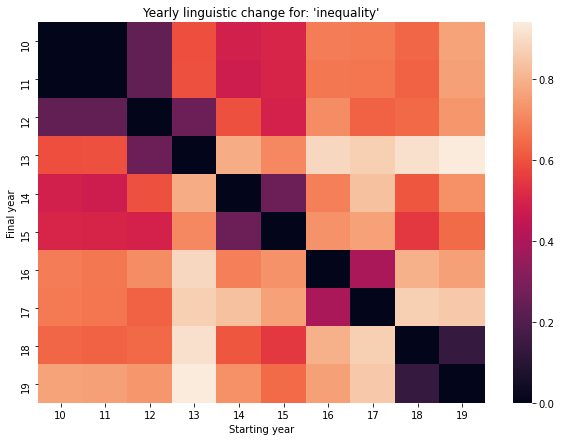

In [522]:
targetWord = 'inequality'

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()

rich
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f94a09ebc10>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f94a09ebc10> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


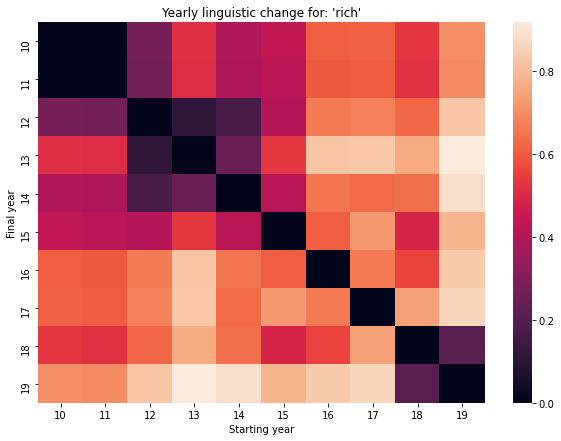

In [527]:
targetWord = 'rich'

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()

labor
DEBUG:matplotlib.colorbar:locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f94a1c9aa90>
DEBUG:matplotlib.colorbar:Using auto colorbar locator <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f94a1c9aa90> on colorbar
DEBUG:matplotlib.colorbar:Setting pcolormesh


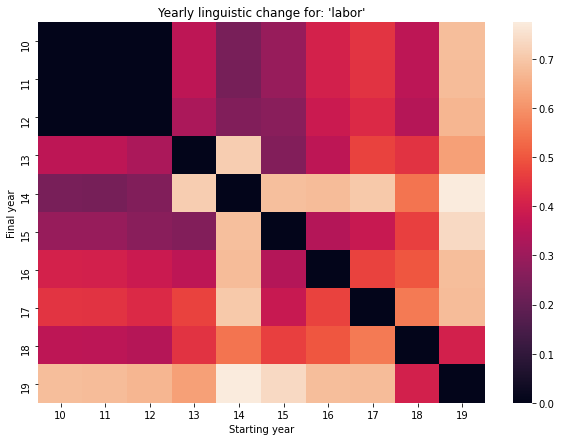

In [524]:
targetWord = 'labor'

pltDF = getDivergenceDF(targetWord, comparedEmbeddings)
fig, ax = plt.subplots(figsize = (10, 7))
seaborn.heatmap(pltDF, ax = ax, annot = False) #set annot True for a lot more information
ax.set_xlabel("Starting year")
ax.set_ylabel("Final year")
ax.set_ylabel("Final year")
ax.set_title("Yearly linguistic change for: '{}'".format(targetWord))
plt.show()